# Comparative Analysis of the Impact of Synthetic Minority Oversampling Technique (SMOTE) and Undersampling Techniques on Imbalanced Health Data: A Case Study of Stroke Prediction


#1.Problem Definition

In healthcare, predictive models can significantly improve patient outcomes by enabling early intervention and personalized treatment plans. However, many healthcare datasets, such as those predicting stroke occurrences, suffer from class imbalance. This study evaluates the effectiveness of various undersampling techniques on an imbalanced healthcare dataset related to stroke prediction.

Many healthcare datasets are imbalanced, leading to biased models that perform poorly in identifying the minority class. This study aims to:



###**Implement Undersampling and Oversampling Techniques**
   

Apply various undersampling and oversampling methods to balance the dataset.



####Undersampling Techniques



#####Prototype Generation
- **Cluster Centroids:** Reduces the dataset by synthesizing centroids from clusters using K-means, rather than selecting individual samples.



#####Prototype Selection






###### Controlled Undersampling Techniques
- **Random Undersampling:** Randomly selects a subset of data from the targeted classes.
- **NearMiss:** Uses three different rules based on nearest neighbors to select samples:
  - **NearMiss-1:** Chooses samples with the smallest average distance to the closest samples of the minority class.
  - **NearMiss-2:** Chooses samples with the smallest average distance to the farthest samples of the minority class.
  - **NearMiss-3:** Keeps samples based on a two-step nearest-neighbor selection process.

##### Cleaning Undersampling Techniques
- **Tomek Links:** Removes pairs of samples from different classes that are each other's closest neighbors.
- **Edited Nearest Neighbors (ENN):** Removes majority samples if any or most neighbors belong to a different class.
- **Repeated Edited Nearest Neighbors (RENN):** Extends ENN by repeating the process multiple times.
- **All KNN:** Increases the neighborhood size in each iteration of ENN to progressively clean the dataset.
- **Condensed Nearest Neighbor (CNN):** Adds samples that are difficult to classify based on a 1-nearest neighbor rule.
- **One-Sided Selection (OSS):** Combines CNN and Tomek Links to remove noisy or difficult-to-classify majority samples.
- **Neighborhood Cleaning Rule (NCR):** Uses a combination of ENN and nearest-neighbor classification to remove noisy samples.



#####Additional Undersampling Techniques


- **Instance Hardness Threshold:** Retains samples that are easier to classify by removing instances classified with low probability, based on a specified classifier.

#### Oversampling Techniques






- **Synthetic Minority Oversampling Technique (SMOTE)**: Generates synthetic samples by interpolating between existing minority class samples.

**Source:** https://imbalanced-learn.org/stable/introduction.html

###**Comparative Analysis**
   



Compare model performance on oversampled Vs. undersampled datasets using metrics such as accuracy, precision, recall, F1-score, and AUC-ROC.

###**Insights and Recommendations**
   

Identify which undersampling techniques yield the most significant improvements and provide recommendations for handling class imbalance in similar datasets.

By addressing class imbalance through these techniques, this study aims to enhance model accuracy and reliability, particularly in identifying minority class instances in healthcare prediction tasks.

#2.Dataset

The dataset used in this project contains information necessary to predict the occurrence of a stroke. Each row in the dataset represents a patient, and the dataset includes the following attributes:

- **id:** Unique identifier
- **gender:** "Male", "Female", or "Other"
- **age:** Age of the patient
- **hypertension:** 0 if the patient doesn't have hypertension, 1 if the patient has hypertension
- **heart_disease:** 0 if the patient doesn't have any heart diseases, 1 if the patient has a heart disease
- **ever_married:** "No" or "Yes"
- **work_type:** "Children", "Govt_job", "Never_worked", "Private", or "Self-employed"
- **Residence_type:** "Rural" or "Urban"
- **avg_glucose_level:** Average glucose level in the blood
- **bmi:** Body mass index
- **smoking_status:** "Formerly smoked", "Never smoked", "Smokes", or "Unknown"
- **stroke:** 1 if the patient had a stroke, 0 if not

#3.Data Inspecting and Preprocessing

In [ ]:
# Install necessary libraries
!pip install -U imbalanced-learn
!pip install -U scikit-learn

In [ ]:
# Import necessary libraries
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score, roc_curve, auc, confusion_matrix, precision_score, recall_score, f1_score
from sklearn.linear_model import LogisticRegression
# Define resampling methods
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import ClusterCentroids
from imblearn.under_sampling import RandomUnderSampler
from imblearn.under_sampling import NearMiss
from imblearn.under_sampling import TomekLinks
from imblearn.under_sampling import EditedNearestNeighbours
from imblearn.under_sampling import RepeatedEditedNearestNeighbours
from imblearn.under_sampling import AllKNN
from imblearn.under_sampling import CondensedNearestNeighbour
from imblearn.under_sampling import OneSidedSelection
from imblearn.under_sampling import NeighbourhoodCleaningRule
from imblearn.under_sampling import InstanceHardnessThreshold

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving healthcare-dataset-stroke-data.csv to healthcare-dataset-stroke-data (3).csv


In [ ]:
# Load healthcare-dataset-stroke-data.csv
import pandas as pd
file_path = 'healthcare-dataset-stroke-data.csv'
data = pd.read_csv(file_path)
display(data.head())

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,51676,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
2,31112,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,60182,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,1665,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1


In [ ]:
# Check the shape of the dataset (#Rows, #Columns)
print("Shape of the dataset:")
print(data.shape)

Shape of the dataset:
(5110, 12)


In [ ]:
# Check Dataset Information
print("Dataset Information:")
print(data.info)

Streaming output truncated to the last 5000 lines.
110           Rural             129.98  22.6  formerly smoked       1  
111           Urban              68.53  24.2           smokes       1  
112           Urban             106.41   NaN  formerly smoked       1  
113           Rural             224.10  56.6     never smoked       1  
114           Urban              82.10  27.1          Unknown       1  
115           Rural             216.94  30.9     never smoked       1  
116           Rural              76.11  27.3           smokes       1  
117           Urban              72.96  31.3           smokes       1  
118           Urban              82.28  24.0  formerly smoked       1  
119           Urban             105.22  31.0     never smoked       1  
120           Rural              59.86  28.0  formerly smoked       1  
121           Urban              62.55  30.3          Unknown       1  
122           Rural             259.63  31.7           smokes       1  
123          

In [ ]:
print("\nSummary Statistics:")
data.describe().T


Summary Statistics:


,count,mean,std,min,25%,50%,75%,max
id,5110.0,36517.829354,21161.721625,67.00,17741.250,36932.000,54682.00,72940.00
age,5110.0,43.226614,22.612647,0.08,25.000,45.000,61.00,82.00
hypertension,5110.0,0.097456,0.296607,0.00,0.000,0.000,0.00,1.00
heart_disease,5110.0,0.054012,0.226063,0.00,0.000,0.000,0.00,1.00
avg_glucose_level,5110.0,106.147677,45.283560,55.12,77.245,91.885,114.09,271.74
bmi,4909.0,28.893237,7.854067,10.30,23.500,28.100,33.10,97.60
stroke,5110.0,0.048728,0.215320,0.00,0.000,0.000,0.00,1.00


In [ ]:
# Check for missing values
print("\nMissing Values:")
print(data.isnull().sum())


Missing Values:
id                     0
gender                 0
age                    0
hypertension           0
heart_disease          0
ever_married           0
work_type              0
Residence_type         0
avg_glucose_level      0
bmi                  201
smoking_status         0
stroke                 0
dtype: int64


In [ ]:
# Fill missing BMI values with the mean
data['bmi'].fillna(data['bmi'].mean(), inplace=True)

In [ ]:
# Check any duplicated values
print("\nDuplicated Values:")
print(data.duplicated().sum())


Duplicated Values:
0


In [ ]:
# Analyze the distribution of the target variable
print("\nTarget Variable Distribution (stroke):")
print(data['stroke'].value_counts())


Target Variable Distribution (stroke):
stroke
0    4861
1     249
Name: count, dtype: int64


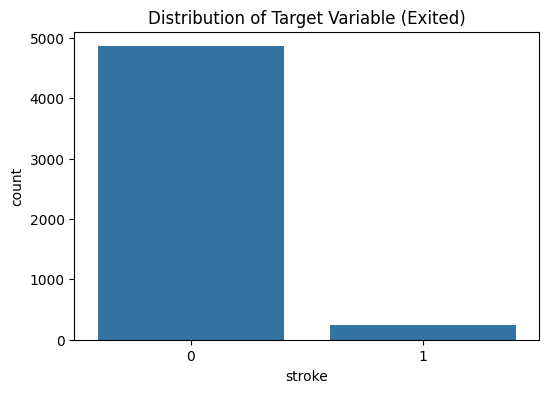

In [ ]:
# Visualize the target variable distribution
plt.figure(figsize=(6, 4))
sns.countplot(x='stroke', data=data)
plt.title('Distribution of Target Variable (Exited)')
plt.show()

In [ ]:
# Check datatypes
data.dtypes

,0
id,int64
gender,object
age,float64
hypertension,int64
heart_disease,int64
ever_married,object
work_type,object
Residence_type,object
avg_glucose_level,float64
bmi,float64


In [ ]:
data['age'].astype(int)

,age
0,67
1,61
2,80
3,49
4,79
5,81
6,74
7,69
8,59
9,78


In [ ]:
print(data['ever_married'].value_counts())

ever_married
Yes    3353
No     1757
Name: count, dtype: int64


In [ ]:
print(data['work_type'].value_counts())

work_type
Private          2925
Self-employed     819
children          687
Govt_job          657
Never_worked       22
Name: count, dtype: int64


In [ ]:
print(data['gender'].value_counts())

gender
Female    2994
Male      2115
Other        1
Name: count, dtype: int64


In [ ]:
print(data['Residence_type'].value_counts())

Residence_type
Urban    2596
Rural    2514
Name: count, dtype: int64


In [ ]:
print(data['smoking_status'].value_counts())

smoking_status
never smoked       1892
Unknown            1544
formerly smoked     885
smokes              789
Name: count, dtype: int64


In [ ]:
# Encode categorical variables
categorical_features = ['gender', 'ever_married', 'work_type', 'Residence_type', 'smoking_status']
for feature in categorical_features:
    label_encoder = LabelEncoder()  # Create a new LabelEncoder for each feature
    data[feature] = label_encoder.fit_transform(data[feature])


In [ ]:
data.head()

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,1,67.0,0,1,1,2,1,228.69,36.600000,1,1
1,51676,0,61.0,0,0,1,3,0,202.21,28.893237,2,1
2,31112,1,80.0,0,1,1,2,0,105.92,32.500000,2,1
3,60182,0,49.0,0,0,1,2,1,171.23,34.400000,3,1
4,1665,0,79.0,1,0,1,3,0,174.12,24.000000,2,1


In [ ]:
data.isnull().sum()

,0
id,0
gender,0
age,0
hypertension,0
heart_disease,0
ever_married,0
work_type,0
Residence_type,0
avg_glucose_level,0
bmi,0


#4.Exploratory Data Analysis

##Correlation matrix

In [ ]:
# Correlation matrix
print("\nCorrelation matrix:")
data.corr()


Correlation matrix:


,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
id,1.000000,0.002511,0.003538,0.003550,-0.001296,0.013690,-0.015757,-0.001403,0.001092,0.002999,0.014074,0.006388
gender,0.002511,1.000000,-0.028202,0.020994,0.085447,-0.031005,0.056422,-0.006738,0.055180,-0.026109,-0.062581,0.008929
age,0.003538,-0.028202,1.000000,0.276398,0.263796,0.679125,-0.361642,0.014180,0.238171,0.325942,0.265199,0.245257
hypertension,0.003550,0.020994,0.276398,1.000000,0.108306,0.164243,-0.051761,-0.007913,0.174474,0.160189,0.111038,0.127904
heart_disease,-0.001296,0.085447,0.263796,0.108306,1.000000,0.114644,-0.028023,0.003092,0.161857,0.038899,0.048460,0.134914
ever_married,0.013690,-0.031005,0.679125,0.164243,0.114644,1.000000,-0.352722,0.006261,0.155068,0.335705,0.259647,0.108340
work_type,-0.015757,0.056422,-0.361642,-0.051761,-0.028023,-0.352722,1.000000,-0.007316,-0.050513,-0.299448,-0.305927,-0.032316
Residence_type,-0.001403,-0.006738,0.014180,-0.007913,0.003092,0.006261,-0.007316,1.000000,-0.004946,-0.000120,0.008237,0.015458
avg_glucose_level,0.001092,0.055180,0.238171,0.174474,0.161857,0.155068,-0.050513,-0.004946,1.000000,0.168751,0.063437,0.131945
bmi,0.002999,-0.026109,0.325942,0.160189,0.038899,0.335705,-0.299448,-0.000120,0.168751,1.000000,0.219148,0.038947


In [ ]:
# Drop id column
data = data.drop(columns='id')

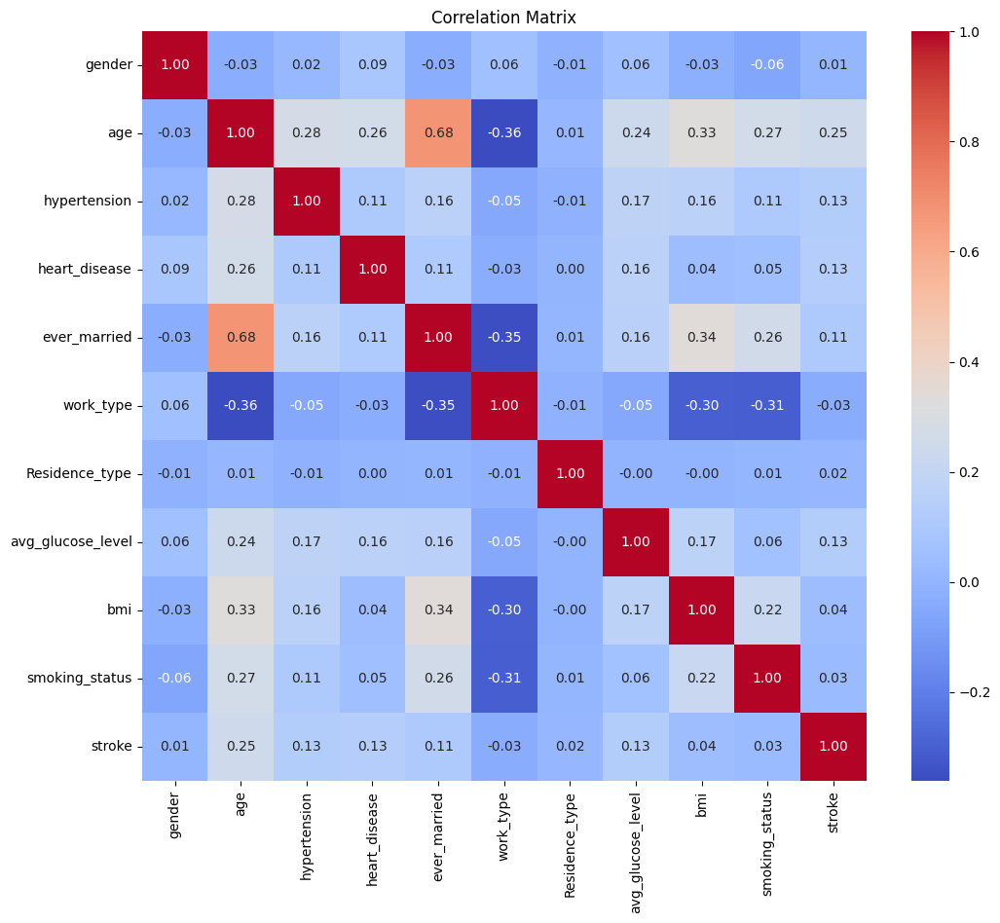

In [ ]:
# Visualize the correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(data.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

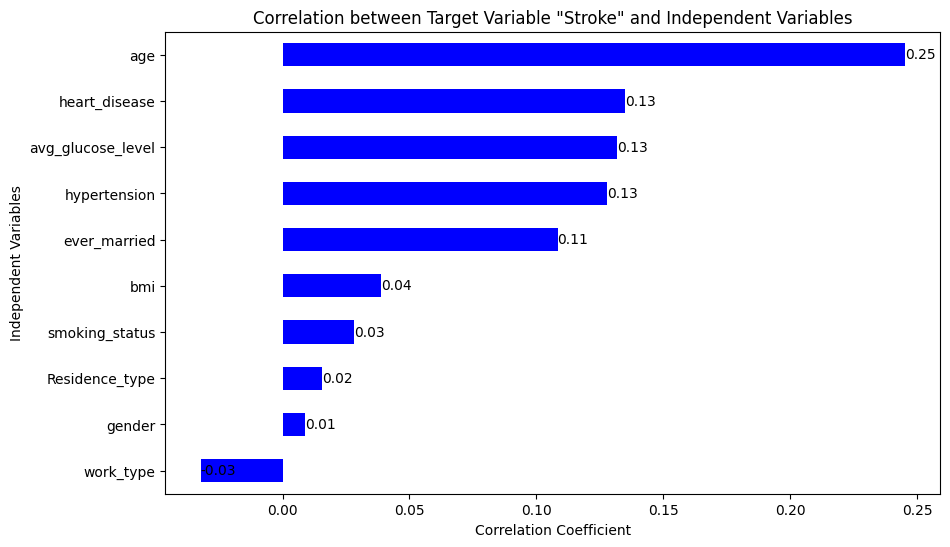

In [ ]:
# Calculate correlation of the 'stroke' column with other variables
correlation = data.corr()['stroke'].drop('stroke')  # Drop 'stroke' itself

# Plotting the horizontal bar chart
plt.figure(figsize=(10, 6))
ax = correlation.sort_values().plot(kind='barh', color='blue')
plt.title('Correlation between Target Variable "Stroke" and Independent Variables')
plt.xlabel('Correlation Coefficient')
plt.ylabel('Independent Variables')

# Adding correlation values at the end of each bar
for index, value in enumerate(correlation.sort_values()):
    ax.text(value, index, f'{value:.2f}', va='center', ha='left', color='black')

plt.show()

##Distribution of numerical features

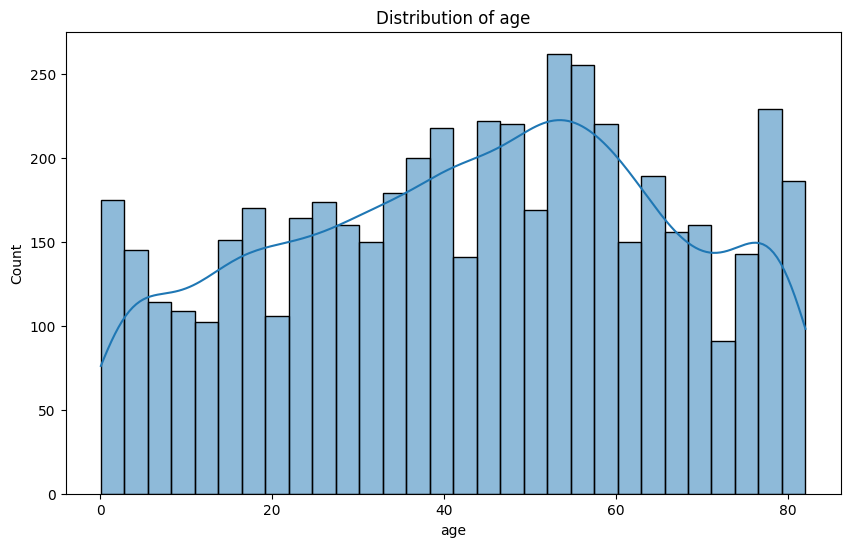

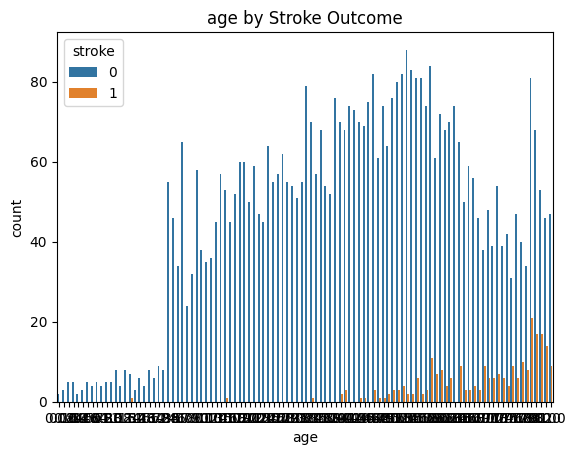

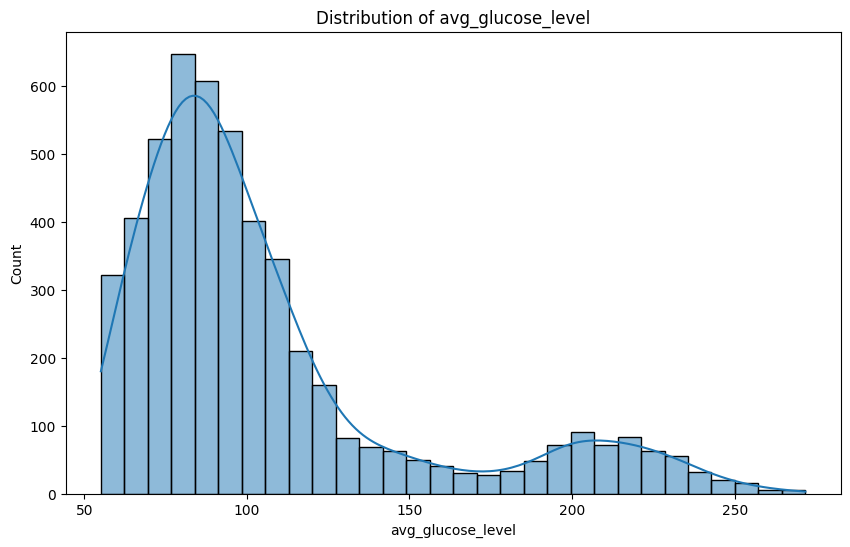

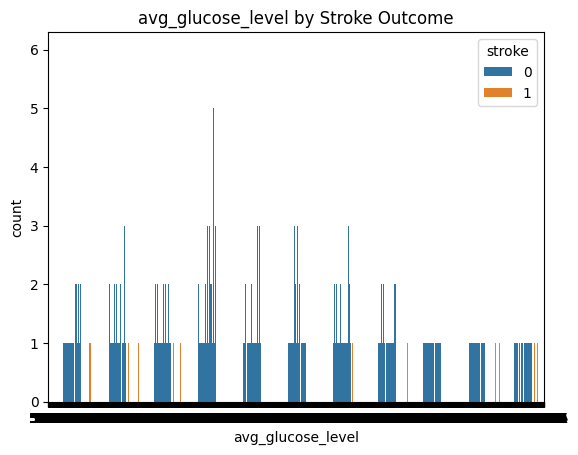

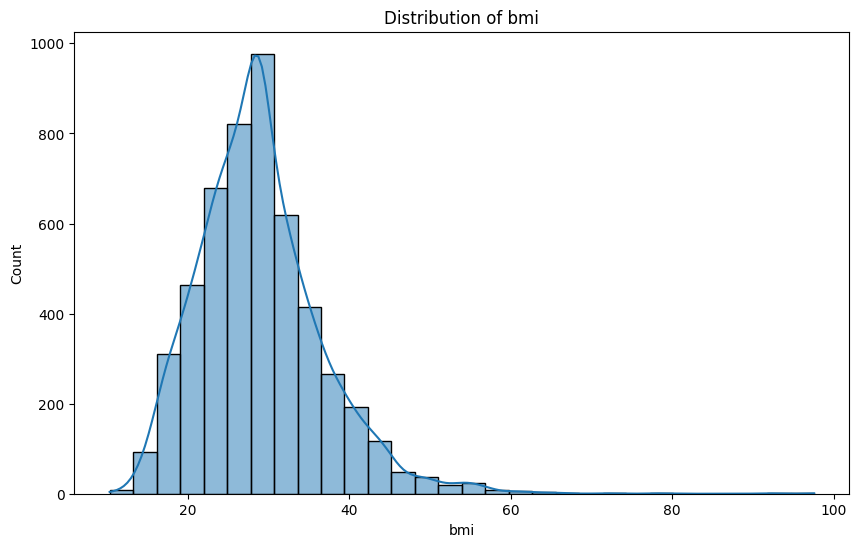

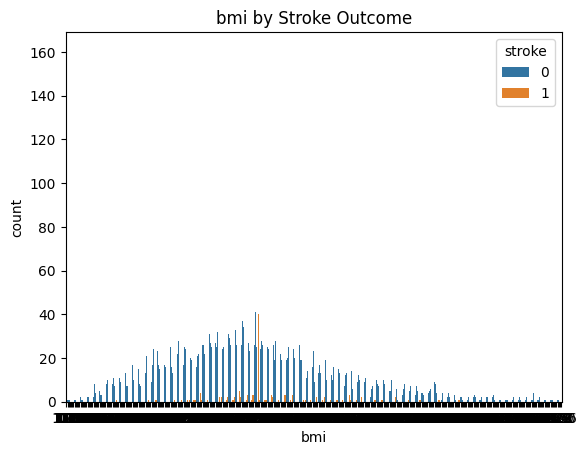

In [ ]:
# Distribution of numerical features
numerical_features = ['age', 'avg_glucose_level', 'bmi']
for feature in numerical_features:
    plt.figure(figsize=(10, 6))
    sns.histplot(data[feature], kde=True, bins=30)
    plt.title(f'Distribution of {feature}')
    plt.show()
    sns.countplot(x=feature, hue='stroke', data=data)
    plt.title(f'{feature} by Stroke Outcome')
    plt.show()

##Box plots of numerical features by stroke outcome

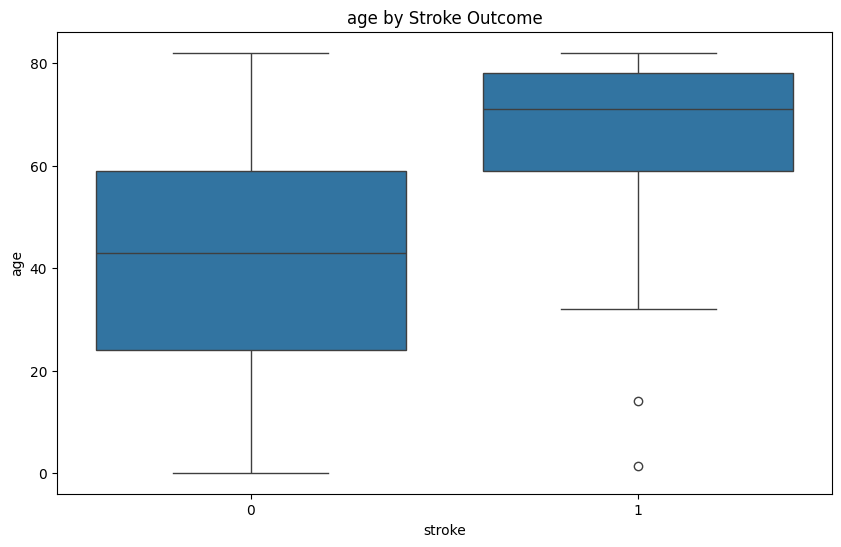

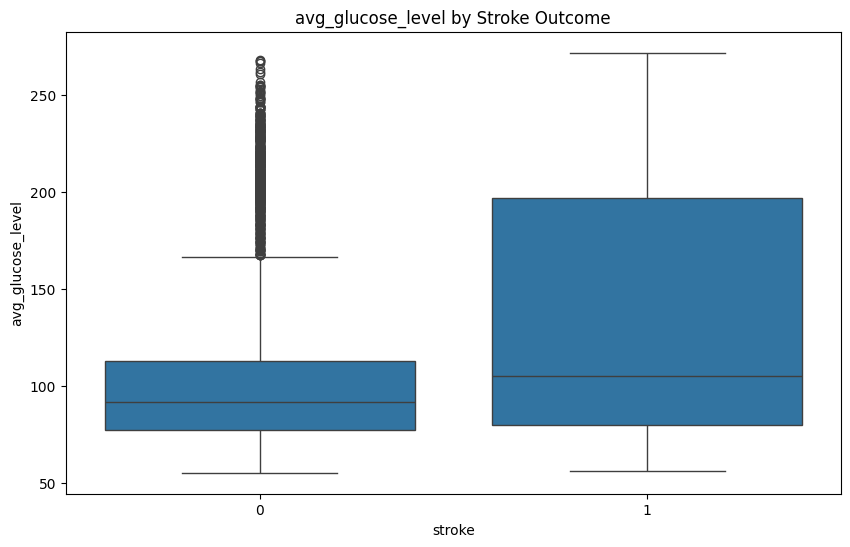

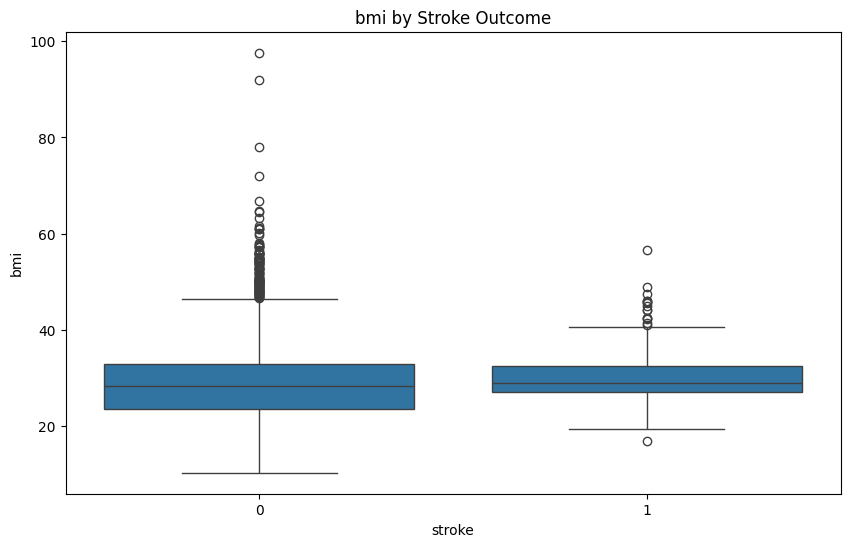

In [ ]:
# Box plots of numerical features by stroke outcome
for feature in numerical_features:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='stroke', y=feature, data=data)
    plt.title(f'{feature} by Stroke Outcome')
    plt.show()

##Count plots of categorical features

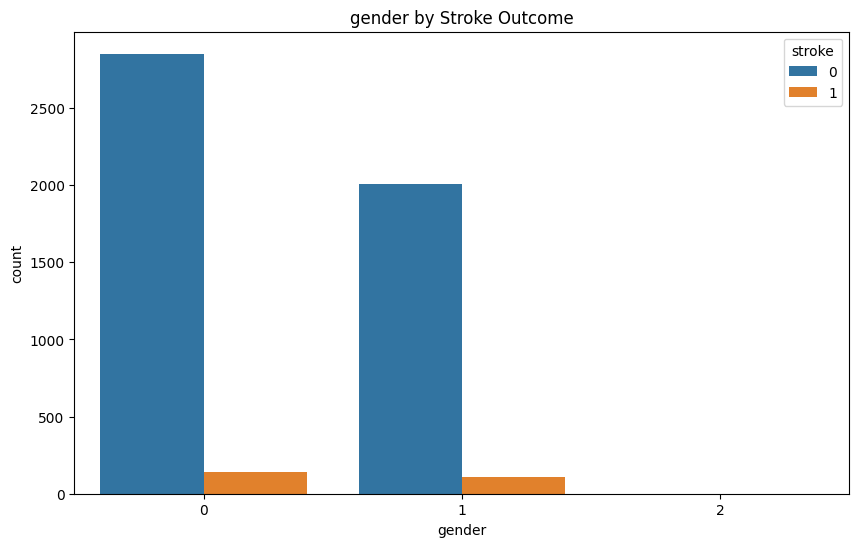

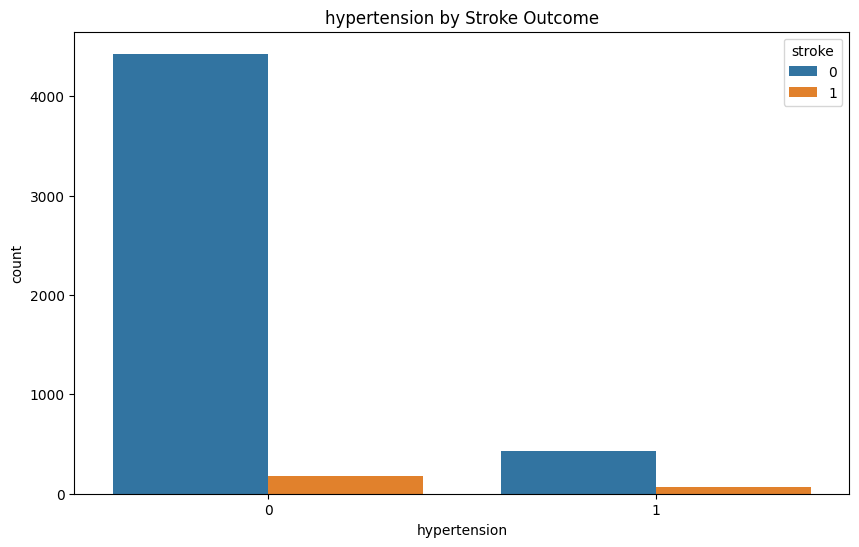

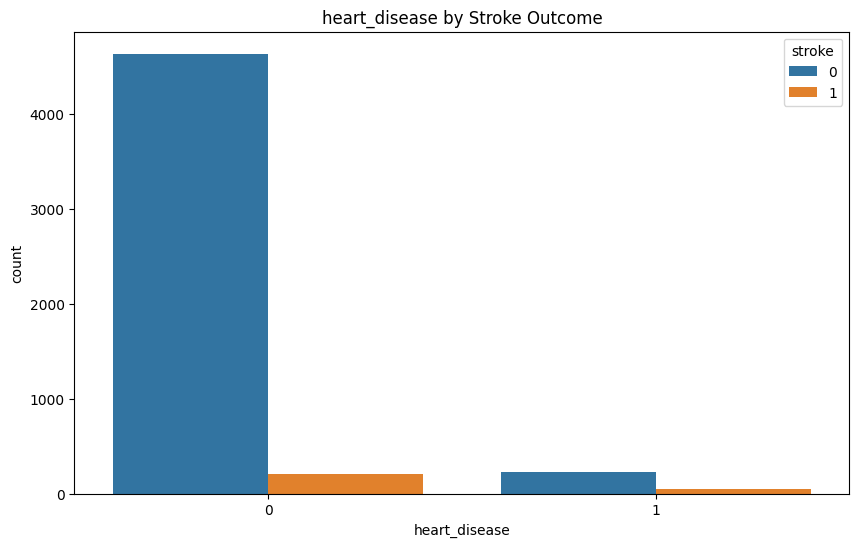

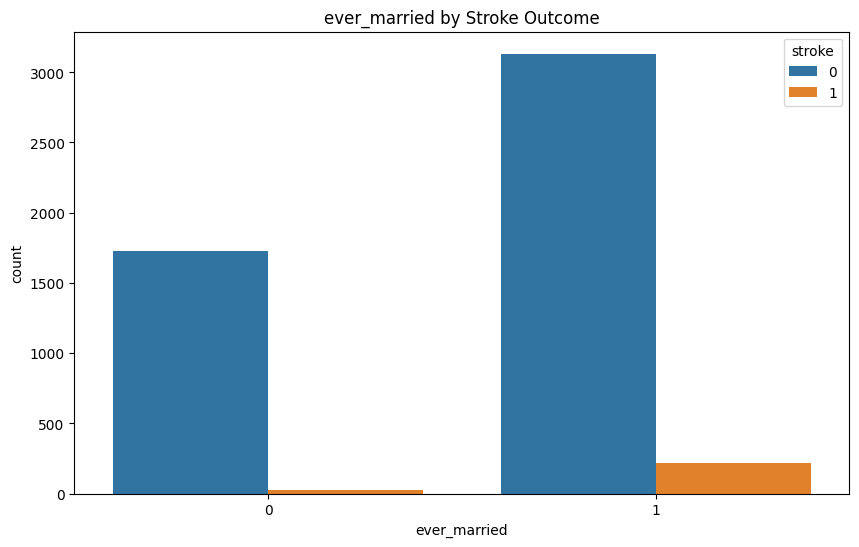

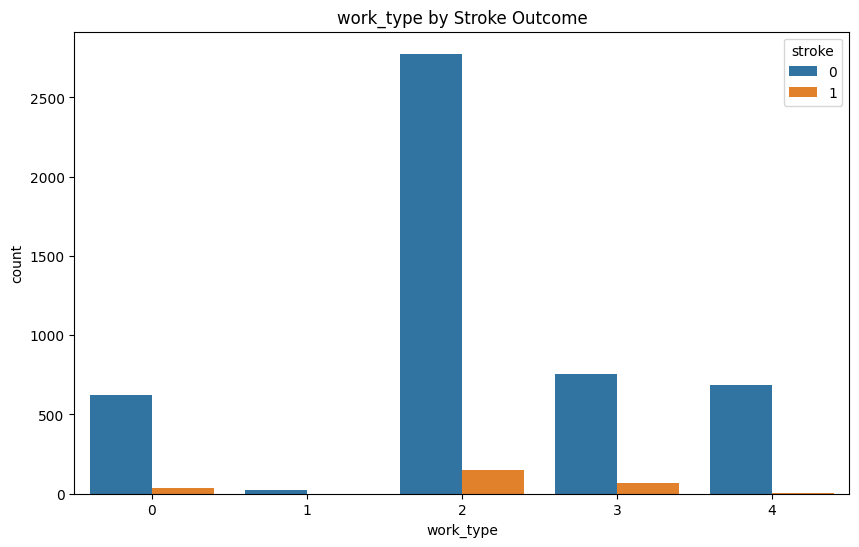

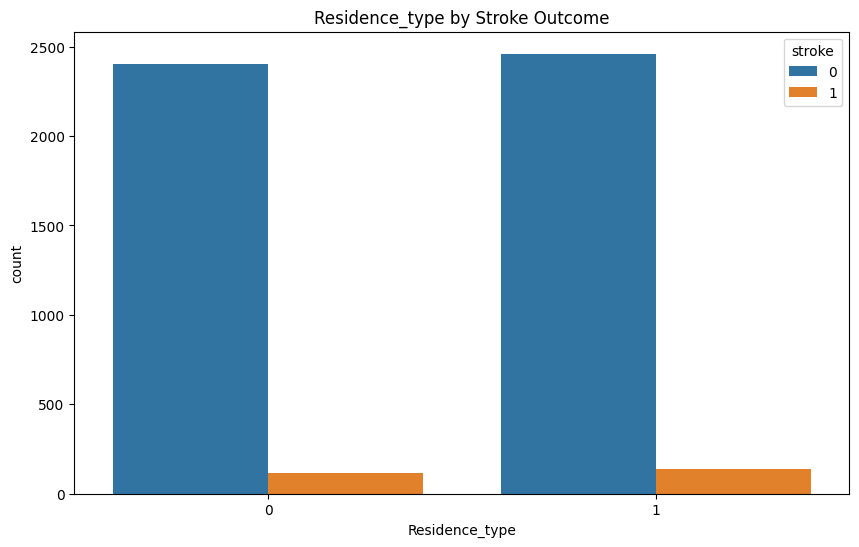

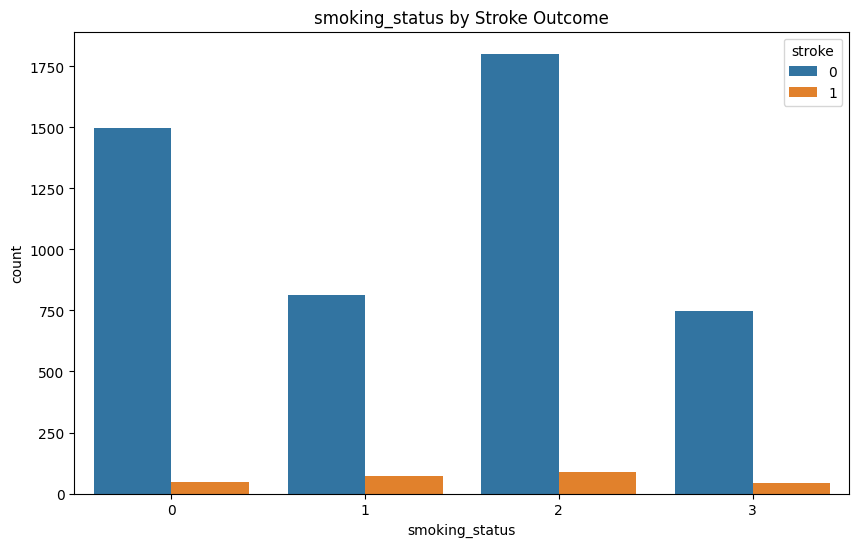

In [ ]:
# Count plots of categorical features
categorical_features = ['gender', 'hypertension', 'heart_disease', 'ever_married', 'work_type', 'Residence_type', 'smoking_status']
for feature in categorical_features:
    plt.figure(figsize=(10, 6))
    sns.countplot(x=feature, hue='stroke', data=data)
    plt.title(f'{feature} by Stroke Outcome')
    plt.show()


#6.Training the model

In [ ]:
# Define columns to exclude
columns_to_exclude = ['work_type', 'Residence_type', 'gender']

# Drop specified columns from feature set
X = data.drop(['stroke'] + columns_to_exclude, axis=1)
y = data['stroke']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#7.Evaluating the model



###Imbalanced Data

In [ ]:
!pip install catboost

In [ ]:
from openpyxl import Workbook
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC

In [ ]:
# Store evaluation results and predictions
evaluation_results = []
predictions_dict = {'y_test': y_test.tolist()}  # Store actual values

# Function to evaluate the model
def evaluate_model(y_test, y_pred, y_pred_proba, model_name, method_name):
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred_proba)

    # Store evaluation metrics
    evaluation_results.append({
        'Model': model_name,
        'Method': method_name,
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1,
        'ROC-AUC': roc_auc
    })

    # Print metrics
    print(f"\n{model_name} with {method_name} Evaluation Metrics:")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1 Score: {f1:.4f}")
    print(f"ROC-AUC Score: {roc_auc:.4f}")

    # Classification report
    print("\nClassification Report:")
    print(classification_report(y_test, y_pred))

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    print("\nConfusion Matrix:")
    print(cm)

    # Plot Confusion Matrix
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No-stroke', 'Stroke'], yticklabels=['No-stroke', 'Stroke'])
    plt.title(f'Confusion Matrix: {model_name} - {method_name}')
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.show()

    # ROC Curve
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc:.4f})')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Diagonal line
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve: {model_name} - {method_name}')
    plt.legend(loc='lower right')
    plt.grid(alpha=0.3)
    plt.show()


# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
# Define models
models = {
    "Random Forest": RandomForestClassifier(class_weight='balanced', random_state=42),
    "XGBoost": XGBClassifier(
        scale_pos_weight=len(y_train[y_train == 0]) / len(y_train[y_train == 1]),
        random_state=42, use_label_encoder=False, eval_metric='logloss'
    ),
    "LightGBM": LGBMClassifier(class_weight='balanced', random_state=42),
    "CatBoost": CatBoostClassifier(verbose=0, random_state=42),
    "Logistic Regression": LogisticRegression(class_weight='balanced', random_state=42),
    "SVM": SVC(class_weight='balanced', probability=True, random_state=42),
    "Decision Tree": DecisionTreeClassifier(class_weight='balanced', random_state=42),
    "Gradient Boosting": GradientBoostingClassifier(random_state=42),
    "K-Nearest Neighbors (KNN)": KNeighborsClassifier(),
    "Gaussian Naive Bayes": GaussianNB(),
    "Linear Discriminant Analysis (LDA)": LinearDiscriminantAnalysis(),
    "Quadratic Discriminant Analysis (QDA)": QuadraticDiscriminantAnalysis(),
    "AdaBoost": AdaBoostClassifier(random_state=42),
}

###Data Balancing Techniques

In [ ]:
# Define resampling methods
methods = {
    'None': None,  # No resampling for imbalanced data
    'SMOTE': SMOTE( random_state= 42),
    'ClusterCentroids': ClusterCentroids(random_state=42),
    'Random Undersampling': RandomUnderSampler( random_state= 42),
    'NearMiss-1': NearMiss(version=1),
    'NearMiss-2': NearMiss(version=2),
    'NearMiss-3': NearMiss(version=3),
    'Tomek Links': TomekLinks(),
    'Edited Nearest Neighbors (ENN)': EditedNearestNeighbours(),
    'Repeated Edited Nearest Neighbors (RENN)': RepeatedEditedNearestNeighbours(),
    'All KNN': AllKNN(),
    'Condensed Nearest Neighbor (CNN)': CondensedNearestNeighbour(),
    'One-Sided Selection (OSS)': OneSidedSelection(),
    'Neighborhood Cleaning Rule (NCR)': NeighbourhoodCleaningRule(),
    'Instance Hardness Threshold': InstanceHardnessThreshold()
}


==================== Random Forest with None ====================

Random Forest with None Evaluation Metrics:
Accuracy: 0.9403
Precision: 1.0000
Recall: 0.0161
F1 Score: 0.0317
ROC-AUC Score: 0.7954

Classification Report:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       1.00      0.02      0.03        62

    accuracy                           0.94      1022
   macro avg       0.97      0.51      0.50      1022
weighted avg       0.94      0.94      0.91      1022


Confusion Matrix:
[[960   0]
 [ 61   1]]


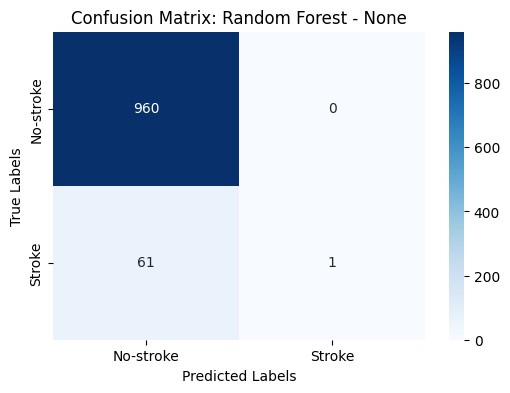

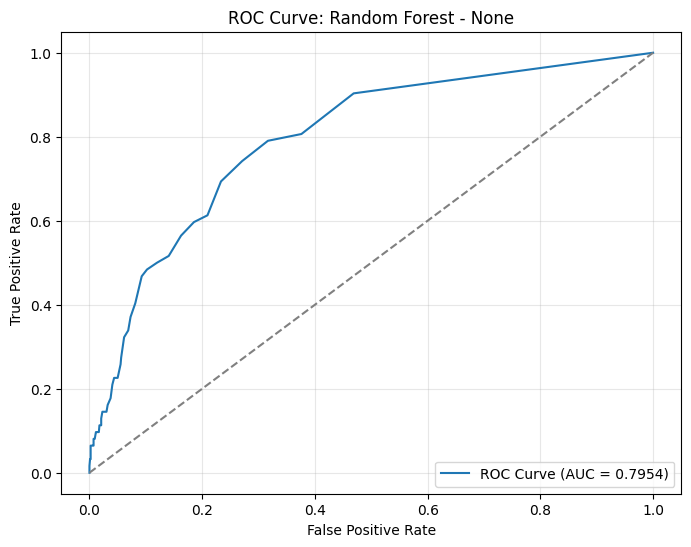


==================== Random Forest with SMOTE ====================

Random Forest with SMOTE Evaluation Metrics:
Accuracy: 0.8953
Precision: 0.2414
Recall: 0.3387
F1 Score: 0.2819
ROC-AUC Score: 0.8046

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.93      0.94       960
           1       0.24      0.34      0.28        62

    accuracy                           0.90      1022
   macro avg       0.60      0.63      0.61      1022
weighted avg       0.91      0.90      0.90      1022


Confusion Matrix:
[[894  66]
 [ 41  21]]


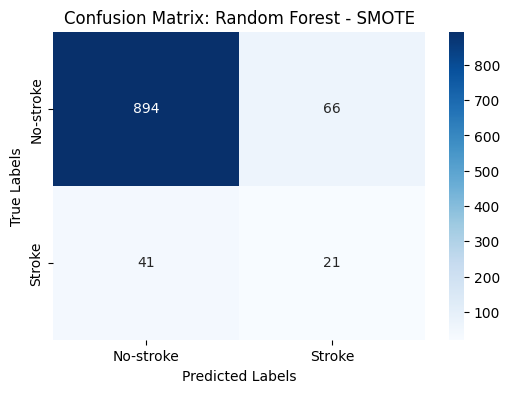

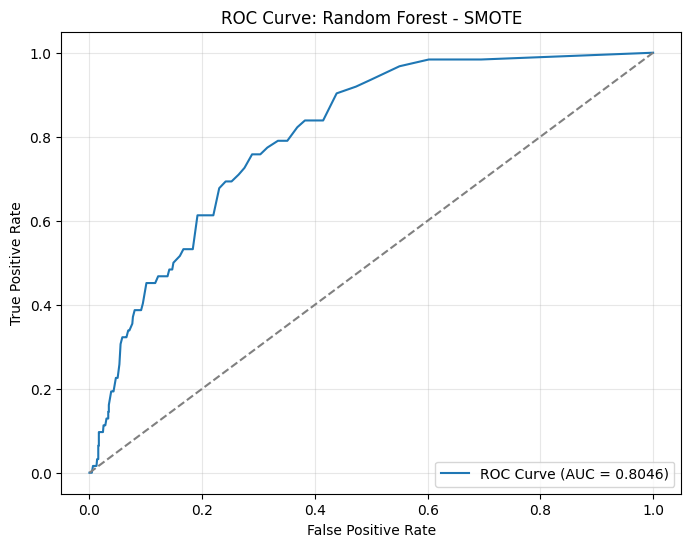


==================== Random Forest with ClusterCentroids ====================

Random Forest with ClusterCentroids Evaluation Metrics:
Accuracy: 0.4217
Precision: 0.0886
Recall: 0.9194
F1 Score: 0.1617
ROC-AUC Score: 0.7462

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.39      0.56       960
           1       0.09      0.92      0.16        62

    accuracy                           0.42      1022
   macro avg       0.54      0.65      0.36      1022
weighted avg       0.93      0.42      0.53      1022


Confusion Matrix:
[[374 586]
 [  5  57]]


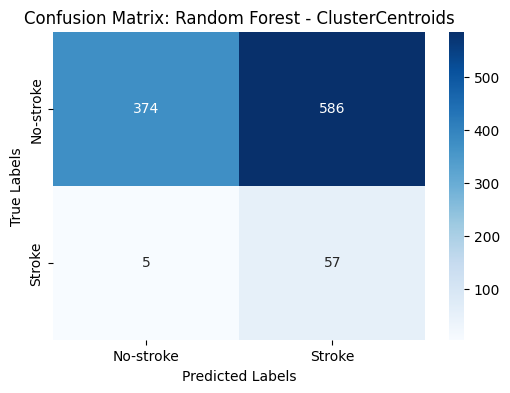

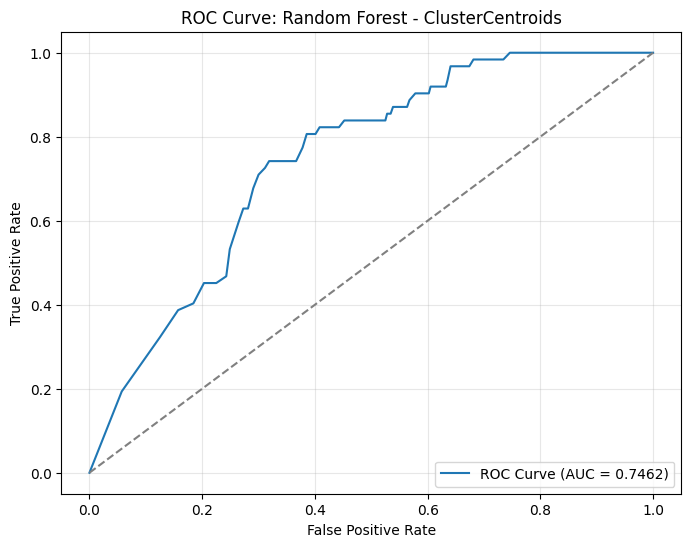


==================== Random Forest with Random Undersampling ====================

Random Forest with Random Undersampling Evaluation Metrics:
Accuracy: 0.7319
Precision: 0.1581
Recall: 0.7903
F1 Score: 0.2634
ROC-AUC Score: 0.8308

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.73      0.84       960
           1       0.16      0.79      0.26        62

    accuracy                           0.73      1022
   macro avg       0.57      0.76      0.55      1022
weighted avg       0.93      0.73      0.80      1022


Confusion Matrix:
[[699 261]
 [ 13  49]]


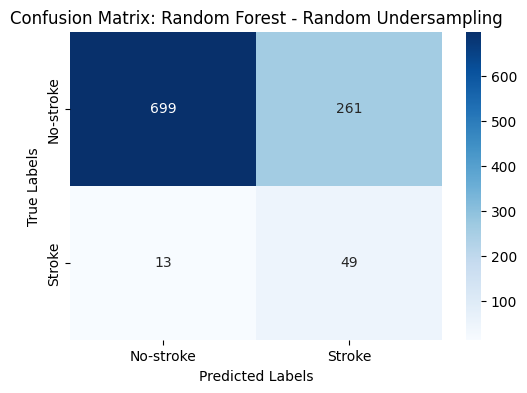

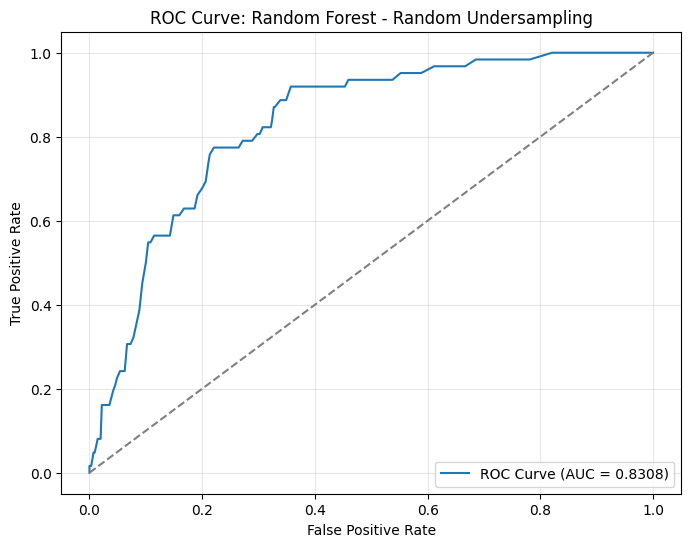


==================== Random Forest with NearMiss-1 ====================

Random Forest with NearMiss-1 Evaluation Metrics:
Accuracy: 0.1859
Precision: 0.0471
Recall: 0.6452
F1 Score: 0.0877
ROC-AUC Score: 0.3193

Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.16      0.27       960
           1       0.05      0.65      0.09        62

    accuracy                           0.19      1022
   macro avg       0.46      0.40      0.18      1022
weighted avg       0.82      0.19      0.25      1022


Confusion Matrix:
[[150 810]
 [ 22  40]]


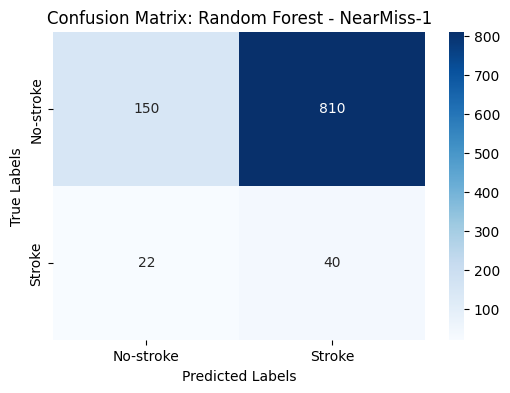

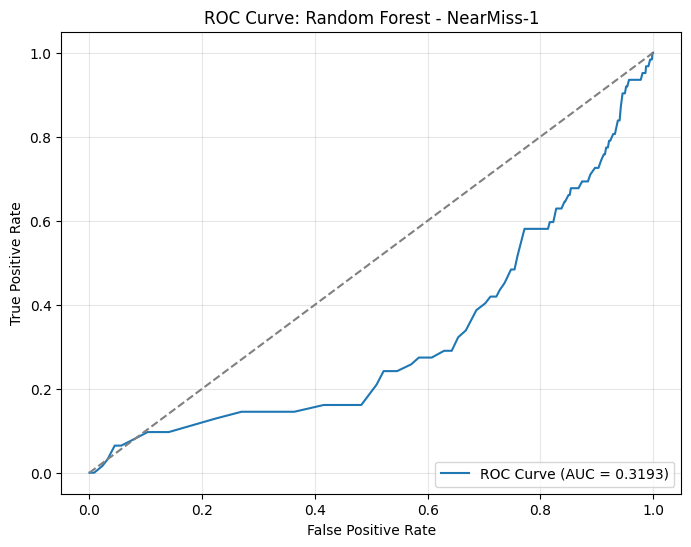


==================== Random Forest with NearMiss-2 ====================

Random Forest with NearMiss-2 Evaluation Metrics:
Accuracy: 0.1438
Precision: 0.0652
Recall: 0.9839
F1 Score: 0.1224
ROC-AUC Score: 0.7266

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.09      0.16       960
           1       0.07      0.98      0.12        62

    accuracy                           0.14      1022
   macro avg       0.53      0.54      0.14      1022
weighted avg       0.93      0.14      0.16      1022


Confusion Matrix:
[[ 86 874]
 [  1  61]]


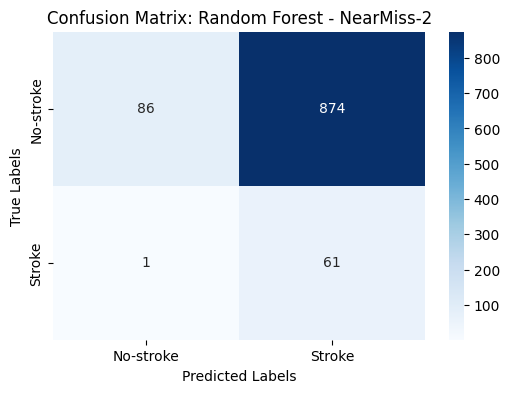

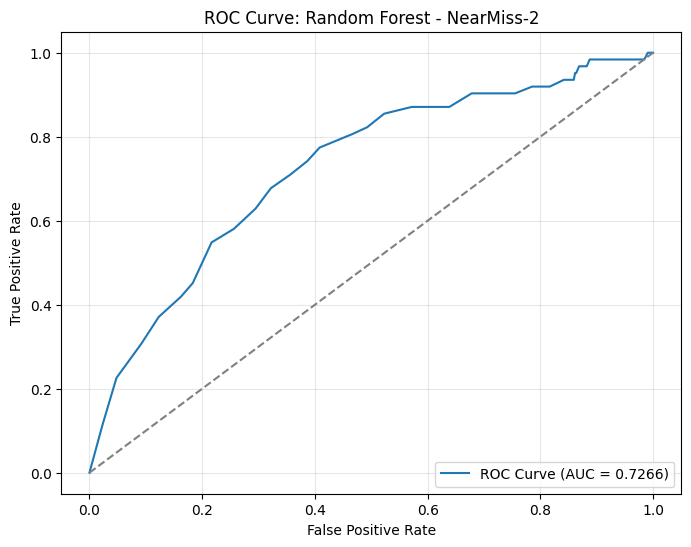


==================== Random Forest with NearMiss-3 ====================

Random Forest with NearMiss-3 Evaluation Metrics:
Accuracy: 0.6859
Precision: 0.1111
Recall: 0.5968
F1 Score: 0.1873
ROC-AUC Score: 0.6953

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.69      0.81       960
           1       0.11      0.60      0.19        62

    accuracy                           0.69      1022
   macro avg       0.54      0.64      0.50      1022
weighted avg       0.91      0.69      0.77      1022


Confusion Matrix:
[[664 296]
 [ 25  37]]


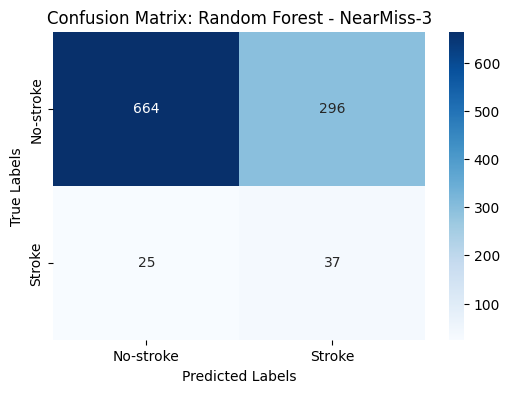

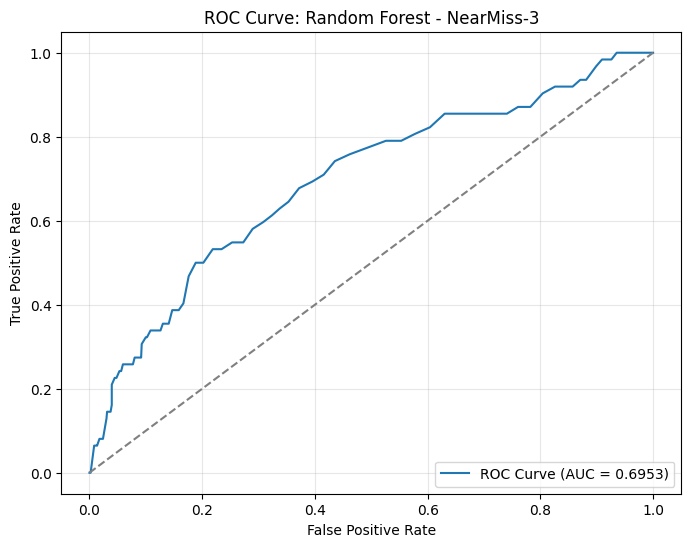


==================== Random Forest with Tomek Links ====================

Random Forest with Tomek Links Evaluation Metrics:
Accuracy: 0.9432
Precision: 1.0000
Recall: 0.0645
F1 Score: 0.1212
ROC-AUC Score: 0.8067

Classification Report:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       1.00      0.06      0.12        62

    accuracy                           0.94      1022
   macro avg       0.97      0.53      0.55      1022
weighted avg       0.95      0.94      0.92      1022


Confusion Matrix:
[[960   0]
 [ 58   4]]


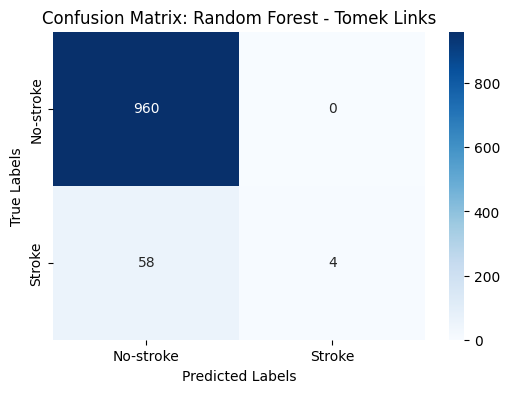

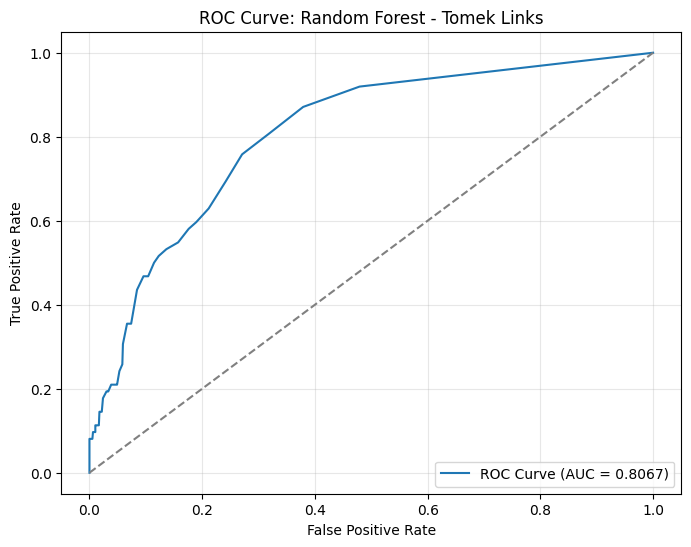


==================== Random Forest with Edited Nearest Neighbors (ENN) ====================

Random Forest with Edited Nearest Neighbors (ENN) Evaluation Metrics:
Accuracy: 0.9384
Precision: 0.4667
Recall: 0.1129
F1 Score: 0.1818
ROC-AUC Score: 0.8293

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.99      0.97       960
           1       0.47      0.11      0.18        62

    accuracy                           0.94      1022
   macro avg       0.71      0.55      0.57      1022
weighted avg       0.92      0.94      0.92      1022


Confusion Matrix:
[[952   8]
 [ 55   7]]


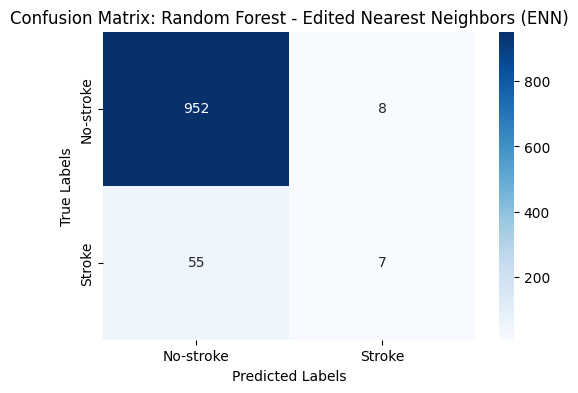

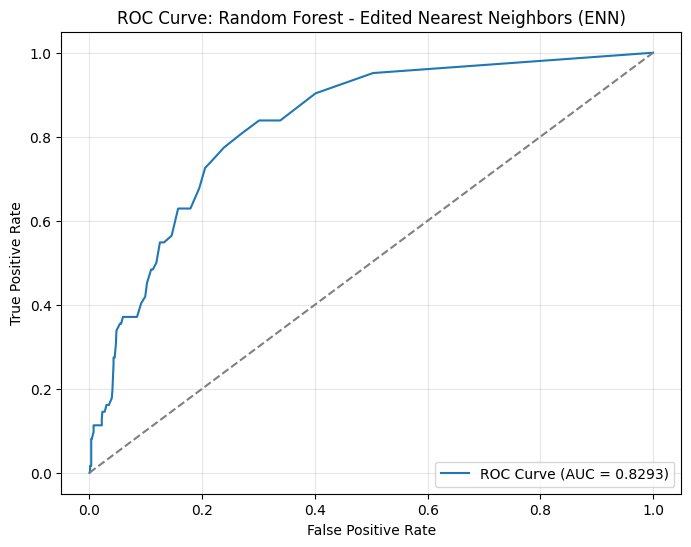


==================== Random Forest with Repeated Edited Nearest Neighbors (RENN) ====================

Random Forest with Repeated Edited Nearest Neighbors (RENN) Evaluation Metrics:
Accuracy: 0.9159
Precision: 0.2273
Recall: 0.1613
F1 Score: 0.1887
ROC-AUC Score: 0.8251

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.96      0.96       960
           1       0.23      0.16      0.19        62

    accuracy                           0.92      1022
   macro avg       0.59      0.56      0.57      1022
weighted avg       0.90      0.92      0.91      1022


Confusion Matrix:
[[926  34]
 [ 52  10]]


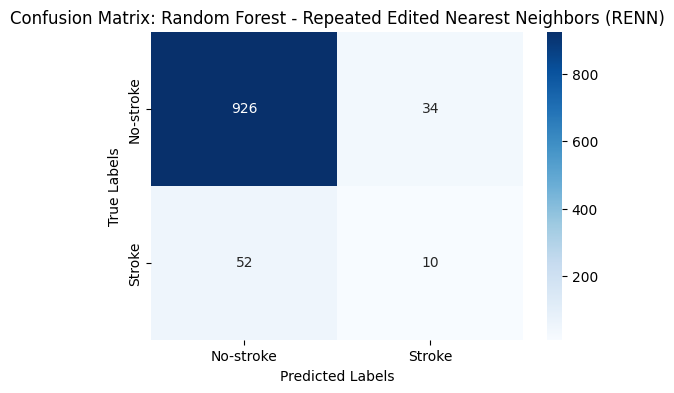

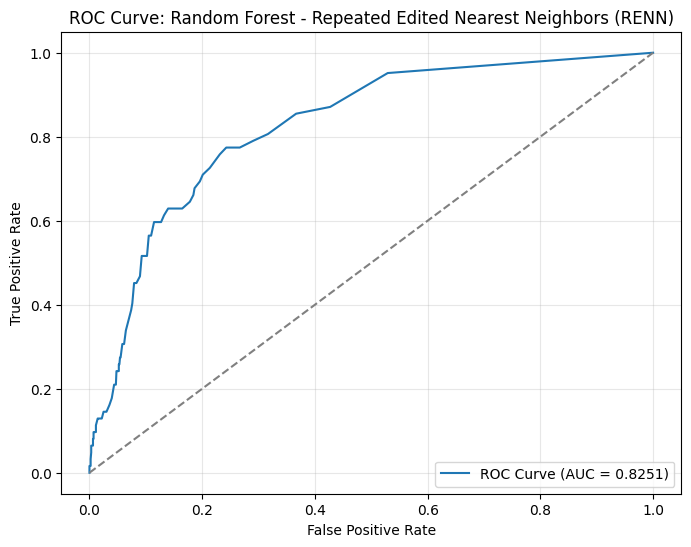


==================== Random Forest with All KNN ====================

Random Forest with All KNN Evaluation Metrics:
Accuracy: 0.9305
Precision: 0.2857
Recall: 0.0968
F1 Score: 0.1446
ROC-AUC Score: 0.8143

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.98      0.96       960
           1       0.29      0.10      0.14        62

    accuracy                           0.93      1022
   macro avg       0.61      0.54      0.55      1022
weighted avg       0.90      0.93      0.91      1022


Confusion Matrix:
[[945  15]
 [ 56   6]]


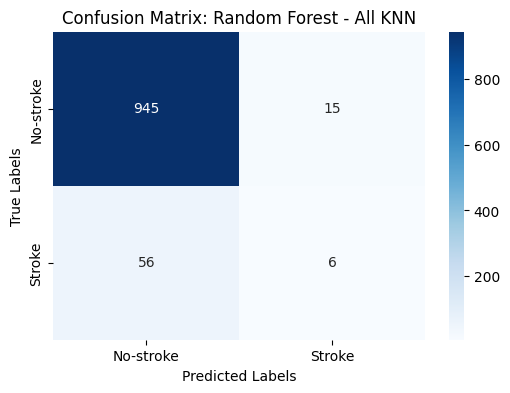

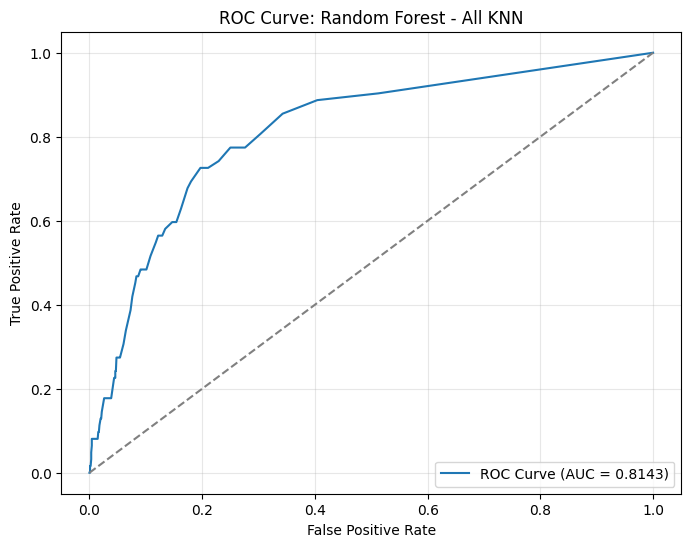


==================== Random Forest with Condensed Nearest Neighbor (CNN) ====================

Random Forest with Condensed Nearest Neighbor (CNN) Evaluation Metrics:
Accuracy: 0.9295
Precision: 0.2727
Recall: 0.0968
F1 Score: 0.1429
ROC-AUC Score: 0.7294

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.98      0.96       960
           1       0.27      0.10      0.14        62

    accuracy                           0.93      1022
   macro avg       0.61      0.54      0.55      1022
weighted avg       0.90      0.93      0.91      1022


Confusion Matrix:
[[944  16]
 [ 56   6]]


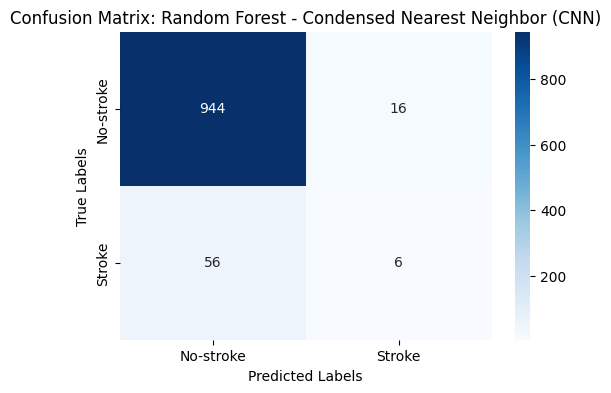

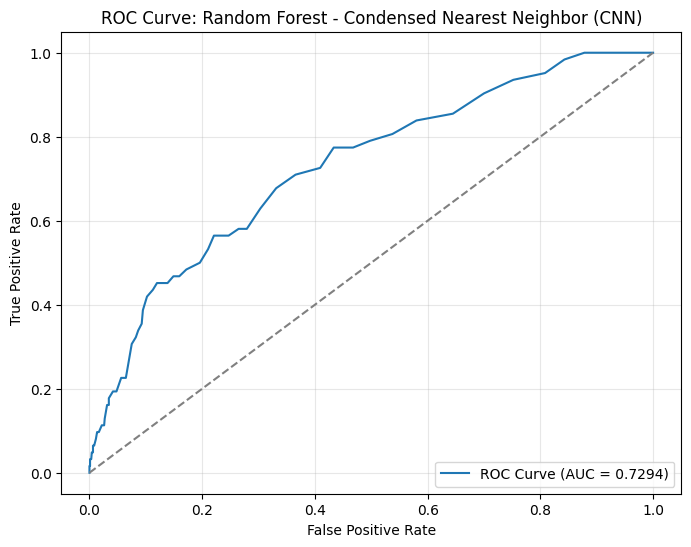


==================== Random Forest with One-Sided Selection (OSS) ====================

Random Forest with One-Sided Selection (OSS) Evaluation Metrics:
Accuracy: 0.9423
Precision: 0.8000
Recall: 0.0645
F1 Score: 0.1194
ROC-AUC Score: 0.8144

Classification Report:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.80      0.06      0.12        62

    accuracy                           0.94      1022
   macro avg       0.87      0.53      0.54      1022
weighted avg       0.93      0.94      0.92      1022


Confusion Matrix:
[[959   1]
 [ 58   4]]


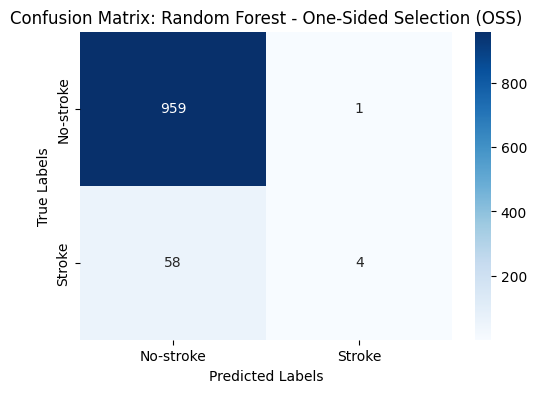

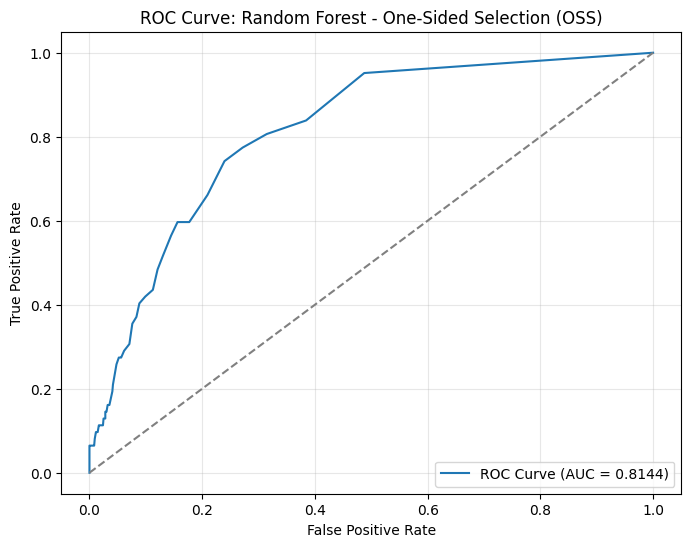


==================== Random Forest with Neighborhood Cleaning Rule (NCR) ====================

Random Forest with Neighborhood Cleaning Rule (NCR) Evaluation Metrics:
Accuracy: 0.9384
Precision: 0.4615
Recall: 0.0968
F1 Score: 0.1600
ROC-AUC Score: 0.8211

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.99      0.97       960
           1       0.46      0.10      0.16        62

    accuracy                           0.94      1022
   macro avg       0.70      0.54      0.56      1022
weighted avg       0.92      0.94      0.92      1022


Confusion Matrix:
[[953   7]
 [ 56   6]]


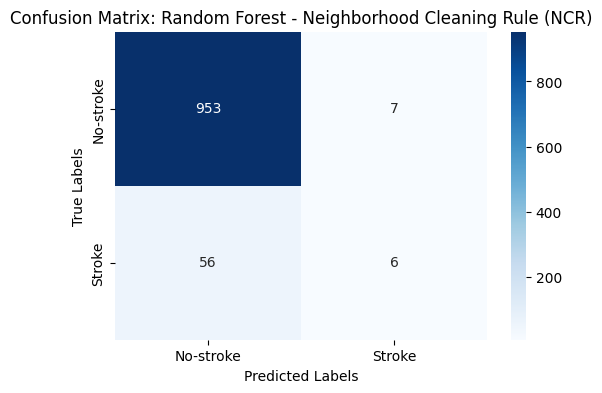

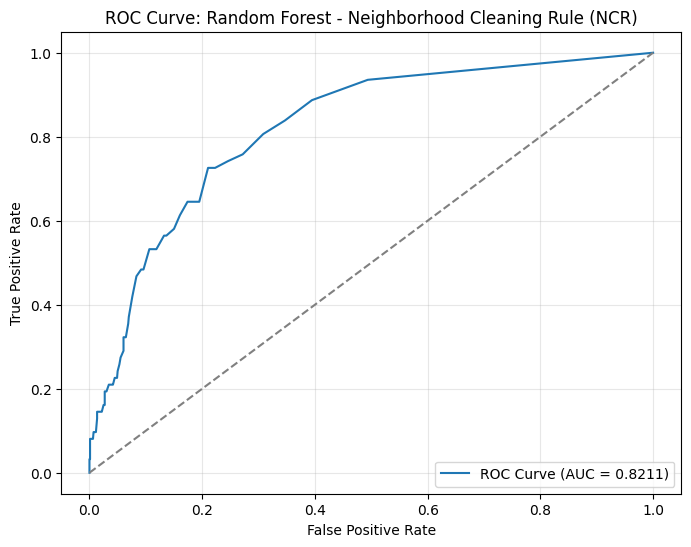


==================== Random Forest with Instance Hardness Threshold ====================

Random Forest with Instance Hardness Threshold Evaluation Metrics:
Accuracy: 0.8033
Precision: 0.1911
Recall: 0.6935
F1 Score: 0.2997
ROC-AUC Score: 0.8412

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.81      0.89       960
           1       0.19      0.69      0.30        62

    accuracy                           0.80      1022
   macro avg       0.58      0.75      0.59      1022
weighted avg       0.93      0.80      0.85      1022


Confusion Matrix:
[[778 182]
 [ 19  43]]


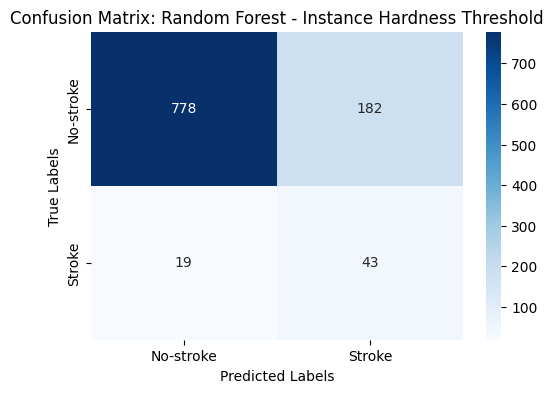

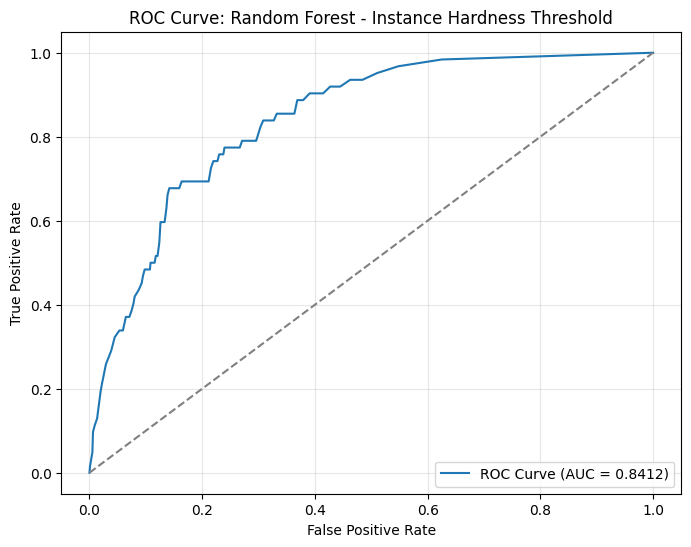


==================== XGBoost with None ====================

XGBoost with None Evaluation Metrics:
Accuracy: 0.9178
Precision: 0.2800
Recall: 0.2258
F1 Score: 0.2500
ROC-AUC Score: 0.7676

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.96      0.96       960
           1       0.28      0.23      0.25        62

    accuracy                           0.92      1022
   macro avg       0.62      0.59      0.60      1022
weighted avg       0.91      0.92      0.91      1022


Confusion Matrix:
[[924  36]
 [ 48  14]]


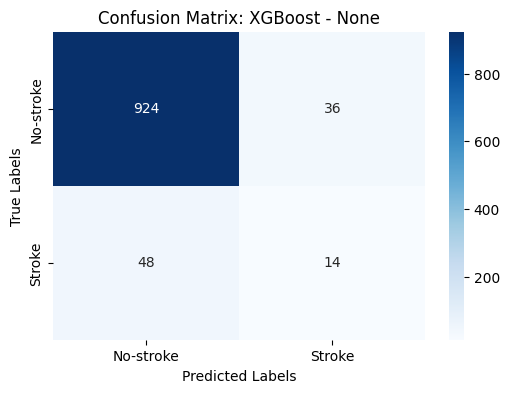

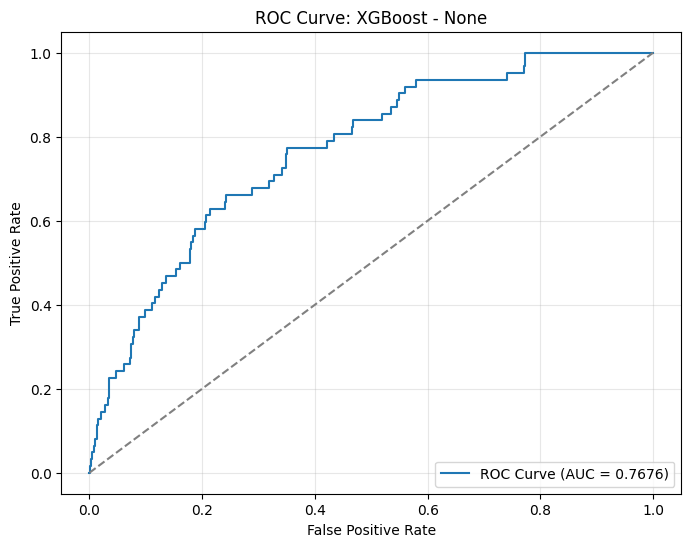


==================== XGBoost with SMOTE ====================

XGBoost with SMOTE Evaluation Metrics:
Accuracy: 0.8239
Precision: 0.1570
Recall: 0.4355
F1 Score: 0.2308
ROC-AUC Score: 0.7532

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.85      0.90       960
           1       0.16      0.44      0.23        62

    accuracy                           0.82      1022
   macro avg       0.56      0.64      0.57      1022
weighted avg       0.91      0.82      0.86      1022


Confusion Matrix:
[[815 145]
 [ 35  27]]


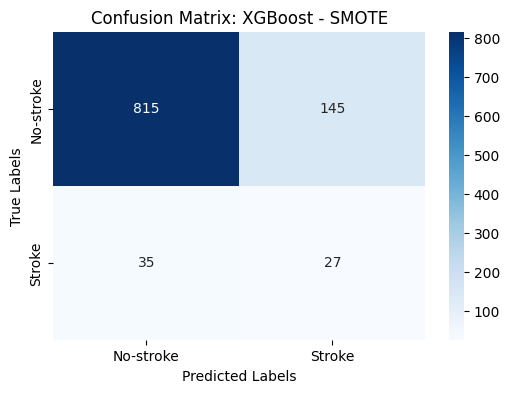

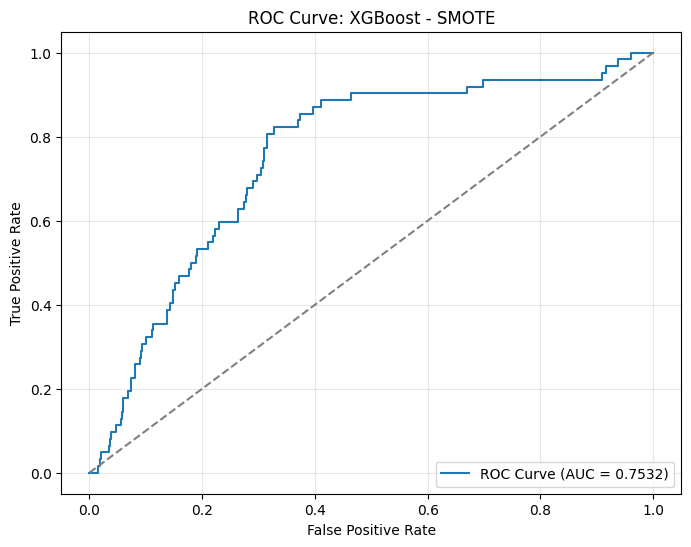


==================== XGBoost with ClusterCentroids ====================

XGBoost with ClusterCentroids Evaluation Metrics:
Accuracy: 0.3894
Precision: 0.0831
Recall: 0.9032
F1 Score: 0.1522
ROC-AUC Score: 0.7048

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.36      0.52       960
           1       0.08      0.90      0.15        62

    accuracy                           0.39      1022
   macro avg       0.53      0.63      0.34      1022
weighted avg       0.93      0.39      0.50      1022


Confusion Matrix:
[[342 618]
 [  6  56]]


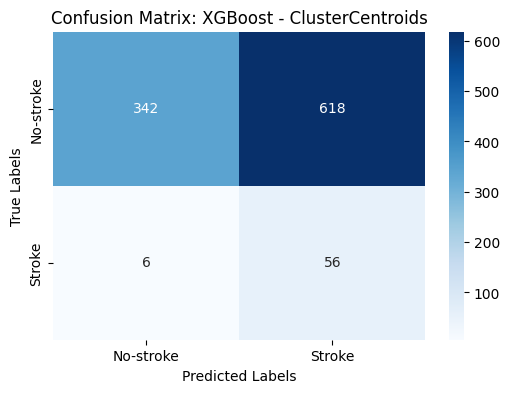

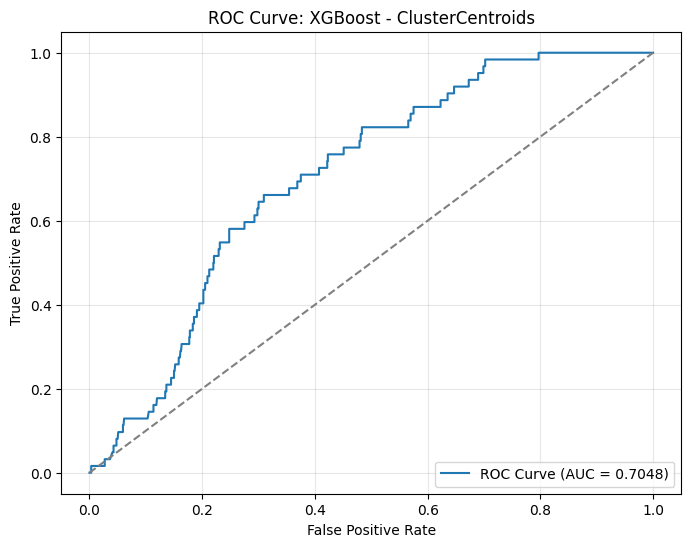


==================== XGBoost with Random Undersampling ====================

XGBoost with Random Undersampling Evaluation Metrics:
Accuracy: 0.6468
Precision: 0.1309
Recall: 0.8548
F1 Score: 0.2270
ROC-AUC Score: 0.8069

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.63      0.77       960
           1       0.13      0.85      0.23        62

    accuracy                           0.65      1022
   macro avg       0.56      0.74      0.50      1022
weighted avg       0.93      0.65      0.74      1022


Confusion Matrix:
[[608 352]
 [  9  53]]


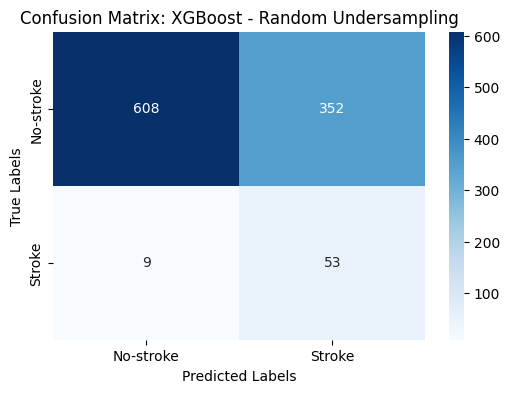

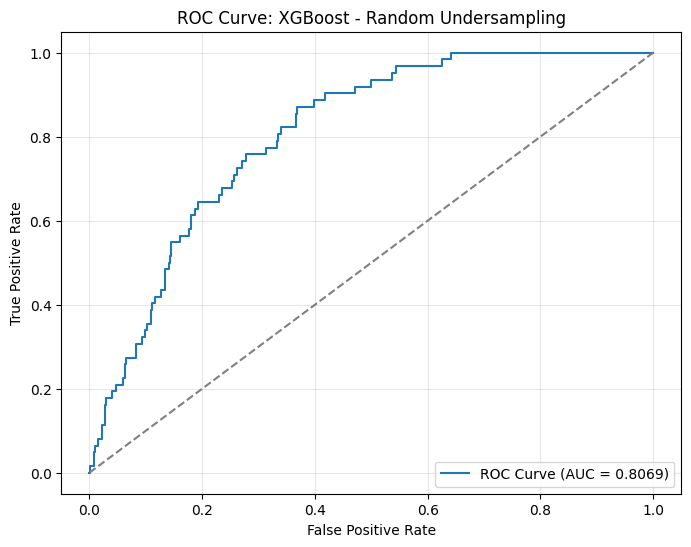


==================== XGBoost with NearMiss-1 ====================

XGBoost with NearMiss-1 Evaluation Metrics:
Accuracy: 0.1438
Precision: 0.0528
Recall: 0.7742
F1 Score: 0.0989
ROC-AUC Score: 0.3609

Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.10      0.18       960
           1       0.05      0.77      0.10        62

    accuracy                           0.14      1022
   macro avg       0.46      0.44      0.14      1022
weighted avg       0.83      0.14      0.18      1022


Confusion Matrix:
[[ 99 861]
 [ 14  48]]


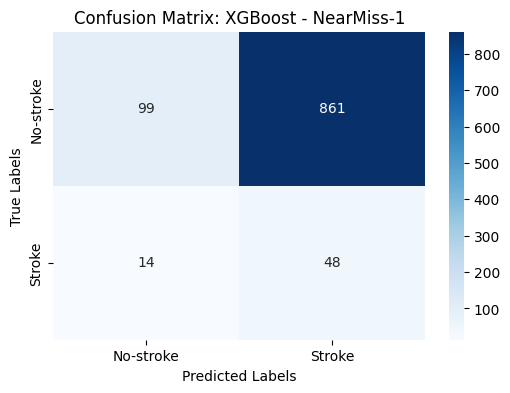

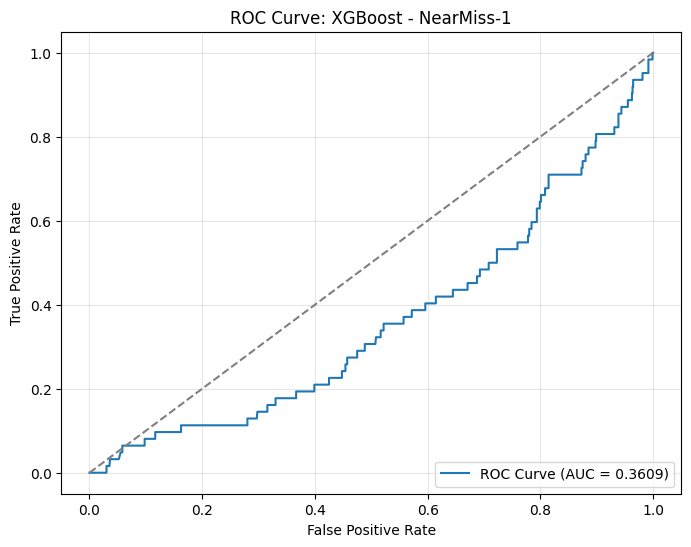


==================== XGBoost with NearMiss-2 ====================

XGBoost with NearMiss-2 Evaluation Metrics:
Accuracy: 0.1125
Precision: 0.0631
Recall: 0.9839
F1 Score: 0.1186
ROC-AUC Score: 0.7571

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.06      0.11       960
           1       0.06      0.98      0.12        62

    accuracy                           0.11      1022
   macro avg       0.52      0.52      0.11      1022
weighted avg       0.93      0.11      0.11      1022


Confusion Matrix:
[[ 54 906]
 [  1  61]]


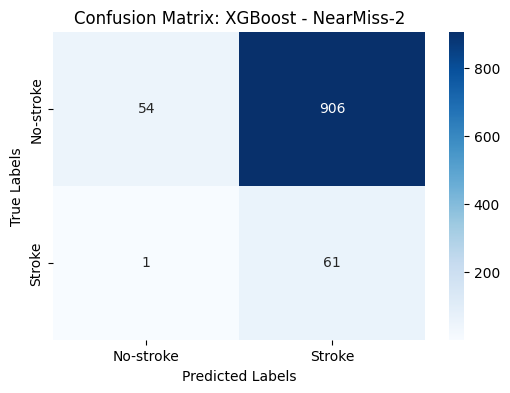

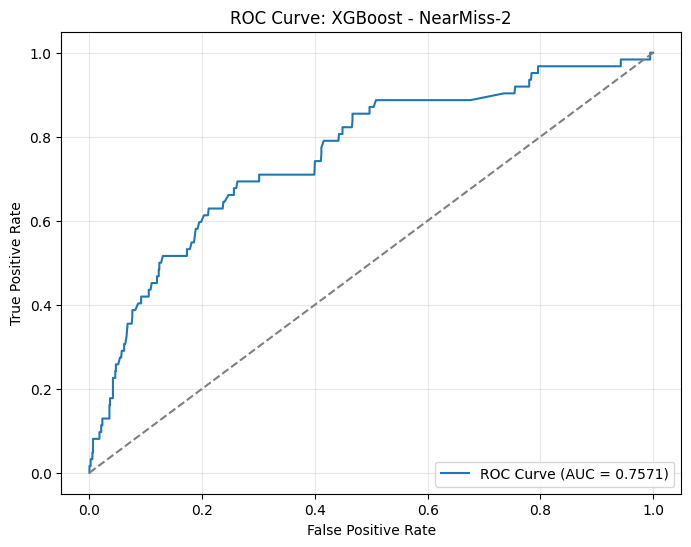


==================== XGBoost with NearMiss-3 ====================

XGBoost with NearMiss-3 Evaluation Metrics:
Accuracy: 0.4002
Precision: 0.0689
Recall: 0.7097
F1 Score: 0.1255
ROC-AUC Score: 0.6183

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.38      0.54       960
           1       0.07      0.71      0.13        62

    accuracy                           0.40      1022
   macro avg       0.51      0.54      0.33      1022
weighted avg       0.90      0.40      0.52      1022


Confusion Matrix:
[[365 595]
 [ 18  44]]


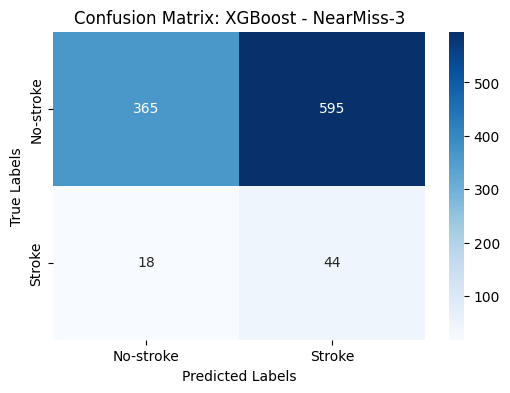

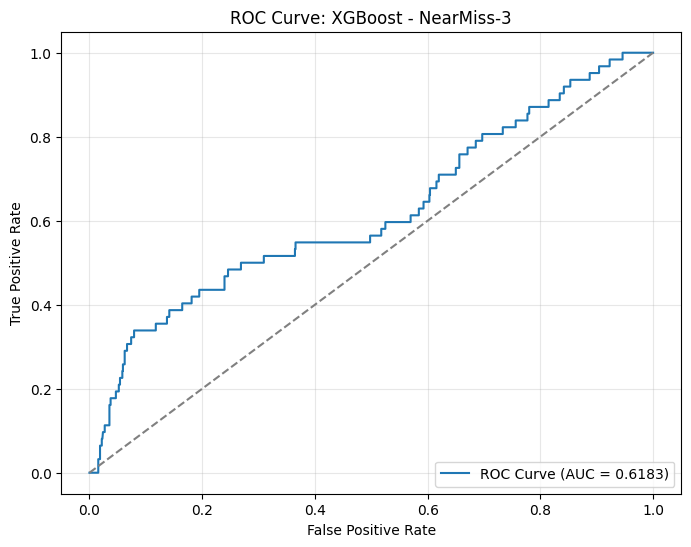


==================== XGBoost with Tomek Links ====================

XGBoost with Tomek Links Evaluation Metrics:
Accuracy: 0.9168
Precision: 0.2745
Recall: 0.2258
F1 Score: 0.2478
ROC-AUC Score: 0.7801

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.96      0.96       960
           1       0.27      0.23      0.25        62

    accuracy                           0.92      1022
   macro avg       0.61      0.59      0.60      1022
weighted avg       0.91      0.92      0.91      1022


Confusion Matrix:
[[923  37]
 [ 48  14]]


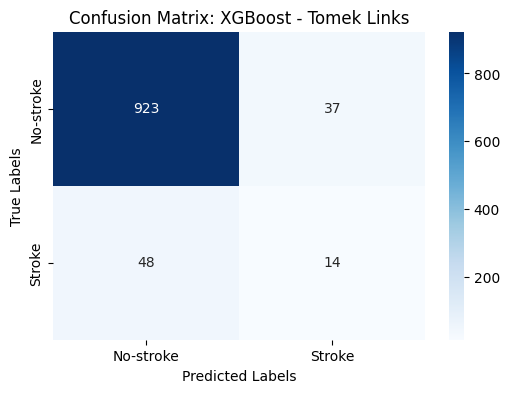

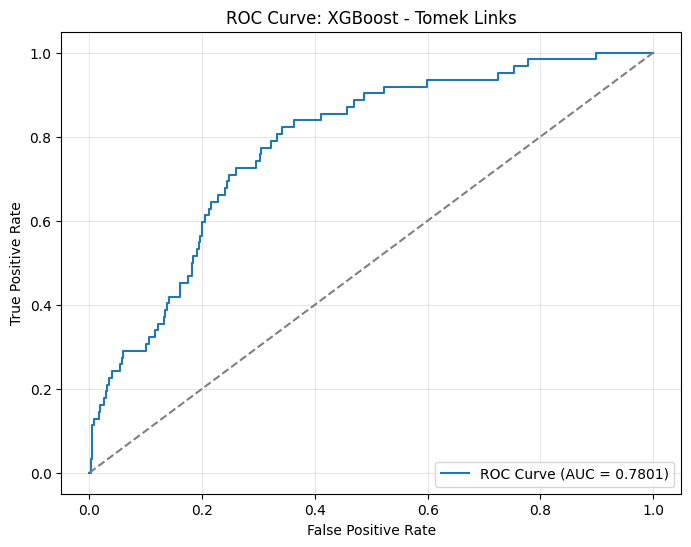


==================== XGBoost with Edited Nearest Neighbors (ENN) ====================

XGBoost with Edited Nearest Neighbors (ENN) Evaluation Metrics:
Accuracy: 0.9080
Precision: 0.2778
Recall: 0.3226
F1 Score: 0.2985
ROC-AUC Score: 0.8076

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.95      0.95       960
           1       0.28      0.32      0.30        62

    accuracy                           0.91      1022
   macro avg       0.62      0.63      0.62      1022
weighted avg       0.91      0.91      0.91      1022


Confusion Matrix:
[[908  52]
 [ 42  20]]


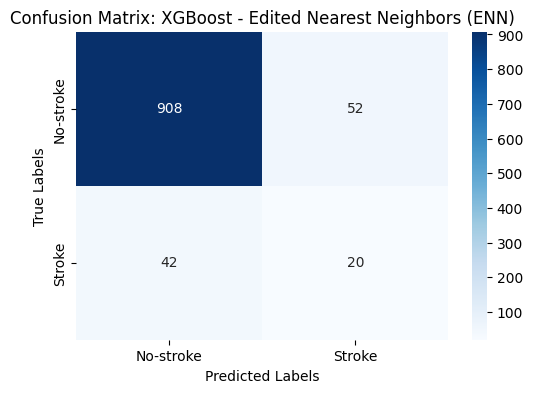

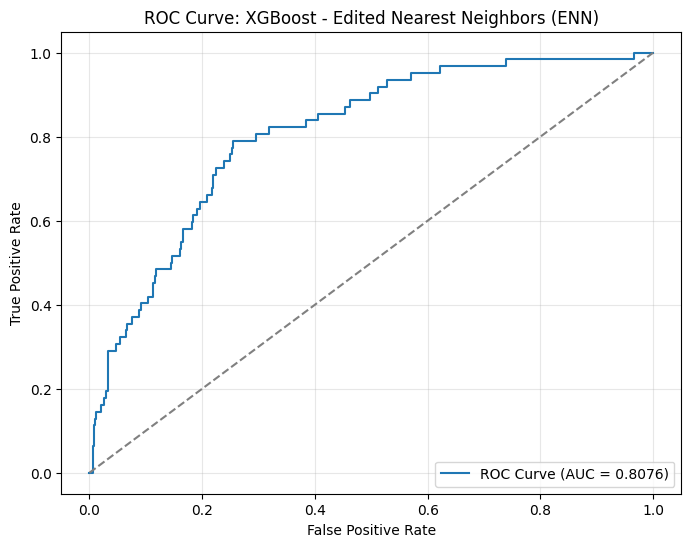


==================== XGBoost with Repeated Edited Nearest Neighbors (RENN) ====================

XGBoost with Repeated Edited Nearest Neighbors (RENN) Evaluation Metrics:
Accuracy: 0.8796
Precision: 0.2598
Recall: 0.5323
F1 Score: 0.3492
ROC-AUC Score: 0.8253

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.90      0.93       960
           1       0.26      0.53      0.35        62

    accuracy                           0.88      1022
   macro avg       0.61      0.72      0.64      1022
weighted avg       0.92      0.88      0.90      1022


Confusion Matrix:
[[866  94]
 [ 29  33]]


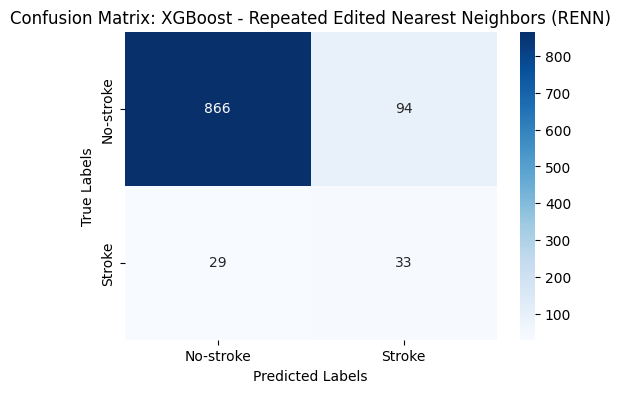

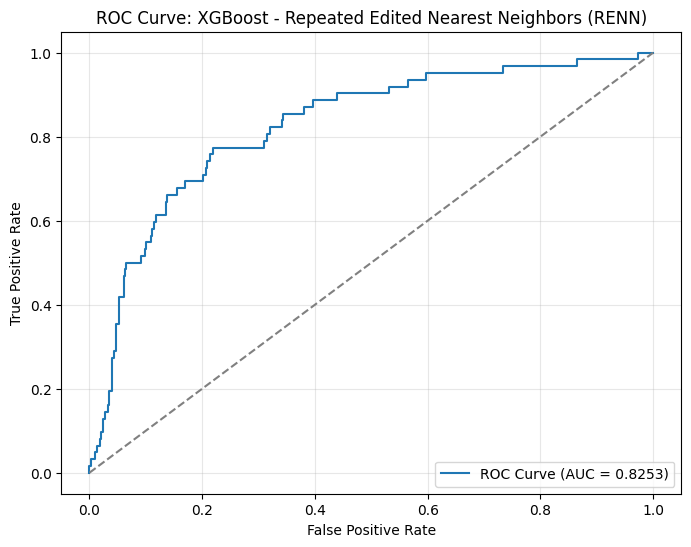


==================== XGBoost with All KNN ====================

XGBoost with All KNN Evaluation Metrics:
Accuracy: 0.8933
Precision: 0.2418
Recall: 0.3548
F1 Score: 0.2876
ROC-AUC Score: 0.8102

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.93      0.94       960
           1       0.24      0.35      0.29        62

    accuracy                           0.89      1022
   macro avg       0.60      0.64      0.61      1022
weighted avg       0.91      0.89      0.90      1022


Confusion Matrix:
[[891  69]
 [ 40  22]]


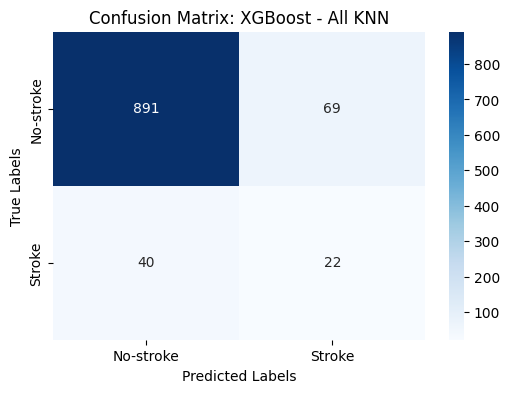

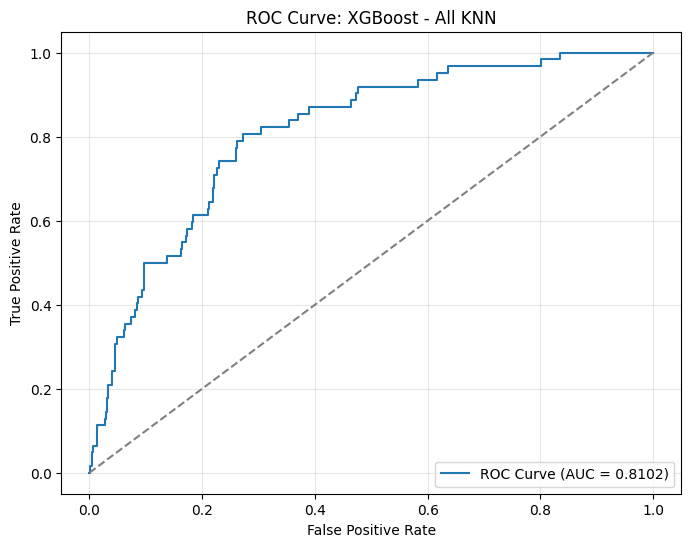


==================== XGBoost with Condensed Nearest Neighbor (CNN) ====================

XGBoost with Condensed Nearest Neighbor (CNN) Evaluation Metrics:
Accuracy: 0.8258
Precision: 0.1282
Recall: 0.3226
F1 Score: 0.1835
ROC-AUC Score: 0.7175

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.86      0.90       960
           1       0.13      0.32      0.18        62

    accuracy                           0.83      1022
   macro avg       0.54      0.59      0.54      1022
weighted avg       0.90      0.83      0.86      1022


Confusion Matrix:
[[824 136]
 [ 42  20]]


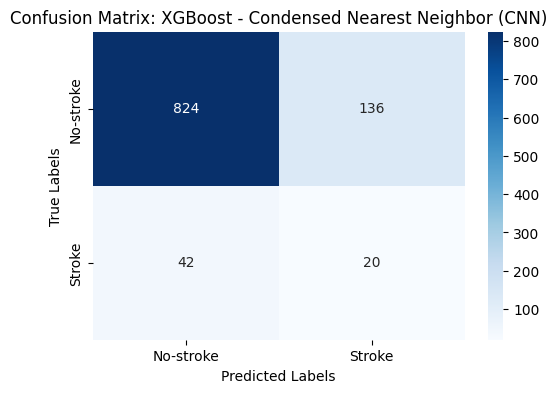

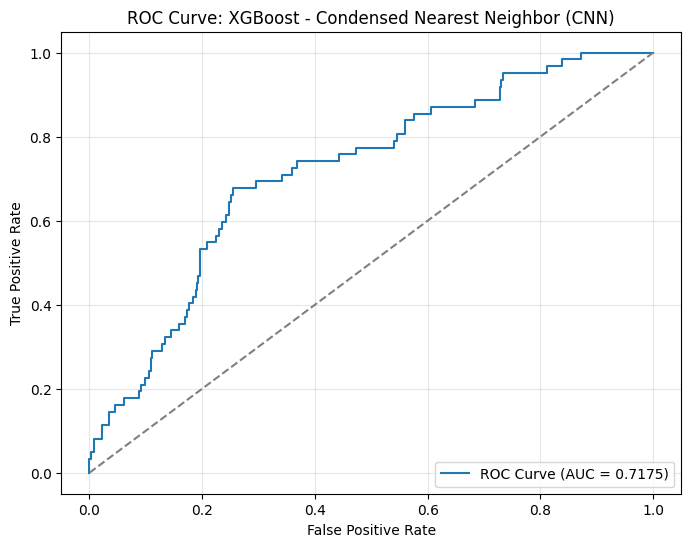


==================== XGBoost with One-Sided Selection (OSS) ====================

XGBoost with One-Sided Selection (OSS) Evaluation Metrics:
Accuracy: 0.9159
Precision: 0.2600
Recall: 0.2097
F1 Score: 0.2321
ROC-AUC Score: 0.7711

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.96      0.96       960
           1       0.26      0.21      0.23        62

    accuracy                           0.92      1022
   macro avg       0.60      0.59      0.59      1022
weighted avg       0.91      0.92      0.91      1022


Confusion Matrix:
[[923  37]
 [ 49  13]]


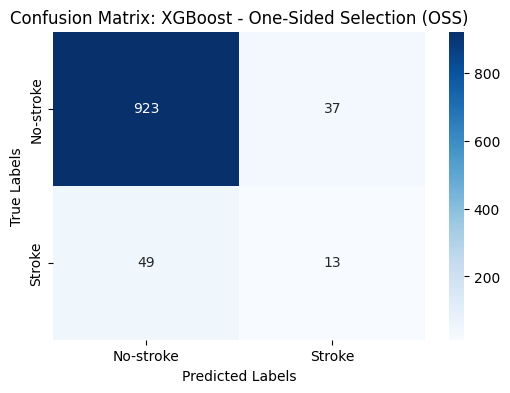

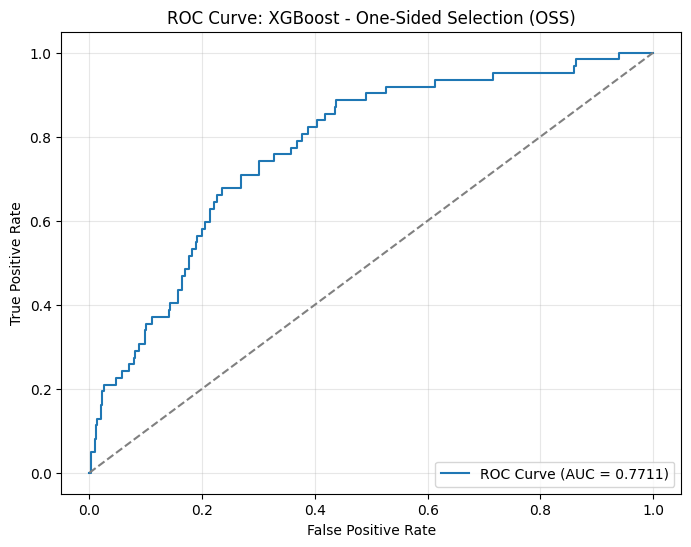


==================== XGBoost with Neighborhood Cleaning Rule (NCR) ====================

XGBoost with Neighborhood Cleaning Rule (NCR) Evaluation Metrics:
Accuracy: 0.8992
Precision: 0.2113
Recall: 0.2419
F1 Score: 0.2256
ROC-AUC Score: 0.8056

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.94      0.95       960
           1       0.21      0.24      0.23        62

    accuracy                           0.90      1022
   macro avg       0.58      0.59      0.59      1022
weighted avg       0.91      0.90      0.90      1022


Confusion Matrix:
[[904  56]
 [ 47  15]]


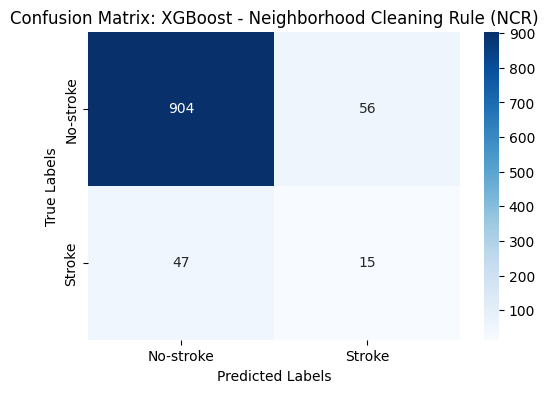

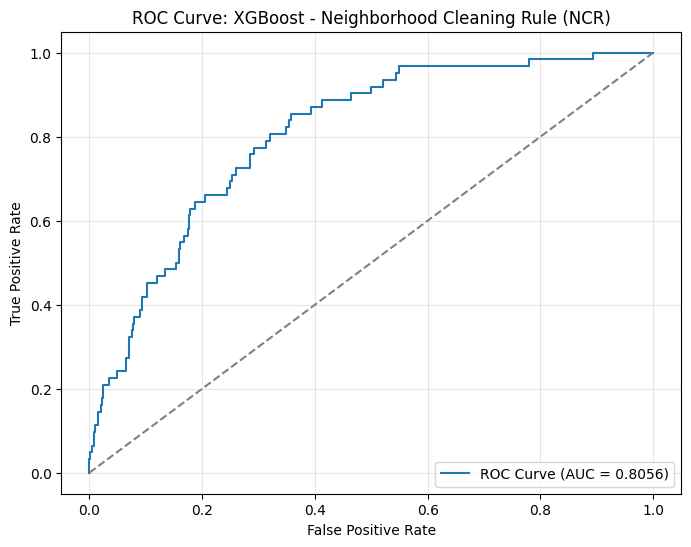


==================== XGBoost with Instance Hardness Threshold ====================

XGBoost with Instance Hardness Threshold Evaluation Metrics:
Accuracy: 0.7348
Precision: 0.1574
Recall: 0.7742
F1 Score: 0.2616
ROC-AUC Score: 0.8459

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.73      0.84       960
           1       0.16      0.77      0.26        62

    accuracy                           0.73      1022
   macro avg       0.57      0.75      0.55      1022
weighted avg       0.93      0.73      0.80      1022


Confusion Matrix:
[[703 257]
 [ 14  48]]


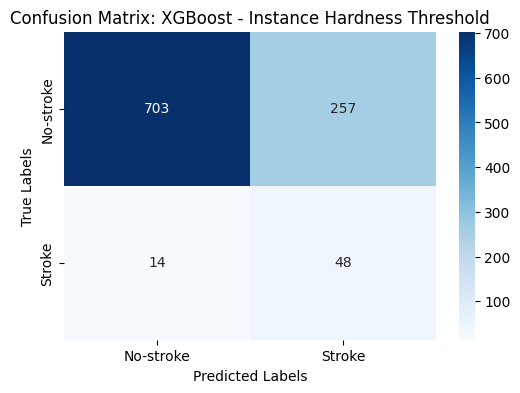

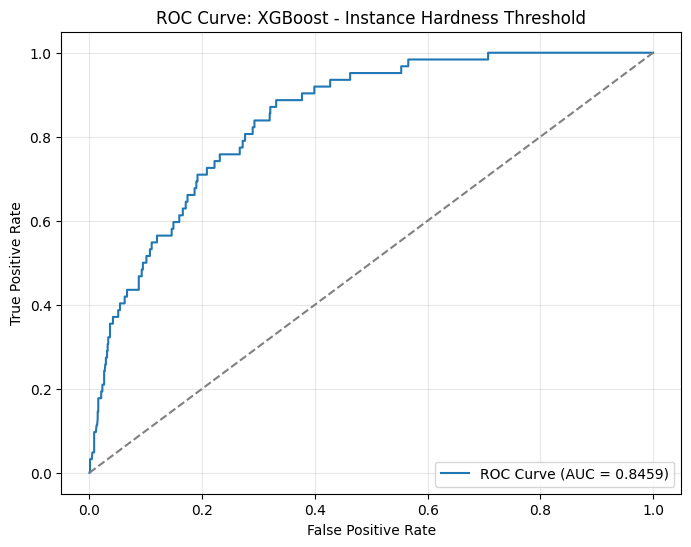


==================== LightGBM with None ====================
[LightGBM] [Info] Number of positive: 187, number of negative: 3901
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000395 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 625
[LightGBM] [Info] Number of data points in the train set: 4088, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000

LightGBM with None Evaluation Metrics:
Accuracy: 0.8933
Precision: 0.2025
Recall: 0.2581
F1 Score: 0.2270
ROC-AUC Score: 0.8120

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.93      0.94       960
           1       0.20      0.26      0.23        62

    accuracy                           0.89      1022
   macro avg   

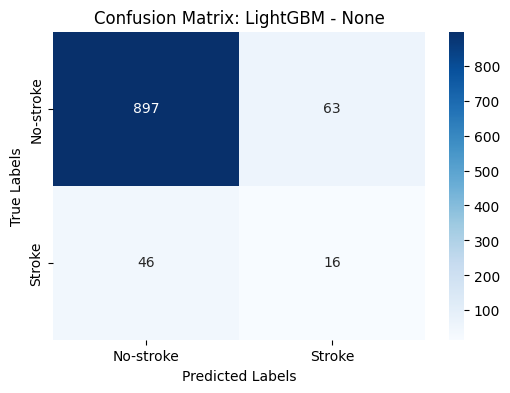

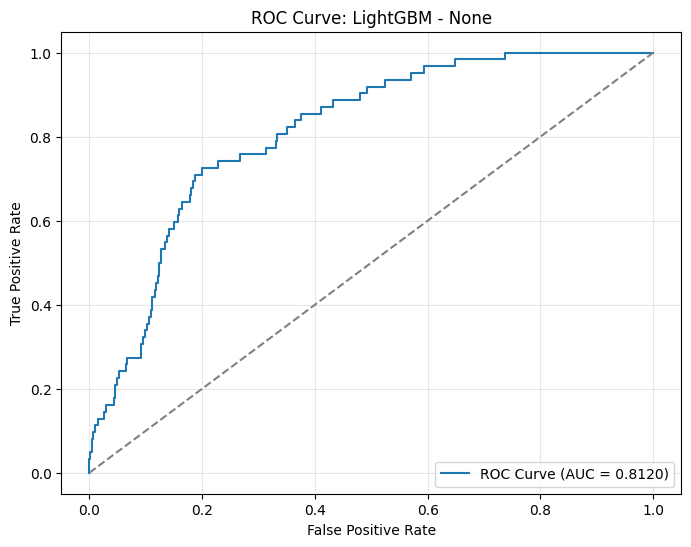


==================== LightGBM with SMOTE ====================
[LightGBM] [Info] Number of positive: 3901, number of negative: 3901
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000641 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7802, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000

LightGBM with SMOTE Evaluation Metrics:
Accuracy: 0.9090
Precision: 0.1961
Recall: 0.1613
F1 Score: 0.1770
ROC-AUC Score: 0.7830

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.96      0.95       960
           1       0.20      0.16      0.18        62

    accuracy                           0.91      1022
   macro avg       0.57      0.56      0.56      1022
weighted avg 

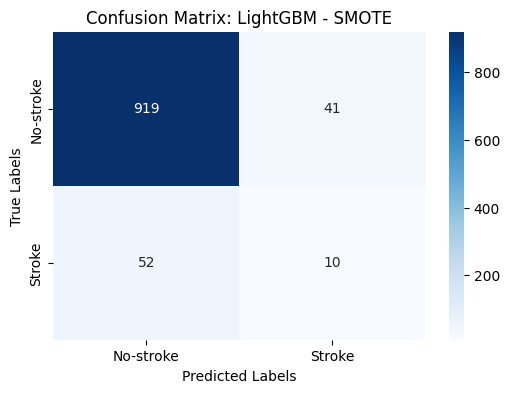

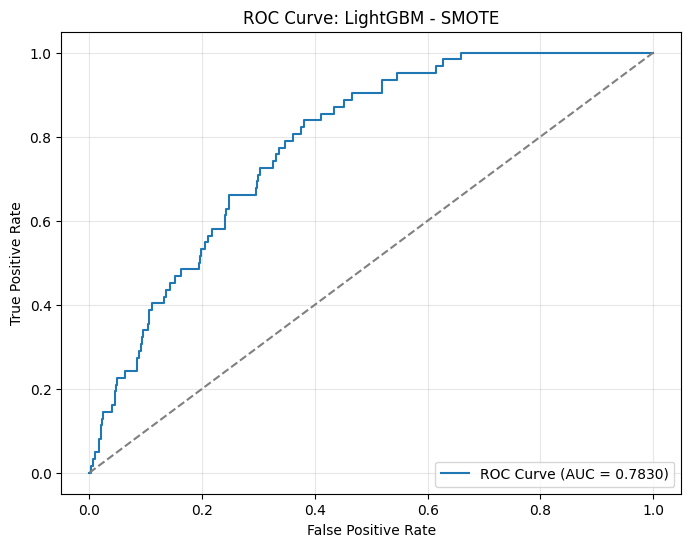


==================== LightGBM with ClusterCentroids ====================
[LightGBM] [Info] Number of positive: 187, number of negative: 187
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000071 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 352
[LightGBM] [Info] Number of data points in the train set: 374, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

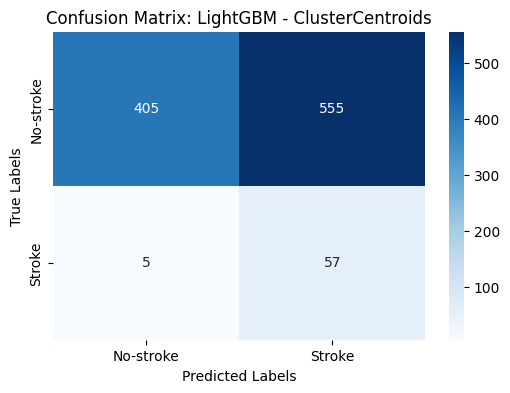

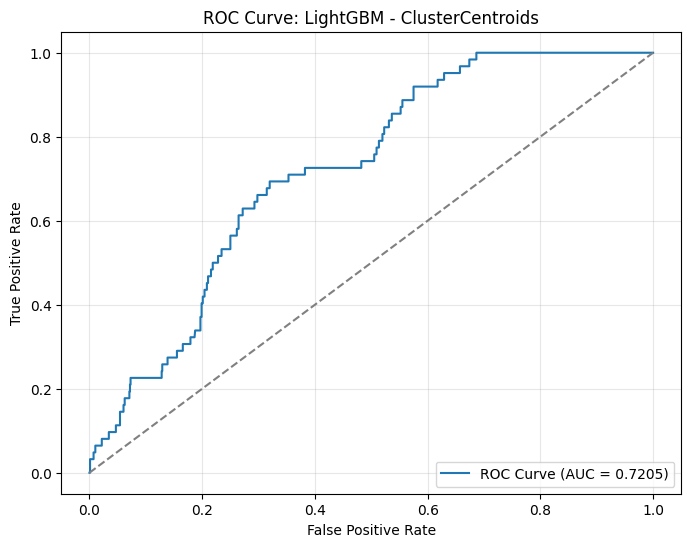


==================== LightGBM with Random Undersampling ====================
[LightGBM] [Info] Number of positive: 187, number of negative: 187
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000117 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 297
[LightGBM] [Info] Number of data points in the train set: 374, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

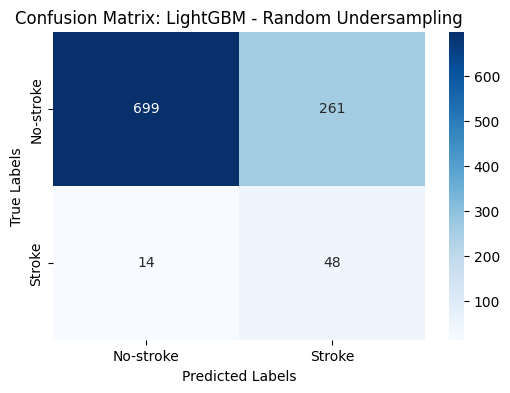

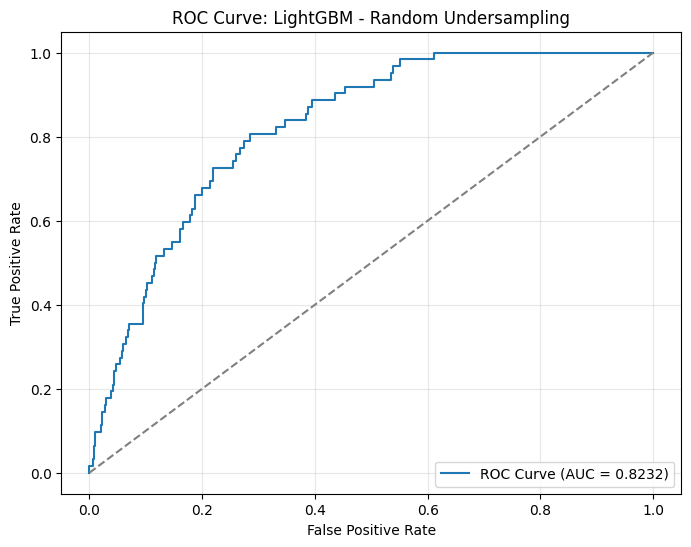


==================== LightGBM with NearMiss-1 ====================
[LightGBM] [Info] Number of positive: 187, number of negative: 187
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000105 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 256
[LightGBM] [Info] Number of data points in the train set: 374, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

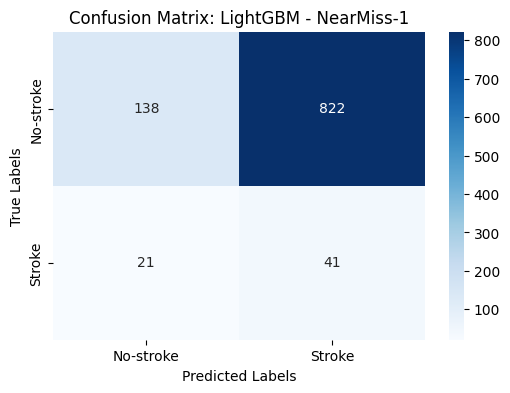

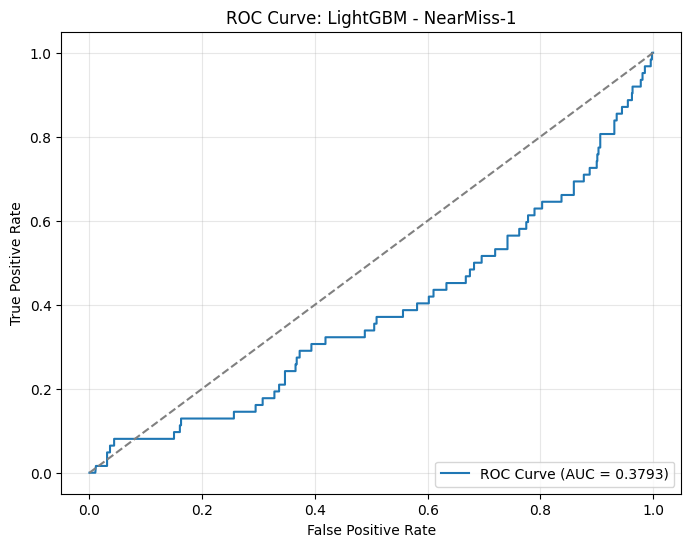


==================== LightGBM with NearMiss-2 ====================
[LightGBM] [Info] Number of positive: 187, number of negative: 187
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000074 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 288
[LightGBM] [Info] Number of data points in the train set: 374, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

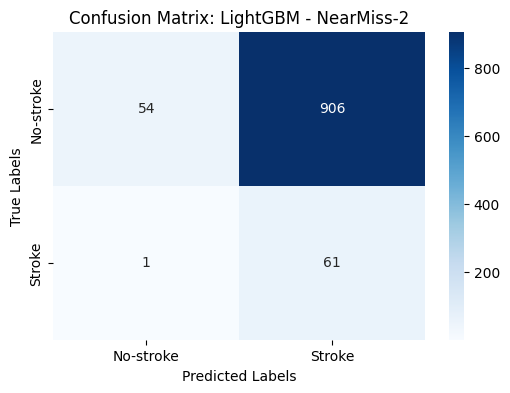

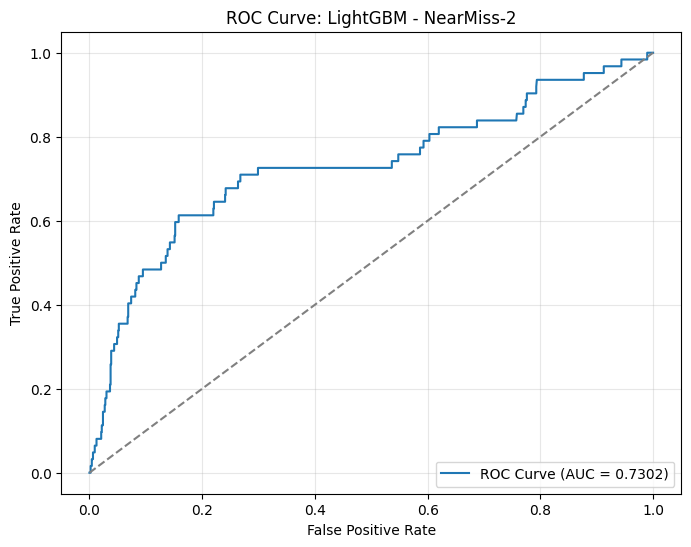


==================== LightGBM with NearMiss-3 ====================
[LightGBM] [Info] Number of positive: 187, number of negative: 187
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000082 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 274
[LightGBM] [Info] Number of data points in the train set: 374, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

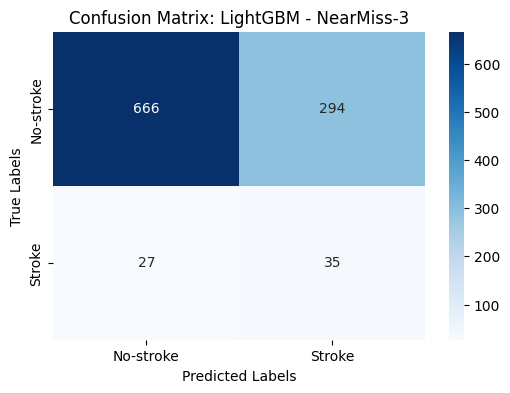

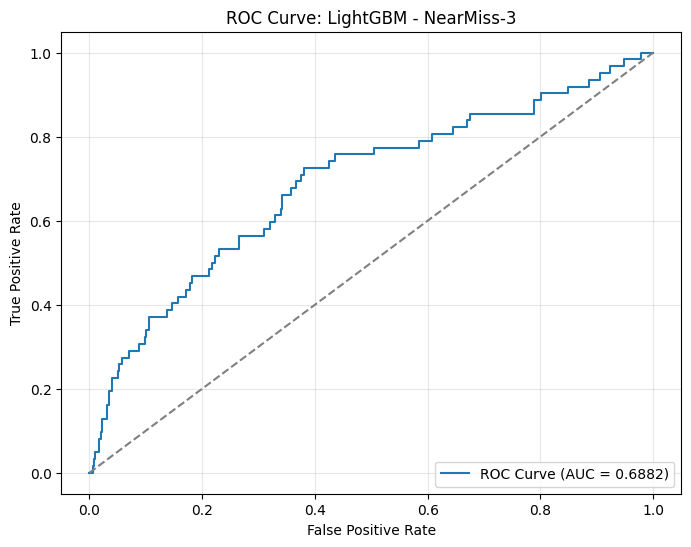


==================== LightGBM with Tomek Links ====================
[LightGBM] [Info] Number of positive: 187, number of negative: 3816
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000360 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 625
[LightGBM] [Info] Number of data points in the train set: 4003, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000

LightGBM with Tomek Links Evaluation Metrics:
Accuracy: 0.8943
Precision: 0.2195
Recall: 0.2903
F1 Score: 0.2500
ROC-AUC Score: 0.8043

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.93      0.94       960
           1       0.22      0.29      0.25        62

    accuracy                           0.89      1022
   

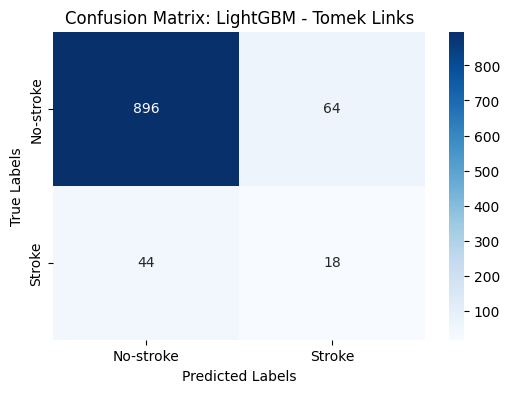

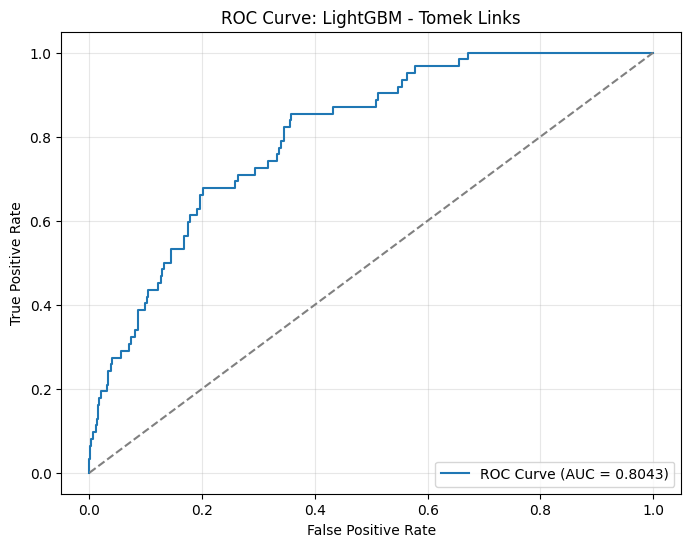


==================== LightGBM with Edited Nearest Neighbors (ENN) ====================
[LightGBM] [Info] Number of positive: 187, number of negative: 3443
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000261 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 625
[LightGBM] [Info] Number of data points in the train set: 3630, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000

LightGBM with Edited Nearest Neighbors (ENN) Evaluation Metrics:
Accuracy: 0.8718
Precision: 0.2283
Recall: 0.4677
F1 Score: 0.3069
ROC-AUC Score: 0.8306

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.90      0.93       960
           1       0.23      0.47      0.31        62

    accuracy       

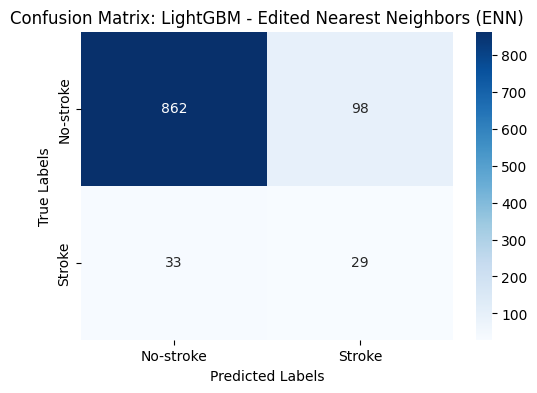

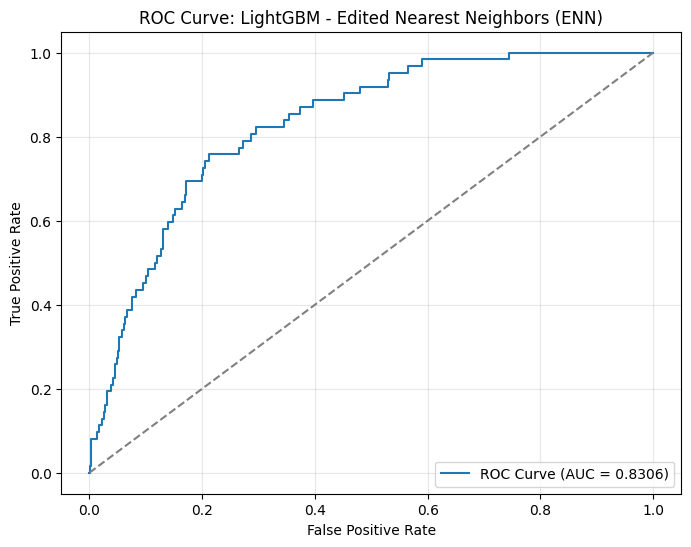


==================== LightGBM with Repeated Edited Nearest Neighbors (RENN) ====================
[LightGBM] [Info] Number of positive: 187, number of negative: 3222
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000267 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 625
[LightGBM] [Info] Number of data points in the train set: 3409, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000

LightGBM with Repeated Edited Nearest Neighbors (RENN) Evaluation Metrics:
Accuracy: 0.8620
Precision: 0.2384
Recall: 0.5806
F1 Score: 0.3380
ROC-AUC Score: 0.8461

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.88      0.92       960
           1       0.24      0.58      0.34        6

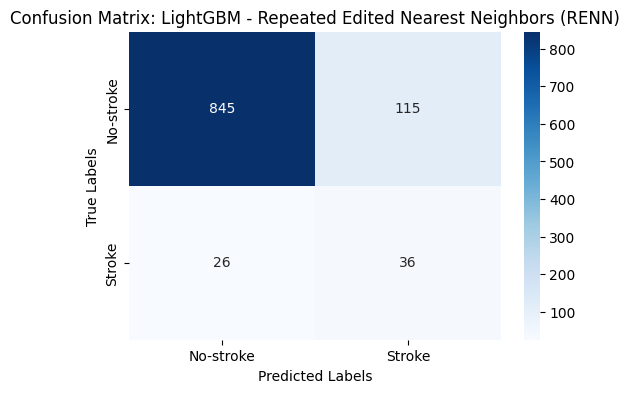

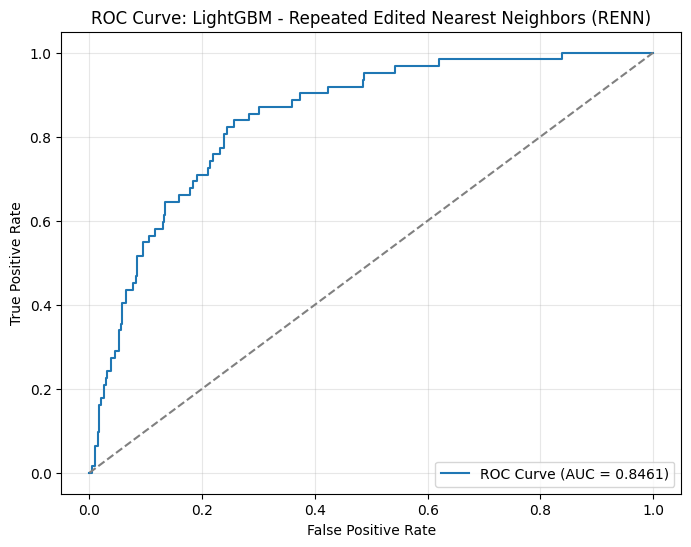


==================== LightGBM with All KNN ====================
[LightGBM] [Info] Number of positive: 187, number of negative: 3352
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000294 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 625
[LightGBM] [Info] Number of data points in the train set: 3539, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000

LightGBM with All KNN Evaluation Metrics:
Accuracy: 0.8738
Precision: 0.2443
Recall: 0.5161
F1 Score: 0.3316
ROC-AUC Score: 0.8417

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.90      0.93       960
           1       0.24      0.52      0.33        62

    accuracy                           0.87      1022
   macro 

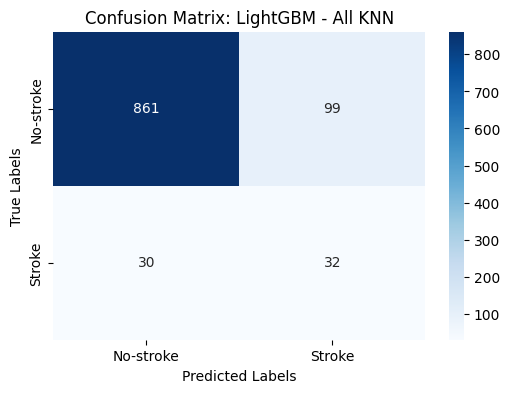

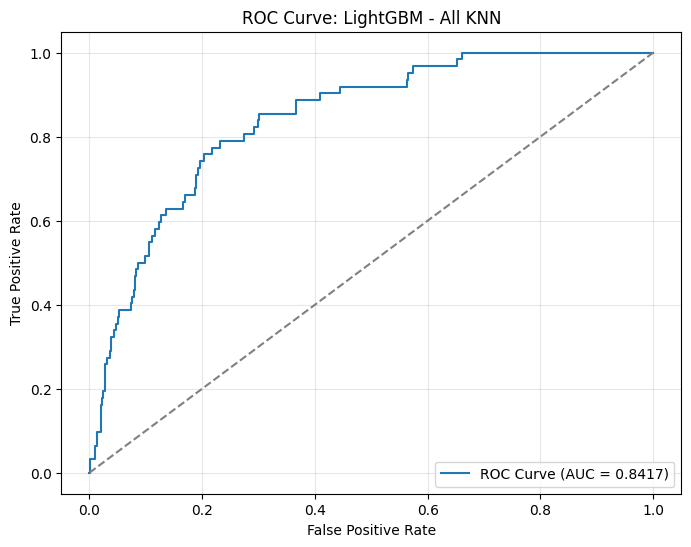


==================== LightGBM with Condensed Nearest Neighbor (CNN) ====================
[LightGBM] [Info] Number of positive: 187, number of negative: 543
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000123 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 465
[LightGBM] [Info] Number of data points in the train set: 730, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

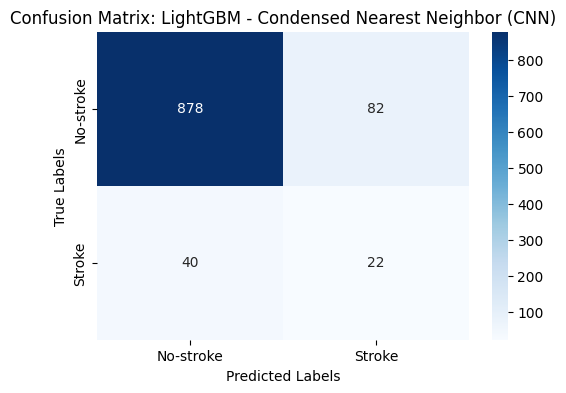

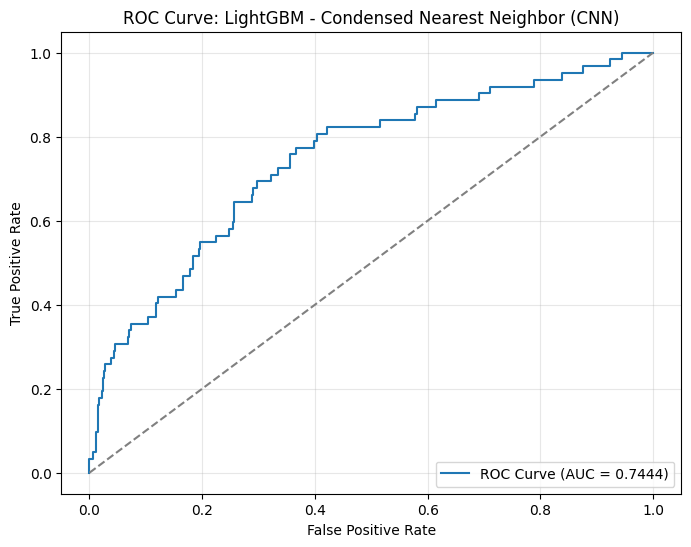


==================== LightGBM with One-Sided Selection (OSS) ====================
[LightGBM] [Info] Number of positive: 187, number of negative: 3463
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000328 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 624
[LightGBM] [Info] Number of data points in the train set: 3650, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000

LightGBM with One-Sided Selection (OSS) Evaluation Metrics:
Accuracy: 0.8894
Precision: 0.2069
Recall: 0.2903
F1 Score: 0.2416
ROC-AUC Score: 0.8034

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.93      0.94       960
           1       0.21      0.29      0.24        62

    accuracy                 

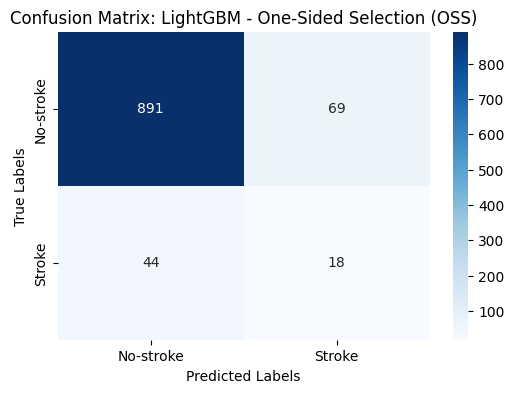

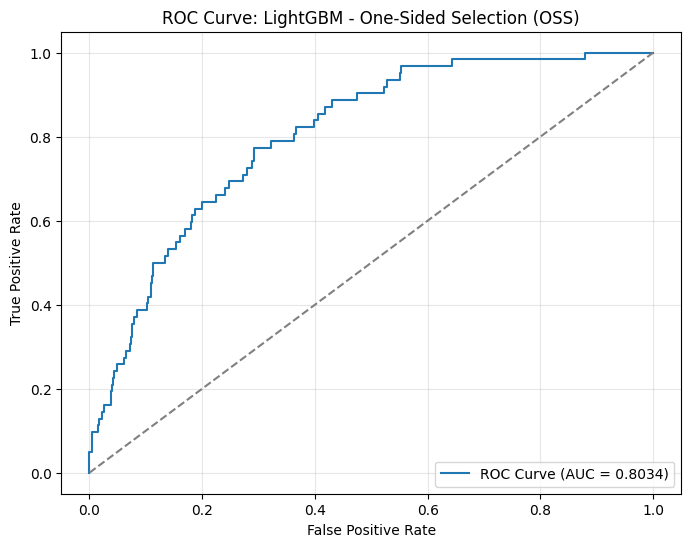


==================== LightGBM with Neighborhood Cleaning Rule (NCR) ====================
[LightGBM] [Info] Number of positive: 187, number of negative: 3486
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000315 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 625
[LightGBM] [Info] Number of data points in the train set: 3673, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000

LightGBM with Neighborhood Cleaning Rule (NCR) Evaluation Metrics:
Accuracy: 0.8650
Precision: 0.2077
Recall: 0.4355
F1 Score: 0.2812
ROC-AUC Score: 0.8305

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.89      0.93       960
           1       0.21      0.44      0.28        62

    accuracy 

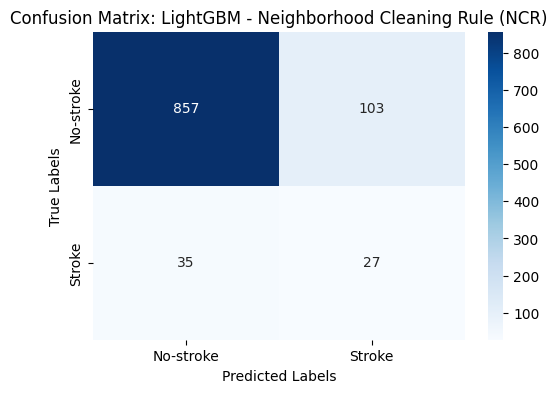

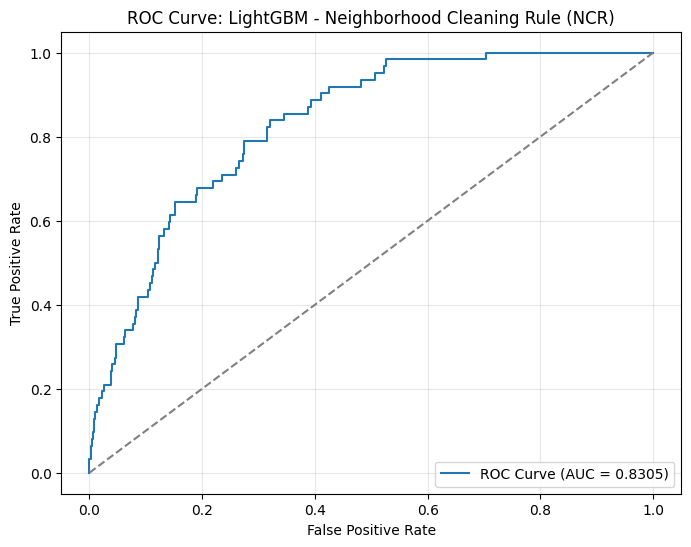


==================== LightGBM with Instance Hardness Threshold ====================
[LightGBM] [Info] Number of positive: 187, number of negative: 1868
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000183 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 622
[LightGBM] [Info] Number of data points in the train set: 2055, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000

LightGBM with Instance Hardness Threshold Evaluation Metrics:
Accuracy: 0.7642
Precision: 0.1697
Recall: 0.7419
F1 Score: 0.2763
ROC-AUC Score: 0.8361

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.77      0.86       960
           1       0.17      0.74      0.28        62

    accuracy           

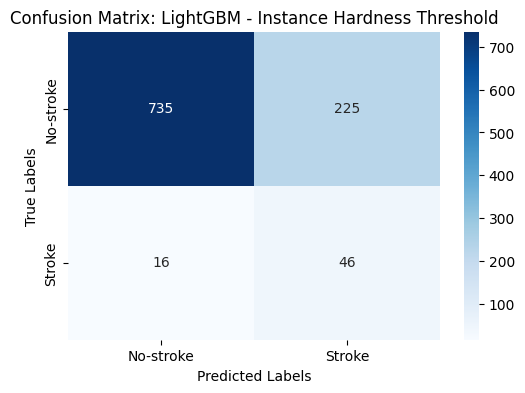

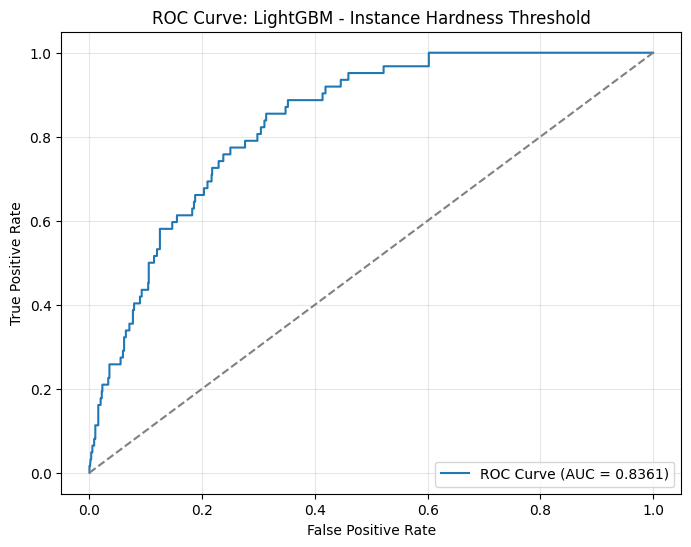


==================== CatBoost with None ====================

CatBoost with None Evaluation Metrics:
Accuracy: 0.9393
Precision: 0.5000
Recall: 0.0484
F1 Score: 0.0882
ROC-AUC Score: 0.8249

Classification Report:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.50      0.05      0.09        62

    accuracy                           0.94      1022
   macro avg       0.72      0.52      0.53      1022
weighted avg       0.92      0.94      0.92      1022


Confusion Matrix:
[[957   3]
 [ 59   3]]


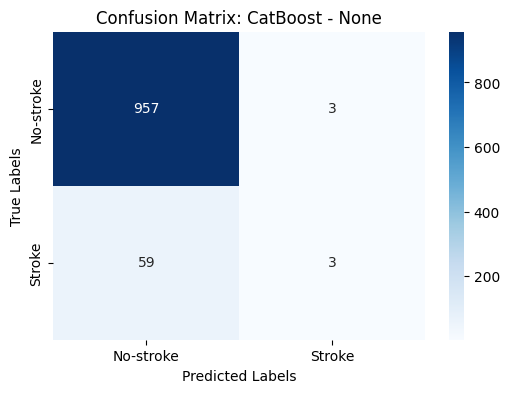

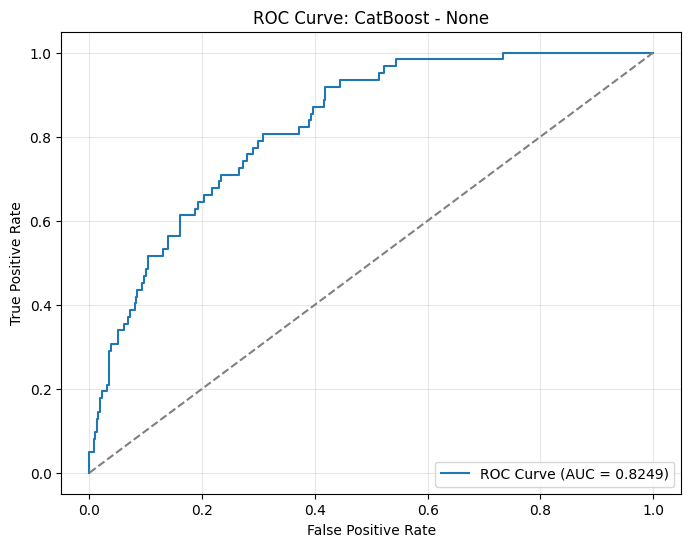


==================== CatBoost with SMOTE ====================

CatBoost with SMOTE Evaluation Metrics:
Accuracy: 0.9031
Precision: 0.2154
Recall: 0.2258
F1 Score: 0.2205
ROC-AUC Score: 0.7652

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.95      0.95       960
           1       0.22      0.23      0.22        62

    accuracy                           0.90      1022
   macro avg       0.58      0.59      0.58      1022
weighted avg       0.91      0.90      0.90      1022


Confusion Matrix:
[[909  51]
 [ 48  14]]


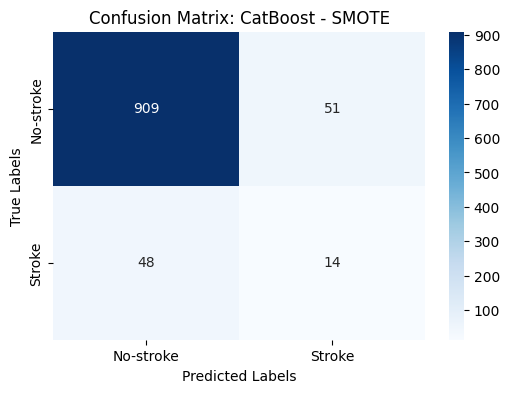

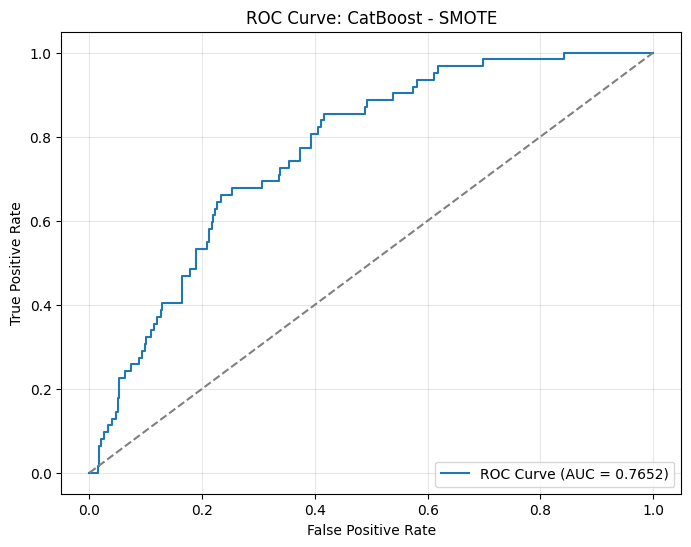


==================== CatBoost with ClusterCentroids ====================

CatBoost with ClusterCentroids Evaluation Metrics:
Accuracy: 0.4051
Precision: 0.0864
Recall: 0.9194
F1 Score: 0.1579
ROC-AUC Score: 0.7235

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.37      0.54       960
           1       0.09      0.92      0.16        62

    accuracy                           0.41      1022
   macro avg       0.54      0.65      0.35      1022
weighted avg       0.93      0.41      0.52      1022


Confusion Matrix:
[[357 603]
 [  5  57]]


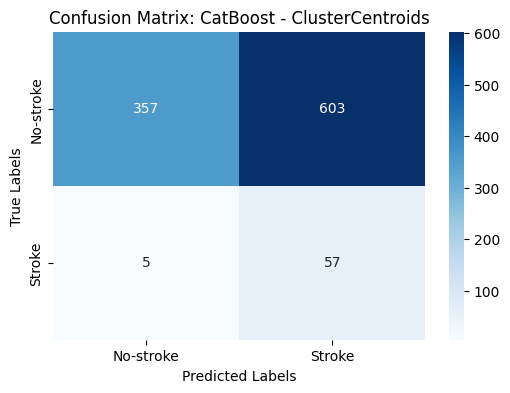

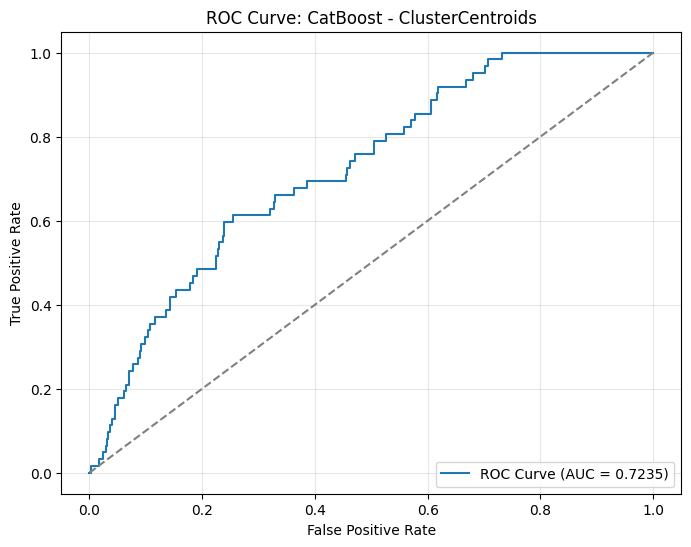


==================== CatBoost with Random Undersampling ====================

CatBoost with Random Undersampling Evaluation Metrics:
Accuracy: 0.7280
Precision: 0.1604
Recall: 0.8226
F1 Score: 0.2684
ROC-AUC Score: 0.8423

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.72      0.83       960
           1       0.16      0.82      0.27        62

    accuracy                           0.73      1022
   macro avg       0.57      0.77      0.55      1022
weighted avg       0.93      0.73      0.80      1022


Confusion Matrix:
[[693 267]
 [ 11  51]]


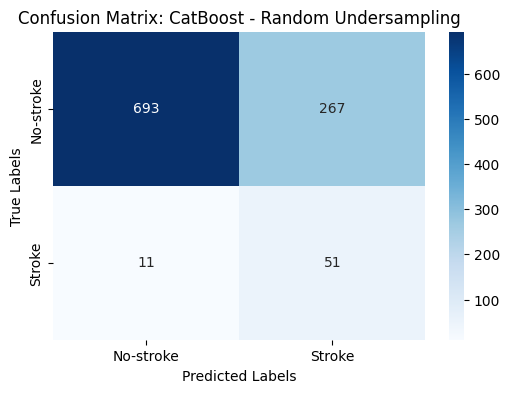

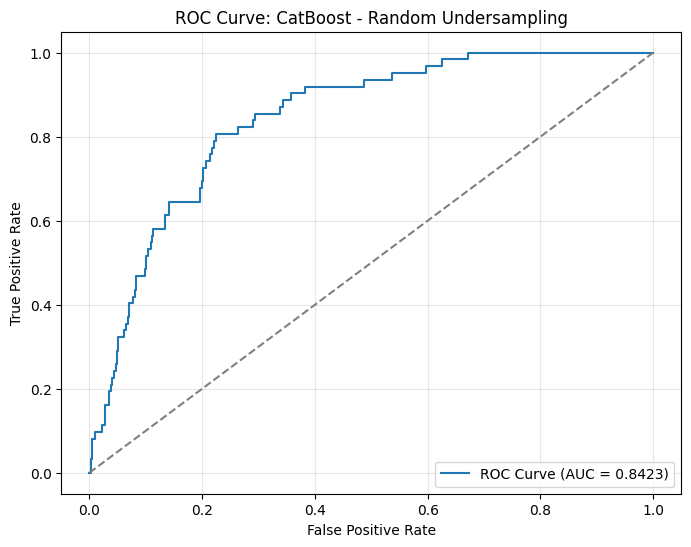


==================== CatBoost with NearMiss-1 ====================

CatBoost with NearMiss-1 Evaluation Metrics:
Accuracy: 0.1761
Precision: 0.0465
Recall: 0.6452
F1 Score: 0.0868
ROC-AUC Score: 0.3118

Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.15      0.25       960
           1       0.05      0.65      0.09        62

    accuracy                           0.18      1022
   macro avg       0.46      0.40      0.17      1022
weighted avg       0.81      0.18      0.24      1022


Confusion Matrix:
[[140 820]
 [ 22  40]]


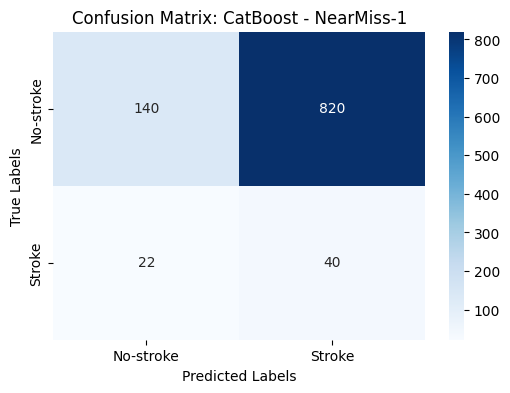

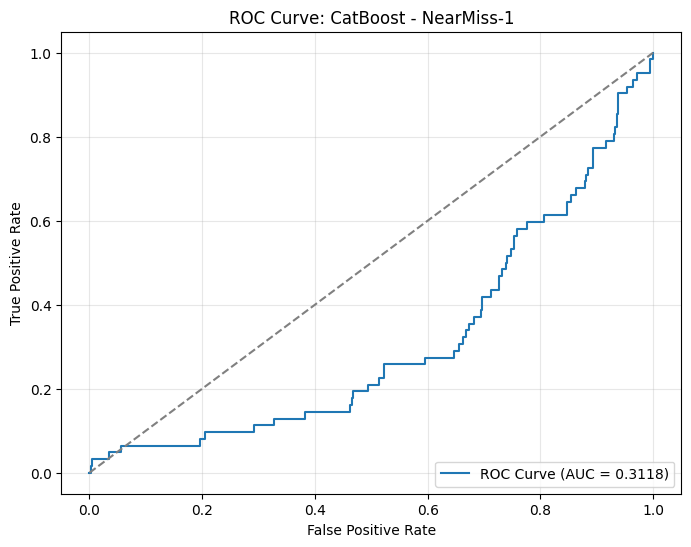


==================== CatBoost with NearMiss-2 ====================

CatBoost with NearMiss-2 Evaluation Metrics:
Accuracy: 0.1184
Precision: 0.0626
Recall: 0.9677
F1 Score: 0.1175
ROC-AUC Score: 0.7706

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.06      0.12       960
           1       0.06      0.97      0.12        62

    accuracy                           0.12      1022
   macro avg       0.52      0.52      0.12      1022
weighted avg       0.91      0.12      0.12      1022


Confusion Matrix:
[[ 61 899]
 [  2  60]]


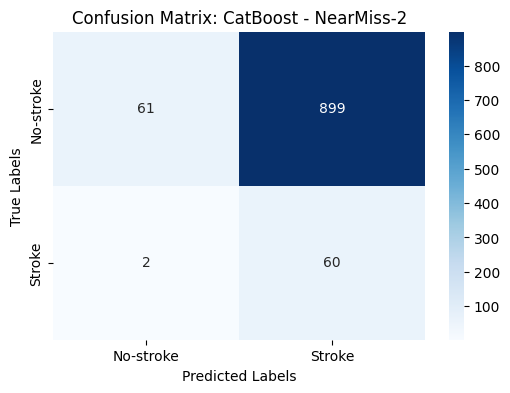

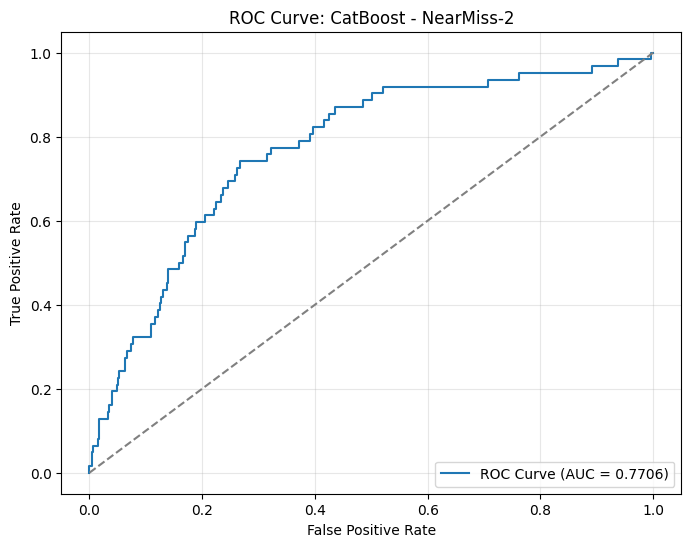


==================== CatBoost with NearMiss-3 ====================

CatBoost with NearMiss-3 Evaluation Metrics:
Accuracy: 0.6840
Precision: 0.1150
Recall: 0.6290
F1 Score: 0.1945
ROC-AUC Score: 0.6948

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.69      0.80       960
           1       0.12      0.63      0.19        62

    accuracy                           0.68      1022
   macro avg       0.54      0.66      0.50      1022
weighted avg       0.91      0.68      0.77      1022


Confusion Matrix:
[[660 300]
 [ 23  39]]


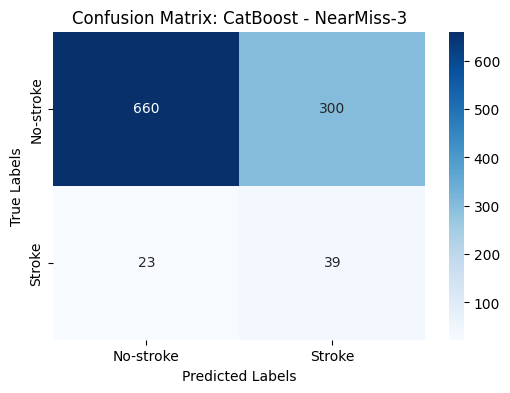

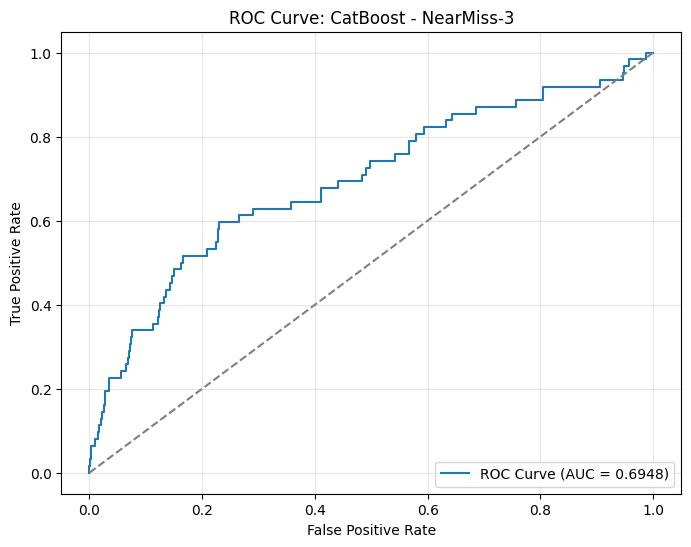


==================== CatBoost with Tomek Links ====================

CatBoost with Tomek Links Evaluation Metrics:
Accuracy: 0.9374
Precision: 0.4000
Recall: 0.0645
F1 Score: 0.1111
ROC-AUC Score: 0.8221

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.99      0.97       960
           1       0.40      0.06      0.11        62

    accuracy                           0.94      1022
   macro avg       0.67      0.53      0.54      1022
weighted avg       0.91      0.94      0.92      1022


Confusion Matrix:
[[954   6]
 [ 58   4]]


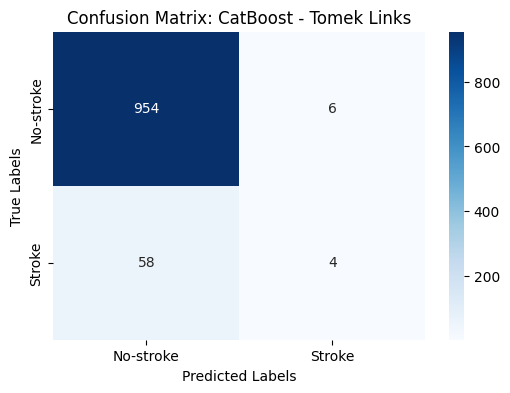

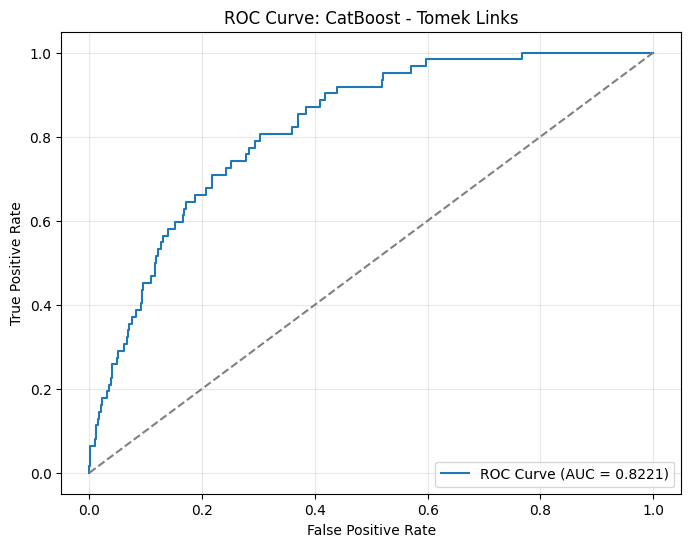


==================== CatBoost with Edited Nearest Neighbors (ENN) ====================

CatBoost with Edited Nearest Neighbors (ENN) Evaluation Metrics:
Accuracy: 0.9276
Precision: 0.2857
Recall: 0.1290
F1 Score: 0.1778
ROC-AUC Score: 0.8323

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.98      0.96       960
           1       0.29      0.13      0.18        62

    accuracy                           0.93      1022
   macro avg       0.62      0.55      0.57      1022
weighted avg       0.91      0.93      0.91      1022


Confusion Matrix:
[[940  20]
 [ 54   8]]


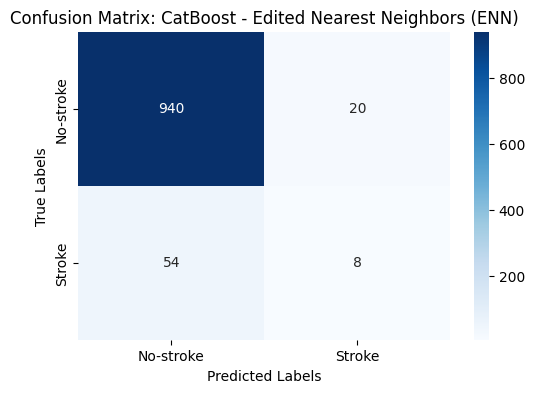

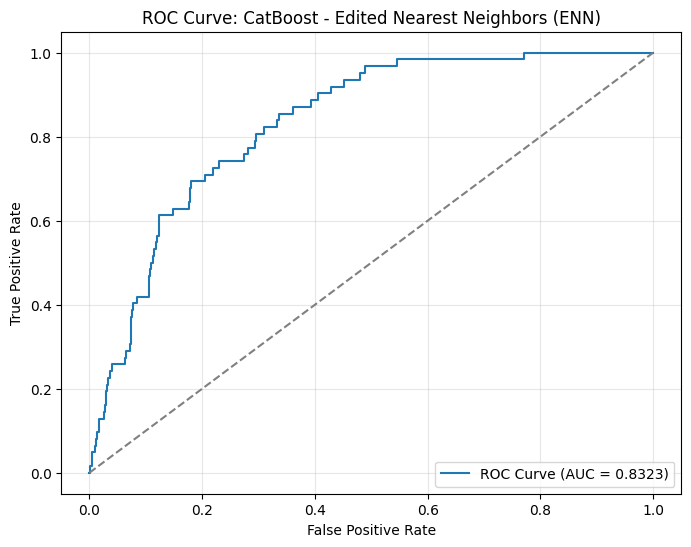


==================== CatBoost with Repeated Edited Nearest Neighbors (RENN) ====================

CatBoost with Repeated Edited Nearest Neighbors (RENN) Evaluation Metrics:
Accuracy: 0.9149
Precision: 0.3239
Recall: 0.3710
F1 Score: 0.3459
ROC-AUC Score: 0.8451

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.95      0.95       960
           1       0.32      0.37      0.35        62

    accuracy                           0.91      1022
   macro avg       0.64      0.66      0.65      1022
weighted avg       0.92      0.91      0.92      1022


Confusion Matrix:
[[912  48]
 [ 39  23]]


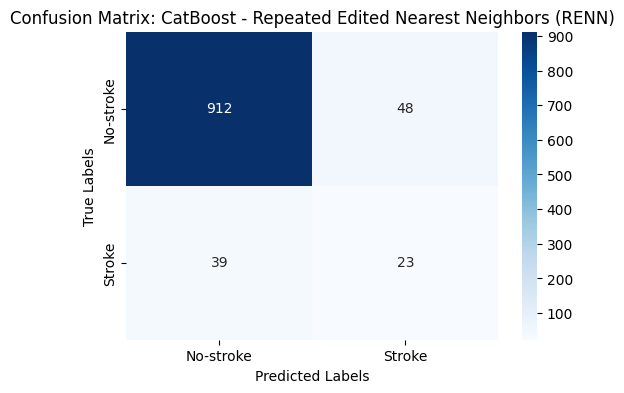

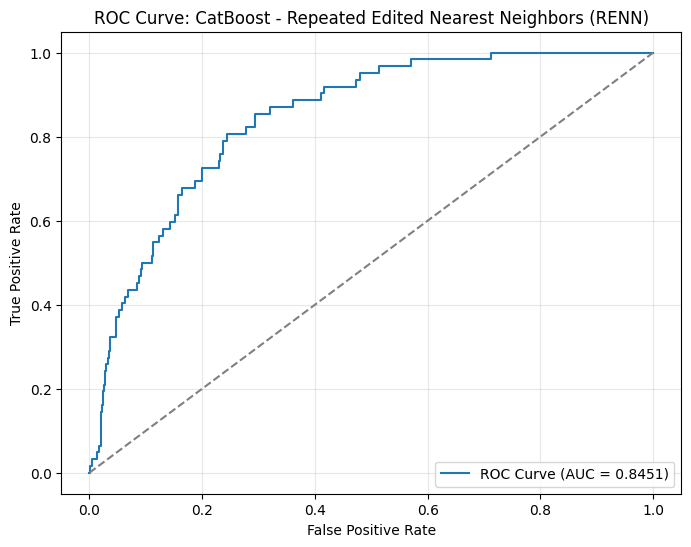


==================== CatBoost with All KNN ====================

CatBoost with All KNN Evaluation Metrics:
Accuracy: 0.9227
Precision: 0.3023
Recall: 0.2097
F1 Score: 0.2476
ROC-AUC Score: 0.8386

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.97      0.96       960
           1       0.30      0.21      0.25        62

    accuracy                           0.92      1022
   macro avg       0.63      0.59      0.60      1022
weighted avg       0.91      0.92      0.92      1022


Confusion Matrix:
[[930  30]
 [ 49  13]]


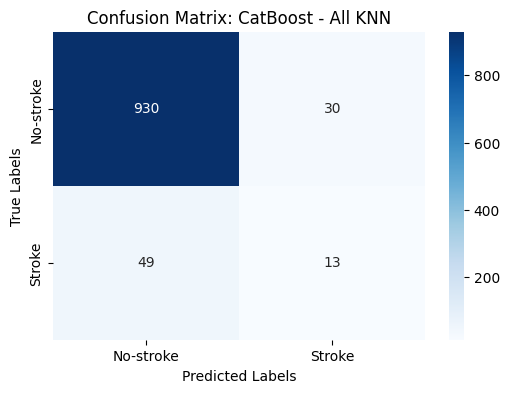

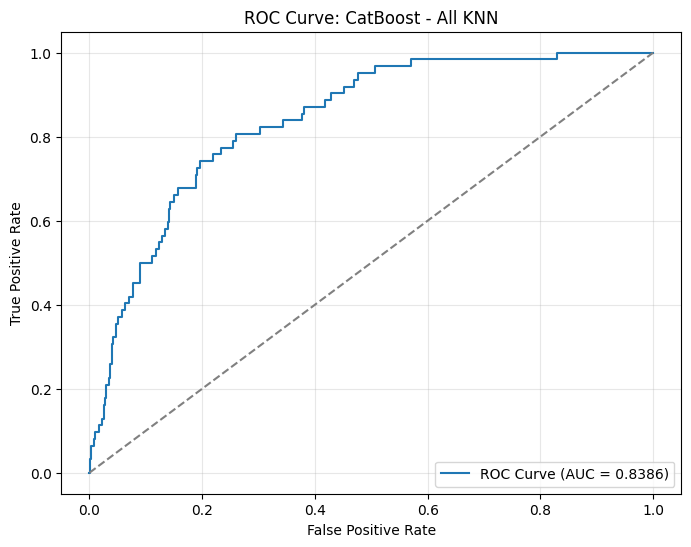


==================== CatBoost with Condensed Nearest Neighbor (CNN) ====================

CatBoost with Condensed Nearest Neighbor (CNN) Evaluation Metrics:
Accuracy: 0.9335
Precision: 0.3846
Recall: 0.1613
F1 Score: 0.2273
ROC-AUC Score: 0.7975

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.98      0.97       960
           1       0.38      0.16      0.23        62

    accuracy                           0.93      1022
   macro avg       0.67      0.57      0.60      1022
weighted avg       0.91      0.93      0.92      1022


Confusion Matrix:
[[944  16]
 [ 52  10]]


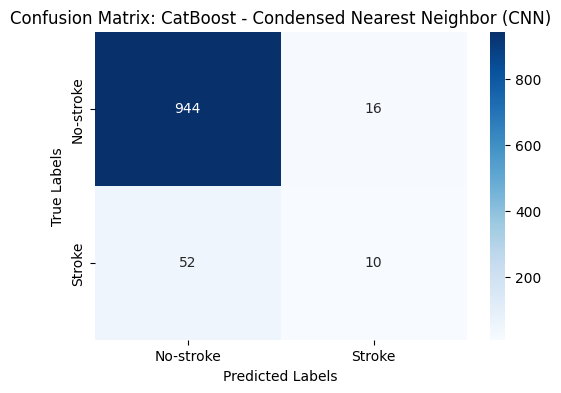

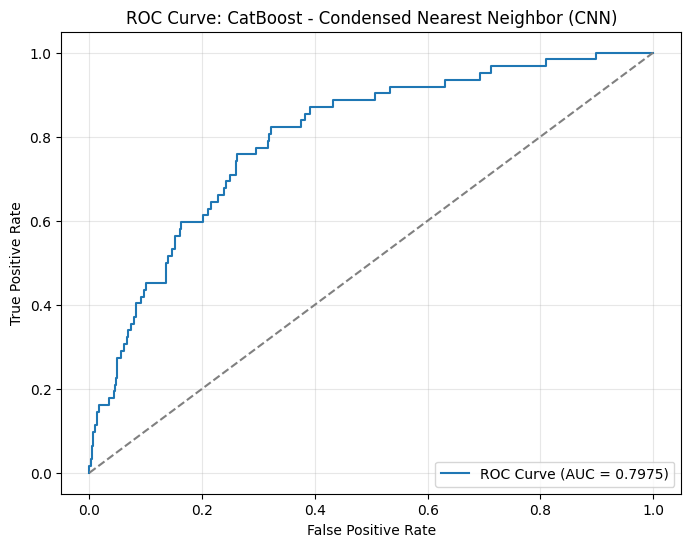


==================== CatBoost with One-Sided Selection (OSS) ====================

CatBoost with One-Sided Selection (OSS) Evaluation Metrics:
Accuracy: 0.9413
Precision: 0.6667
Recall: 0.0645
F1 Score: 0.1176
ROC-AUC Score: 0.8235

Classification Report:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.67      0.06      0.12        62

    accuracy                           0.94      1022
   macro avg       0.80      0.53      0.54      1022
weighted avg       0.93      0.94      0.92      1022


Confusion Matrix:
[[958   2]
 [ 58   4]]


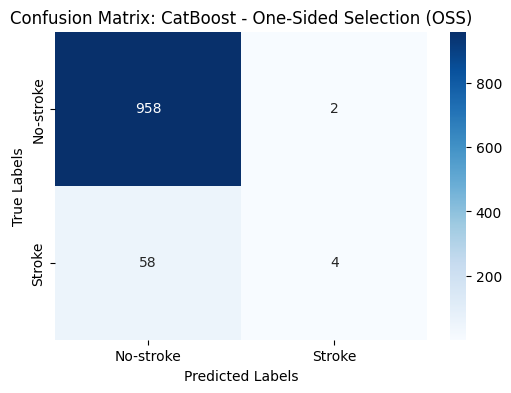

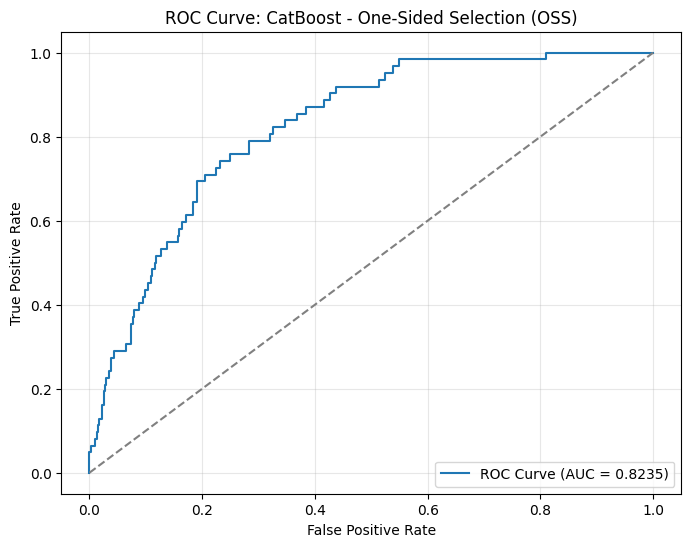


==================== CatBoost with Neighborhood Cleaning Rule (NCR) ====================

CatBoost with Neighborhood Cleaning Rule (NCR) Evaluation Metrics:
Accuracy: 0.9305
Precision: 0.2857
Recall: 0.0968
F1 Score: 0.1446
ROC-AUC Score: 0.8328

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.98      0.96       960
           1       0.29      0.10      0.14        62

    accuracy                           0.93      1022
   macro avg       0.61      0.54      0.55      1022
weighted avg       0.90      0.93      0.91      1022


Confusion Matrix:
[[945  15]
 [ 56   6]]


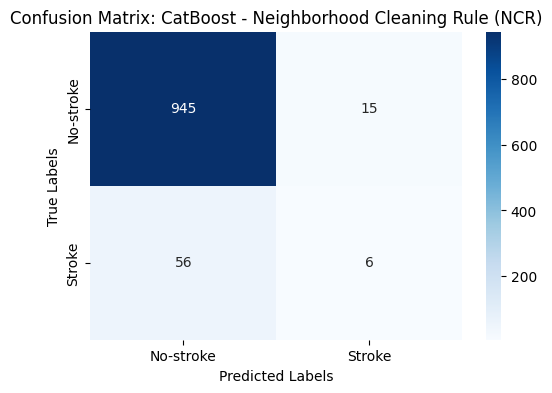

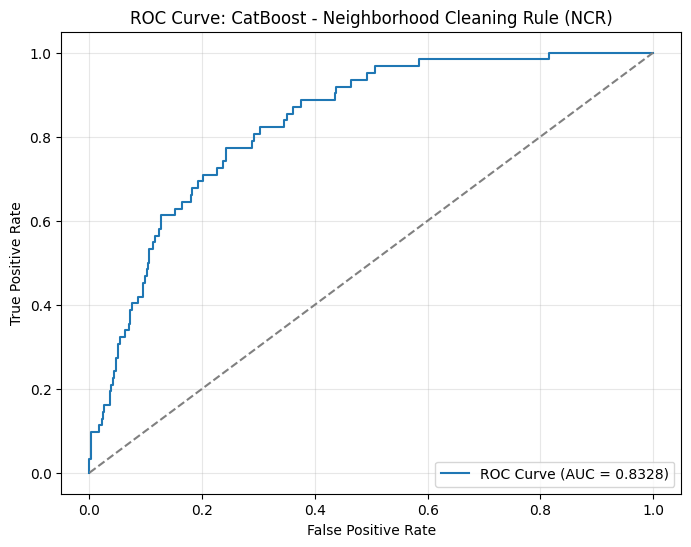


==================== CatBoost with Instance Hardness Threshold ====================

CatBoost with Instance Hardness Threshold Evaluation Metrics:
Accuracy: 0.7965
Precision: 0.1826
Recall: 0.6774
F1 Score: 0.2877
ROC-AUC Score: 0.8427

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.80      0.88       960
           1       0.18      0.68      0.29        62

    accuracy                           0.80      1022
   macro avg       0.58      0.74      0.58      1022
weighted avg       0.93      0.80      0.85      1022


Confusion Matrix:
[[772 188]
 [ 20  42]]


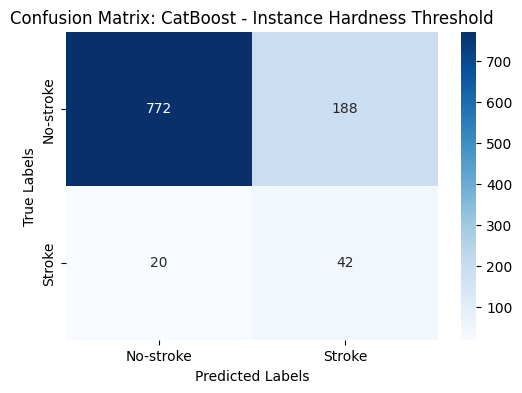

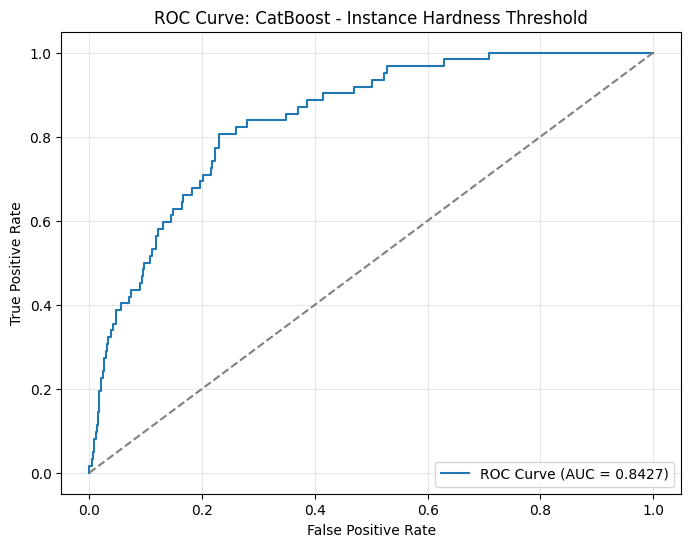


==================== Logistic Regression with None ====================

Logistic Regression with None Evaluation Metrics:
Accuracy: 0.7515
Precision: 0.1643
Recall: 0.7581
F1 Score: 0.2701
ROC-AUC Score: 0.8516

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.75      0.85       960
           1       0.16      0.76      0.27        62

    accuracy                           0.75      1022
   macro avg       0.57      0.75      0.56      1022
weighted avg       0.93      0.75      0.82      1022


Confusion Matrix:
[[721 239]
 [ 15  47]]


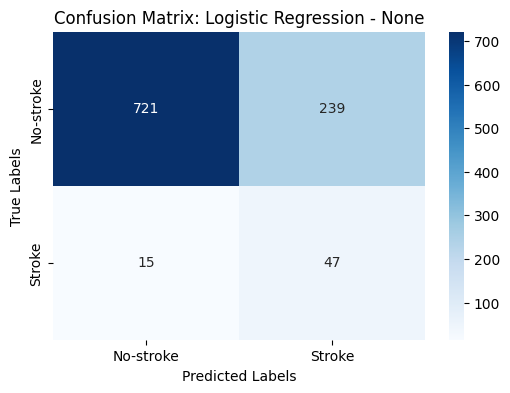

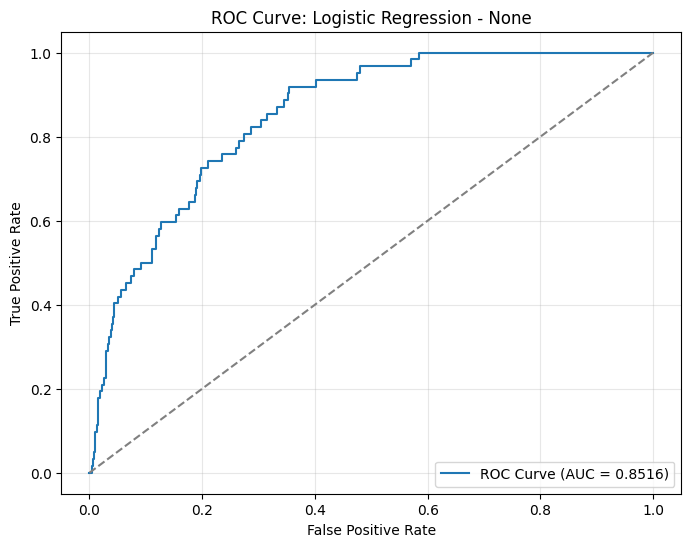


==================== Logistic Regression with SMOTE ====================

Logistic Regression with SMOTE Evaluation Metrics:
Accuracy: 0.7750
Precision: 0.1769
Recall: 0.7419
F1 Score: 0.2857
ROC-AUC Score: 0.8155

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.78      0.87       960
           1       0.18      0.74      0.29        62

    accuracy                           0.77      1022
   macro avg       0.58      0.76      0.58      1022
weighted avg       0.93      0.77      0.83      1022


Confusion Matrix:
[[746 214]
 [ 16  46]]


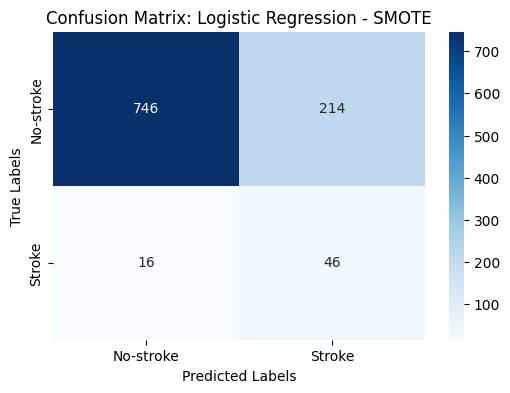

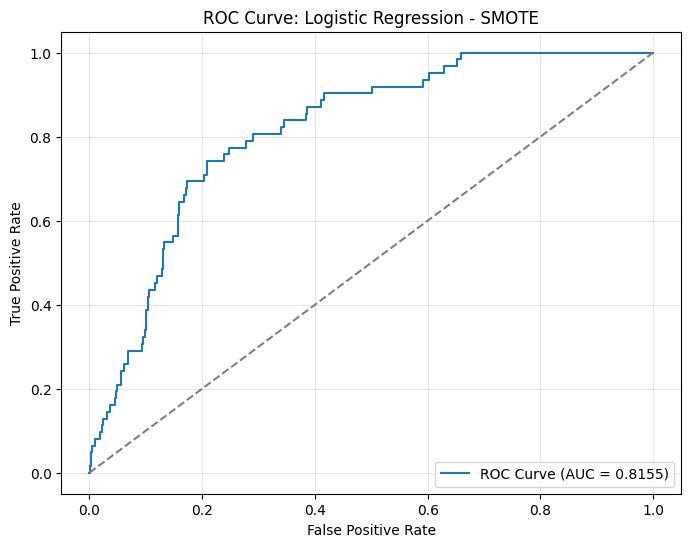


==================== Logistic Regression with ClusterCentroids ====================

Logistic Regression with ClusterCentroids Evaluation Metrics:
Accuracy: 0.4207
Precision: 0.0923
Recall: 0.9677
F1 Score: 0.1685
ROC-AUC Score: 0.7664

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.39      0.56       960
           1       0.09      0.97      0.17        62

    accuracy                           0.42      1022
   macro avg       0.54      0.68      0.36      1022
weighted avg       0.94      0.42      0.53      1022


Confusion Matrix:
[[370 590]
 [  2  60]]


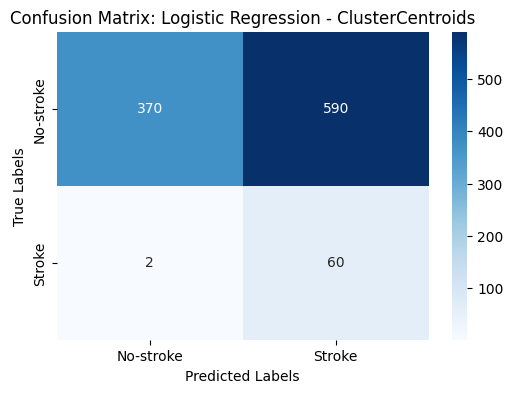

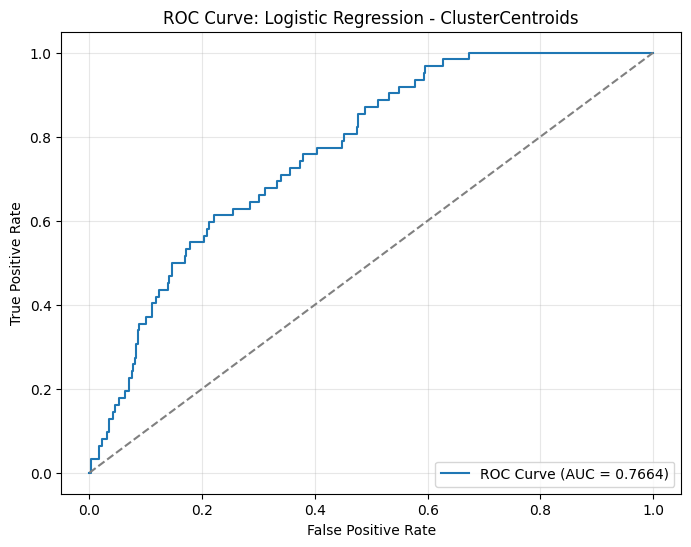


==================== Logistic Regression with Random Undersampling ====================

Logistic Regression with Random Undersampling Evaluation Metrics:
Accuracy: 0.7505
Precision: 0.1614
Recall: 0.7419
F1 Score: 0.2651
ROC-AUC Score: 0.8475

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.75      0.85       960
           1       0.16      0.74      0.27        62

    accuracy                           0.75      1022
   macro avg       0.57      0.75      0.56      1022
weighted avg       0.93      0.75      0.81      1022


Confusion Matrix:
[[721 239]
 [ 16  46]]


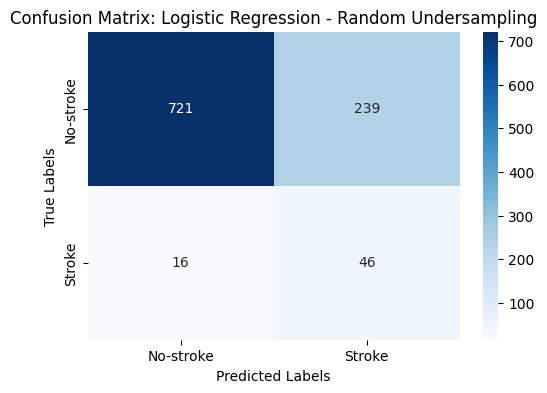

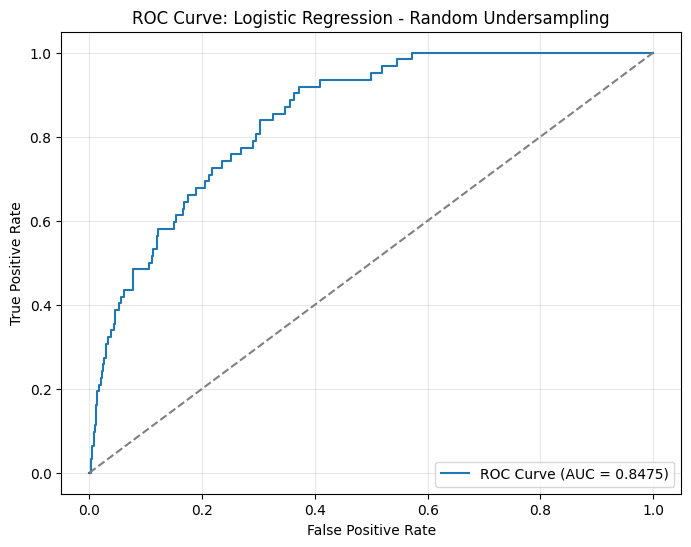


==================== Logistic Regression with NearMiss-1 ====================

Logistic Regression with NearMiss-1 Evaluation Metrics:
Accuracy: 0.2886
Precision: 0.0501
Recall: 0.5968
F1 Score: 0.0924
ROC-AUC Score: 0.4355

Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.27      0.42       960
           1       0.05      0.60      0.09        62

    accuracy                           0.29      1022
   macro avg       0.48      0.43      0.25      1022
weighted avg       0.86      0.29      0.40      1022


Confusion Matrix:
[[258 702]
 [ 25  37]]


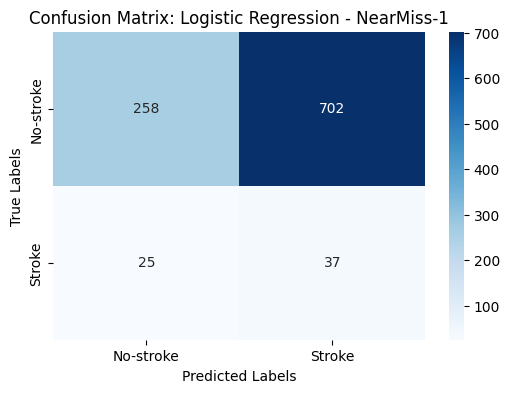

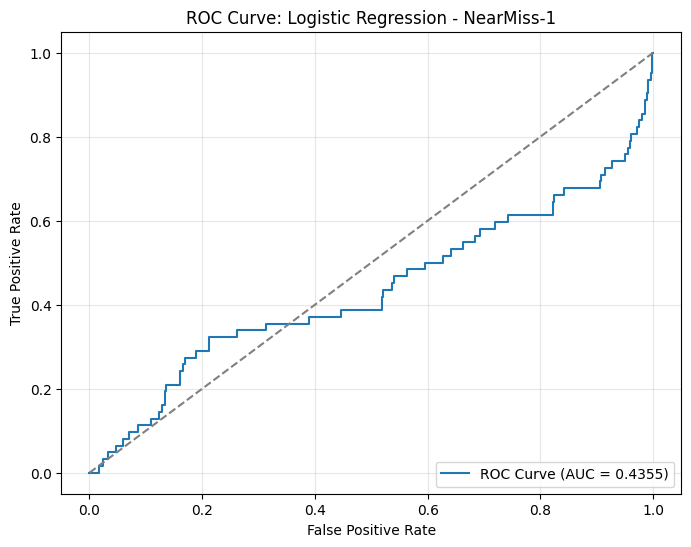


==================== Logistic Regression with NearMiss-2 ====================

Logistic Regression with NearMiss-2 Evaluation Metrics:
Accuracy: 0.6742
Precision: 0.1367
Recall: 0.8226
F1 Score: 0.2345
ROC-AUC Score: 0.7862

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.66      0.79       960
           1       0.14      0.82      0.23        62

    accuracy                           0.67      1022
   macro avg       0.56      0.74      0.51      1022
weighted avg       0.93      0.67      0.76      1022


Confusion Matrix:
[[638 322]
 [ 11  51]]


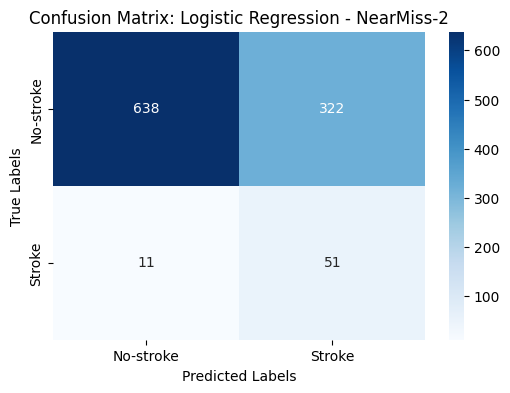

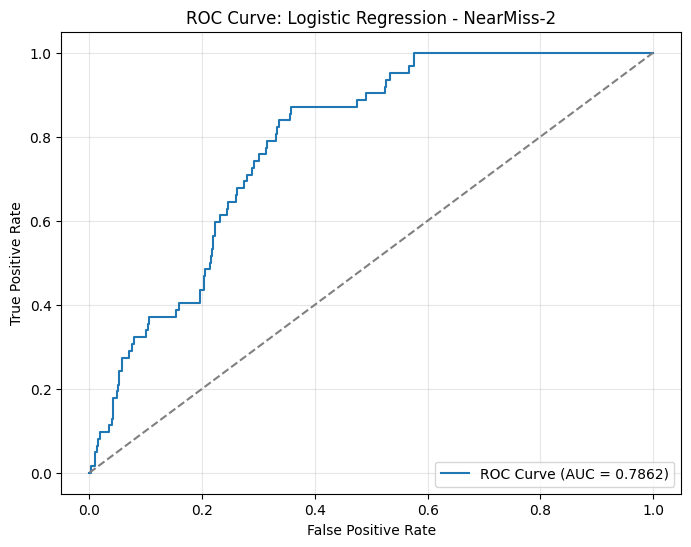


==================== Logistic Regression with NearMiss-3 ====================

Logistic Regression with NearMiss-3 Evaluation Metrics:
Accuracy: 0.7094
Precision: 0.1222
Recall: 0.6129
F1 Score: 0.2038
ROC-AUC Score: 0.7598

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.72      0.82       960
           1       0.12      0.61      0.20        62

    accuracy                           0.71      1022
   macro avg       0.54      0.66      0.51      1022
weighted avg       0.92      0.71      0.78      1022


Confusion Matrix:
[[687 273]
 [ 24  38]]


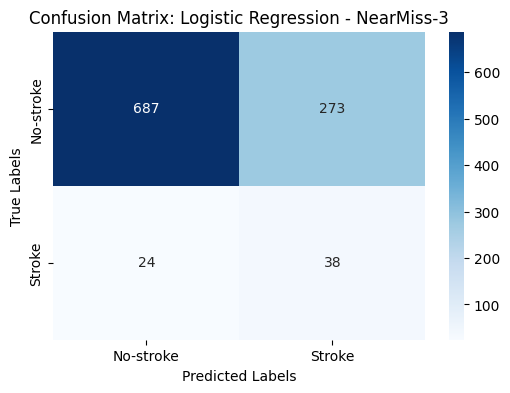

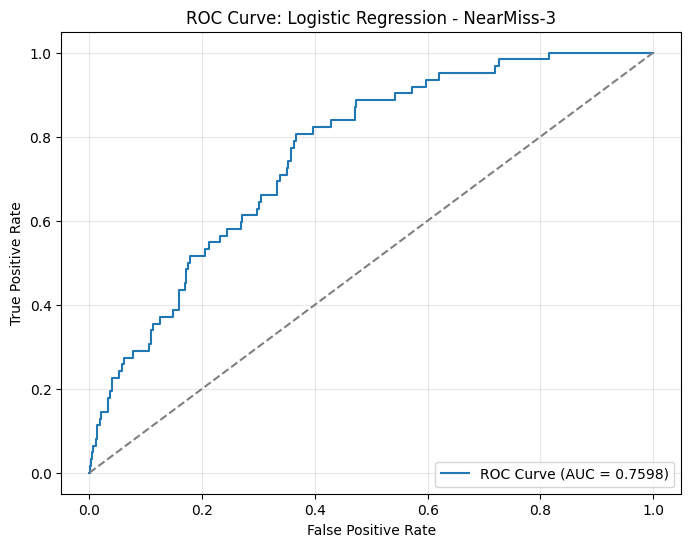


==================== Logistic Regression with Tomek Links ====================

Logistic Regression with Tomek Links Evaluation Metrics:
Accuracy: 0.7495
Precision: 0.1632
Recall: 0.7581
F1 Score: 0.2686
ROC-AUC Score: 0.8515

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.75      0.85       960
           1       0.16      0.76      0.27        62

    accuracy                           0.75      1022
   macro avg       0.57      0.75      0.56      1022
weighted avg       0.93      0.75      0.81      1022


Confusion Matrix:
[[719 241]
 [ 15  47]]


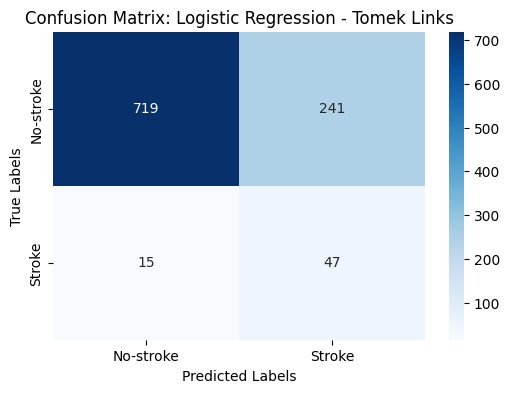

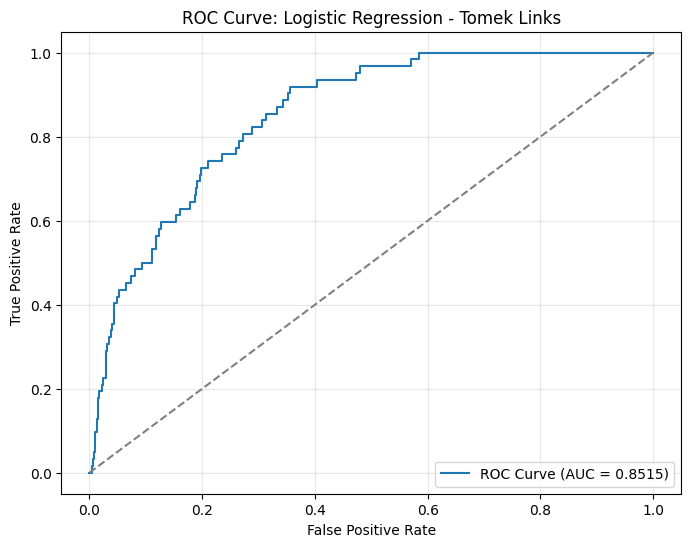


==================== Logistic Regression with Edited Nearest Neighbors (ENN) ====================

Logistic Regression with Edited Nearest Neighbors (ENN) Evaluation Metrics:
Accuracy: 0.7358
Precision: 0.1579
Recall: 0.7742
F1 Score: 0.2623
ROC-AUC Score: 0.8517

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.73      0.84       960
           1       0.16      0.77      0.26        62

    accuracy                           0.74      1022
   macro avg       0.57      0.75      0.55      1022
weighted avg       0.93      0.74      0.80      1022


Confusion Matrix:
[[704 256]
 [ 14  48]]


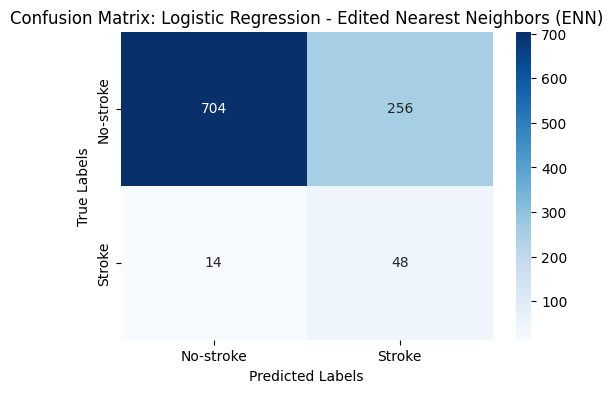

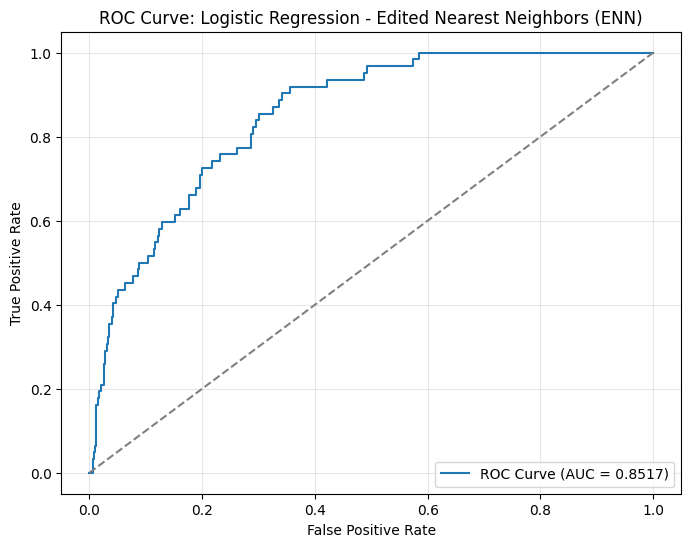


==================== Logistic Regression with Repeated Edited Nearest Neighbors (RENN) ====================

Logistic Regression with Repeated Edited Nearest Neighbors (RENN) Evaluation Metrics:
Accuracy: 0.7172
Precision: 0.1508
Recall: 0.7903
F1 Score: 0.2532
ROC-AUC Score: 0.8515

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.71      0.83       960
           1       0.15      0.79      0.25        62

    accuracy                           0.72      1022
   macro avg       0.57      0.75      0.54      1022
weighted avg       0.93      0.72      0.79      1022


Confusion Matrix:
[[684 276]
 [ 13  49]]


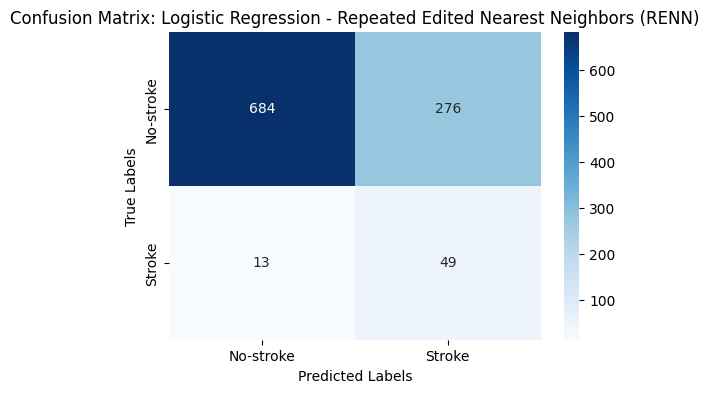

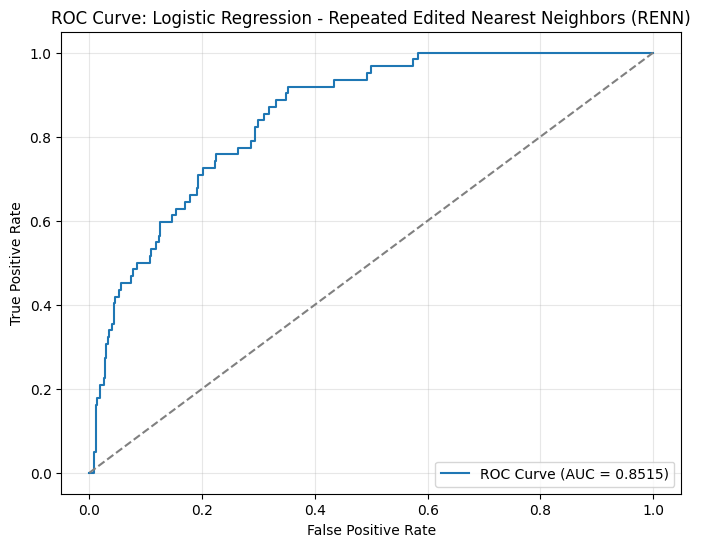


==================== Logistic Regression with All KNN ====================

Logistic Regression with All KNN Evaluation Metrics:
Accuracy: 0.7280
Precision: 0.1538
Recall: 0.7742
F1 Score: 0.2567
ROC-AUC Score: 0.8514

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.72      0.83       960
           1       0.15      0.77      0.26        62

    accuracy                           0.73      1022
   macro avg       0.57      0.75      0.55      1022
weighted avg       0.93      0.73      0.80      1022


Confusion Matrix:
[[696 264]
 [ 14  48]]


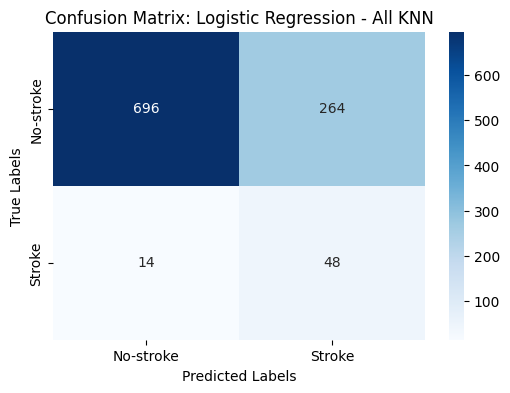

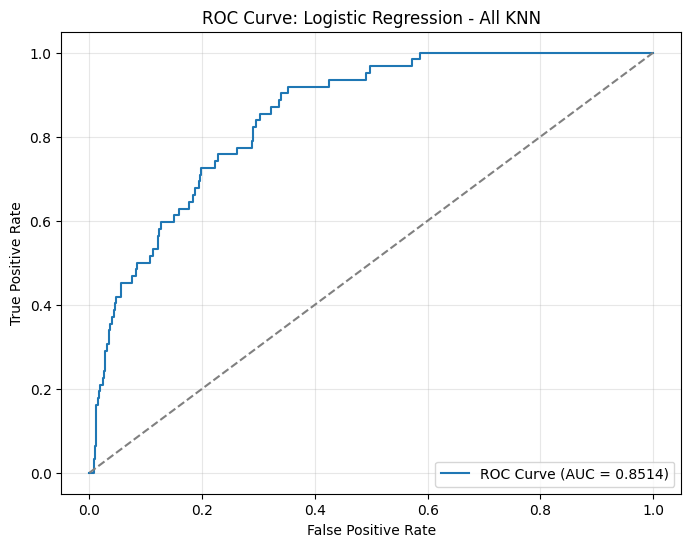


==================== Logistic Regression with Condensed Nearest Neighbor (CNN) ====================

Logistic Regression with Condensed Nearest Neighbor (CNN) Evaluation Metrics:
Accuracy: 0.8317
Precision: 0.1978
Recall: 0.5806
F1 Score: 0.2951
ROC-AUC Score: 0.8142

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.85      0.90       960
           1       0.20      0.58      0.30        62

    accuracy                           0.83      1022
   macro avg       0.58      0.71      0.60      1022
weighted avg       0.92      0.83      0.87      1022


Confusion Matrix:
[[814 146]
 [ 26  36]]


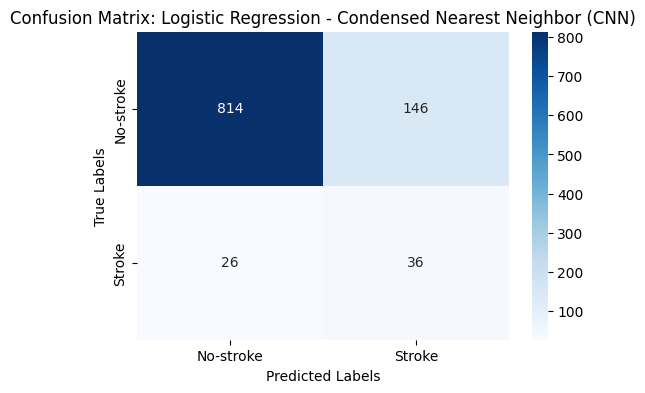

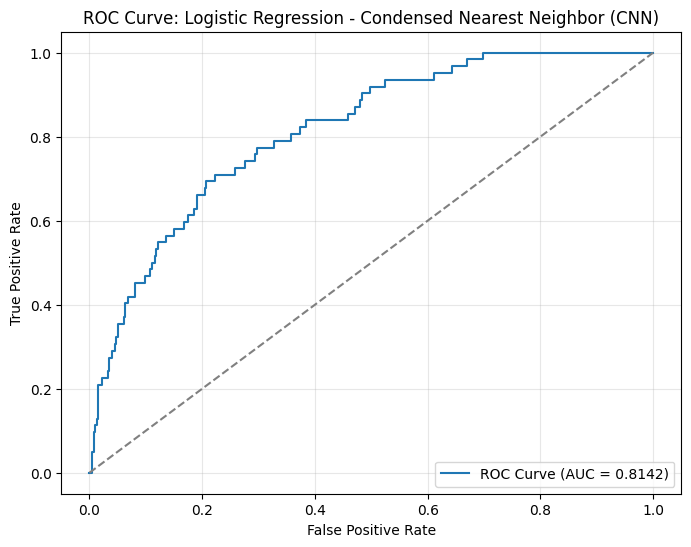


==================== Logistic Regression with One-Sided Selection (OSS) ====================

Logistic Regression with One-Sided Selection (OSS) Evaluation Metrics:
Accuracy: 0.7495
Precision: 0.1632
Recall: 0.7581
F1 Score: 0.2686
ROC-AUC Score: 0.8513

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.75      0.85       960
           1       0.16      0.76      0.27        62

    accuracy                           0.75      1022
   macro avg       0.57      0.75      0.56      1022
weighted avg       0.93      0.75      0.81      1022


Confusion Matrix:
[[719 241]
 [ 15  47]]


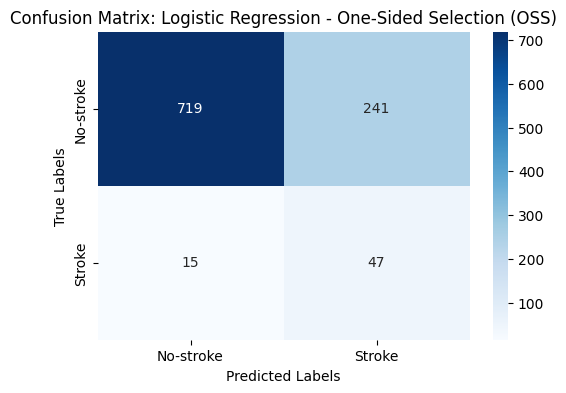

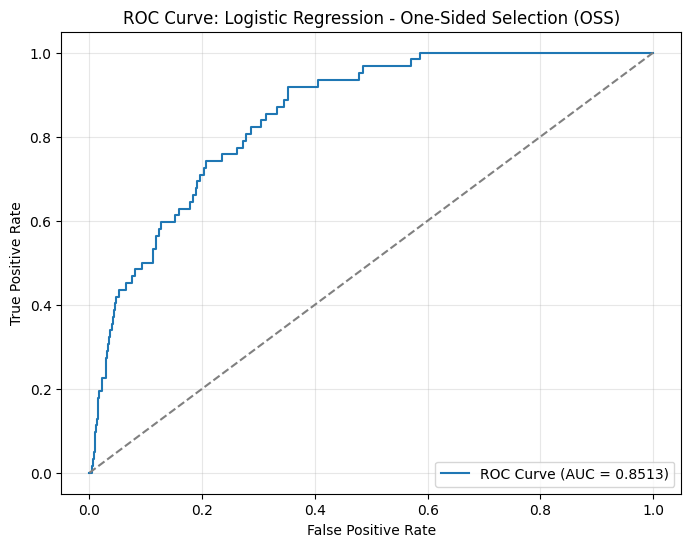


==================== Logistic Regression with Neighborhood Cleaning Rule (NCR) ====================

Logistic Regression with Neighborhood Cleaning Rule (NCR) Evaluation Metrics:
Accuracy: 0.7397
Precision: 0.1600
Recall: 0.7742
F1 Score: 0.2652
ROC-AUC Score: 0.8511

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.74      0.84       960
           1       0.16      0.77      0.27        62

    accuracy                           0.74      1022
   macro avg       0.57      0.76      0.55      1022
weighted avg       0.93      0.74      0.81      1022


Confusion Matrix:
[[708 252]
 [ 14  48]]


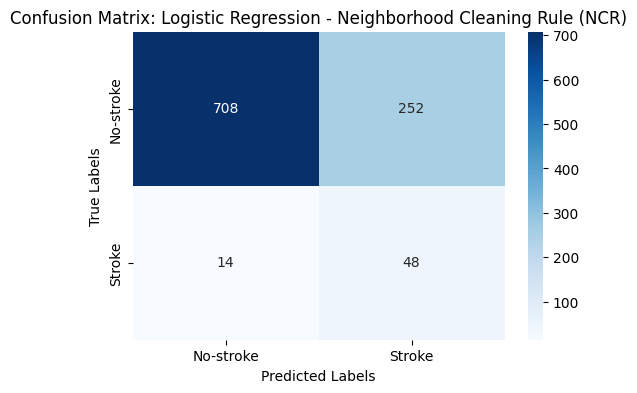

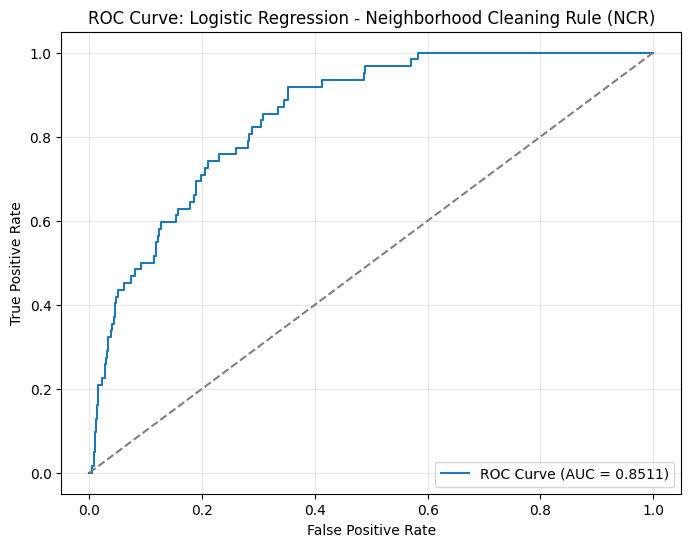


==================== Logistic Regression with Instance Hardness Threshold ====================

Logistic Regression with Instance Hardness Threshold Evaluation Metrics:
Accuracy: 0.6341
Precision: 0.1338
Recall: 0.9194
F1 Score: 0.2336
ROC-AUC Score: 0.8455

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.62      0.76       960
           1       0.13      0.92      0.23        62

    accuracy                           0.63      1022
   macro avg       0.56      0.77      0.50      1022
weighted avg       0.94      0.63      0.73      1022


Confusion Matrix:
[[591 369]
 [  5  57]]


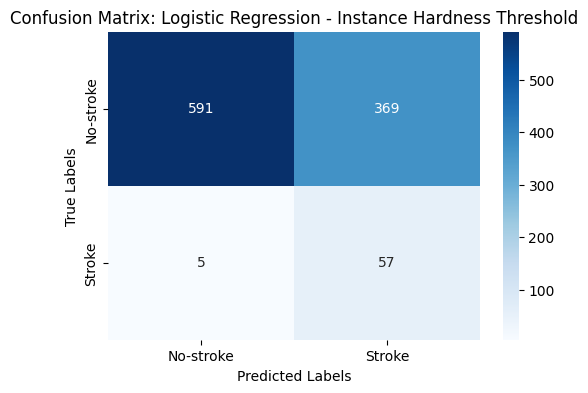

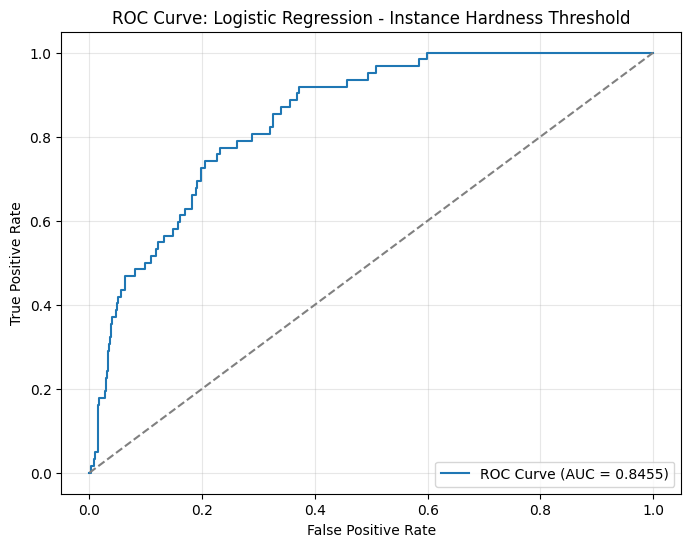


==================== SVM with None ====================

SVM with None Evaluation Metrics:
Accuracy: 0.7436
Precision: 0.1599
Recall: 0.7581
F1 Score: 0.2640
ROC-AUC Score: 0.8016

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.74      0.84       960
           1       0.16      0.76      0.26        62

    accuracy                           0.74      1022
   macro avg       0.57      0.75      0.55      1022
weighted avg       0.93      0.74      0.81      1022


Confusion Matrix:
[[713 247]
 [ 15  47]]


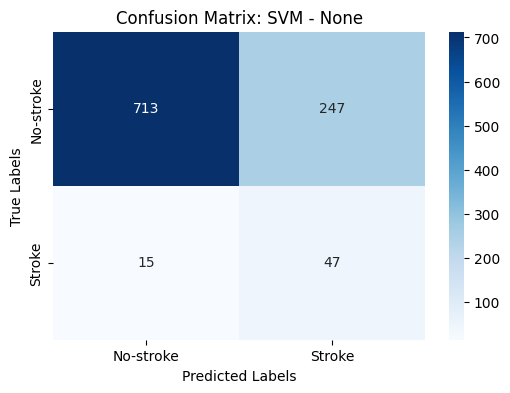

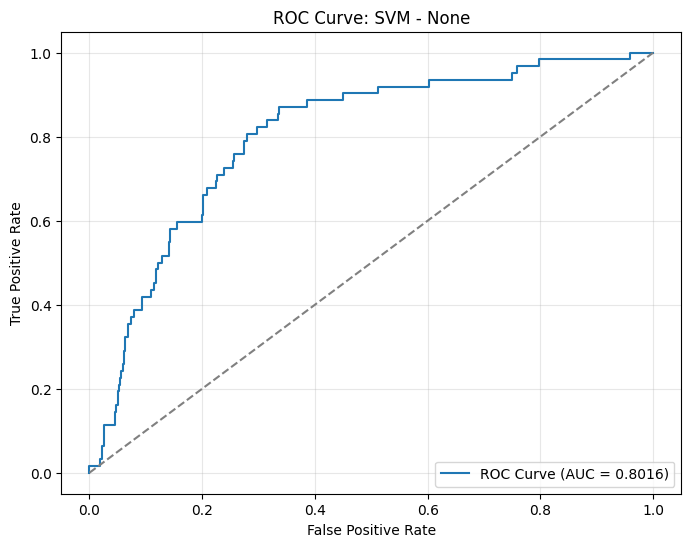


==================== SVM with SMOTE ====================

SVM with SMOTE Evaluation Metrics:
Accuracy: 0.7838
Precision: 0.1528
Recall: 0.5645
F1 Score: 0.2405
ROC-AUC Score: 0.7741

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.80      0.87       960
           1       0.15      0.56      0.24        62

    accuracy                           0.78      1022
   macro avg       0.56      0.68      0.56      1022
weighted avg       0.92      0.78      0.84      1022


Confusion Matrix:
[[766 194]
 [ 27  35]]


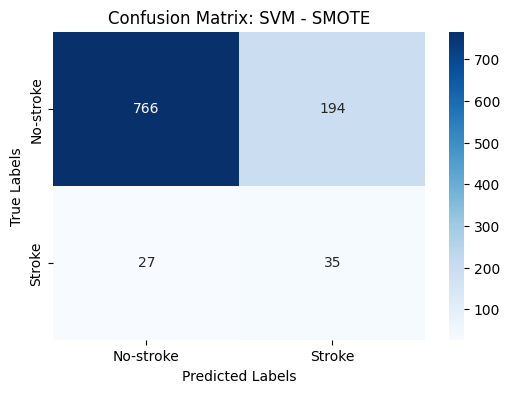

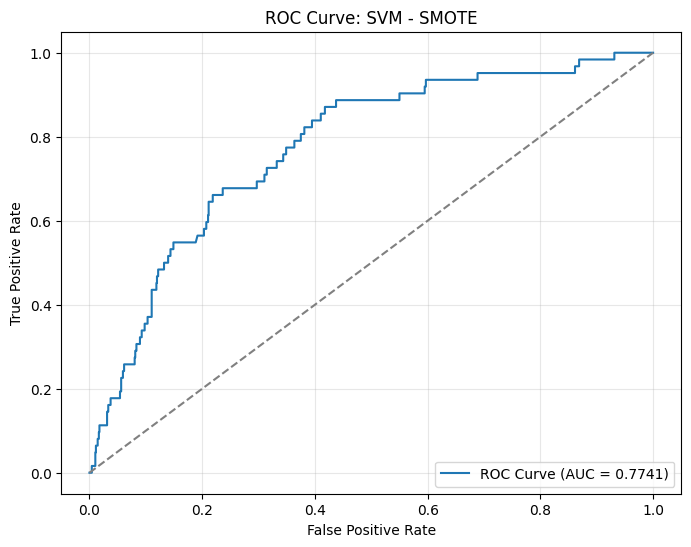


==================== SVM with ClusterCentroids ====================

SVM with ClusterCentroids Evaluation Metrics:
Accuracy: 0.3933
Precision: 0.0873
Recall: 0.9516
F1 Score: 0.1599
ROC-AUC Score: 0.7201

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.36      0.53       960
           1       0.09      0.95      0.16        62

    accuracy                           0.39      1022
   macro avg       0.54      0.65      0.34      1022
weighted avg       0.94      0.39      0.50      1022


Confusion Matrix:
[[343 617]
 [  3  59]]


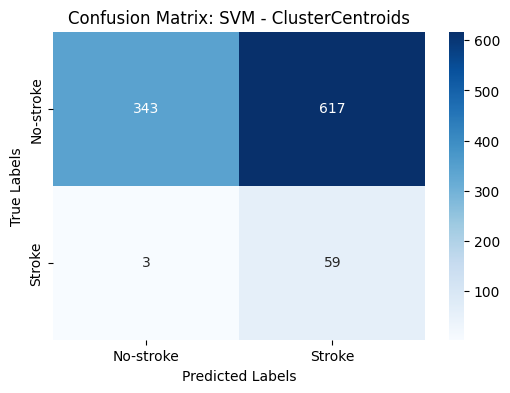

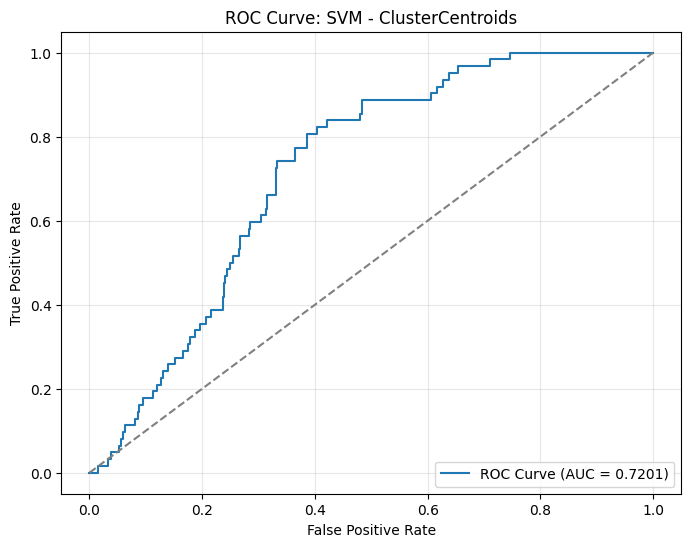


==================== SVM with Random Undersampling ====================

SVM with Random Undersampling Evaluation Metrics:
Accuracy: 0.7133
Precision: 0.1489
Recall: 0.7903
F1 Score: 0.2506
ROC-AUC Score: 0.8205

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.71      0.82       960
           1       0.15      0.79      0.25        62

    accuracy                           0.71      1022
   macro avg       0.57      0.75      0.54      1022
weighted avg       0.93      0.71      0.79      1022


Confusion Matrix:
[[680 280]
 [ 13  49]]


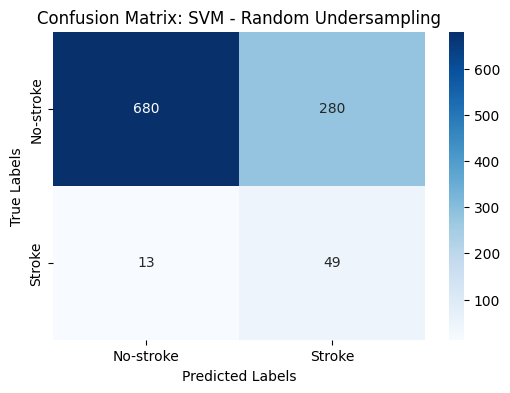

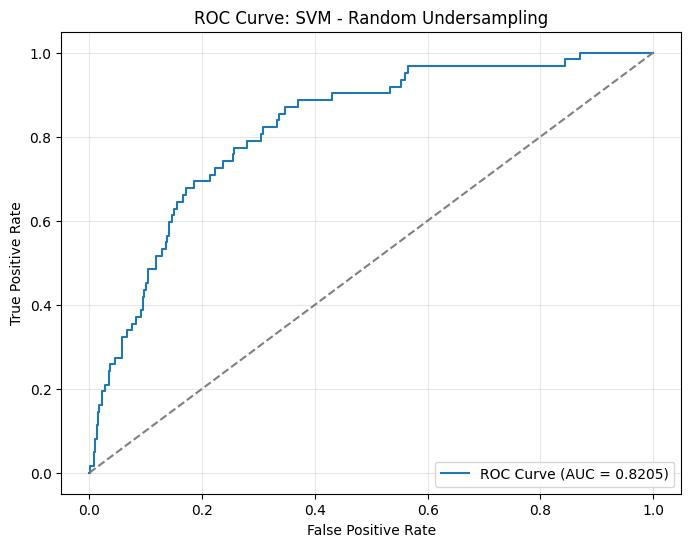


==================== SVM with NearMiss-1 ====================

SVM with NearMiss-1 Evaluation Metrics:
Accuracy: 0.2701
Precision: 0.0476
Recall: 0.5806
F1 Score: 0.0880
ROC-AUC Score: 0.3769

Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.25      0.39       960
           1       0.05      0.58      0.09        62

    accuracy                           0.27      1022
   macro avg       0.47      0.42      0.24      1022
weighted avg       0.85      0.27      0.37      1022


Confusion Matrix:
[[240 720]
 [ 26  36]]


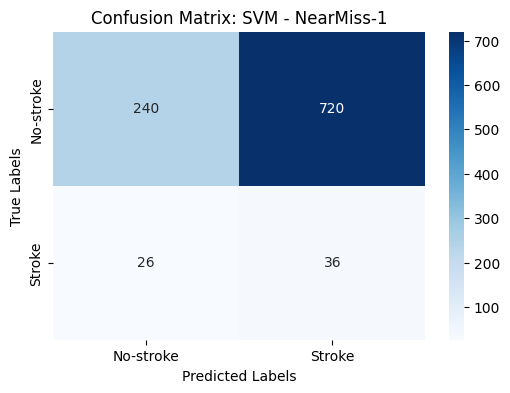

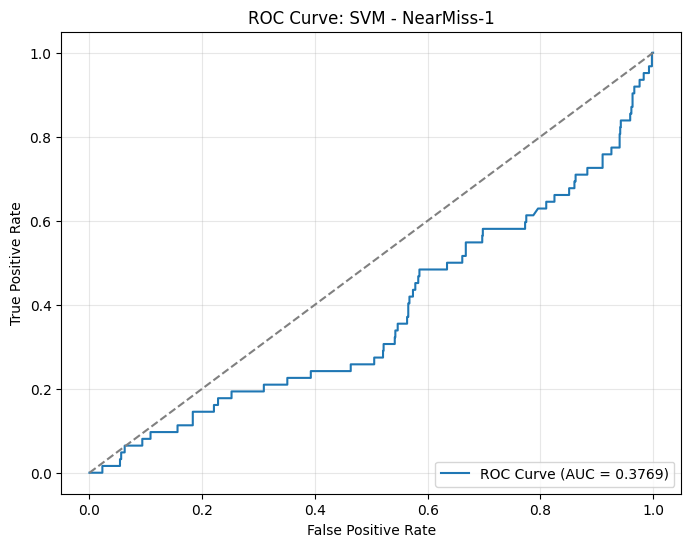


==================== SVM with NearMiss-2 ====================

SVM with NearMiss-2 Evaluation Metrics:
Accuracy: 0.2701
Precision: 0.0725
Recall: 0.9355
F1 Score: 0.1346
ROC-AUC Score: 0.7063

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.23      0.37       960
           1       0.07      0.94      0.13        62

    accuracy                           0.27      1022
   macro avg       0.53      0.58      0.25      1022
weighted avg       0.93      0.27      0.35      1022


Confusion Matrix:
[[218 742]
 [  4  58]]


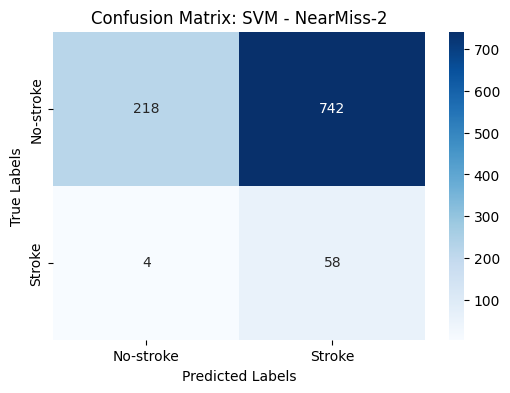

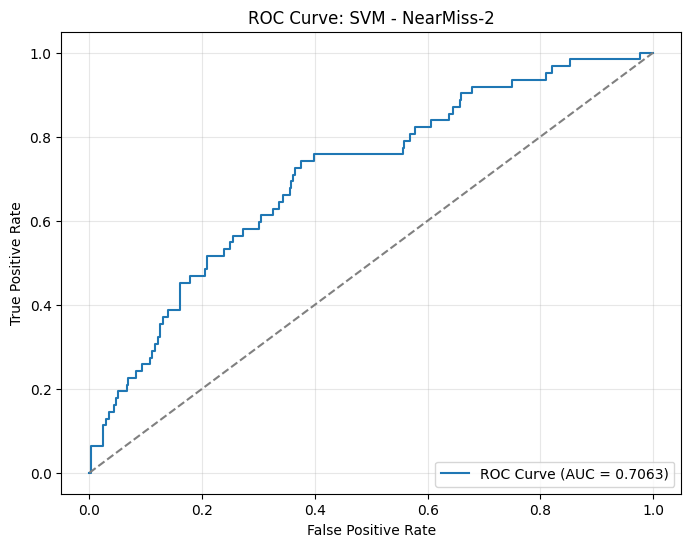


==================== SVM with NearMiss-3 ====================

SVM with NearMiss-3 Evaluation Metrics:
Accuracy: 0.7182
Precision: 0.1258
Recall: 0.6129
F1 Score: 0.2088
ROC-AUC Score: 0.6849

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.72      0.83       960
           1       0.13      0.61      0.21        62

    accuracy                           0.72      1022
   macro avg       0.55      0.67      0.52      1022
weighted avg       0.92      0.72      0.79      1022


Confusion Matrix:
[[696 264]
 [ 24  38]]


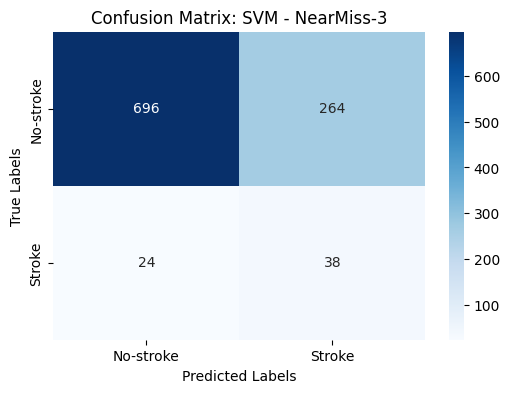

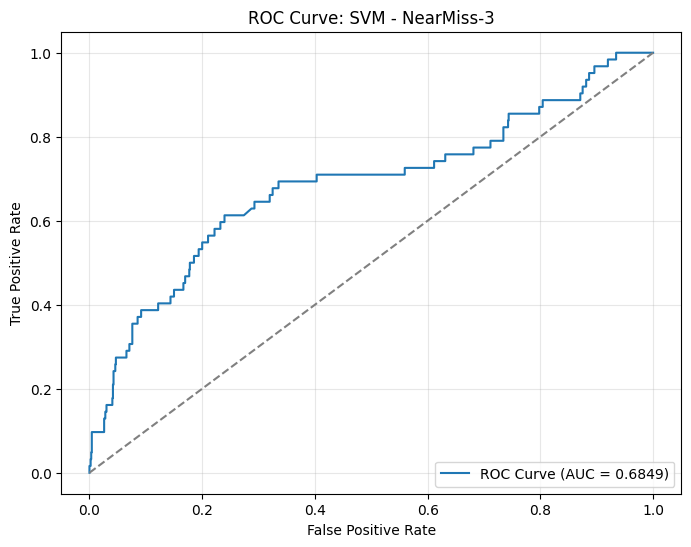


==================== SVM with Tomek Links ====================

SVM with Tomek Links Evaluation Metrics:
Accuracy: 0.7446
Precision: 0.1604
Recall: 0.7581
F1 Score: 0.2648
ROC-AUC Score: 0.8023

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.74      0.85       960
           1       0.16      0.76      0.26        62

    accuracy                           0.74      1022
   macro avg       0.57      0.75      0.56      1022
weighted avg       0.93      0.74      0.81      1022


Confusion Matrix:
[[714 246]
 [ 15  47]]


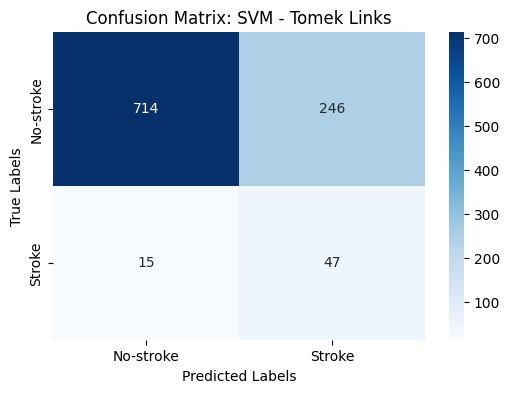

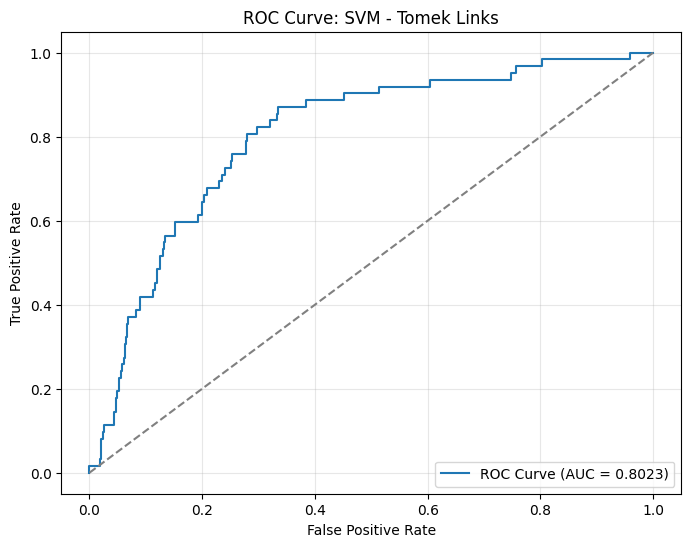


==================== SVM with Edited Nearest Neighbors (ENN) ====================

SVM with Edited Nearest Neighbors (ENN) Evaluation Metrics:
Accuracy: 0.7387
Precision: 0.1595
Recall: 0.7742
F1 Score: 0.2645
ROC-AUC Score: 0.8009

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.74      0.84       960
           1       0.16      0.77      0.26        62

    accuracy                           0.74      1022
   macro avg       0.57      0.76      0.55      1022
weighted avg       0.93      0.74      0.81      1022


Confusion Matrix:
[[707 253]
 [ 14  48]]


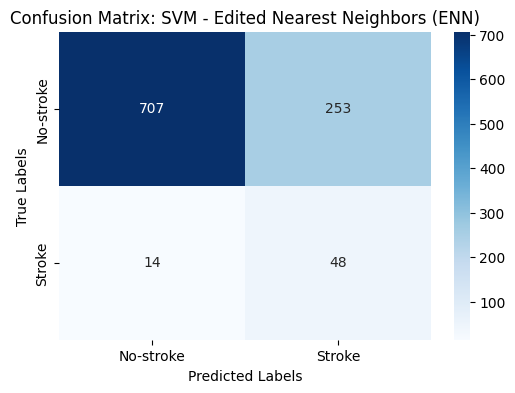

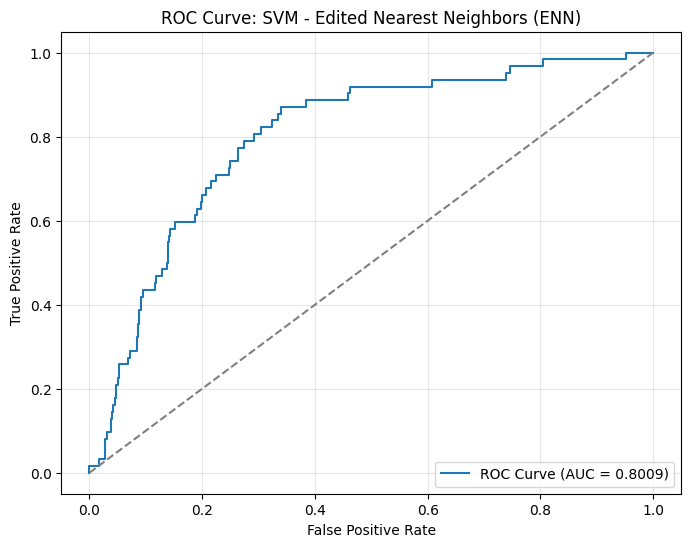


==================== SVM with Repeated Edited Nearest Neighbors (RENN) ====================

SVM with Repeated Edited Nearest Neighbors (RENN) Evaluation Metrics:
Accuracy: 0.7456
Precision: 0.1586
Recall: 0.7419
F1 Score: 0.2614
ROC-AUC Score: 0.8019

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.75      0.85       960
           1       0.16      0.74      0.26        62

    accuracy                           0.75      1022
   macro avg       0.57      0.74      0.55      1022
weighted avg       0.93      0.75      0.81      1022


Confusion Matrix:
[[716 244]
 [ 16  46]]


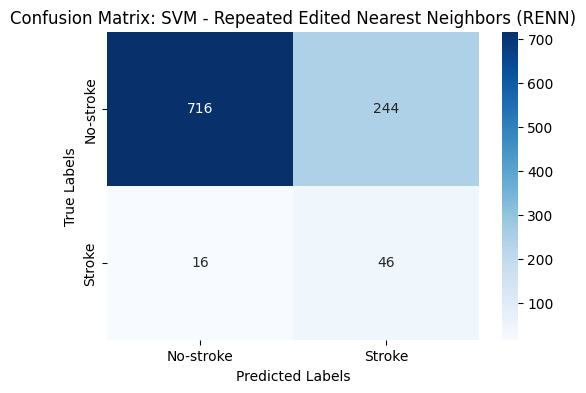

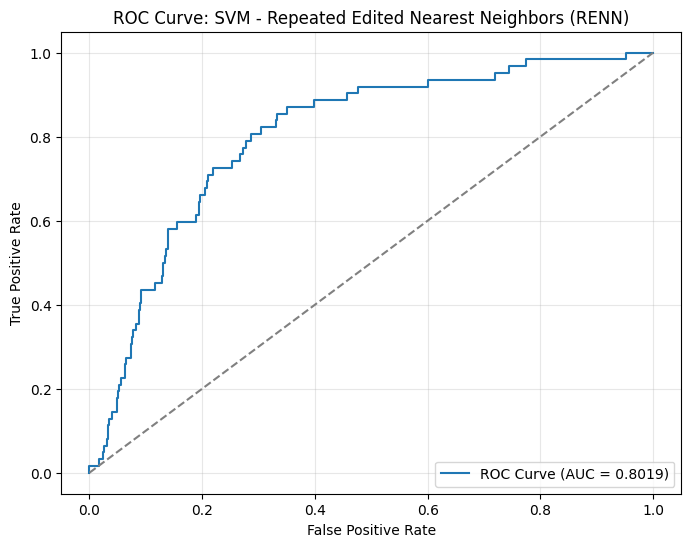


==================== SVM with All KNN ====================

SVM with All KNN Evaluation Metrics:
Accuracy: 0.7407
Precision: 0.1559
Recall: 0.7419
F1 Score: 0.2577
ROC-AUC Score: 0.8009

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.74      0.84       960
           1       0.16      0.74      0.26        62

    accuracy                           0.74      1022
   macro avg       0.57      0.74      0.55      1022
weighted avg       0.93      0.74      0.81      1022


Confusion Matrix:
[[711 249]
 [ 16  46]]


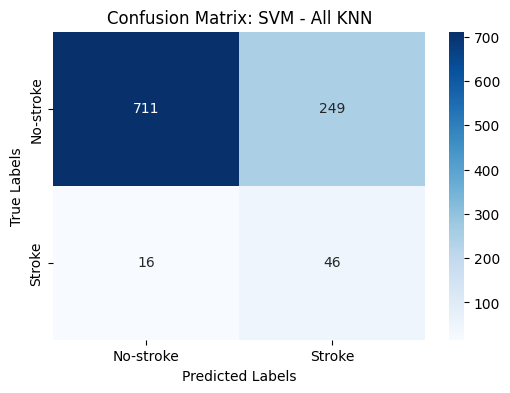

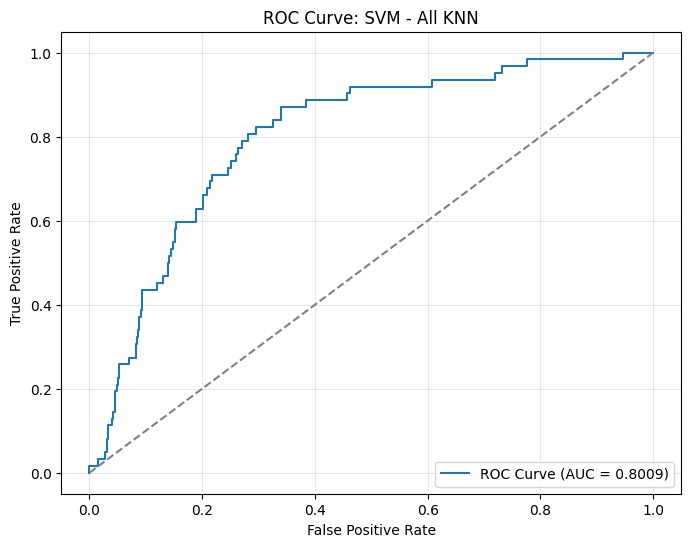


==================== SVM with Condensed Nearest Neighbor (CNN) ====================

SVM with Condensed Nearest Neighbor (CNN) Evaluation Metrics:
Accuracy: 0.8151
Precision: 0.1809
Recall: 0.5806
F1 Score: 0.2759
ROC-AUC Score: 0.7582

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.83      0.89       960
           1       0.18      0.58      0.28        62

    accuracy                           0.82      1022
   macro avg       0.57      0.71      0.58      1022
weighted avg       0.92      0.82      0.86      1022


Confusion Matrix:
[[797 163]
 [ 26  36]]


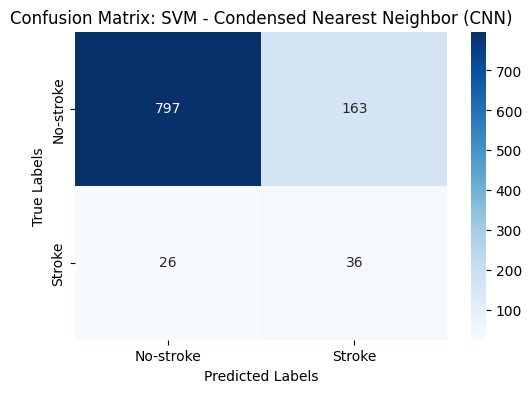

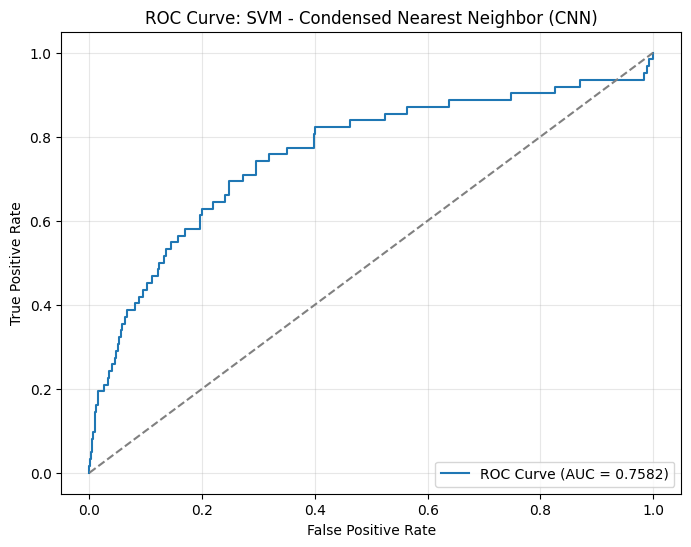


==================== SVM with One-Sided Selection (OSS) ====================

SVM with One-Sided Selection (OSS) Evaluation Metrics:
Accuracy: 0.7485
Precision: 0.1603
Recall: 0.7419
F1 Score: 0.2636
ROC-AUC Score: 0.8026

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.75      0.85       960
           1       0.16      0.74      0.26        62

    accuracy                           0.75      1022
   macro avg       0.57      0.75      0.56      1022
weighted avg       0.93      0.75      0.81      1022


Confusion Matrix:
[[719 241]
 [ 16  46]]


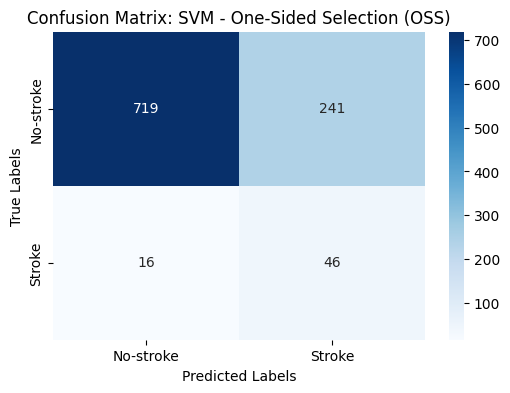

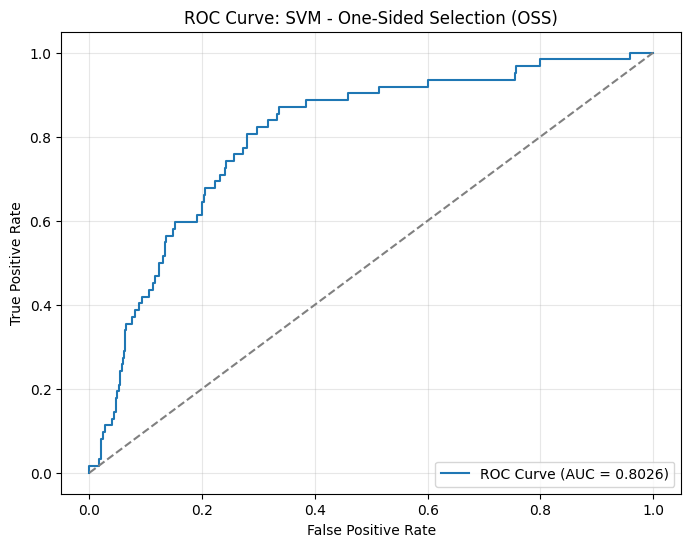


==================== SVM with Neighborhood Cleaning Rule (NCR) ====================

SVM with Neighborhood Cleaning Rule (NCR) Evaluation Metrics:
Accuracy: 0.7358
Precision: 0.1556
Recall: 0.7581
F1 Score: 0.2582
ROC-AUC Score: 0.8012

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.73      0.84       960
           1       0.16      0.76      0.26        62

    accuracy                           0.74      1022
   macro avg       0.57      0.75      0.55      1022
weighted avg       0.93      0.74      0.80      1022


Confusion Matrix:
[[705 255]
 [ 15  47]]


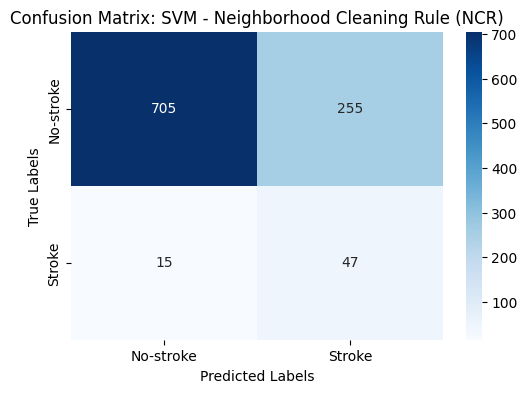

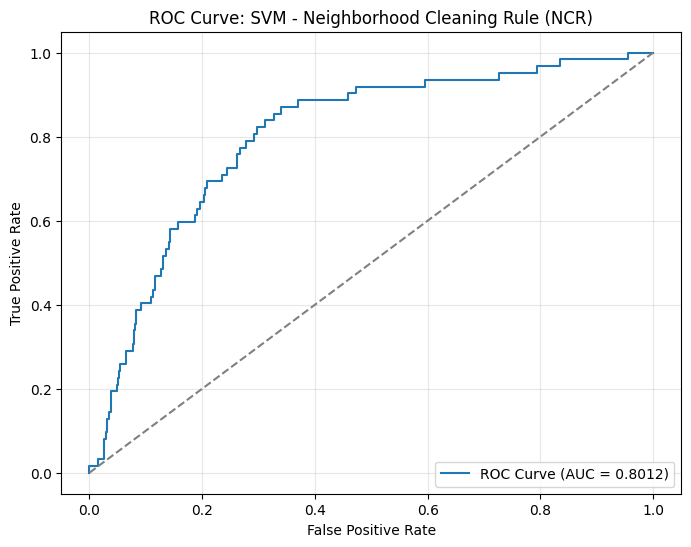


==================== SVM with Instance Hardness Threshold ====================

SVM with Instance Hardness Threshold Evaluation Metrics:
Accuracy: 0.6536
Precision: 0.1313
Recall: 0.8387
F1 Score: 0.2271
ROC-AUC Score: 0.7872

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.64      0.78       960
           1       0.13      0.84      0.23        62

    accuracy                           0.65      1022
   macro avg       0.56      0.74      0.50      1022
weighted avg       0.93      0.65      0.74      1022


Confusion Matrix:
[[616 344]
 [ 10  52]]


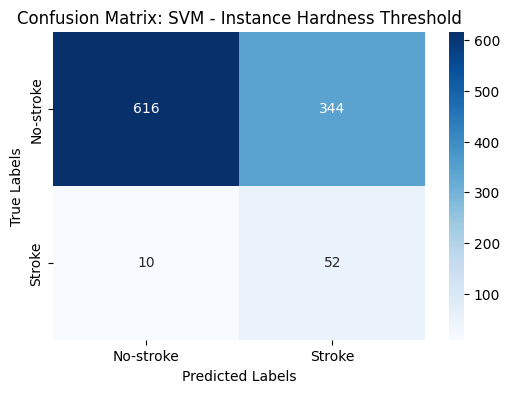

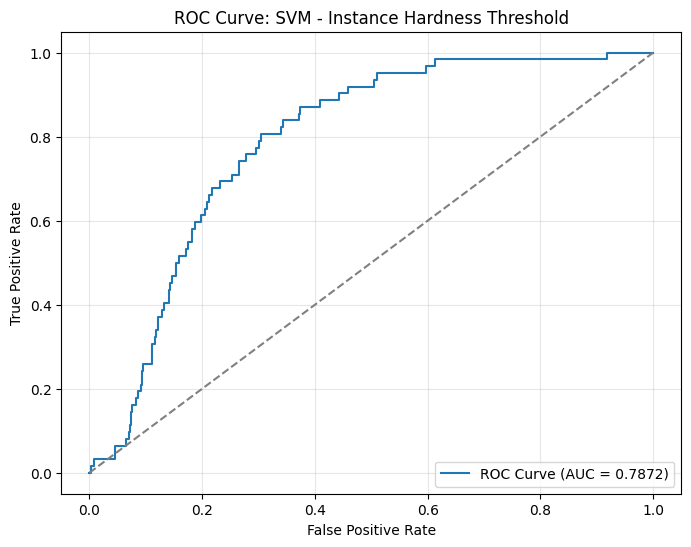


==================== Decision Tree with None ====================

Decision Tree with None Evaluation Metrics:
Accuracy: 0.9149
Precision: 0.1429
Recall: 0.0806
F1 Score: 0.1031
ROC-AUC Score: 0.5247

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.97      0.96       960
           1       0.14      0.08      0.10        62

    accuracy                           0.91      1022
   macro avg       0.54      0.52      0.53      1022
weighted avg       0.89      0.91      0.90      1022


Confusion Matrix:
[[930  30]
 [ 57   5]]


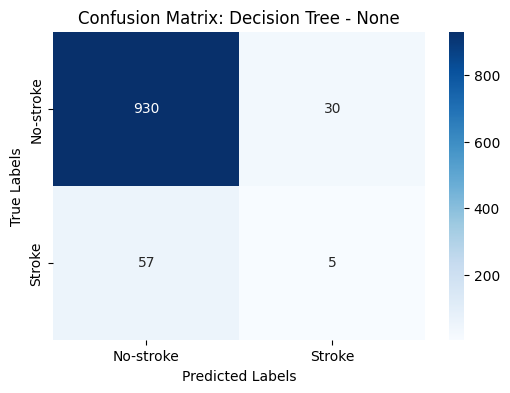

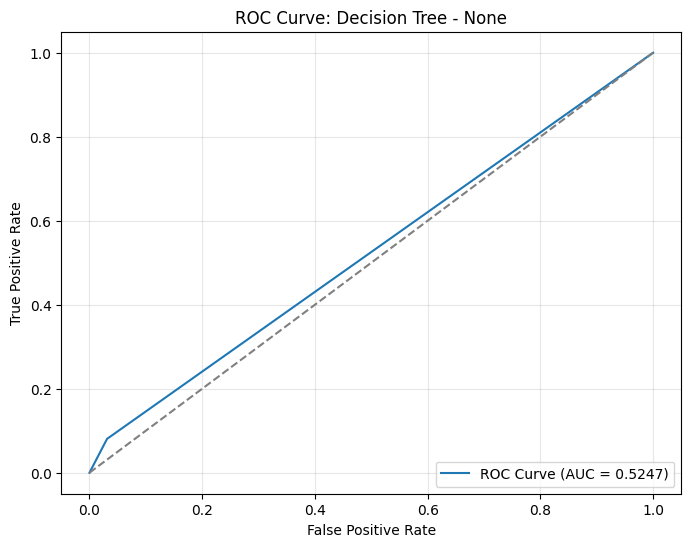


==================== Decision Tree with SMOTE ====================

Decision Tree with SMOTE Evaluation Metrics:
Accuracy: 0.8708
Precision: 0.1635
Recall: 0.2742
F1 Score: 0.2048
ROC-AUC Score: 0.5918

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.91      0.93       960
           1       0.16      0.27      0.20        62

    accuracy                           0.87      1022
   macro avg       0.56      0.59      0.57      1022
weighted avg       0.90      0.87      0.89      1022


Confusion Matrix:
[[873  87]
 [ 45  17]]


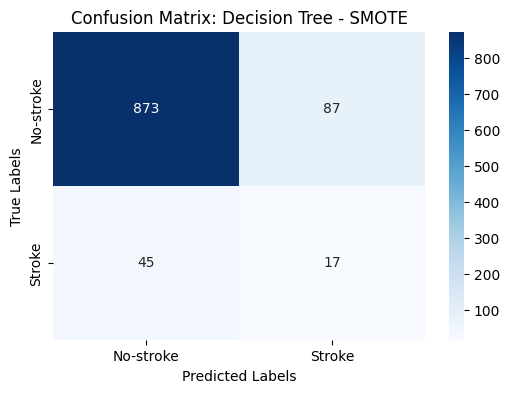

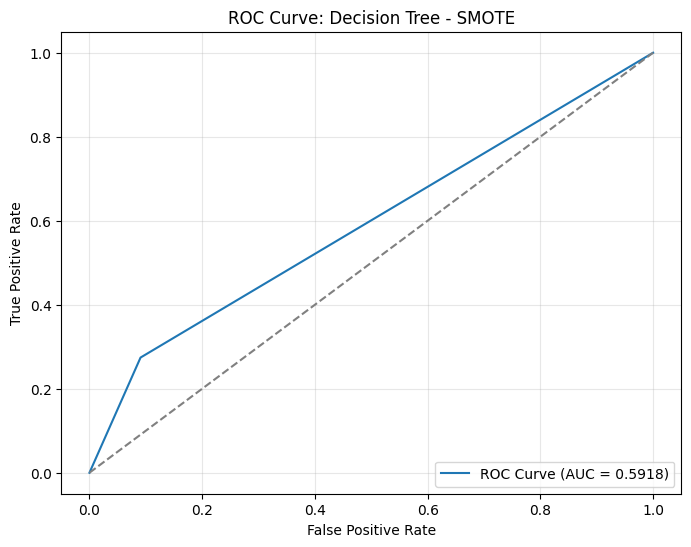


==================== Decision Tree with ClusterCentroids ====================

Decision Tree with ClusterCentroids Evaluation Metrics:
Accuracy: 0.4051
Precision: 0.0800
Recall: 0.8387
F1 Score: 0.1461
ROC-AUC Score: 0.6079

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.38      0.54       960
           1       0.08      0.84      0.15        62

    accuracy                           0.41      1022
   macro avg       0.53      0.61      0.34      1022
weighted avg       0.92      0.41      0.52      1022


Confusion Matrix:
[[362 598]
 [ 10  52]]


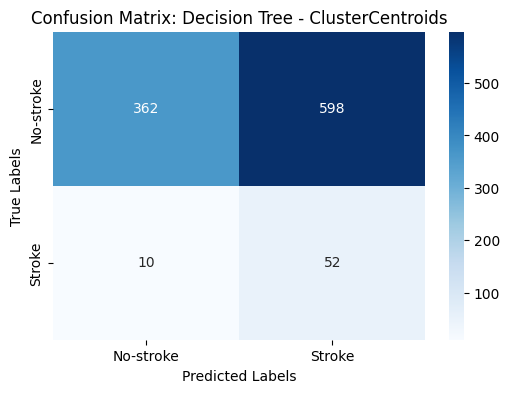

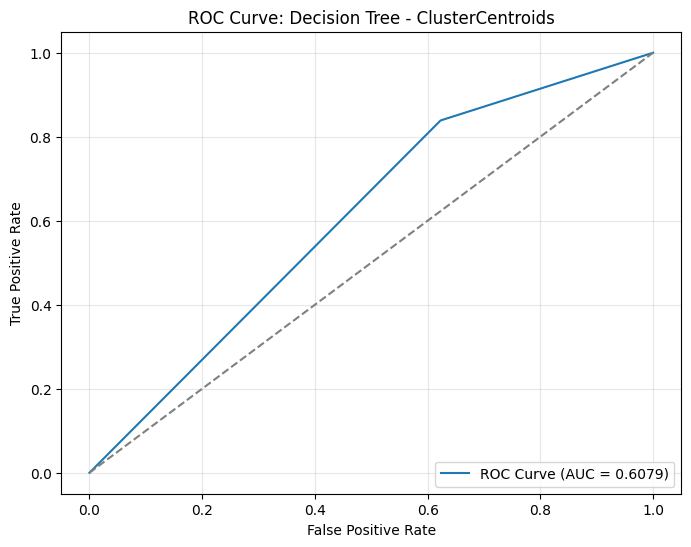


==================== Decision Tree with Random Undersampling ====================

Decision Tree with Random Undersampling Evaluation Metrics:
Accuracy: 0.7016
Precision: 0.1238
Recall: 0.6452
F1 Score: 0.2078
ROC-AUC Score: 0.6752

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.71      0.82       960
           1       0.12      0.65      0.21        62

    accuracy                           0.70      1022
   macro avg       0.55      0.68      0.51      1022
weighted avg       0.92      0.70      0.78      1022


Confusion Matrix:
[[677 283]
 [ 22  40]]


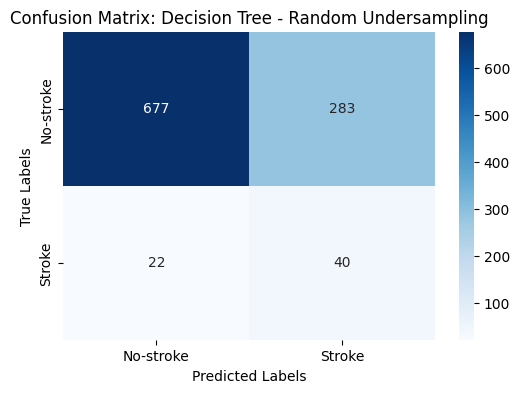

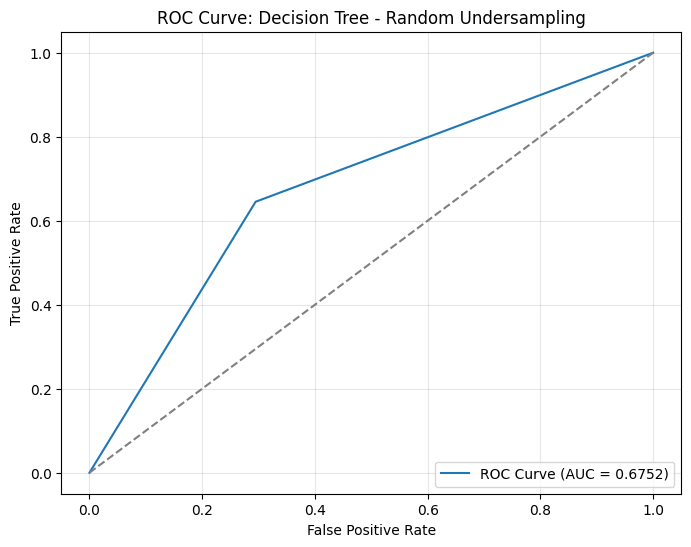


==================== Decision Tree with NearMiss-1 ====================

Decision Tree with NearMiss-1 Evaluation Metrics:
Accuracy: 0.2172
Precision: 0.0478
Recall: 0.6290
F1 Score: 0.0888
ROC-AUC Score: 0.4098

Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.19      0.31       960
           1       0.05      0.63      0.09        62

    accuracy                           0.22      1022
   macro avg       0.47      0.41      0.20      1022
weighted avg       0.84      0.22      0.30      1022


Confusion Matrix:
[[183 777]
 [ 23  39]]


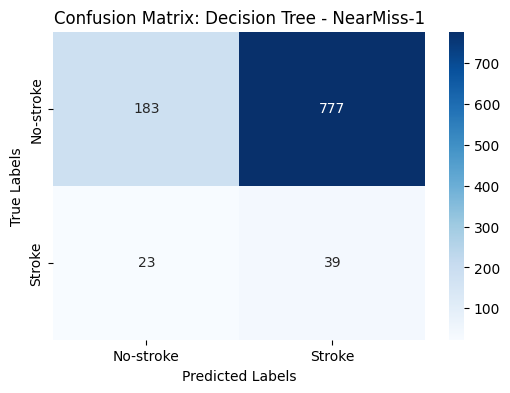

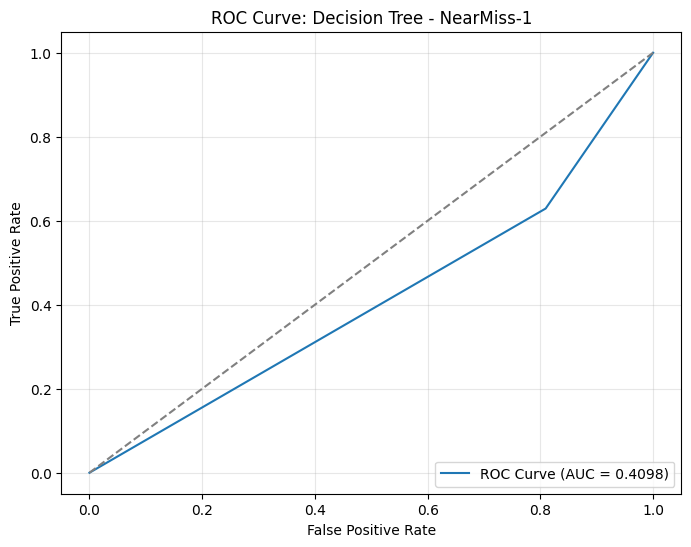


==================== Decision Tree with NearMiss-2 ====================

Decision Tree with NearMiss-2 Evaluation Metrics:
Accuracy: 0.1115
Precision: 0.0621
Recall: 0.9677
F1 Score: 0.1167
ROC-AUC Score: 0.5120

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.06      0.11       960
           1       0.06      0.97      0.12        62

    accuracy                           0.11      1022
   macro avg       0.51      0.51      0.11      1022
weighted avg       0.91      0.11      0.11      1022


Confusion Matrix:
[[ 54 906]
 [  2  60]]


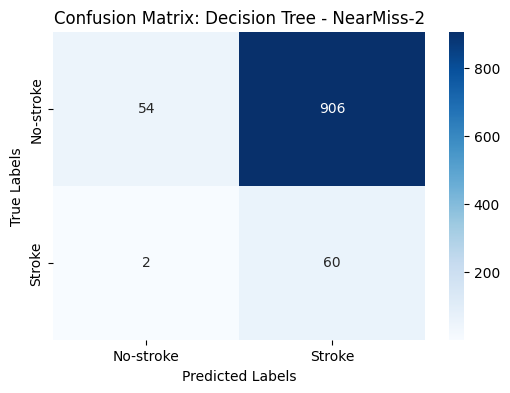

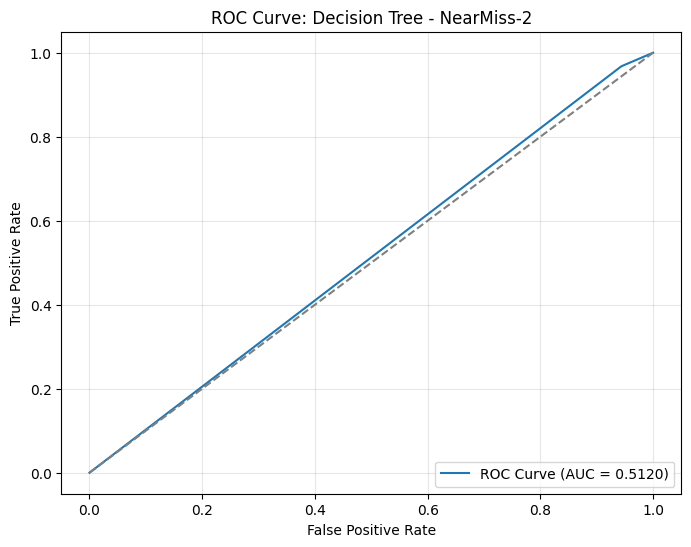


==================== Decision Tree with NearMiss-3 ====================

Decision Tree with NearMiss-3 Evaluation Metrics:
Accuracy: 0.6164
Precision: 0.0875
Recall: 0.5645
F1 Score: 0.1515
ROC-AUC Score: 0.5922

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.62      0.75       960
           1       0.09      0.56      0.15        62

    accuracy                           0.62      1022
   macro avg       0.52      0.59      0.45      1022
weighted avg       0.90      0.62      0.72      1022


Confusion Matrix:
[[595 365]
 [ 27  35]]


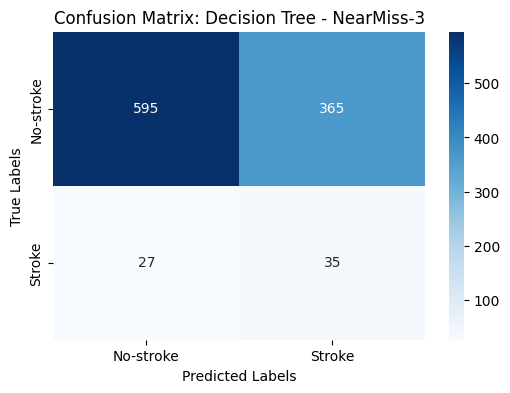

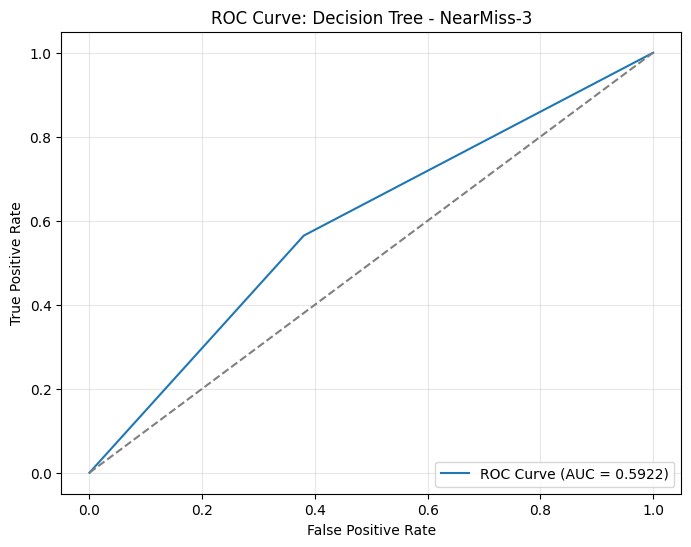


==================== Decision Tree with Tomek Links ====================

Decision Tree with Tomek Links Evaluation Metrics:
Accuracy: 0.9002
Precision: 0.1296
Recall: 0.1129
F1 Score: 0.1207
ROC-AUC Score: 0.5320

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.95      0.95       960
           1       0.13      0.11      0.12        62

    accuracy                           0.90      1022
   macro avg       0.54      0.53      0.53      1022
weighted avg       0.89      0.90      0.90      1022


Confusion Matrix:
[[913  47]
 [ 55   7]]


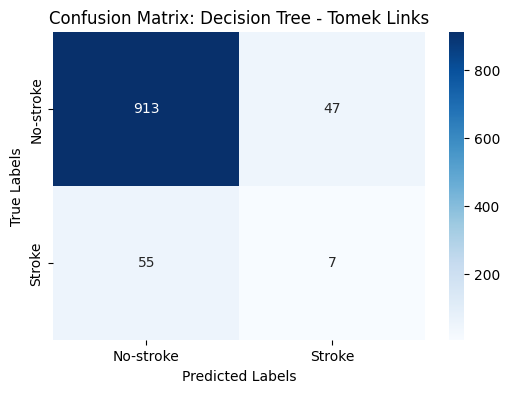

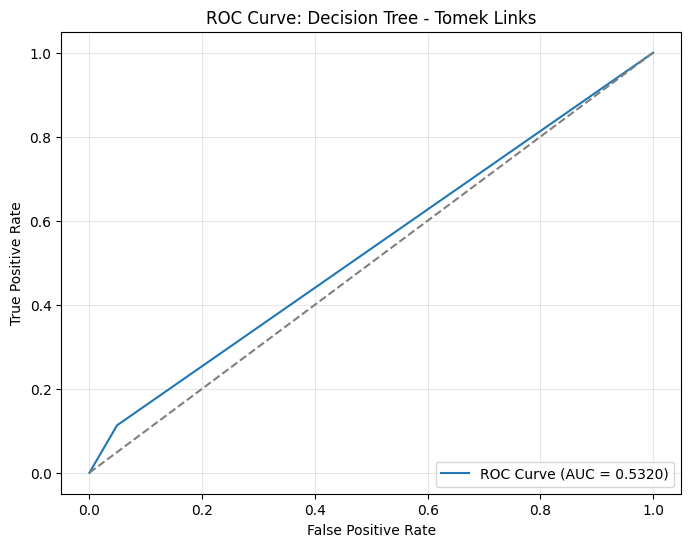


==================== Decision Tree with Edited Nearest Neighbors (ENN) ====================

Decision Tree with Edited Nearest Neighbors (ENN) Evaluation Metrics:
Accuracy: 0.8865
Precision: 0.1625
Recall: 0.2097
F1 Score: 0.1831
ROC-AUC Score: 0.5699

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.93      0.94       960
           1       0.16      0.21      0.18        62

    accuracy                           0.89      1022
   macro avg       0.56      0.57      0.56      1022
weighted avg       0.90      0.89      0.89      1022


Confusion Matrix:
[[893  67]
 [ 49  13]]


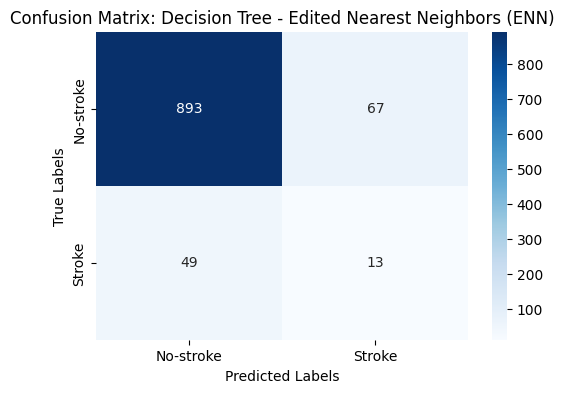

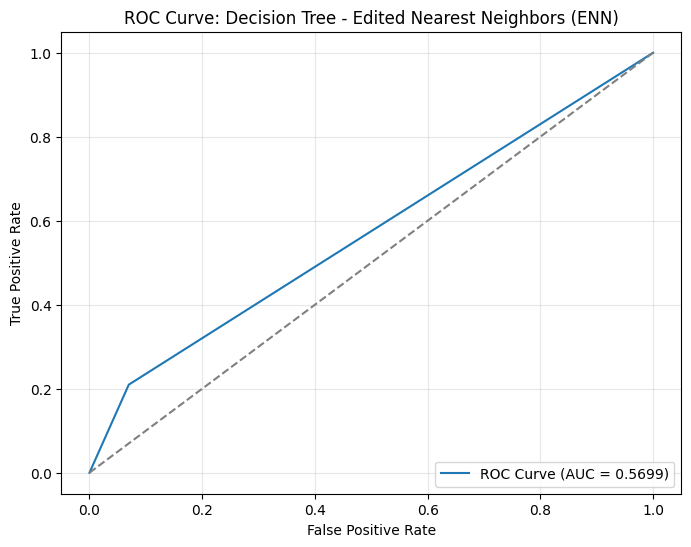


==================== Decision Tree with Repeated Edited Nearest Neighbors (RENN) ====================

Decision Tree with Repeated Edited Nearest Neighbors (RENN) Evaluation Metrics:
Accuracy: 0.8679
Precision: 0.2033
Recall: 0.4032
F1 Score: 0.2703
ROC-AUC Score: 0.6506

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.90      0.93       960
           1       0.20      0.40      0.27        62

    accuracy                           0.87      1022
   macro avg       0.58      0.65      0.60      1022
weighted avg       0.91      0.87      0.89      1022


Confusion Matrix:
[[862  98]
 [ 37  25]]


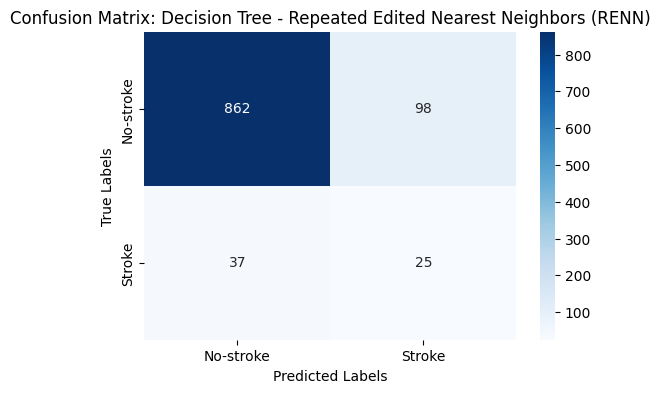

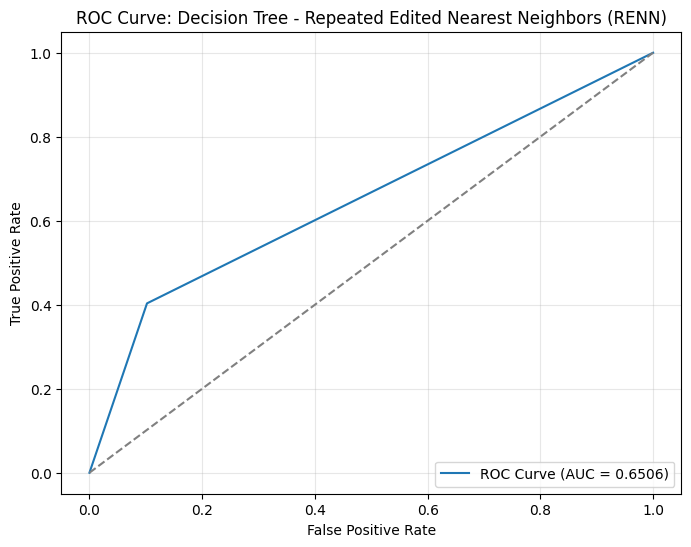


==================== Decision Tree with All KNN ====================

Decision Tree with All KNN Evaluation Metrics:
Accuracy: 0.8914
Precision: 0.2118
Recall: 0.2903
F1 Score: 0.2449
ROC-AUC Score: 0.6103

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.93      0.94       960
           1       0.21      0.29      0.24        62

    accuracy                           0.89      1022
   macro avg       0.58      0.61      0.59      1022
weighted avg       0.91      0.89      0.90      1022


Confusion Matrix:
[[893  67]
 [ 44  18]]


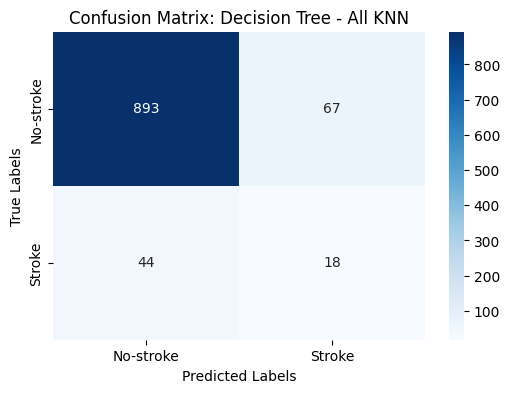

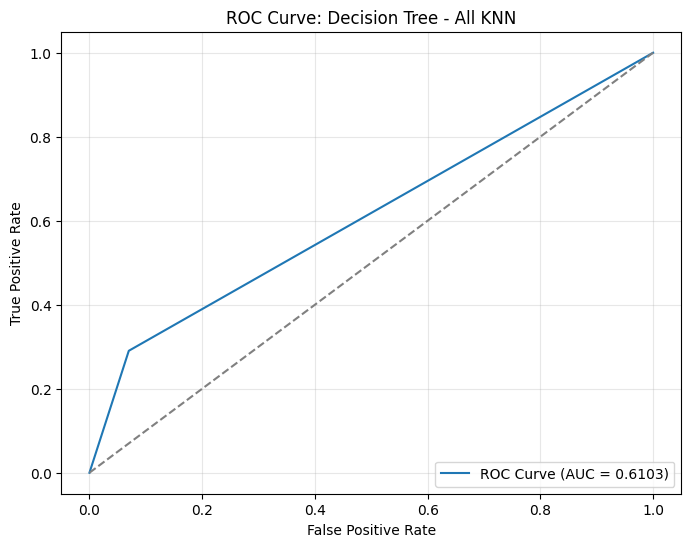


==================== Decision Tree with Condensed Nearest Neighbor (CNN) ====================

Decision Tree with Condensed Nearest Neighbor (CNN) Evaluation Metrics:
Accuracy: 0.8297
Precision: 0.1111
Recall: 0.2581
F1 Score: 0.1553
ROC-AUC Score: 0.5624

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.87      0.91       960
           1       0.11      0.26      0.16        62

    accuracy                           0.83      1022
   macro avg       0.53      0.56      0.53      1022
weighted avg       0.90      0.83      0.86      1022


Confusion Matrix:
[[832 128]
 [ 46  16]]


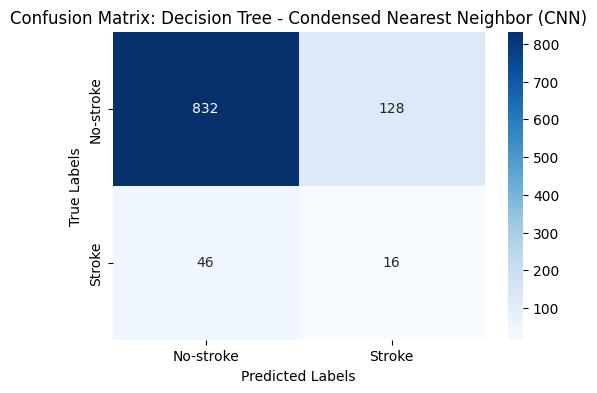

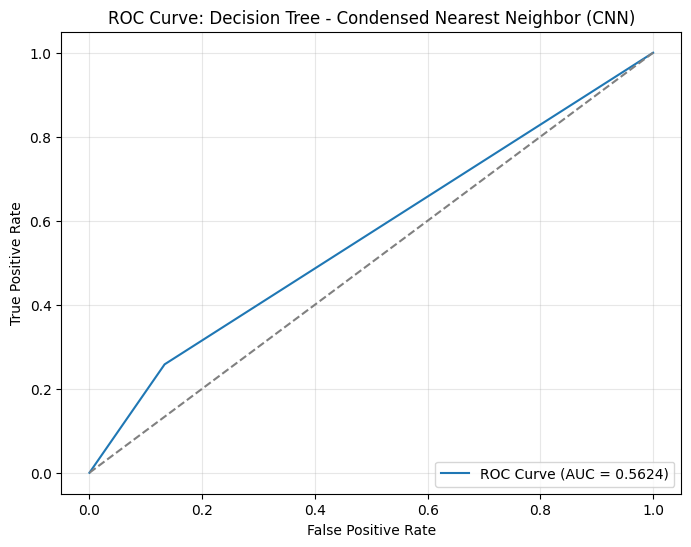


==================== Decision Tree with One-Sided Selection (OSS) ====================

Decision Tree with One-Sided Selection (OSS) Evaluation Metrics:
Accuracy: 0.9070
Precision: 0.1489
Recall: 0.1129
F1 Score: 0.1284
ROC-AUC Score: 0.5356

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.96      0.95       960
           1       0.15      0.11      0.13        62

    accuracy                           0.91      1022
   macro avg       0.55      0.54      0.54      1022
weighted avg       0.90      0.91      0.90      1022


Confusion Matrix:
[[920  40]
 [ 55   7]]


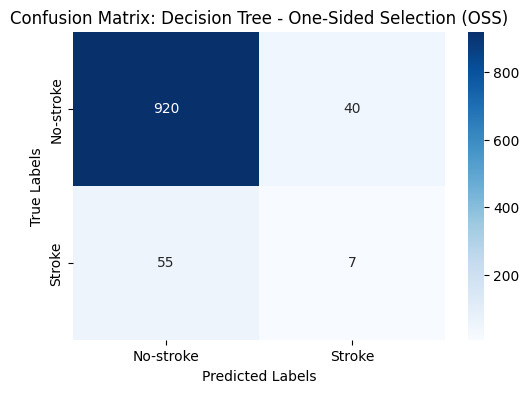

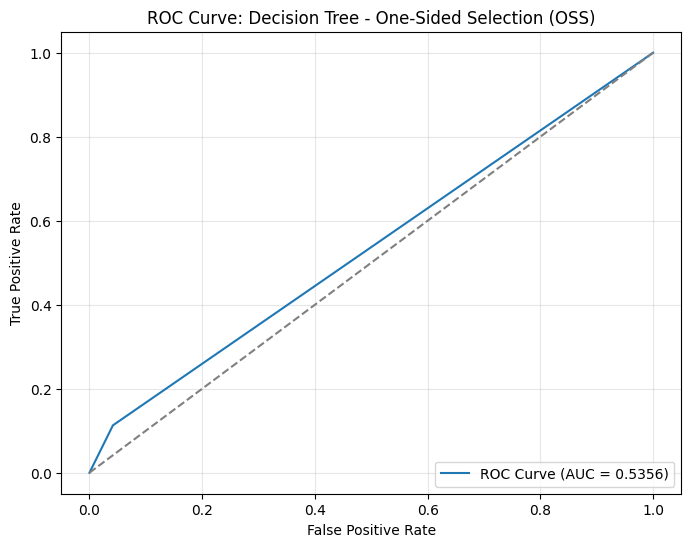


==================== Decision Tree with Neighborhood Cleaning Rule (NCR) ====================

Decision Tree with Neighborhood Cleaning Rule (NCR) Evaluation Metrics:
Accuracy: 0.8904
Precision: 0.1622
Recall: 0.1935
F1 Score: 0.1765
ROC-AUC Score: 0.5645

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.94      0.94       960
           1       0.16      0.19      0.18        62

    accuracy                           0.89      1022
   macro avg       0.55      0.56      0.56      1022
weighted avg       0.90      0.89      0.89      1022


Confusion Matrix:
[[898  62]
 [ 50  12]]


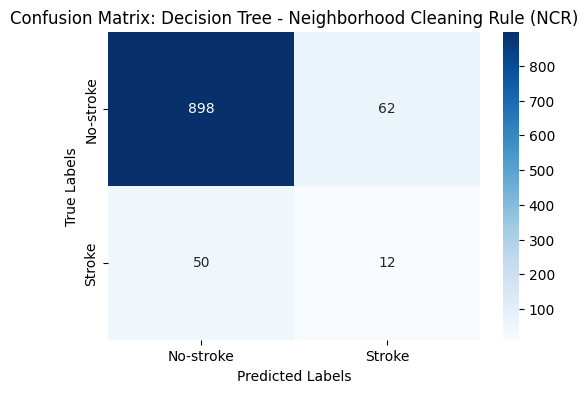

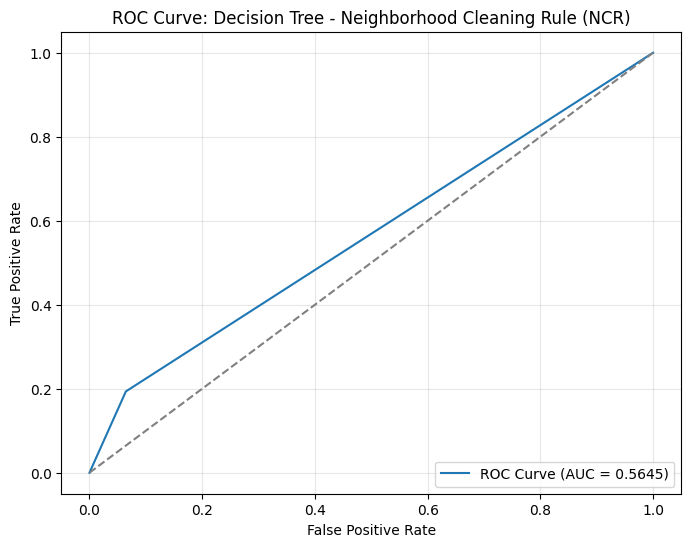


==================== Decision Tree with Instance Hardness Threshold ====================

Decision Tree with Instance Hardness Threshold Evaluation Metrics:
Accuracy: 0.7789
Precision: 0.1667
Recall: 0.6613
F1 Score: 0.2662
ROC-AUC Score: 0.7239

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.79      0.87       960
           1       0.17      0.66      0.27        62

    accuracy                           0.78      1022
   macro avg       0.57      0.72      0.57      1022
weighted avg       0.92      0.78      0.83      1022


Confusion Matrix:
[[755 205]
 [ 21  41]]


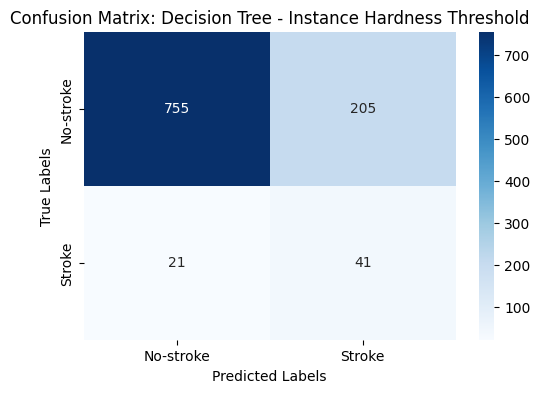

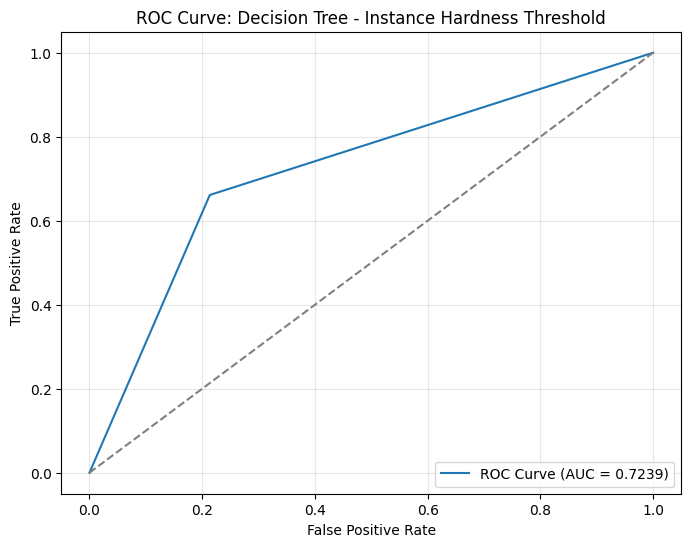


==================== Gradient Boosting with None ====================

Gradient Boosting with None Evaluation Metrics:
Accuracy: 0.9403
Precision: 1.0000
Recall: 0.0161
F1 Score: 0.0317
ROC-AUC Score: 0.8374

Classification Report:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       1.00      0.02      0.03        62

    accuracy                           0.94      1022
   macro avg       0.97      0.51      0.50      1022
weighted avg       0.94      0.94      0.91      1022


Confusion Matrix:
[[960   0]
 [ 61   1]]


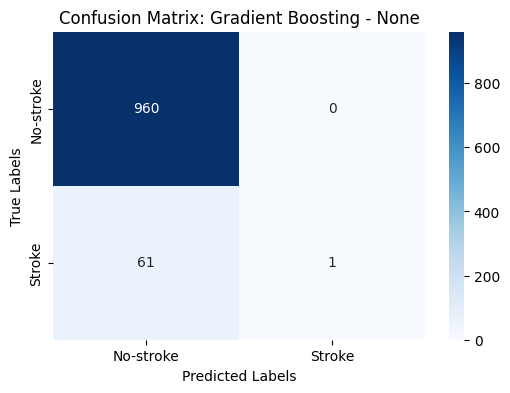

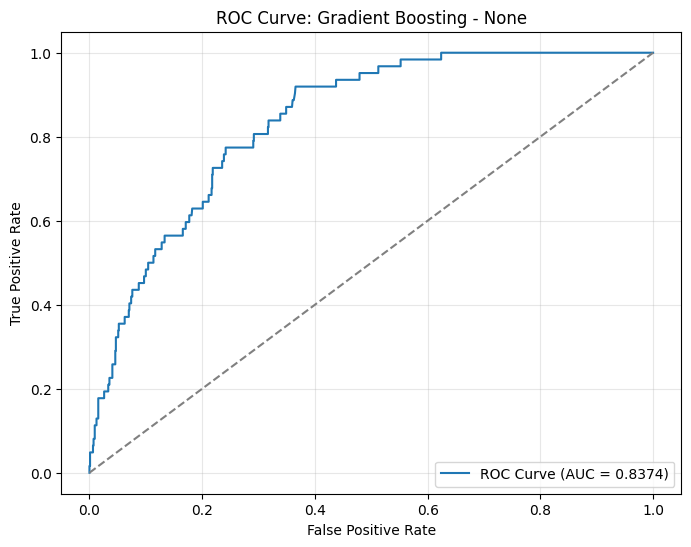


==================== Gradient Boosting with SMOTE ====================

Gradient Boosting with SMOTE Evaluation Metrics:
Accuracy: 0.8160
Precision: 0.1719
Recall: 0.5323
F1 Score: 0.2598
ROC-AUC Score: 0.7963

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.83      0.89       960
           1       0.17      0.53      0.26        62

    accuracy                           0.82      1022
   macro avg       0.57      0.68      0.58      1022
weighted avg       0.92      0.82      0.86      1022


Confusion Matrix:
[[801 159]
 [ 29  33]]


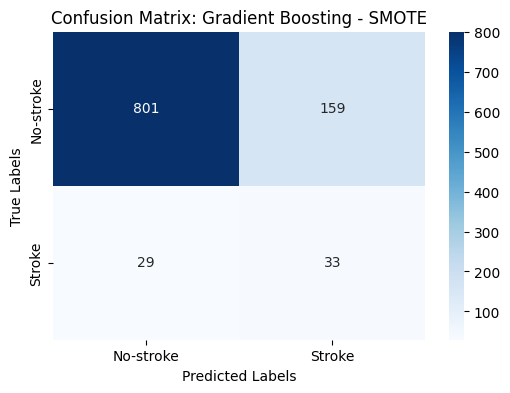

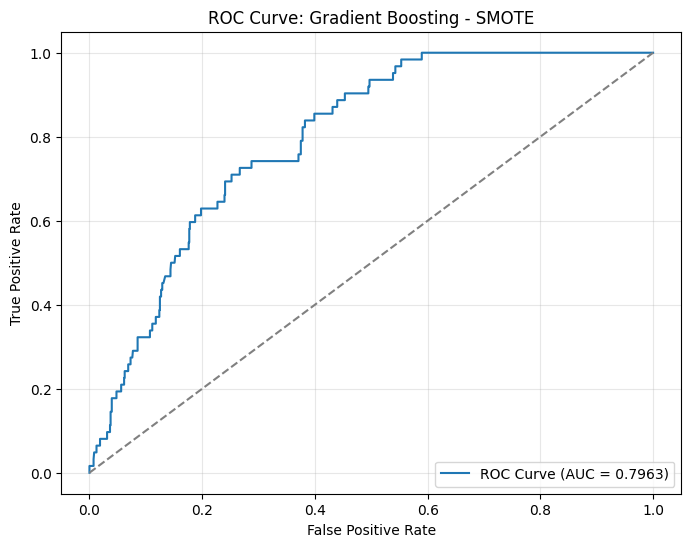


==================== Gradient Boosting with ClusterCentroids ====================

Gradient Boosting with ClusterCentroids Evaluation Metrics:
Accuracy: 0.4207
Precision: 0.0898
Recall: 0.9355
F1 Score: 0.1638
ROC-AUC Score: 0.7218

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.39      0.56       960
           1       0.09      0.94      0.16        62

    accuracy                           0.42      1022
   macro avg       0.54      0.66      0.36      1022
weighted avg       0.93      0.42      0.53      1022


Confusion Matrix:
[[372 588]
 [  4  58]]


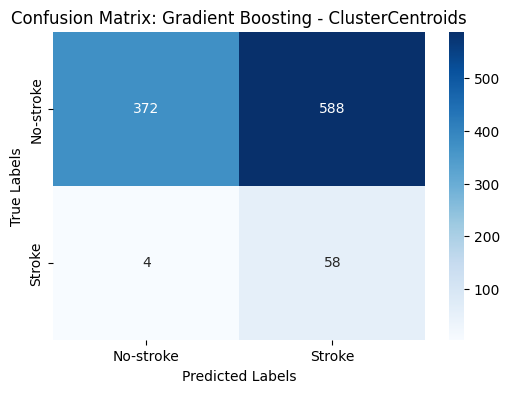

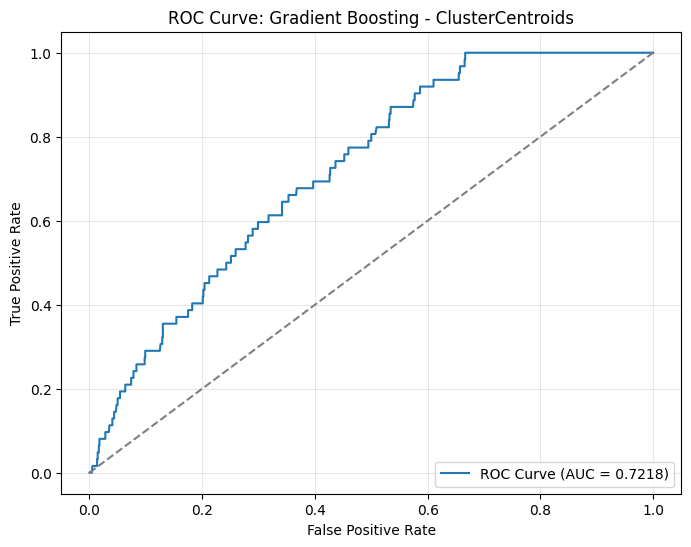


==================== Gradient Boosting with Random Undersampling ====================

Gradient Boosting with Random Undersampling Evaluation Metrics:
Accuracy: 0.6986
Precision: 0.1404
Recall: 0.7742
F1 Score: 0.2376
ROC-AUC Score: 0.8258

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.69      0.81       960
           1       0.14      0.77      0.24        62

    accuracy                           0.70      1022
   macro avg       0.56      0.73      0.52      1022
weighted avg       0.93      0.70      0.78      1022


Confusion Matrix:
[[666 294]
 [ 14  48]]


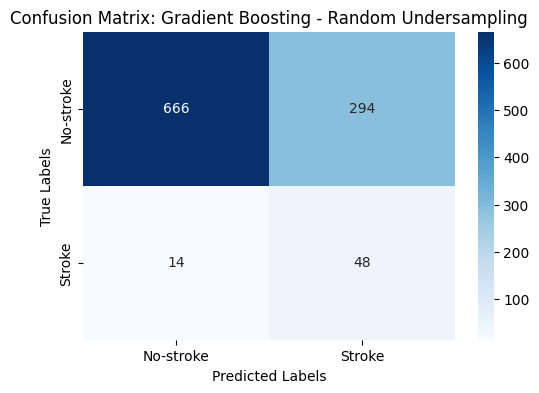

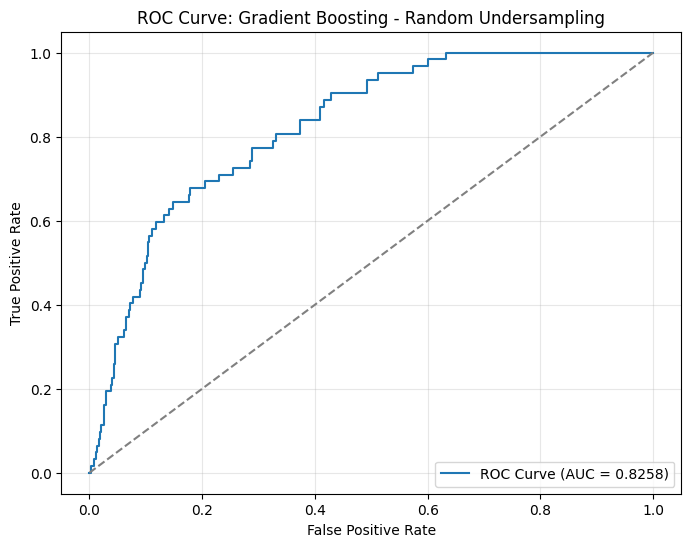


==================== Gradient Boosting with NearMiss-1 ====================

Gradient Boosting with NearMiss-1 Evaluation Metrics:
Accuracy: 0.1771
Precision: 0.0497
Recall: 0.6935
F1 Score: 0.0928
ROC-AUC Score: 0.2666

Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.14      0.25       960
           1       0.05      0.69      0.09        62

    accuracy                           0.18      1022
   macro avg       0.46      0.42      0.17      1022
weighted avg       0.83      0.18      0.24      1022


Confusion Matrix:
[[138 822]
 [ 19  43]]


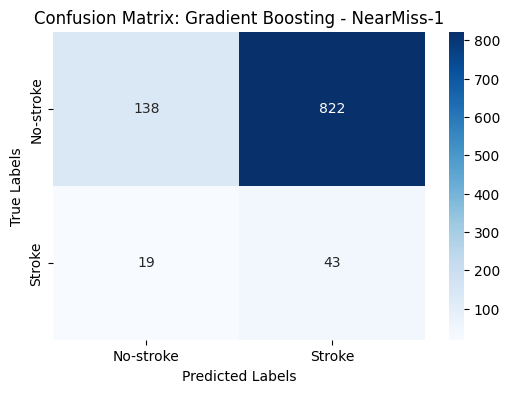

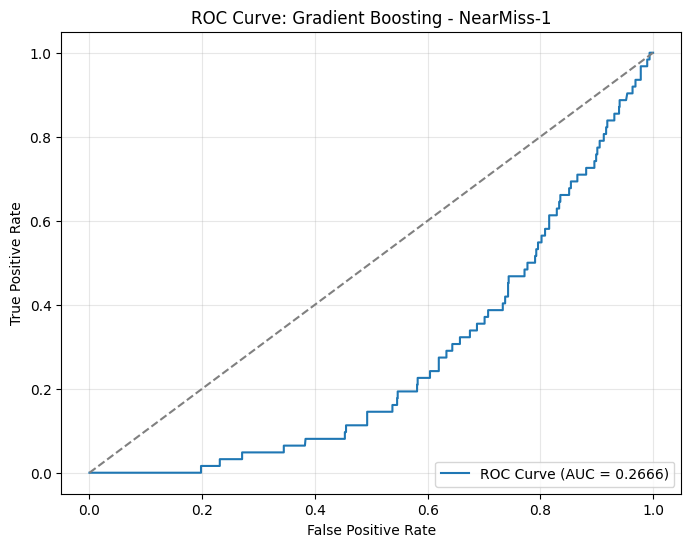


==================== Gradient Boosting with NearMiss-2 ====================

Gradient Boosting with NearMiss-2 Evaluation Metrics:
Accuracy: 0.1145
Precision: 0.0632
Recall: 0.9839
F1 Score: 0.1188
ROC-AUC Score: 0.4034

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.06      0.11       960
           1       0.06      0.98      0.12        62

    accuracy                           0.11      1022
   macro avg       0.52      0.52      0.11      1022
weighted avg       0.93      0.11      0.11      1022


Confusion Matrix:
[[ 56 904]
 [  1  61]]


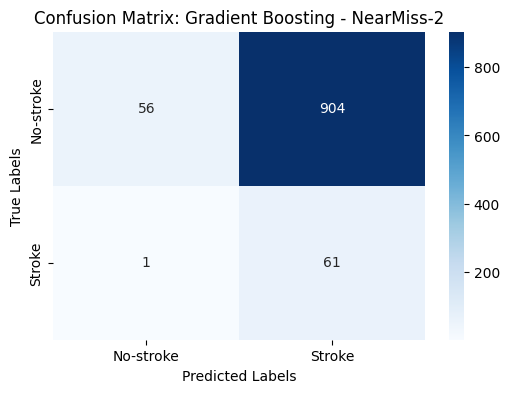

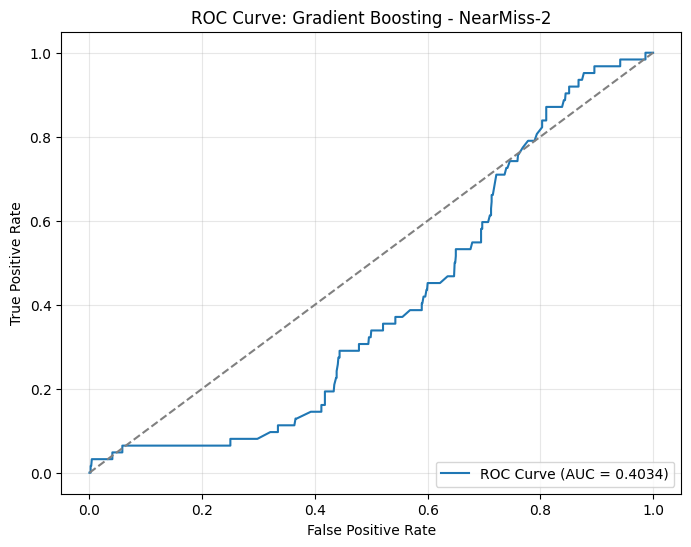


==================== Gradient Boosting with NearMiss-3 ====================

Gradient Boosting with NearMiss-3 Evaluation Metrics:
Accuracy: 0.6830
Precision: 0.1124
Recall: 0.6129
F1 Score: 0.1900
ROC-AUC Score: 0.6772

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.69      0.80       960
           1       0.11      0.61      0.19        62

    accuracy                           0.68      1022
   macro avg       0.54      0.65      0.50      1022
weighted avg       0.91      0.68      0.77      1022


Confusion Matrix:
[[660 300]
 [ 24  38]]


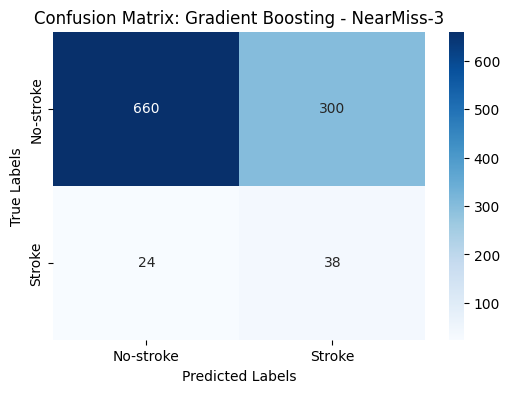

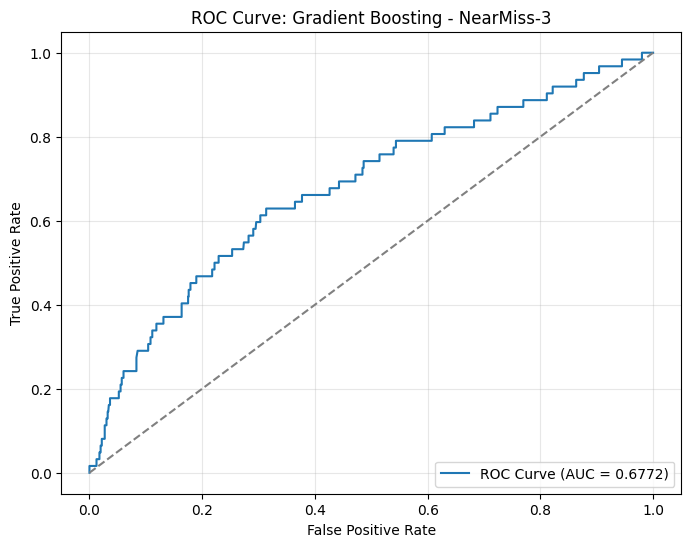


==================== Gradient Boosting with Tomek Links ====================

Gradient Boosting with Tomek Links Evaluation Metrics:
Accuracy: 0.9393
Precision: 0.5000
Recall: 0.0161
F1 Score: 0.0312
ROC-AUC Score: 0.8355

Classification Report:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.50      0.02      0.03        62

    accuracy                           0.94      1022
   macro avg       0.72      0.51      0.50      1022
weighted avg       0.91      0.94      0.91      1022


Confusion Matrix:
[[959   1]
 [ 61   1]]


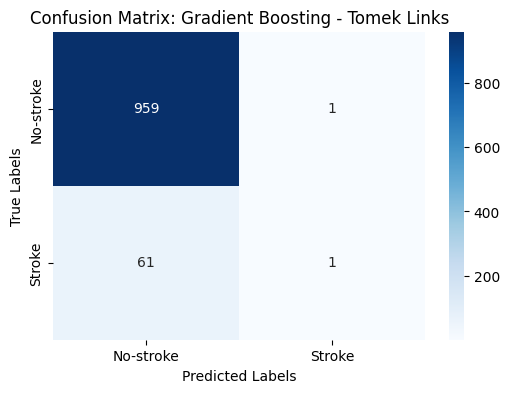

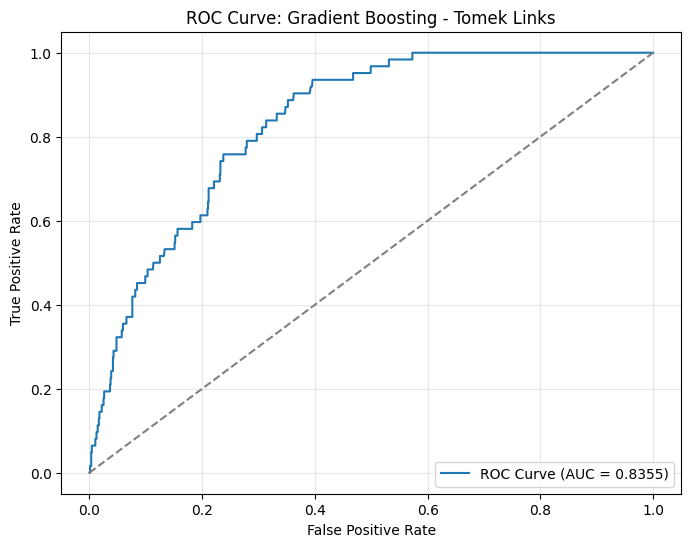


==================== Gradient Boosting with Edited Nearest Neighbors (ENN) ====================

Gradient Boosting with Edited Nearest Neighbors (ENN) Evaluation Metrics:
Accuracy: 0.9344
Precision: 0.3529
Recall: 0.0968
F1 Score: 0.1519
ROC-AUC Score: 0.8421

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.99      0.97       960
           1       0.35      0.10      0.15        62

    accuracy                           0.93      1022
   macro avg       0.65      0.54      0.56      1022
weighted avg       0.91      0.93      0.92      1022


Confusion Matrix:
[[949  11]
 [ 56   6]]


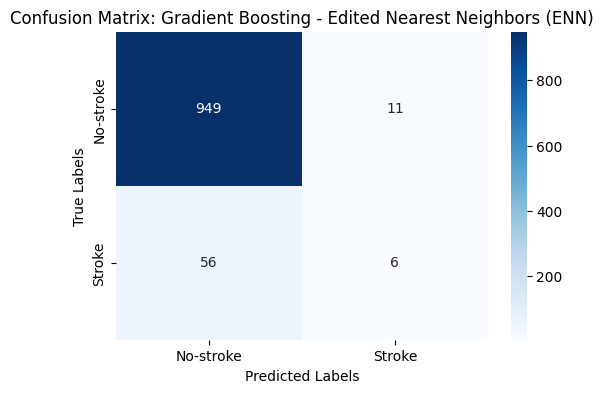

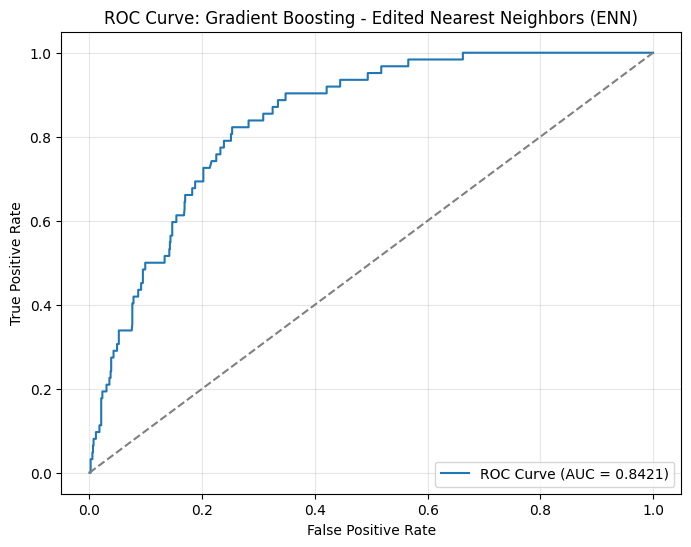


==================== Gradient Boosting with Repeated Edited Nearest Neighbors (RENN) ====================

Gradient Boosting with Repeated Edited Nearest Neighbors (RENN) Evaluation Metrics:
Accuracy: 0.9041
Precision: 0.2632
Recall: 0.3226
F1 Score: 0.2899
ROC-AUC Score: 0.8434

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.94      0.95       960
           1       0.26      0.32      0.29        62

    accuracy                           0.90      1022
   macro avg       0.61      0.63      0.62      1022
weighted avg       0.91      0.90      0.91      1022


Confusion Matrix:
[[904  56]
 [ 42  20]]


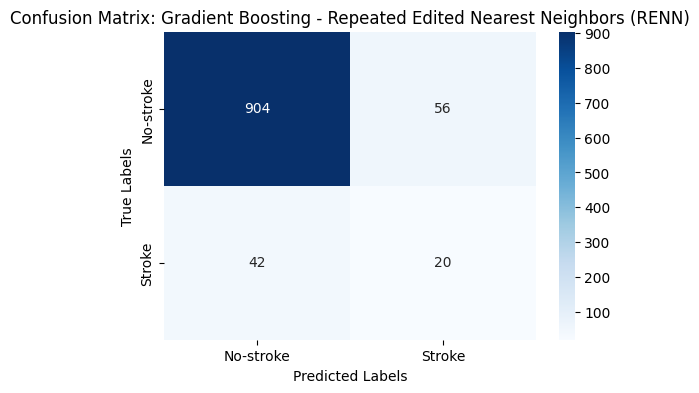

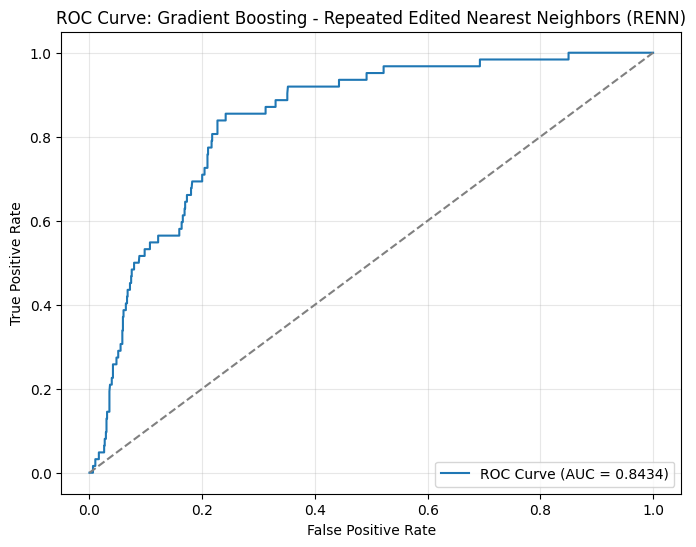


==================== Gradient Boosting with All KNN ====================

Gradient Boosting with All KNN Evaluation Metrics:
Accuracy: 0.9217
Precision: 0.2750
Recall: 0.1774
F1 Score: 0.2157
ROC-AUC Score: 0.8436

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.97      0.96       960
           1       0.28      0.18      0.22        62

    accuracy                           0.92      1022
   macro avg       0.61      0.57      0.59      1022
weighted avg       0.91      0.92      0.91      1022


Confusion Matrix:
[[931  29]
 [ 51  11]]


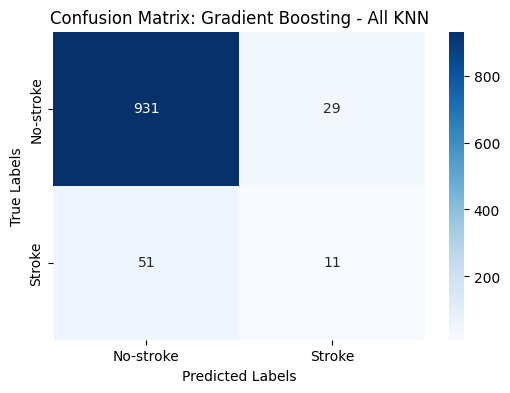

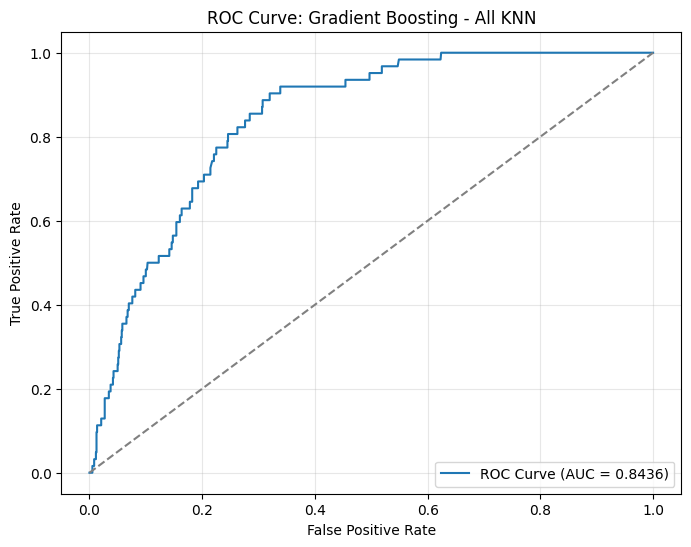


==================== Gradient Boosting with Condensed Nearest Neighbor (CNN) ====================

Gradient Boosting with Condensed Nearest Neighbor (CNN) Evaluation Metrics:
Accuracy: 0.9217
Precision: 0.2188
Recall: 0.1129
F1 Score: 0.1489
ROC-AUC Score: 0.7893

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.97      0.96       960
           1       0.22      0.11      0.15        62

    accuracy                           0.92      1022
   macro avg       0.58      0.54      0.55      1022
weighted avg       0.90      0.92      0.91      1022


Confusion Matrix:
[[935  25]
 [ 55   7]]


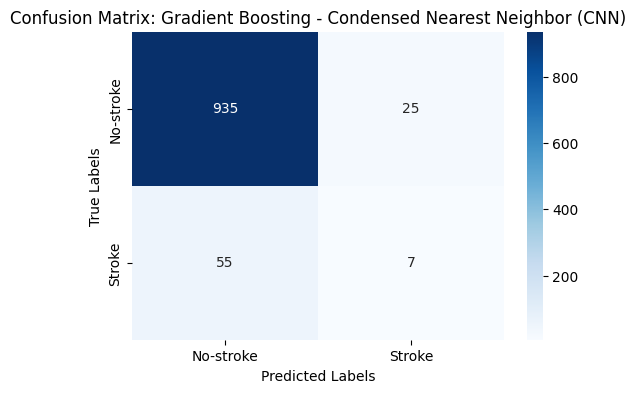

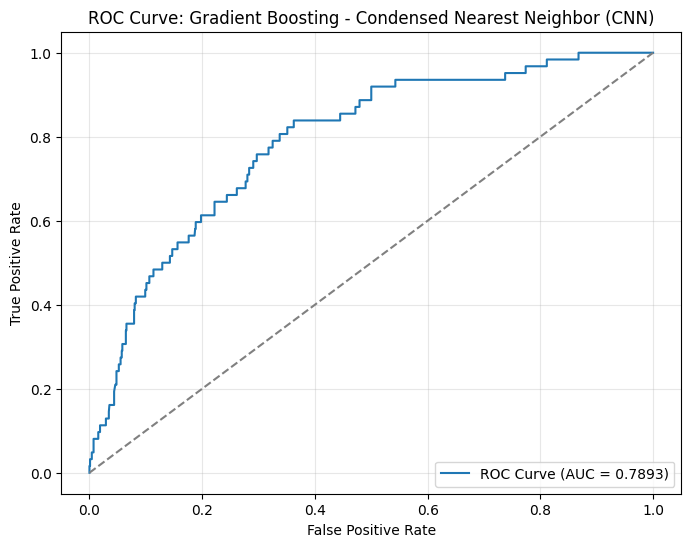


==================== Gradient Boosting with One-Sided Selection (OSS) ====================

Gradient Boosting with One-Sided Selection (OSS) Evaluation Metrics:
Accuracy: 0.9384
Precision: 0.0000
Recall: 0.0000
F1 Score: 0.0000
ROC-AUC Score: 0.8409

Classification Report:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.00      0.00      0.00        62

    accuracy                           0.94      1022
   macro avg       0.47      0.50      0.48      1022
weighted avg       0.88      0.94      0.91      1022


Confusion Matrix:
[[959   1]
 [ 62   0]]


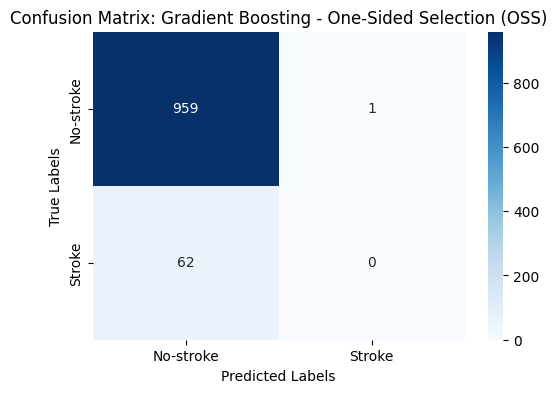

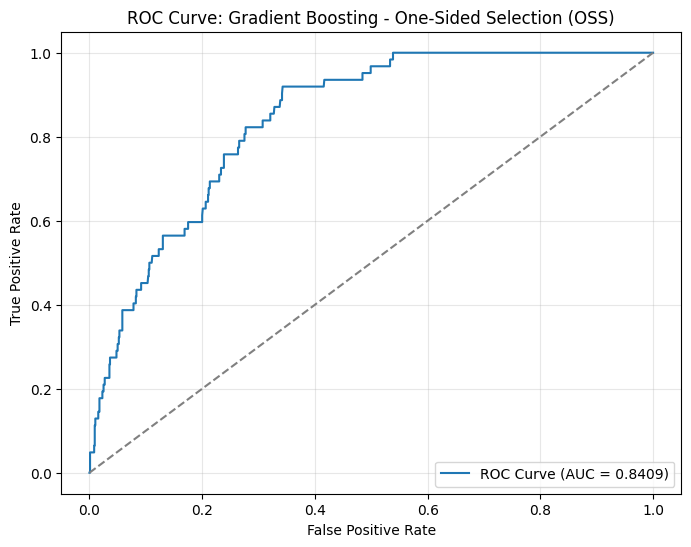


==================== Gradient Boosting with Neighborhood Cleaning Rule (NCR) ====================

Gradient Boosting with Neighborhood Cleaning Rule (NCR) Evaluation Metrics:
Accuracy: 0.9354
Precision: 0.3889
Recall: 0.1129
F1 Score: 0.1750
ROC-AUC Score: 0.8450

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.99      0.97       960
           1       0.39      0.11      0.17        62

    accuracy                           0.94      1022
   macro avg       0.67      0.55      0.57      1022
weighted avg       0.91      0.94      0.92      1022


Confusion Matrix:
[[949  11]
 [ 55   7]]


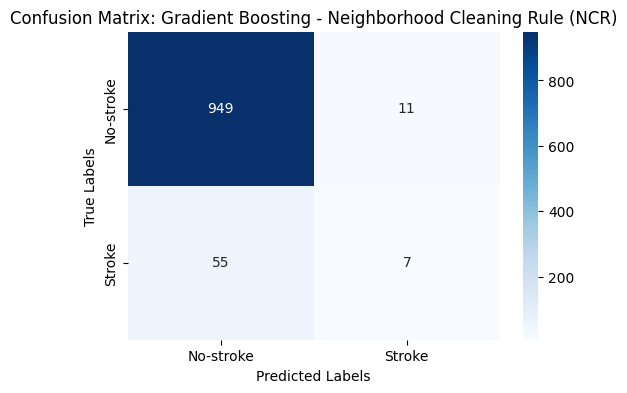

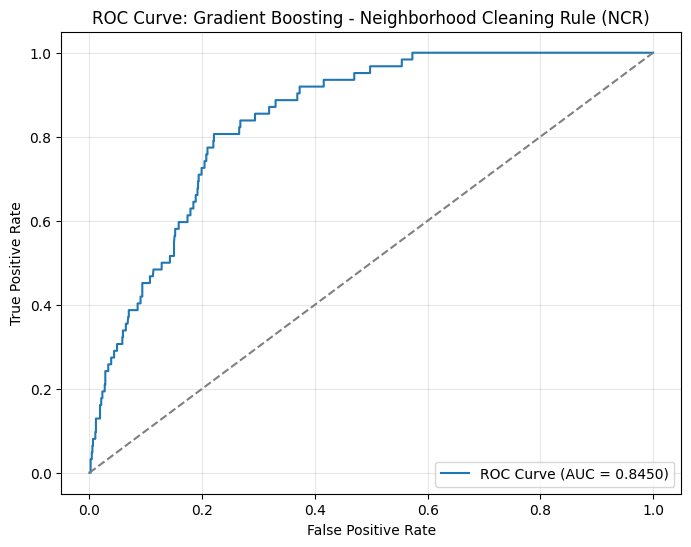


==================== Gradient Boosting with Instance Hardness Threshold ====================

Gradient Boosting with Instance Hardness Threshold Evaluation Metrics:
Accuracy: 0.7838
Precision: 0.1807
Recall: 0.7258
F1 Score: 0.2894
ROC-AUC Score: 0.8411

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.79      0.87       960
           1       0.18      0.73      0.29        62

    accuracy                           0.78      1022
   macro avg       0.58      0.76      0.58      1022
weighted avg       0.93      0.78      0.84      1022


Confusion Matrix:
[[756 204]
 [ 17  45]]


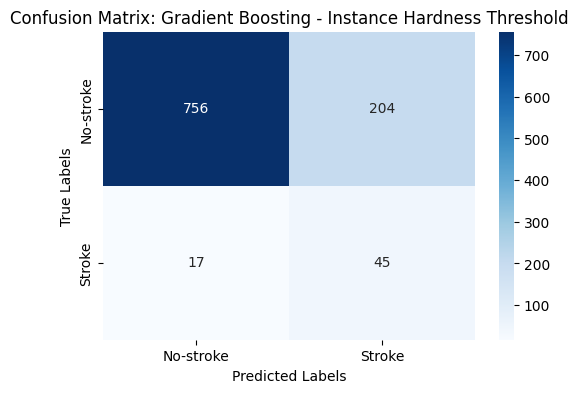

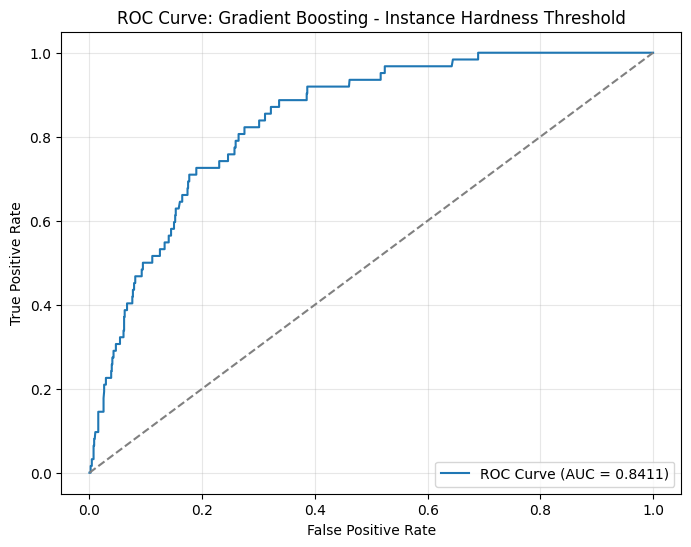


==================== K-Nearest Neighbors (KNN) with None ====================

K-Nearest Neighbors (KNN) with None Evaluation Metrics:
Accuracy: 0.9344
Precision: 0.1429
Recall: 0.0161
F1 Score: 0.0290
ROC-AUC Score: 0.6465

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.99      0.97       960
           1       0.14      0.02      0.03        62

    accuracy                           0.93      1022
   macro avg       0.54      0.50      0.50      1022
weighted avg       0.89      0.93      0.91      1022


Confusion Matrix:
[[954   6]
 [ 61   1]]


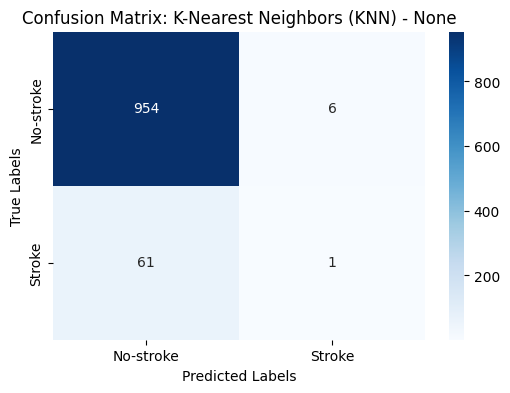

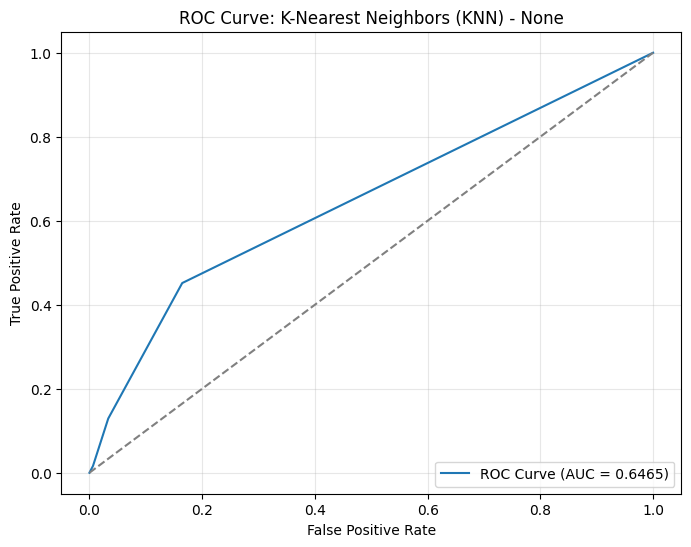


==================== K-Nearest Neighbors (KNN) with SMOTE ====================

K-Nearest Neighbors (KNN) with SMOTE Evaluation Metrics:
Accuracy: 0.8151
Precision: 0.1710
Recall: 0.5323
F1 Score: 0.2588
ROC-AUC Score: 0.7206

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.83      0.89       960
           1       0.17      0.53      0.26        62

    accuracy                           0.82      1022
   macro avg       0.57      0.68      0.58      1022
weighted avg       0.92      0.82      0.86      1022


Confusion Matrix:
[[800 160]
 [ 29  33]]


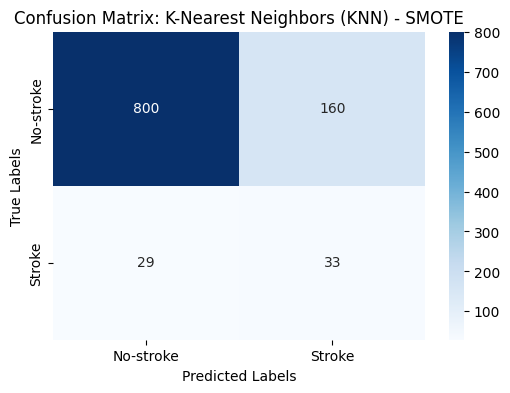

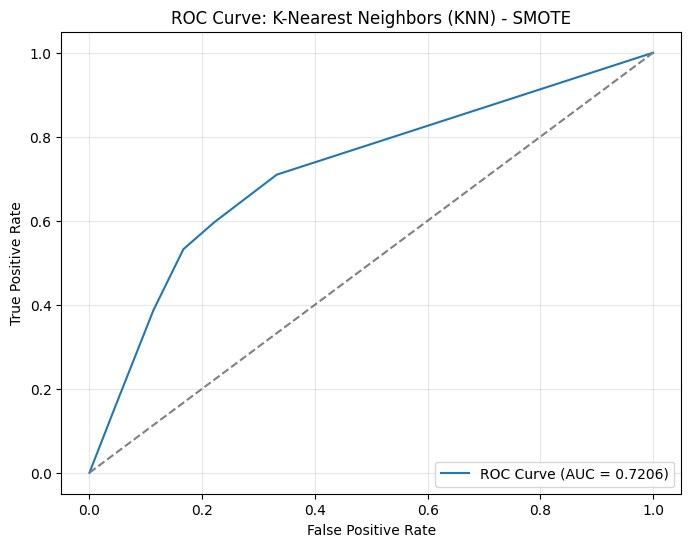


==================== K-Nearest Neighbors (KNN) with ClusterCentroids ====================

K-Nearest Neighbors (KNN) with ClusterCentroids Evaluation Metrics:
Accuracy: 0.3963
Precision: 0.0852
Recall: 0.9194
F1 Score: 0.1560
ROC-AUC Score: 0.6646

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.36      0.53       960
           1       0.09      0.92      0.16        62

    accuracy                           0.40      1022
   macro avg       0.54      0.64      0.34      1022
weighted avg       0.93      0.40      0.51      1022


Confusion Matrix:
[[348 612]
 [  5  57]]


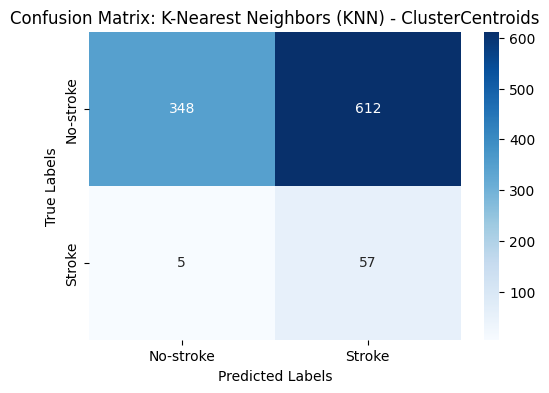

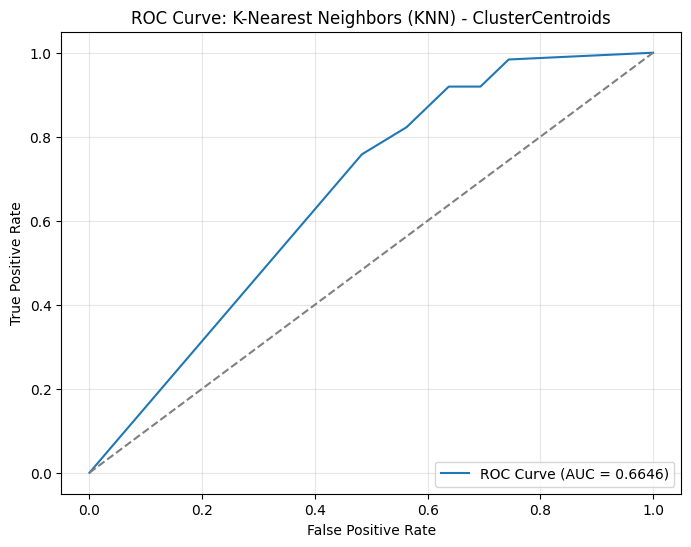


==================== K-Nearest Neighbors (KNN) with Random Undersampling ====================

K-Nearest Neighbors (KNN) with Random Undersampling Evaluation Metrics:
Accuracy: 0.7035
Precision: 0.1337
Recall: 0.7097
F1 Score: 0.2251
ROC-AUC Score: 0.7543

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.70      0.82       960
           1       0.13      0.71      0.23        62

    accuracy                           0.70      1022
   macro avg       0.55      0.71      0.52      1022
weighted avg       0.92      0.70      0.78      1022


Confusion Matrix:
[[675 285]
 [ 18  44]]


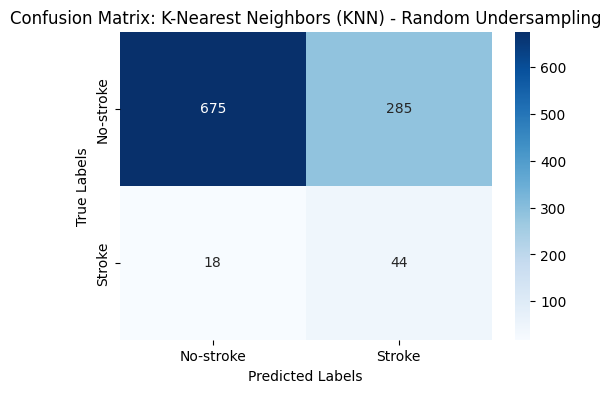

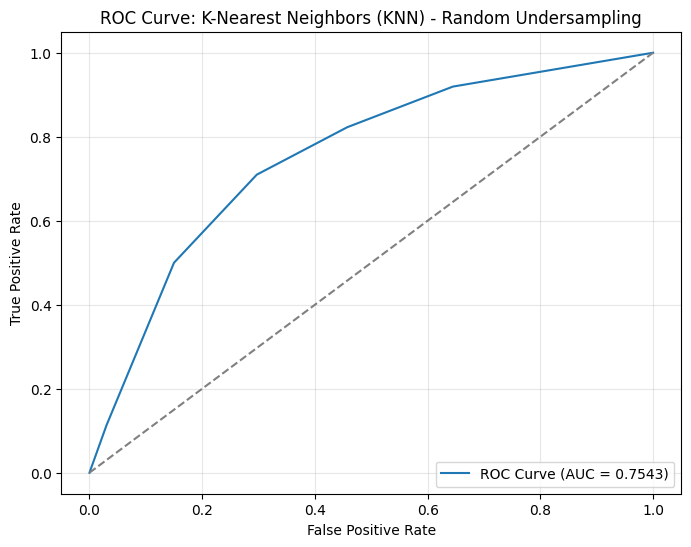


==================== K-Nearest Neighbors (KNN) with NearMiss-1 ====================

K-Nearest Neighbors (KNN) with NearMiss-1 Evaluation Metrics:
Accuracy: 0.3023
Precision: 0.0460
Recall: 0.5323
F1 Score: 0.0847
ROC-AUC Score: 0.3528

Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.29      0.44       960
           1       0.05      0.53      0.08        62

    accuracy                           0.30      1022
   macro avg       0.48      0.41      0.26      1022
weighted avg       0.85      0.30      0.42      1022


Confusion Matrix:
[[276 684]
 [ 29  33]]


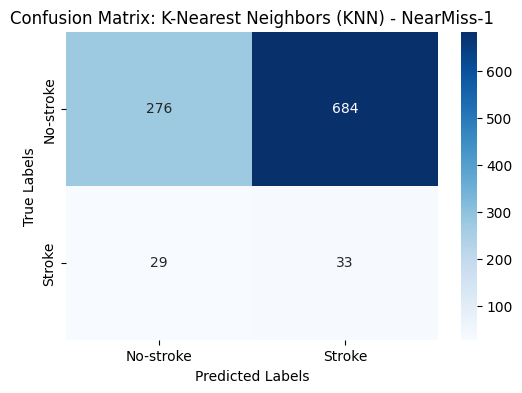

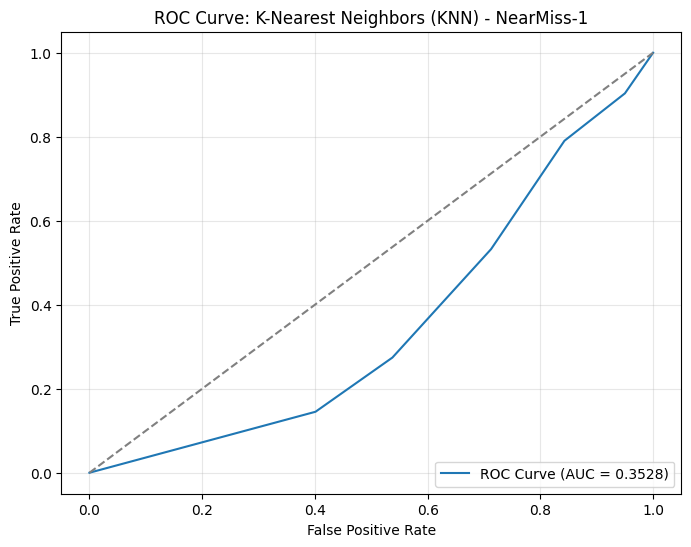


==================== K-Nearest Neighbors (KNN) with NearMiss-2 ====================

K-Nearest Neighbors (KNN) with NearMiss-2 Evaluation Metrics:
Accuracy: 0.4648
Precision: 0.0938
Recall: 0.9032
F1 Score: 0.1700
ROC-AUC Score: 0.7164

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.44      0.61       960
           1       0.09      0.90      0.17        62

    accuracy                           0.46      1022
   macro avg       0.54      0.67      0.39      1022
weighted avg       0.93      0.46      0.58      1022


Confusion Matrix:
[[419 541]
 [  6  56]]


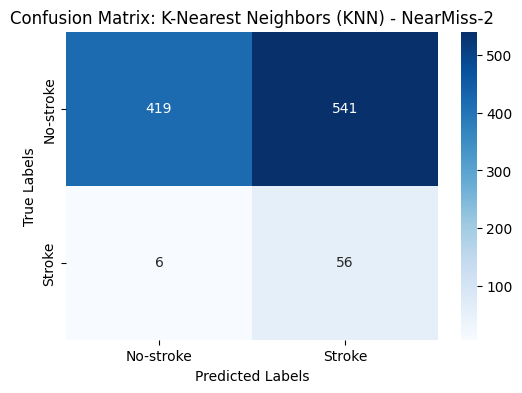

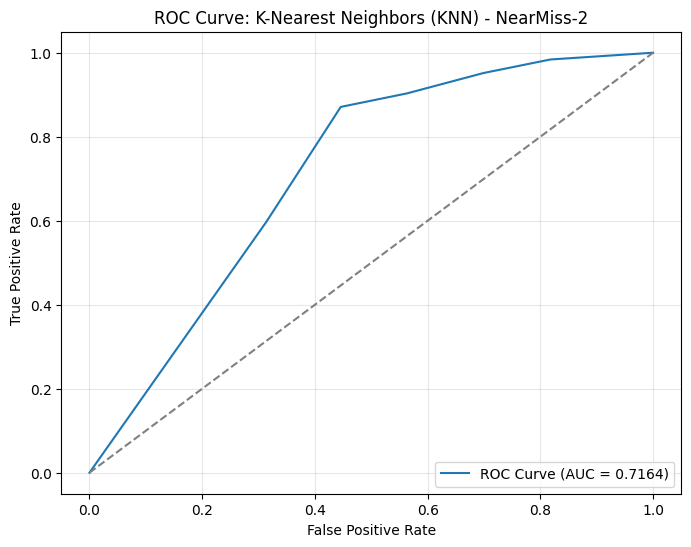


==================== K-Nearest Neighbors (KNN) with NearMiss-3 ====================

K-Nearest Neighbors (KNN) with NearMiss-3 Evaluation Metrics:
Accuracy: 0.6311
Precision: 0.0888
Recall: 0.5484
F1 Score: 0.1528
ROC-AUC Score: 0.6317

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.64      0.76       960
           1       0.09      0.55      0.15        62

    accuracy                           0.63      1022
   macro avg       0.52      0.59      0.46      1022
weighted avg       0.90      0.63      0.73      1022


Confusion Matrix:
[[611 349]
 [ 28  34]]


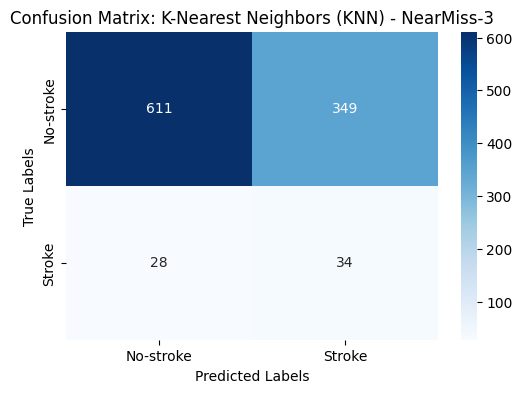

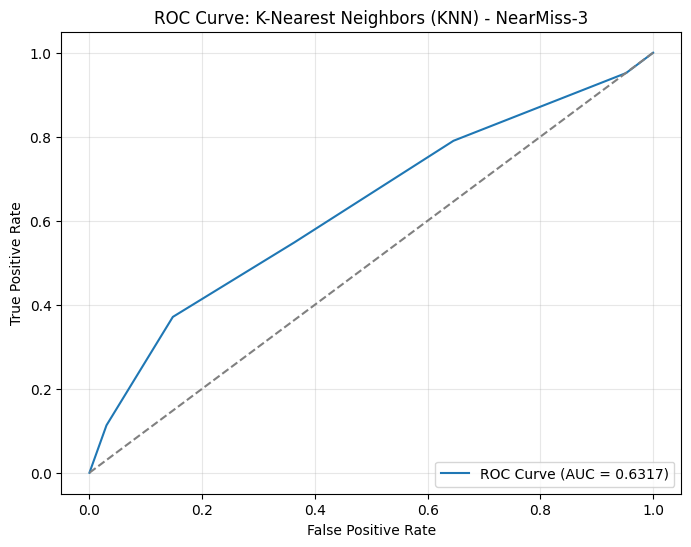


==================== K-Nearest Neighbors (KNN) with Tomek Links ====================

K-Nearest Neighbors (KNN) with Tomek Links Evaluation Metrics:
Accuracy: 0.9315
Precision: 0.1000
Recall: 0.0161
F1 Score: 0.0278
ROC-AUC Score: 0.6424

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.99      0.96       960
           1       0.10      0.02      0.03        62

    accuracy                           0.93      1022
   macro avg       0.52      0.50      0.50      1022
weighted avg       0.89      0.93      0.91      1022


Confusion Matrix:
[[951   9]
 [ 61   1]]


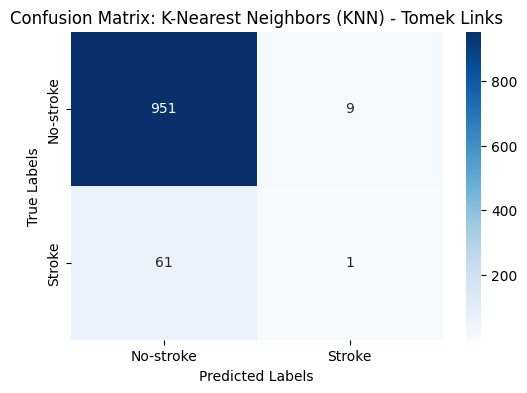

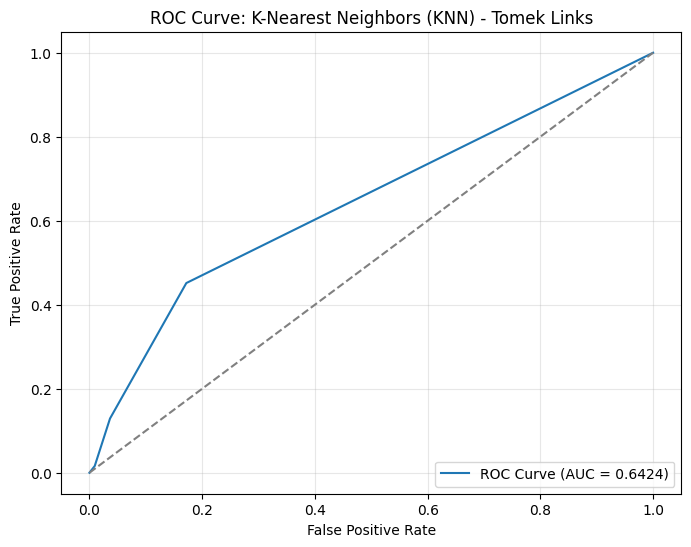


==================== K-Nearest Neighbors (KNN) with Edited Nearest Neighbors (ENN) ====================

K-Nearest Neighbors (KNN) with Edited Nearest Neighbors (ENN) Evaluation Metrics:
Accuracy: 0.9247
Precision: 0.1429
Recall: 0.0484
F1 Score: 0.0723
ROC-AUC Score: 0.6862

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.98      0.96       960
           1       0.14      0.05      0.07        62

    accuracy                           0.92      1022
   macro avg       0.54      0.51      0.52      1022
weighted avg       0.89      0.92      0.91      1022


Confusion Matrix:
[[942  18]
 [ 59   3]]


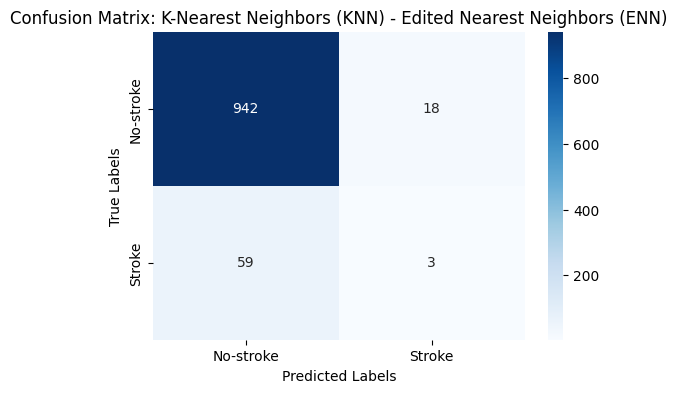

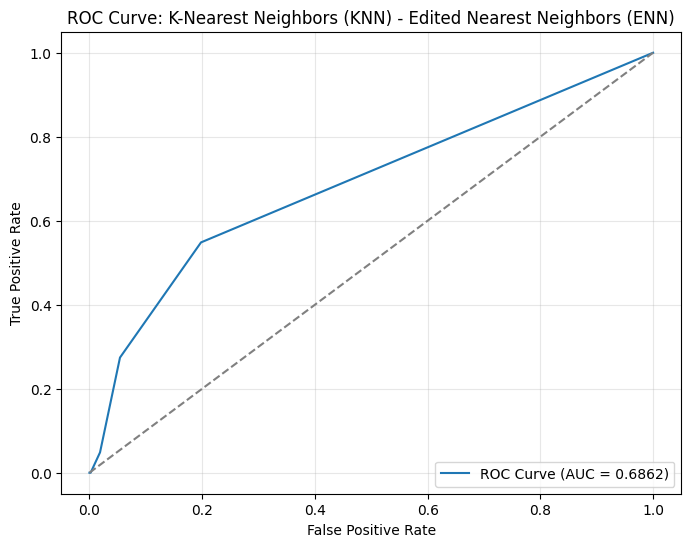


==================== K-Nearest Neighbors (KNN) with Repeated Edited Nearest Neighbors (RENN) ====================

K-Nearest Neighbors (KNN) with Repeated Edited Nearest Neighbors (RENN) Evaluation Metrics:
Accuracy: 0.9188
Precision: 0.1818
Recall: 0.0968
F1 Score: 0.1263
ROC-AUC Score: 0.7117

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.97      0.96       960
           1       0.18      0.10      0.13        62

    accuracy                           0.92      1022
   macro avg       0.56      0.53      0.54      1022
weighted avg       0.90      0.92      0.91      1022


Confusion Matrix:
[[933  27]
 [ 56   6]]


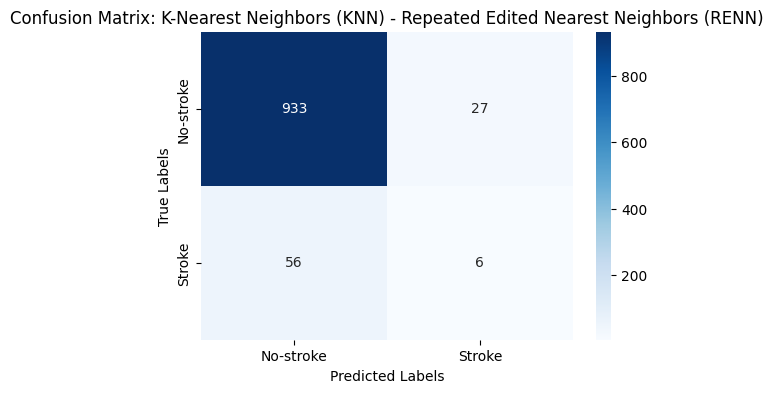

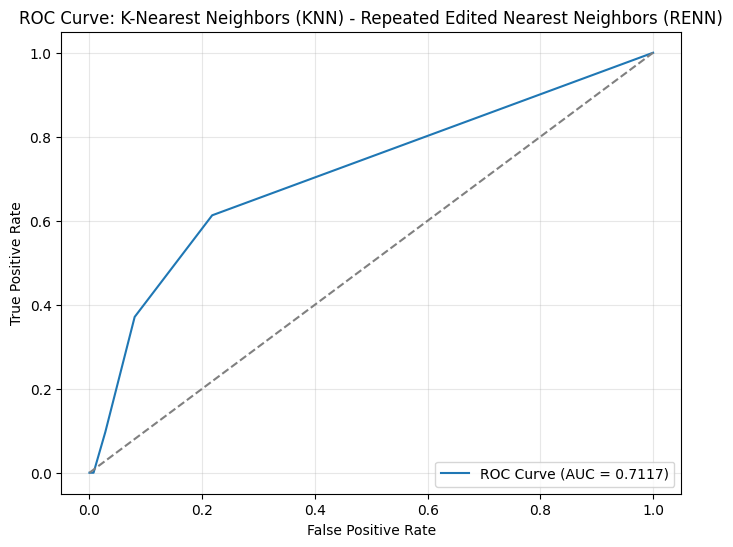


==================== K-Nearest Neighbors (KNN) with All KNN ====================

K-Nearest Neighbors (KNN) with All KNN Evaluation Metrics:
Accuracy: 0.9217
Precision: 0.1250
Recall: 0.0484
F1 Score: 0.0698
ROC-AUC Score: 0.7136

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.98      0.96       960
           1       0.12      0.05      0.07        62

    accuracy                           0.92      1022
   macro avg       0.53      0.51      0.51      1022
weighted avg       0.89      0.92      0.91      1022


Confusion Matrix:
[[939  21]
 [ 59   3]]


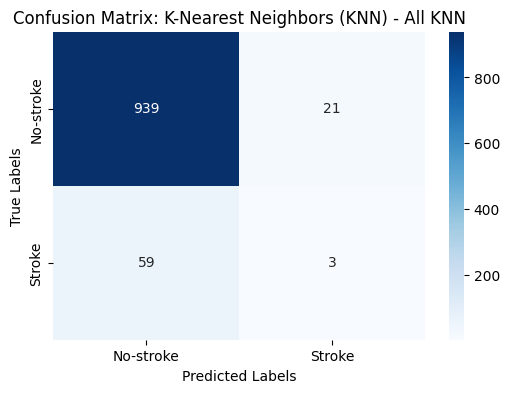

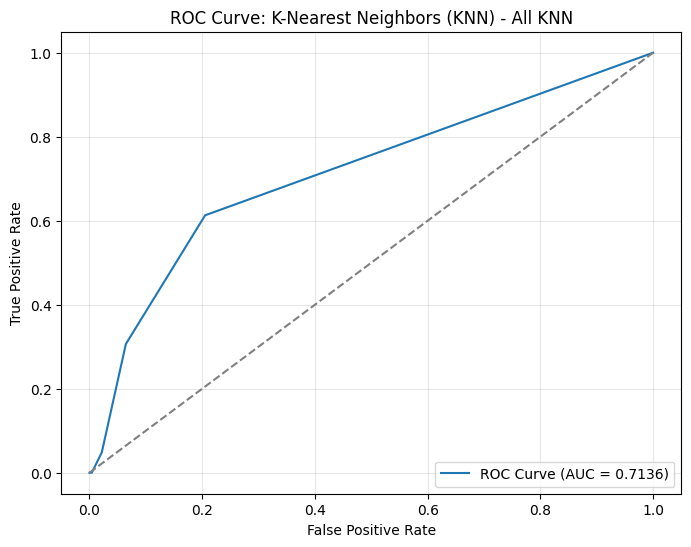


==================== K-Nearest Neighbors (KNN) with Condensed Nearest Neighbor (CNN) ====================

K-Nearest Neighbors (KNN) with Condensed Nearest Neighbor (CNN) Evaluation Metrics:
Accuracy: 0.9031
Precision: 0.1509
Recall: 0.1290
F1 Score: 0.1391
ROC-AUC Score: 0.6255

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.95      0.95       960
           1       0.15      0.13      0.14        62

    accuracy                           0.90      1022
   macro avg       0.55      0.54      0.54      1022
weighted avg       0.90      0.90      0.90      1022


Confusion Matrix:
[[915  45]
 [ 54   8]]


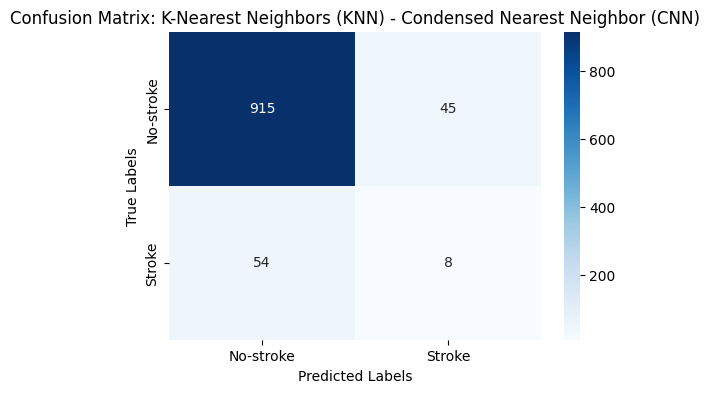

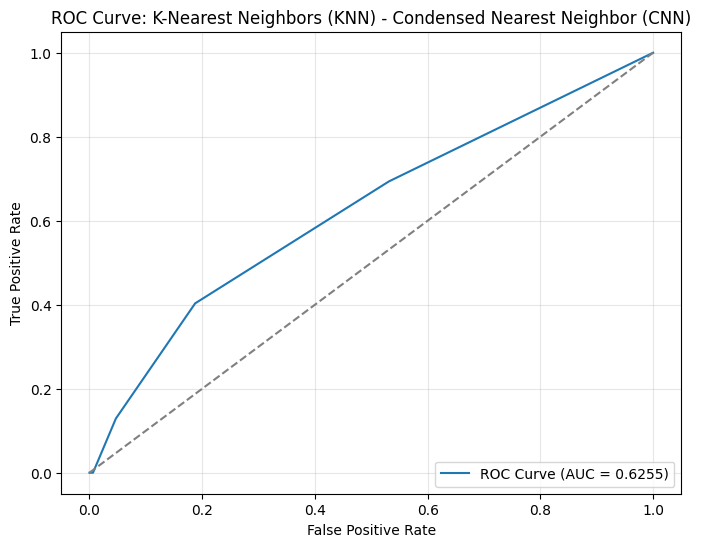


==================== K-Nearest Neighbors (KNN) with One-Sided Selection (OSS) ====================

K-Nearest Neighbors (KNN) with One-Sided Selection (OSS) Evaluation Metrics:
Accuracy: 0.9315
Precision: 0.1000
Recall: 0.0161
F1 Score: 0.0278
ROC-AUC Score: 0.6440

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.99      0.96       960
           1       0.10      0.02      0.03        62

    accuracy                           0.93      1022
   macro avg       0.52      0.50      0.50      1022
weighted avg       0.89      0.93      0.91      1022


Confusion Matrix:
[[951   9]
 [ 61   1]]


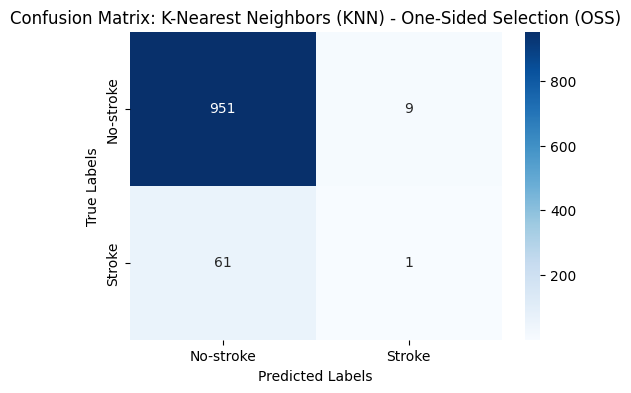

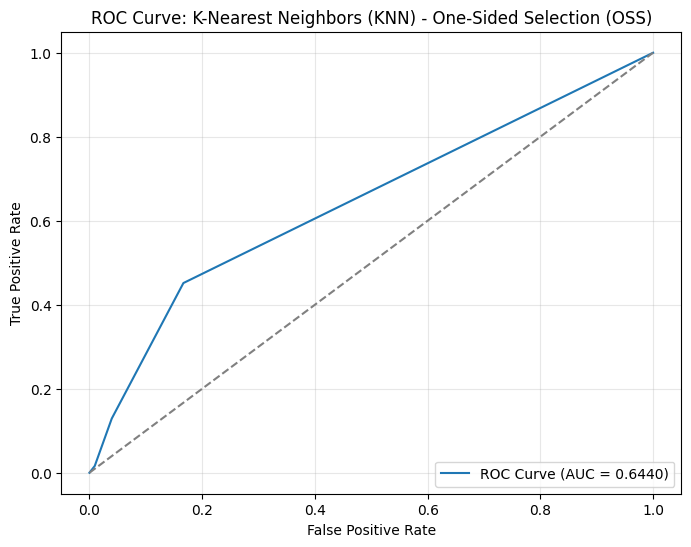


==================== K-Nearest Neighbors (KNN) with Neighborhood Cleaning Rule (NCR) ====================

K-Nearest Neighbors (KNN) with Neighborhood Cleaning Rule (NCR) Evaluation Metrics:
Accuracy: 0.9266
Precision: 0.1579
Recall: 0.0484
F1 Score: 0.0741
ROC-AUC Score: 0.6811

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.98      0.96       960
           1       0.16      0.05      0.07        62

    accuracy                           0.93      1022
   macro avg       0.55      0.52      0.52      1022
weighted avg       0.89      0.93      0.91      1022


Confusion Matrix:
[[944  16]
 [ 59   3]]


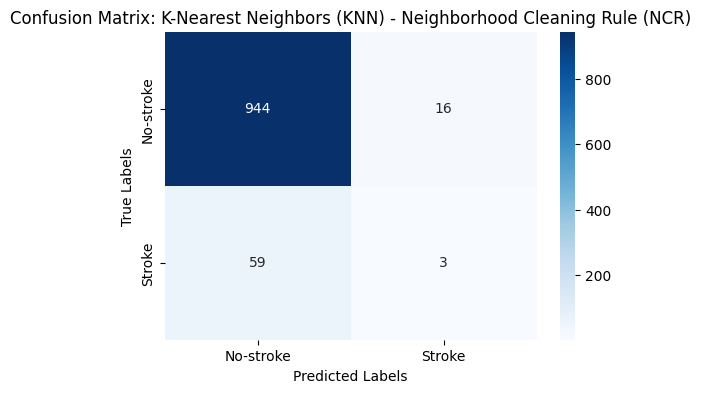

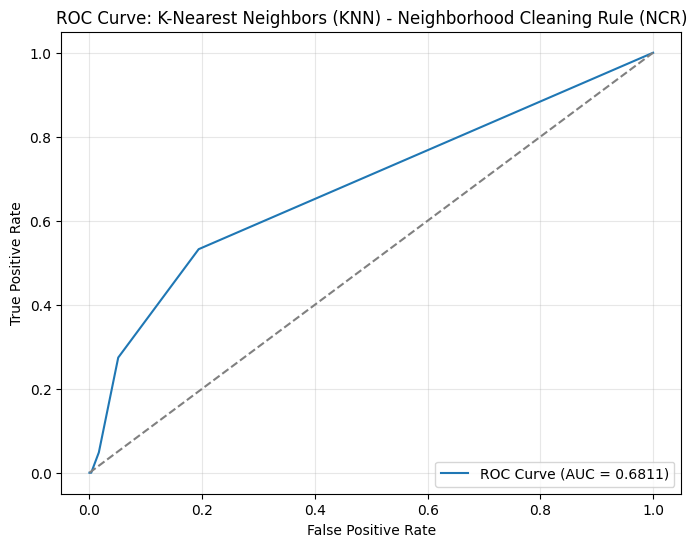


==================== K-Nearest Neighbors (KNN) with Instance Hardness Threshold ====================

K-Nearest Neighbors (KNN) with Instance Hardness Threshold Evaluation Metrics:
Accuracy: 0.7926
Precision: 0.1849
Recall: 0.7097
F1 Score: 0.2933
ROC-AUC Score: 0.7667

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.80      0.88       960
           1       0.18      0.71      0.29        62

    accuracy                           0.79      1022
   macro avg       0.58      0.75      0.59      1022
weighted avg       0.93      0.79      0.84      1022


Confusion Matrix:
[[766 194]
 [ 18  44]]


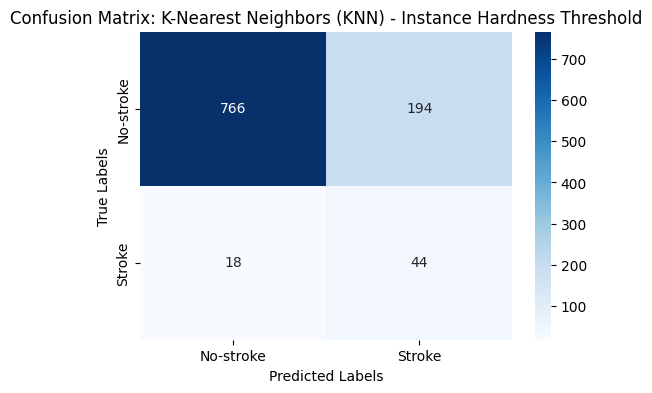

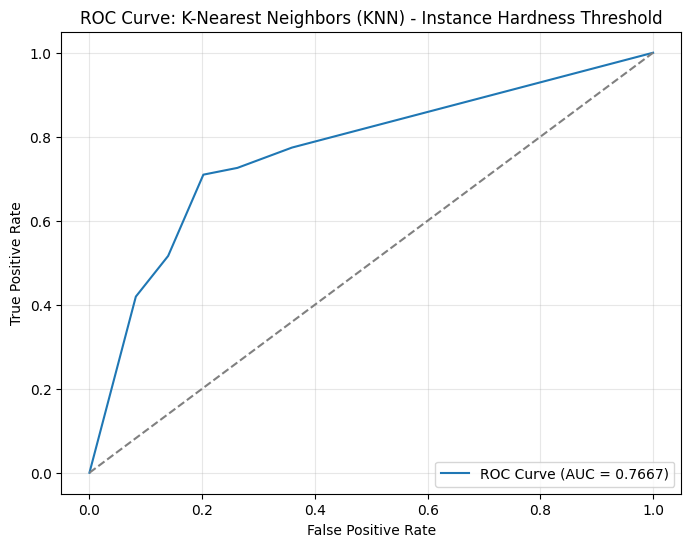


==================== Gaussian Naive Bayes with None ====================

Gaussian Naive Bayes with None Evaluation Metrics:
Accuracy: 0.8699
Precision: 0.2205
Recall: 0.4516
F1 Score: 0.2963
ROC-AUC Score: 0.8290

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.90      0.93       960
           1       0.22      0.45      0.30        62

    accuracy                           0.87      1022
   macro avg       0.59      0.67      0.61      1022
weighted avg       0.92      0.87      0.89      1022


Confusion Matrix:
[[861  99]
 [ 34  28]]


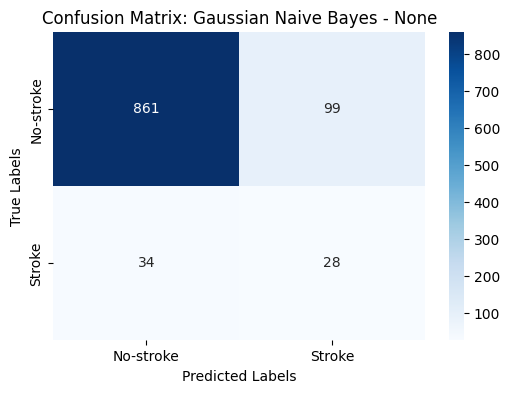

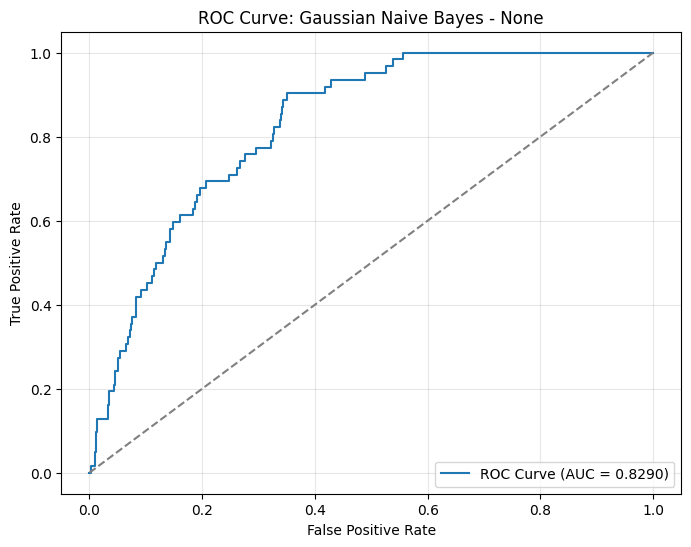


==================== Gaussian Naive Bayes with SMOTE ====================

Gaussian Naive Bayes with SMOTE Evaluation Metrics:
Accuracy: 0.7025
Precision: 0.1399
Recall: 0.7581
F1 Score: 0.2362
ROC-AUC Score: 0.8143

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.70      0.82       960
           1       0.14      0.76      0.24        62

    accuracy                           0.70      1022
   macro avg       0.56      0.73      0.53      1022
weighted avg       0.93      0.70      0.78      1022


Confusion Matrix:
[[671 289]
 [ 15  47]]


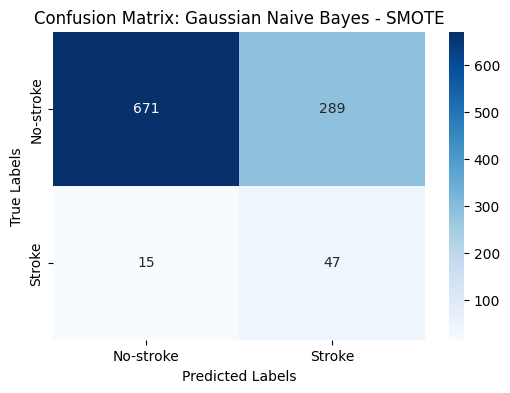

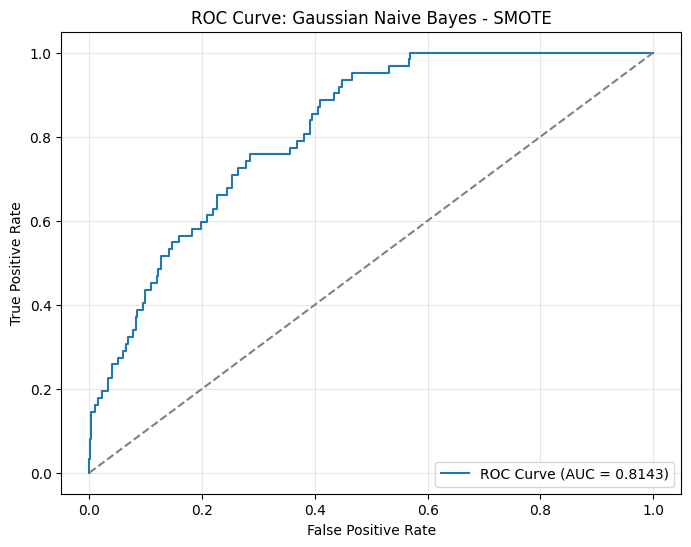


==================== Gaussian Naive Bayes with ClusterCentroids ====================

Gaussian Naive Bayes with ClusterCentroids Evaluation Metrics:
Accuracy: 0.8268
Precision: 0.1751
Recall: 0.5000
F1 Score: 0.2594
ROC-AUC Score: 0.7708

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.85      0.90       960
           1       0.18      0.50      0.26        62

    accuracy                           0.83      1022
   macro avg       0.57      0.67      0.58      1022
weighted avg       0.92      0.83      0.86      1022


Confusion Matrix:
[[814 146]
 [ 31  31]]


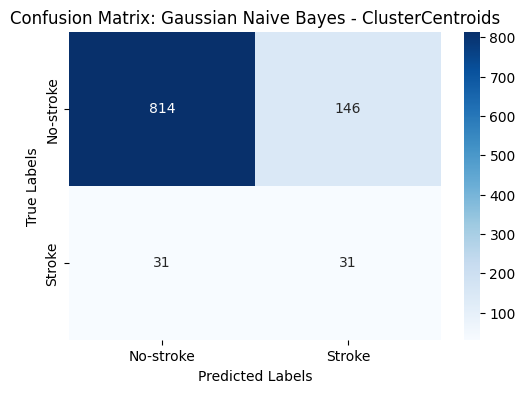

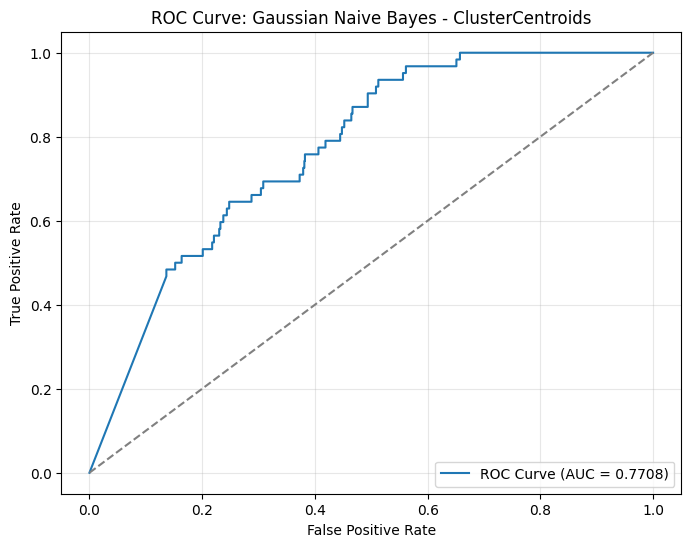


==================== Gaussian Naive Bayes with Random Undersampling ====================

Gaussian Naive Bayes with Random Undersampling Evaluation Metrics:
Accuracy: 0.7397
Precision: 0.1507
Recall: 0.7097
F1 Score: 0.2486
ROC-AUC Score: 0.8296

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.74      0.84       960
           1       0.15      0.71      0.25        62

    accuracy                           0.74      1022
   macro avg       0.56      0.73      0.55      1022
weighted avg       0.93      0.74      0.81      1022


Confusion Matrix:
[[712 248]
 [ 18  44]]


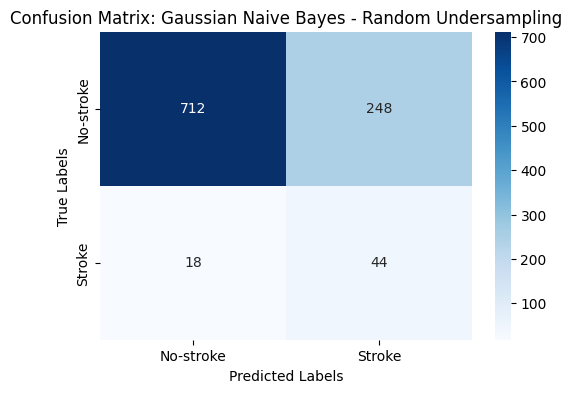

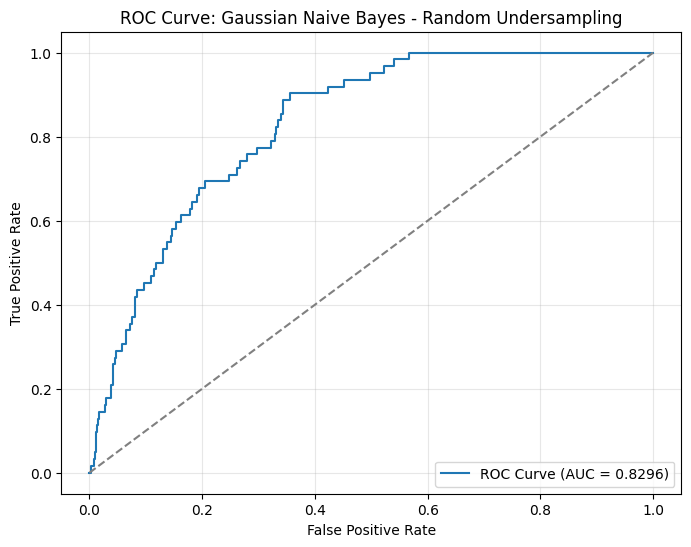


==================== Gaussian Naive Bayes with NearMiss-1 ====================

Gaussian Naive Bayes with NearMiss-1 Evaluation Metrics:
Accuracy: 0.2710
Precision: 0.0489
Recall: 0.5968
F1 Score: 0.0904
ROC-AUC Score: 0.3923

Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.25      0.39       960
           1       0.05      0.60      0.09        62

    accuracy                           0.27      1022
   macro avg       0.48      0.42      0.24      1022
weighted avg       0.85      0.27      0.37      1022


Confusion Matrix:
[[240 720]
 [ 25  37]]


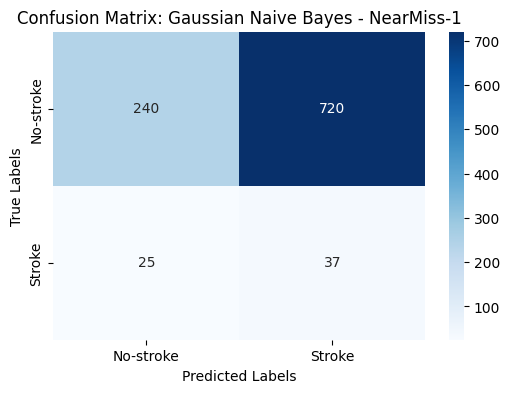

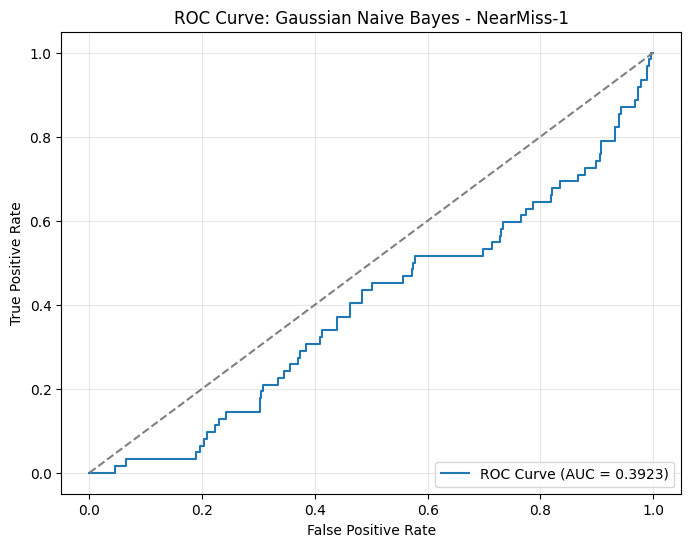


==================== Gaussian Naive Bayes with NearMiss-2 ====================

Gaussian Naive Bayes with NearMiss-2 Evaluation Metrics:
Accuracy: 0.2358
Precision: 0.0715
Recall: 0.9677
F1 Score: 0.1332
ROC-AUC Score: 0.7120

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.19      0.32       960
           1       0.07      0.97      0.13        62

    accuracy                           0.24      1022
   macro avg       0.53      0.58      0.22      1022
weighted avg       0.93      0.24      0.31      1022


Confusion Matrix:
[[181 779]
 [  2  60]]


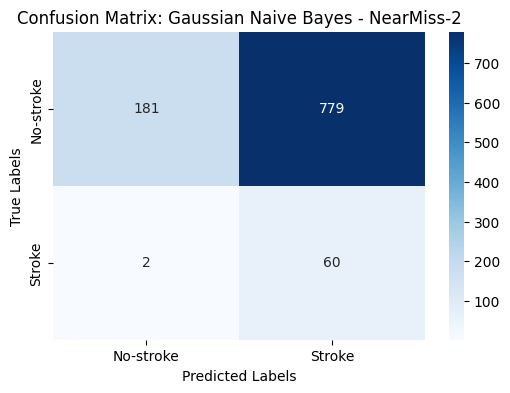

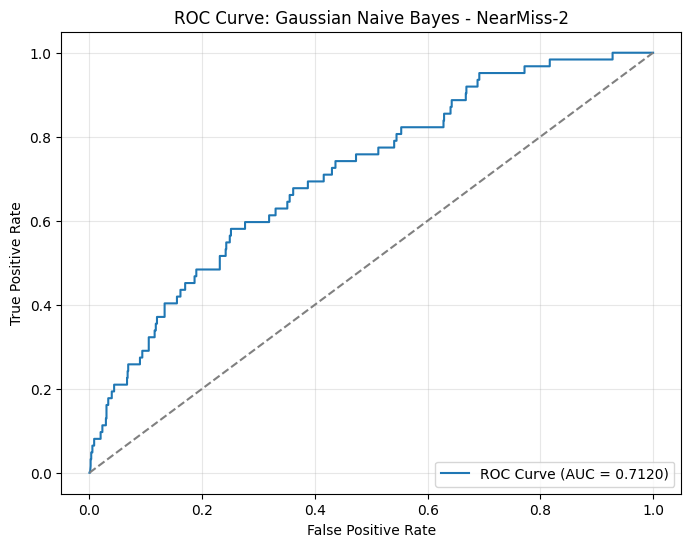


==================== Gaussian Naive Bayes with NearMiss-3 ====================

Gaussian Naive Bayes with NearMiss-3 Evaluation Metrics:
Accuracy: 0.7378
Precision: 0.1497
Recall: 0.7097
F1 Score: 0.2472
ROC-AUC Score: 0.7905

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.74      0.84       960
           1       0.15      0.71      0.25        62

    accuracy                           0.74      1022
   macro avg       0.56      0.72      0.54      1022
weighted avg       0.93      0.74      0.81      1022


Confusion Matrix:
[[710 250]
 [ 18  44]]


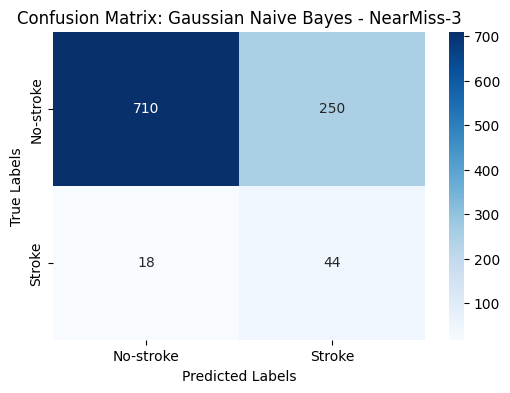

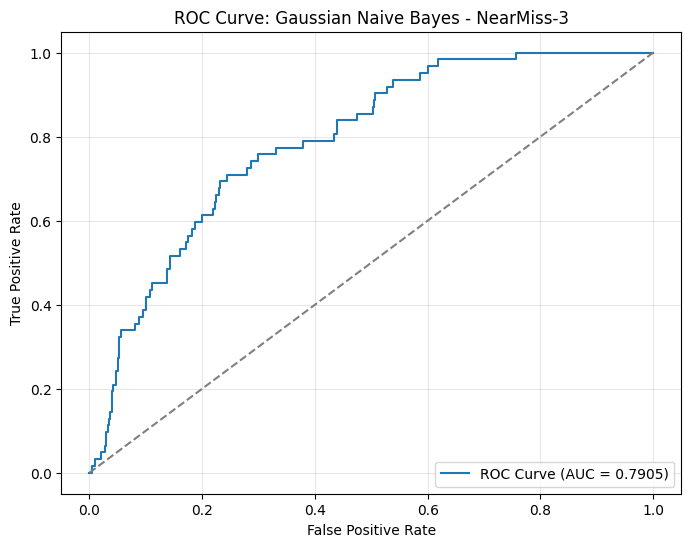


==================== Gaussian Naive Bayes with Tomek Links ====================

Gaussian Naive Bayes with Tomek Links Evaluation Metrics:
Accuracy: 0.8640
Precision: 0.2148
Recall: 0.4677
F1 Score: 0.2944
ROC-AUC Score: 0.8288

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.89      0.92       960
           1       0.21      0.47      0.29        62

    accuracy                           0.86      1022
   macro avg       0.59      0.68      0.61      1022
weighted avg       0.92      0.86      0.89      1022


Confusion Matrix:
[[854 106]
 [ 33  29]]


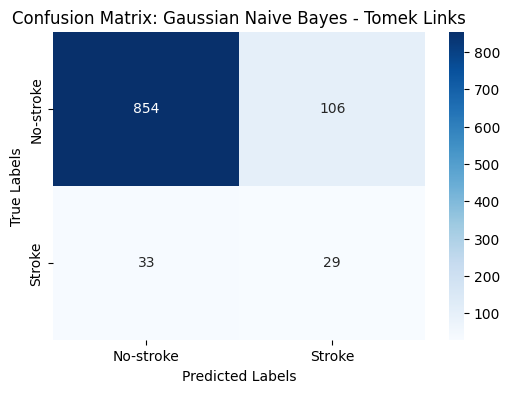

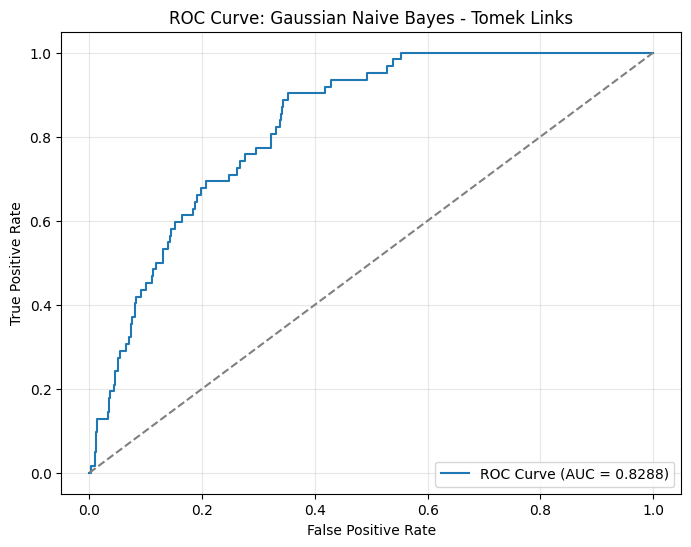


==================== Gaussian Naive Bayes with Edited Nearest Neighbors (ENN) ====================

Gaussian Naive Bayes with Edited Nearest Neighbors (ENN) Evaluation Metrics:
Accuracy: 0.8513
Precision: 0.2115
Recall: 0.5323
F1 Score: 0.3028
ROC-AUC Score: 0.8269

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.87      0.92       960
           1       0.21      0.53      0.30        62

    accuracy                           0.85      1022
   macro avg       0.59      0.70      0.61      1022
weighted avg       0.92      0.85      0.88      1022


Confusion Matrix:
[[837 123]
 [ 29  33]]


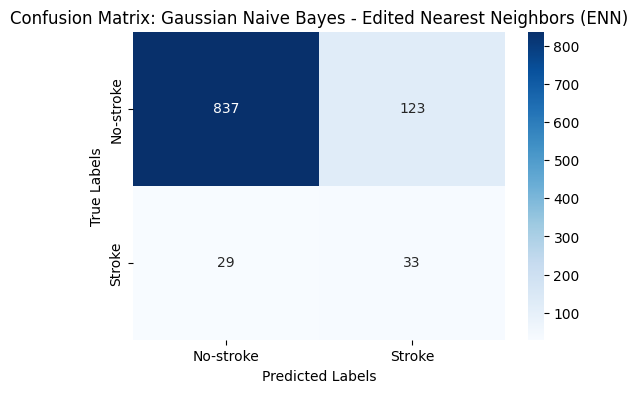

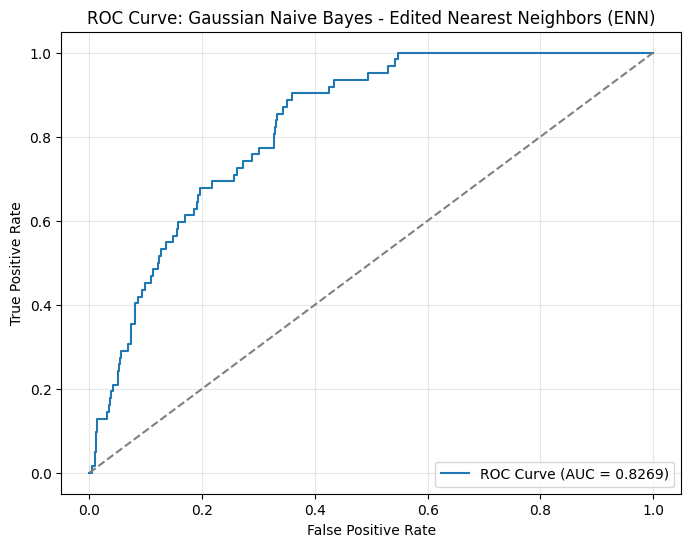


==================== Gaussian Naive Bayes with Repeated Edited Nearest Neighbors (RENN) ====================

Gaussian Naive Bayes with Repeated Edited Nearest Neighbors (RENN) Evaluation Metrics:
Accuracy: 0.8366
Precision: 0.1965
Recall: 0.5484
F1 Score: 0.2894
ROC-AUC Score: 0.8277

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.86      0.91       960
           1       0.20      0.55      0.29        62

    accuracy                           0.84      1022
   macro avg       0.58      0.70      0.60      1022
weighted avg       0.92      0.84      0.87      1022


Confusion Matrix:
[[821 139]
 [ 28  34]]


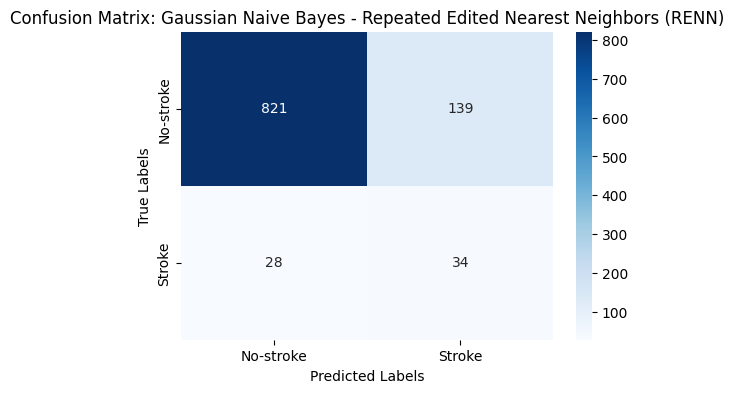

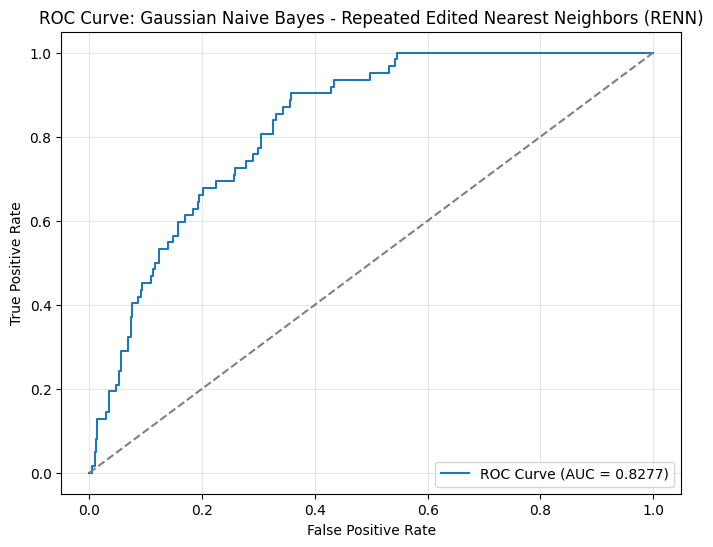


==================== Gaussian Naive Bayes with All KNN ====================

Gaussian Naive Bayes with All KNN Evaluation Metrics:
Accuracy: 0.8444
Precision: 0.2025
Recall: 0.5323
F1 Score: 0.2933
ROC-AUC Score: 0.8273

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.86      0.91       960
           1       0.20      0.53      0.29        62

    accuracy                           0.84      1022
   macro avg       0.58      0.70      0.60      1022
weighted avg       0.92      0.84      0.88      1022


Confusion Matrix:
[[830 130]
 [ 29  33]]


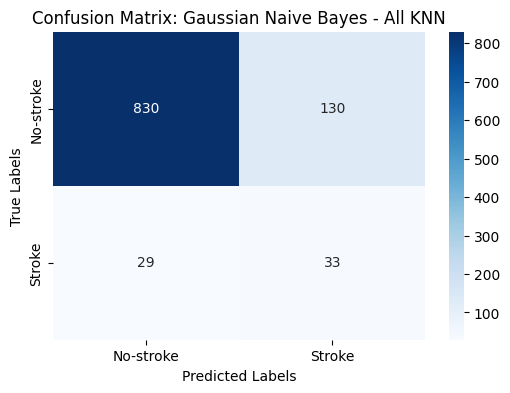

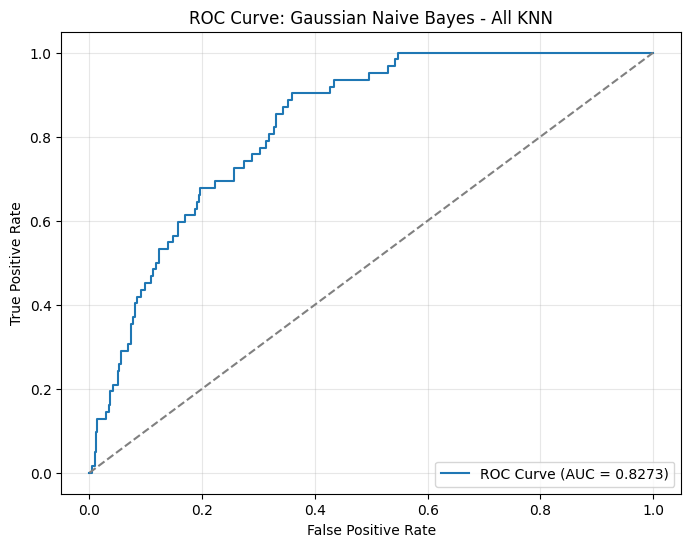


==================== Gaussian Naive Bayes with Condensed Nearest Neighbor (CNN) ====================

Gaussian Naive Bayes with Condensed Nearest Neighbor (CNN) Evaluation Metrics:
Accuracy: 0.9080
Precision: 0.2647
Recall: 0.2903
F1 Score: 0.2769
ROC-AUC Score: 0.8201

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.95      0.95       960
           1       0.26      0.29      0.28        62

    accuracy                           0.91      1022
   macro avg       0.61      0.62      0.61      1022
weighted avg       0.91      0.91      0.91      1022


Confusion Matrix:
[[910  50]
 [ 44  18]]


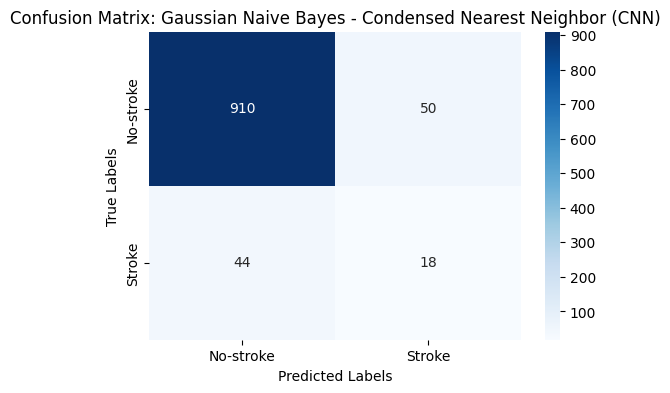

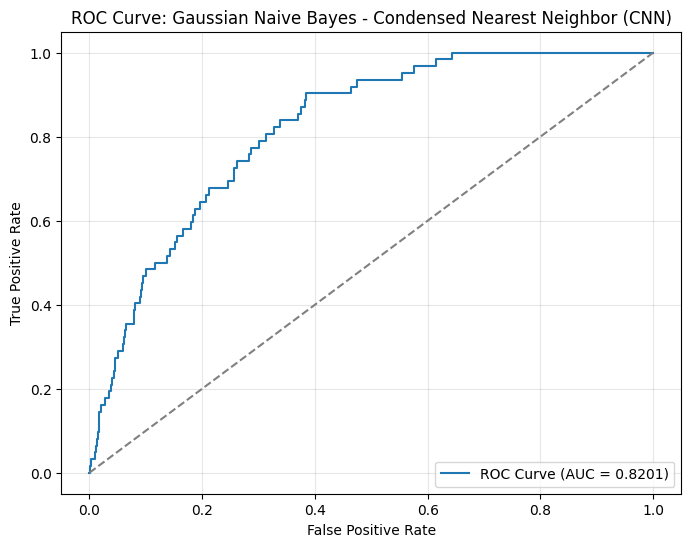


==================== Gaussian Naive Bayes with One-Sided Selection (OSS) ====================

Gaussian Naive Bayes with One-Sided Selection (OSS) Evaluation Metrics:
Accuracy: 0.8640
Precision: 0.2148
Recall: 0.4677
F1 Score: 0.2944
ROC-AUC Score: 0.8289

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.89      0.92       960
           1       0.21      0.47      0.29        62

    accuracy                           0.86      1022
   macro avg       0.59      0.68      0.61      1022
weighted avg       0.92      0.86      0.89      1022


Confusion Matrix:
[[854 106]
 [ 33  29]]


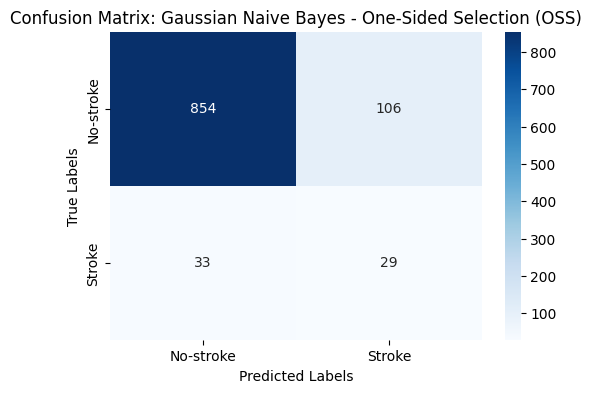

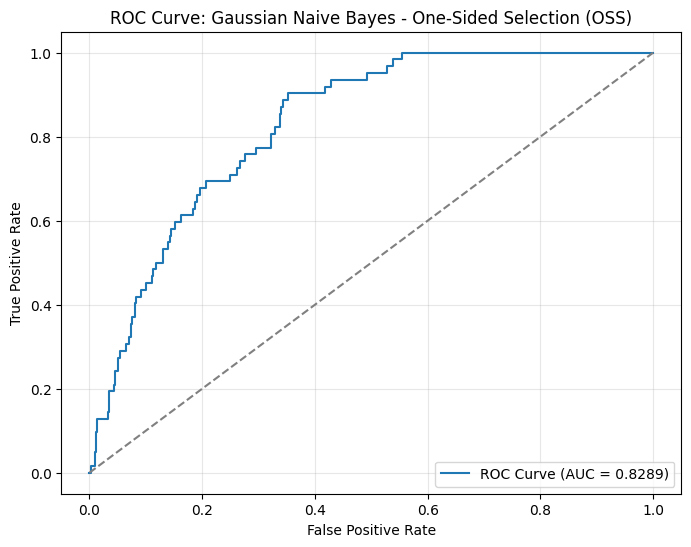


==================== Gaussian Naive Bayes with Neighborhood Cleaning Rule (NCR) ====================

Gaussian Naive Bayes with Neighborhood Cleaning Rule (NCR) Evaluation Metrics:
Accuracy: 0.8523
Precision: 0.2053
Recall: 0.5000
F1 Score: 0.2911
ROC-AUC Score: 0.8276

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.88      0.92       960
           1       0.21      0.50      0.29        62

    accuracy                           0.85      1022
   macro avg       0.58      0.69      0.60      1022
weighted avg       0.92      0.85      0.88      1022


Confusion Matrix:
[[840 120]
 [ 31  31]]


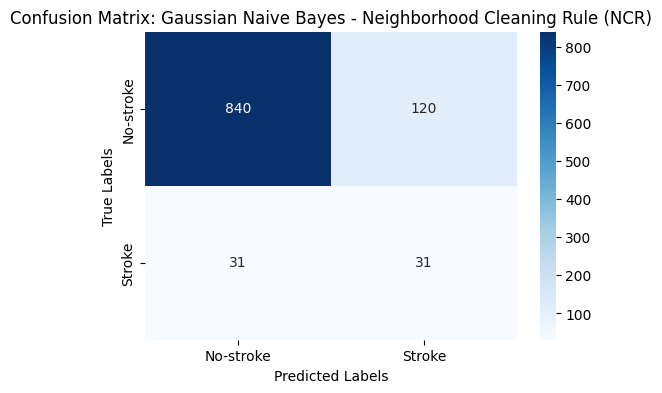

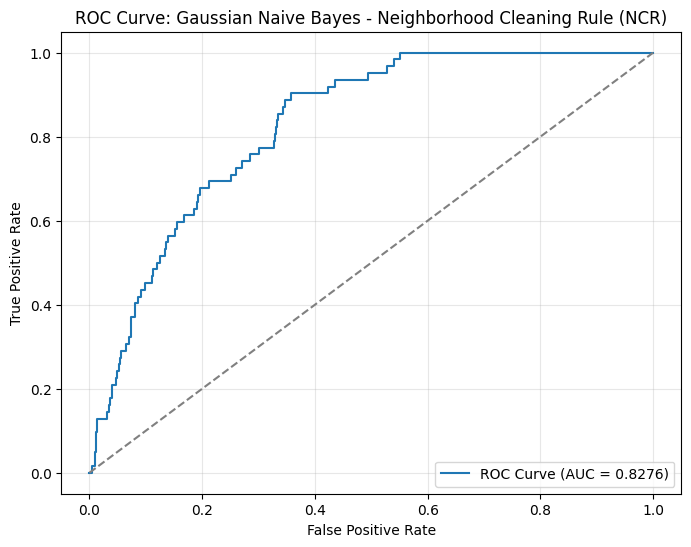


==================== Gaussian Naive Bayes with Instance Hardness Threshold ====================

Gaussian Naive Bayes with Instance Hardness Threshold Evaluation Metrics:
Accuracy: 0.8376
Precision: 0.1905
Recall: 0.5161
F1 Score: 0.2783
ROC-AUC Score: 0.8141

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.86      0.91       960
           1       0.19      0.52      0.28        62

    accuracy                           0.84      1022
   macro avg       0.58      0.69      0.59      1022
weighted avg       0.92      0.84      0.87      1022


Confusion Matrix:
[[824 136]
 [ 30  32]]


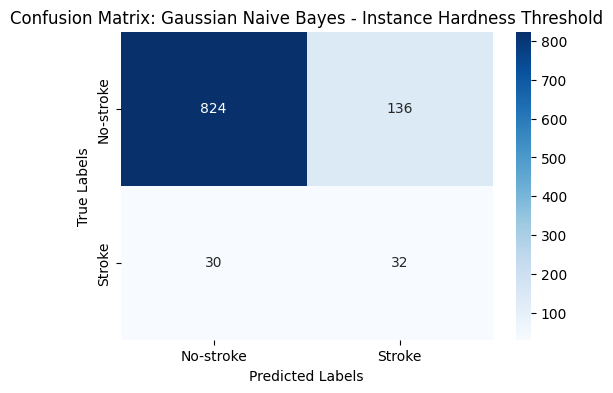

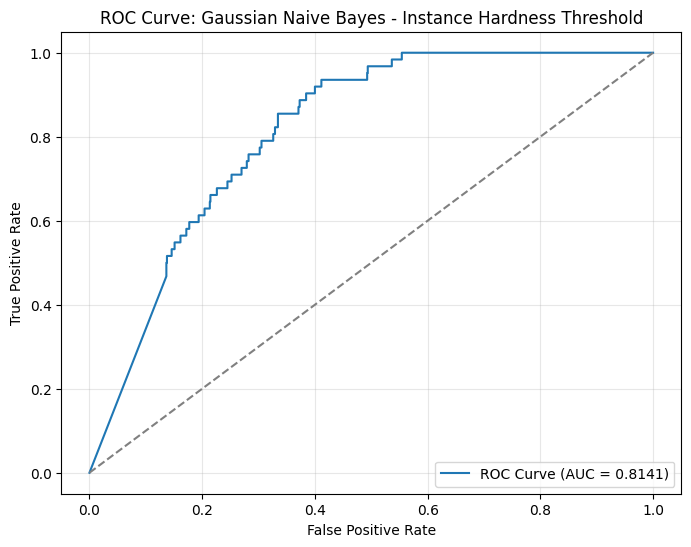


==================== Linear Discriminant Analysis (LDA) with None ====================

Linear Discriminant Analysis (LDA) with None Evaluation Metrics:
Accuracy: 0.9354
Precision: 0.3000
Recall: 0.0484
F1 Score: 0.0833
ROC-AUC Score: 0.8378

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.99      0.97       960
           1       0.30      0.05      0.08        62

    accuracy                           0.94      1022
   macro avg       0.62      0.52      0.52      1022
weighted avg       0.90      0.94      0.91      1022


Confusion Matrix:
[[953   7]
 [ 59   3]]


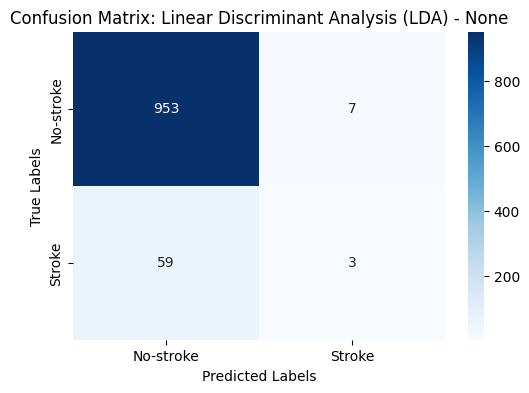

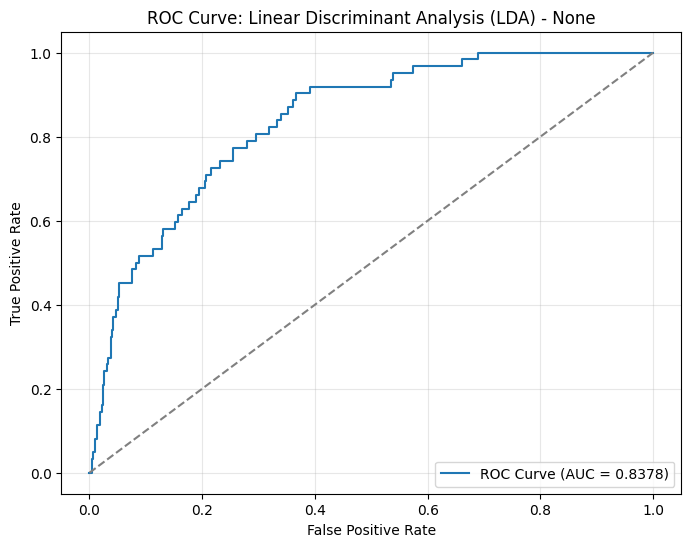


==================== Linear Discriminant Analysis (LDA) with SMOTE ====================

Linear Discriminant Analysis (LDA) with SMOTE Evaluation Metrics:
Accuracy: 0.7642
Precision: 0.1722
Recall: 0.7581
F1 Score: 0.2806
ROC-AUC Score: 0.8125

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.76      0.86       960
           1       0.17      0.76      0.28        62

    accuracy                           0.76      1022
   macro avg       0.58      0.76      0.57      1022
weighted avg       0.93      0.76      0.82      1022


Confusion Matrix:
[[734 226]
 [ 15  47]]


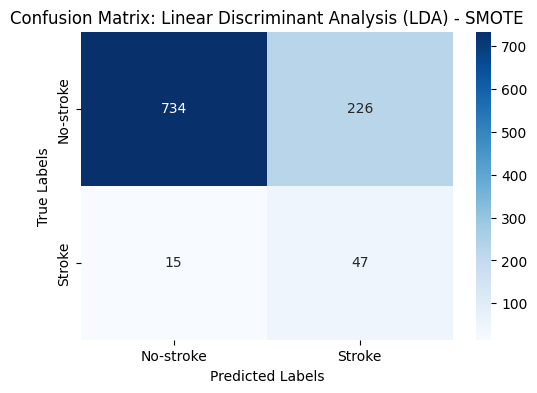

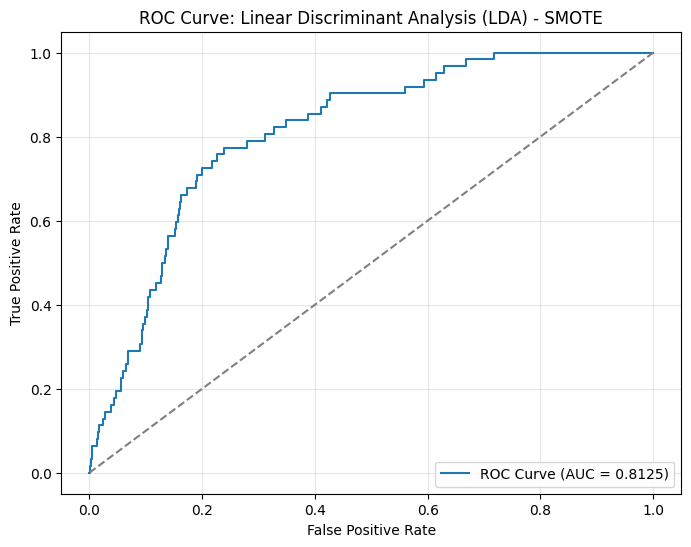


==================== Linear Discriminant Analysis (LDA) with ClusterCentroids ====================

Linear Discriminant Analysis (LDA) with ClusterCentroids Evaluation Metrics:
Accuracy: 0.3963
Precision: 0.0877
Recall: 0.9516
F1 Score: 0.1605
ROC-AUC Score: 0.7521

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.36      0.53       960
           1       0.09      0.95      0.16        62

    accuracy                           0.40      1022
   macro avg       0.54      0.66      0.34      1022
weighted avg       0.94      0.40      0.51      1022


Confusion Matrix:
[[346 614]
 [  3  59]]


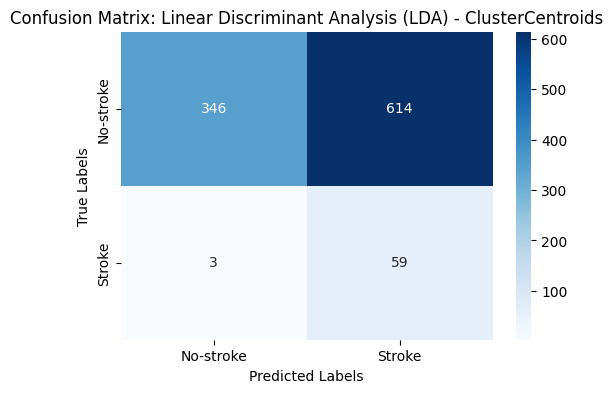

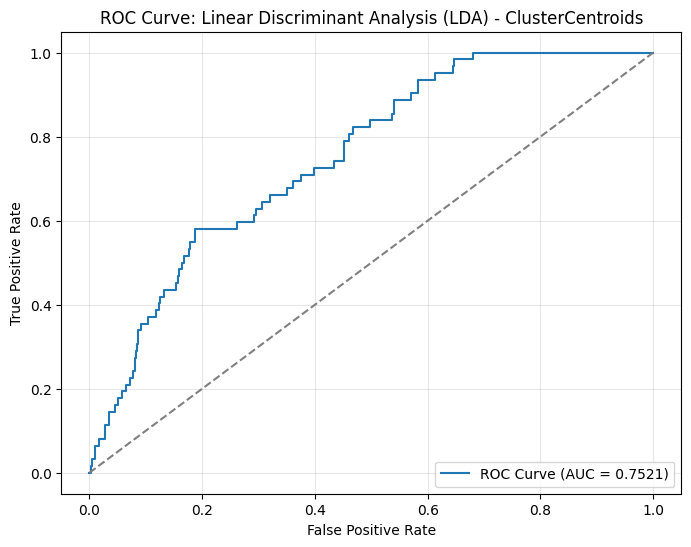


==================== Linear Discriminant Analysis (LDA) with Random Undersampling ====================

Linear Discriminant Analysis (LDA) with Random Undersampling Evaluation Metrics:
Accuracy: 0.7378
Precision: 0.1567
Recall: 0.7581
F1 Score: 0.2597
ROC-AUC Score: 0.8466

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.74      0.84       960
           1       0.16      0.76      0.26        62

    accuracy                           0.74      1022
   macro avg       0.57      0.75      0.55      1022
weighted avg       0.93      0.74      0.81      1022


Confusion Matrix:
[[707 253]
 [ 15  47]]


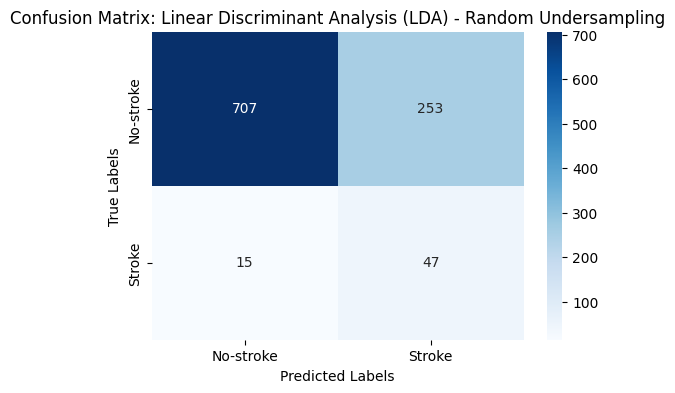

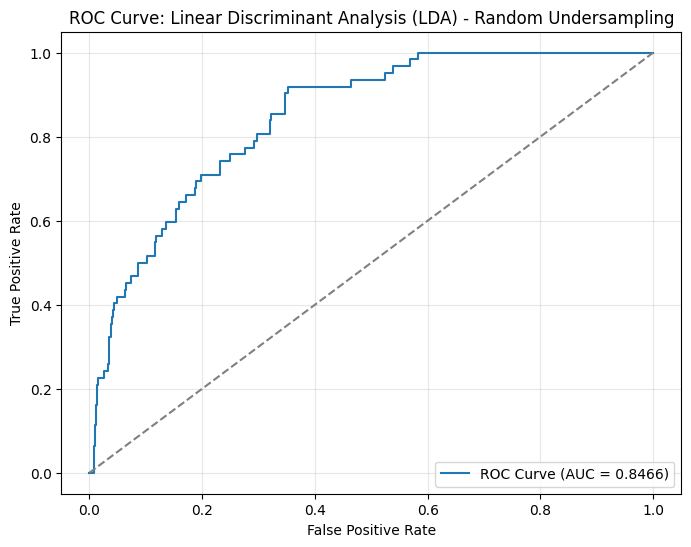


==================== Linear Discriminant Analysis (LDA) with NearMiss-1 ====================

Linear Discriminant Analysis (LDA) with NearMiss-1 Evaluation Metrics:
Accuracy: 0.2984
Precision: 0.0495
Recall: 0.5806
F1 Score: 0.0913
ROC-AUC Score: 0.4007

Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.28      0.43       960
           1       0.05      0.58      0.09        62

    accuracy                           0.30      1022
   macro avg       0.48      0.43      0.26      1022
weighted avg       0.86      0.30      0.41      1022


Confusion Matrix:
[[269 691]
 [ 26  36]]


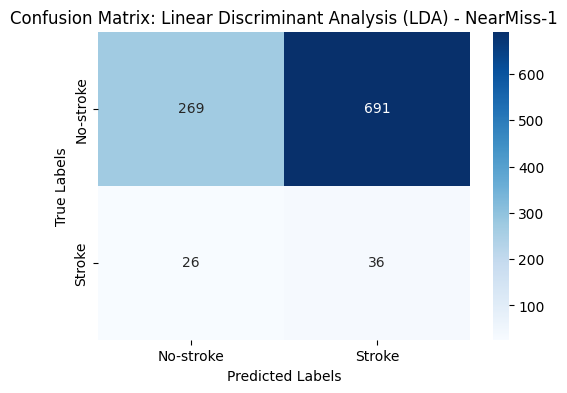

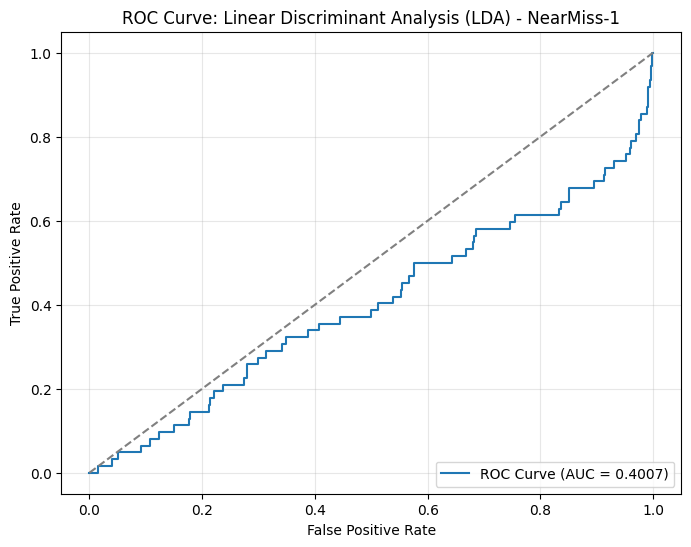


==================== Linear Discriminant Analysis (LDA) with NearMiss-2 ====================

Linear Discriminant Analysis (LDA) with NearMiss-2 Evaluation Metrics:
Accuracy: 0.6751
Precision: 0.1351
Recall: 0.8065
F1 Score: 0.2315
ROC-AUC Score: 0.7860

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.67      0.79       960
           1       0.14      0.81      0.23        62

    accuracy                           0.68      1022
   macro avg       0.56      0.74      0.51      1022
weighted avg       0.93      0.68      0.76      1022


Confusion Matrix:
[[640 320]
 [ 12  50]]


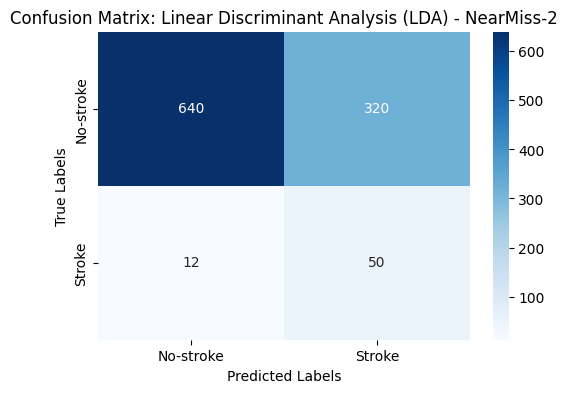

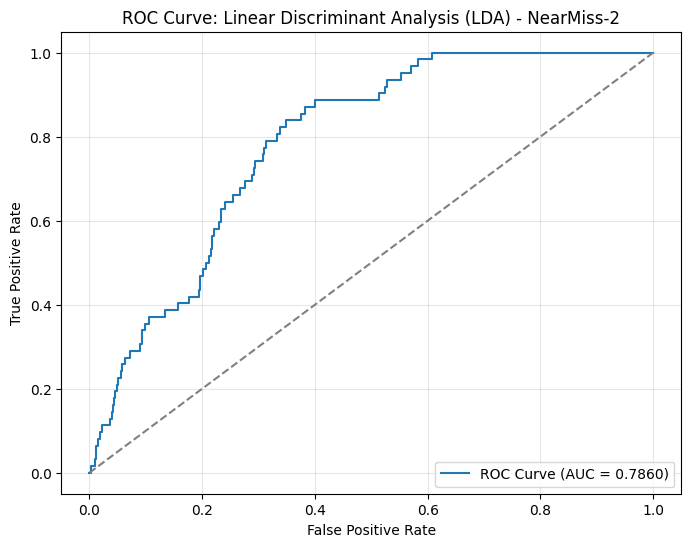


==================== Linear Discriminant Analysis (LDA) with NearMiss-3 ====================

Linear Discriminant Analysis (LDA) with NearMiss-3 Evaluation Metrics:
Accuracy: 0.7045
Precision: 0.1203
Recall: 0.6129
F1 Score: 0.2011
ROC-AUC Score: 0.7589

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.71      0.82       960
           1       0.12      0.61      0.20        62

    accuracy                           0.70      1022
   macro avg       0.54      0.66      0.51      1022
weighted avg       0.91      0.70      0.78      1022


Confusion Matrix:
[[682 278]
 [ 24  38]]


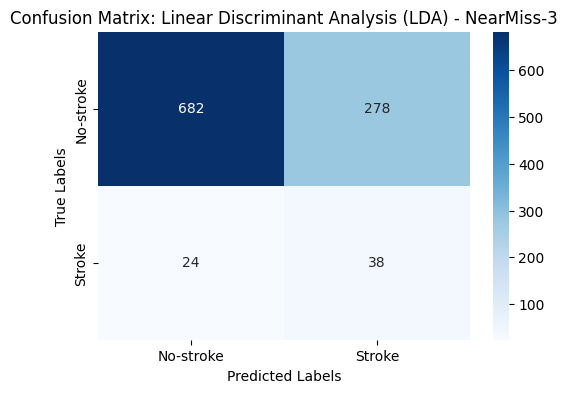

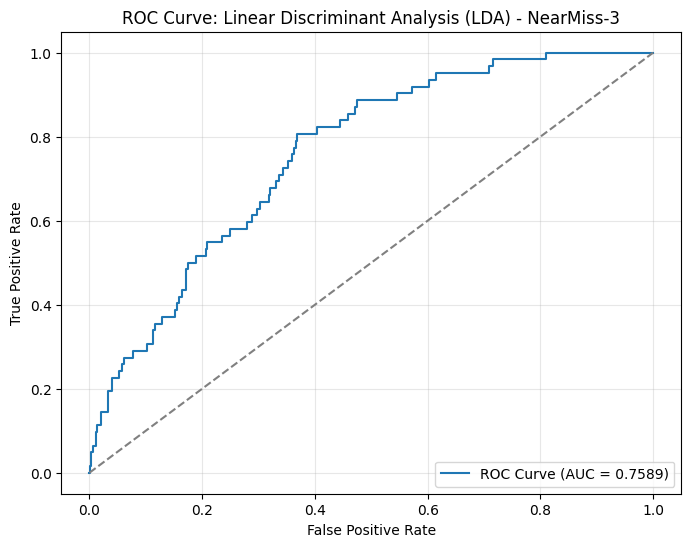


==================== Linear Discriminant Analysis (LDA) with Tomek Links ====================

Linear Discriminant Analysis (LDA) with Tomek Links Evaluation Metrics:
Accuracy: 0.9335
Precision: 0.3125
Recall: 0.0806
F1 Score: 0.1282
ROC-AUC Score: 0.8378

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.99      0.97       960
           1       0.31      0.08      0.13        62

    accuracy                           0.93      1022
   macro avg       0.63      0.53      0.55      1022
weighted avg       0.91      0.93      0.91      1022


Confusion Matrix:
[[949  11]
 [ 57   5]]


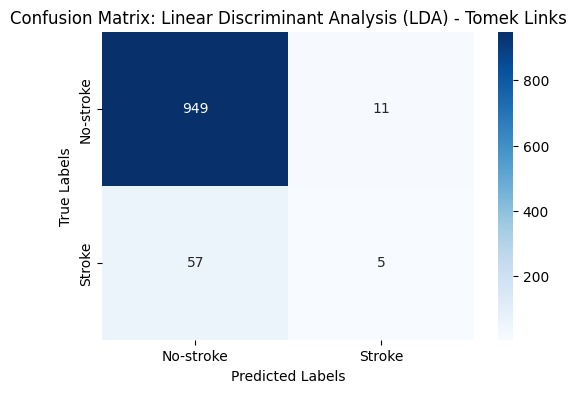

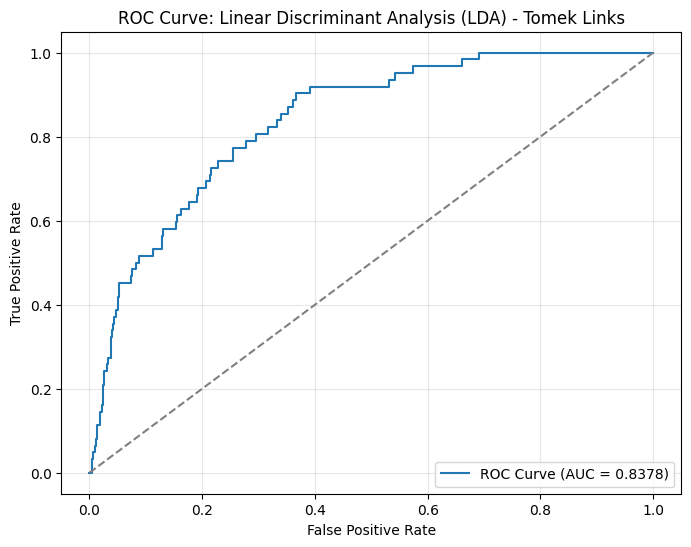


==================== Linear Discriminant Analysis (LDA) with Edited Nearest Neighbors (ENN) ====================

Linear Discriminant Analysis (LDA) with Edited Nearest Neighbors (ENN) Evaluation Metrics:
Accuracy: 0.9247
Precision: 0.3469
Recall: 0.2742
F1 Score: 0.3063
ROC-AUC Score: 0.8356

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.97      0.96       960
           1       0.35      0.27      0.31        62

    accuracy                           0.92      1022
   macro avg       0.65      0.62      0.63      1022
weighted avg       0.92      0.92      0.92      1022


Confusion Matrix:
[[928  32]
 [ 45  17]]


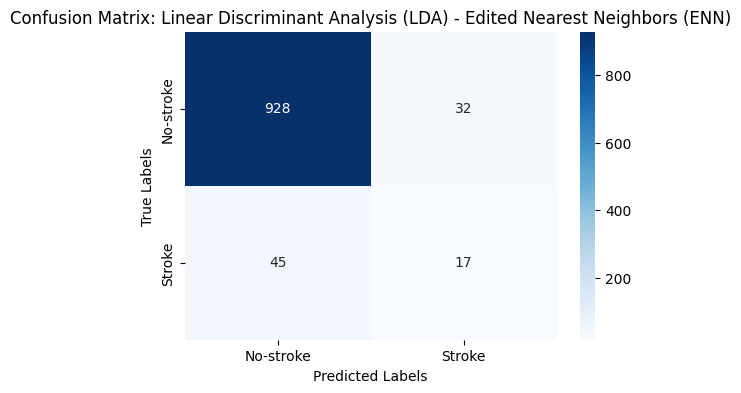

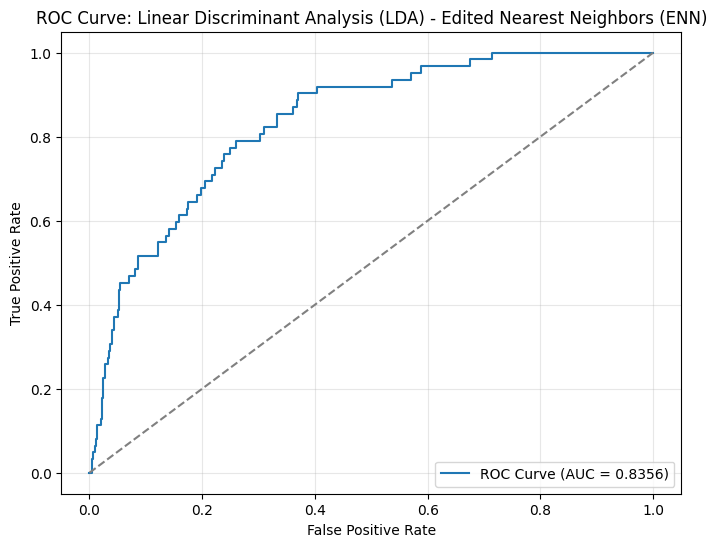


==================== Linear Discriminant Analysis (LDA) with Repeated Edited Nearest Neighbors (RENN) ====================

Linear Discriminant Analysis (LDA) with Repeated Edited Nearest Neighbors (RENN) Evaluation Metrics:
Accuracy: 0.9159
Precision: 0.3421
Recall: 0.4194
F1 Score: 0.3768
ROC-AUC Score: 0.8366

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.95      0.95       960
           1       0.34      0.42      0.38        62

    accuracy                           0.92      1022
   macro avg       0.65      0.68      0.67      1022
weighted avg       0.92      0.92      0.92      1022


Confusion Matrix:
[[910  50]
 [ 36  26]]


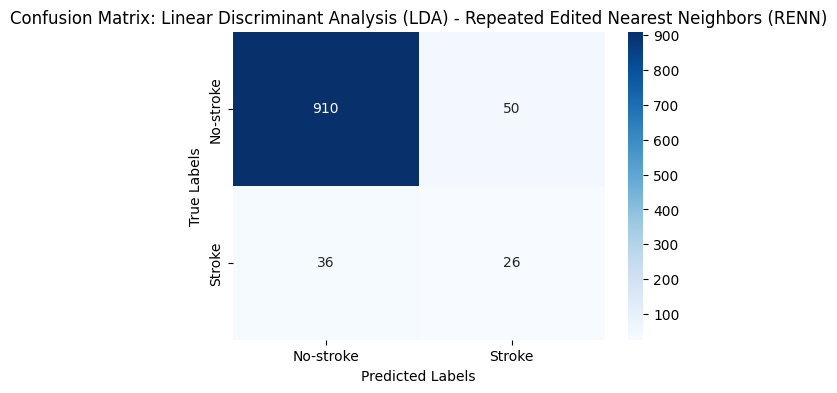

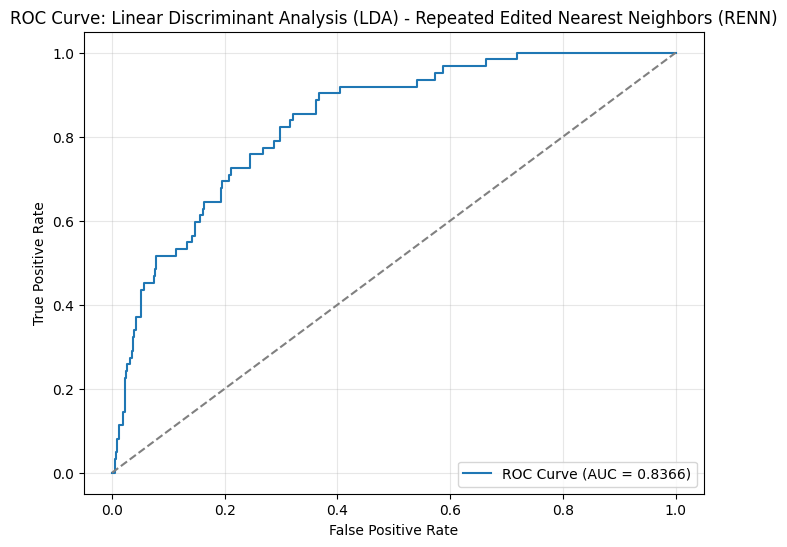


==================== Linear Discriminant Analysis (LDA) with All KNN ====================

Linear Discriminant Analysis (LDA) with All KNN Evaluation Metrics:
Accuracy: 0.9237
Precision: 0.3621
Recall: 0.3387
F1 Score: 0.3500
ROC-AUC Score: 0.8358

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.96      0.96       960
           1       0.36      0.34      0.35        62

    accuracy                           0.92      1022
   macro avg       0.66      0.65      0.65      1022
weighted avg       0.92      0.92      0.92      1022


Confusion Matrix:
[[923  37]
 [ 41  21]]


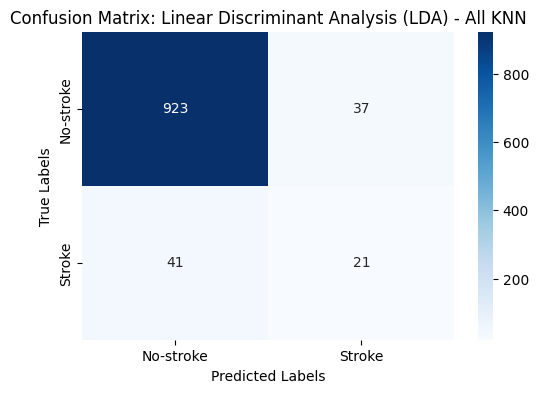

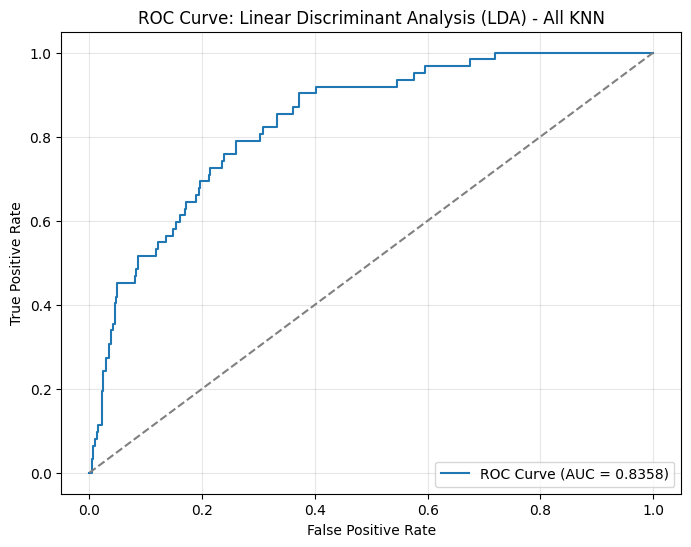


==================== Linear Discriminant Analysis (LDA) with Condensed Nearest Neighbor (CNN) ====================

Linear Discriminant Analysis (LDA) with Condensed Nearest Neighbor (CNN) Evaluation Metrics:
Accuracy: 0.9384
Precision: 0.4286
Recall: 0.0484
F1 Score: 0.0870
ROC-AUC Score: 0.7957

Classification Report:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.43      0.05      0.09        62

    accuracy                           0.94      1022
   macro avg       0.69      0.52      0.53      1022
weighted avg       0.91      0.94      0.91      1022


Confusion Matrix:
[[956   4]
 [ 59   3]]


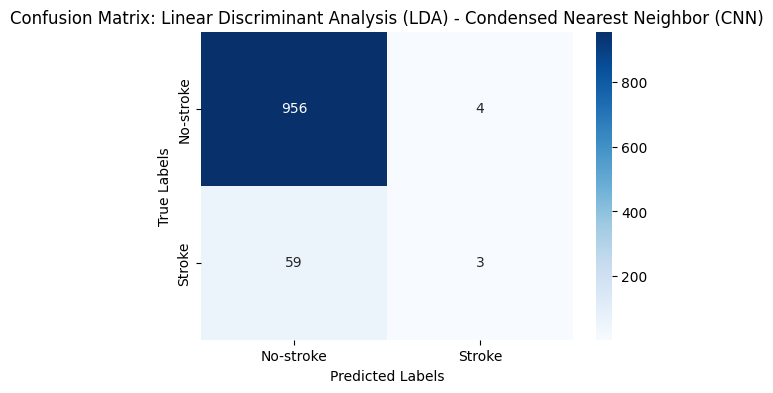

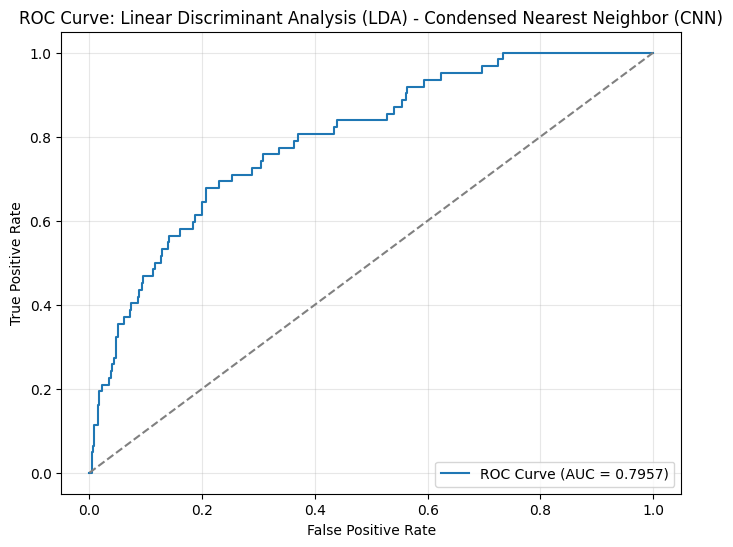


==================== Linear Discriminant Analysis (LDA) with One-Sided Selection (OSS) ====================

Linear Discriminant Analysis (LDA) with One-Sided Selection (OSS) Evaluation Metrics:
Accuracy: 0.9325
Precision: 0.2941
Recall: 0.0806
F1 Score: 0.1266
ROC-AUC Score: 0.8381

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.99      0.96       960
           1       0.29      0.08      0.13        62

    accuracy                           0.93      1022
   macro avg       0.62      0.53      0.55      1022
weighted avg       0.90      0.93      0.91      1022


Confusion Matrix:
[[948  12]
 [ 57   5]]


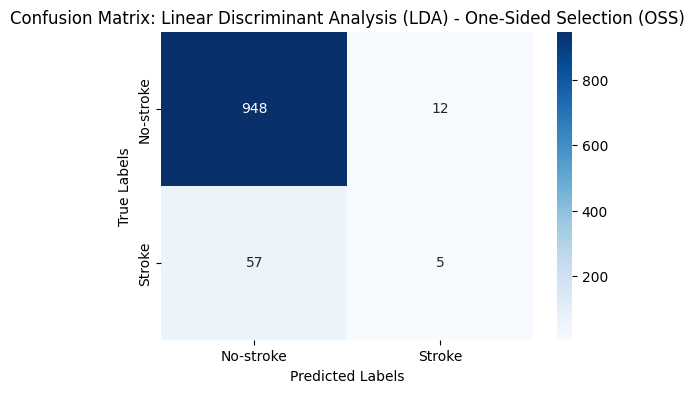

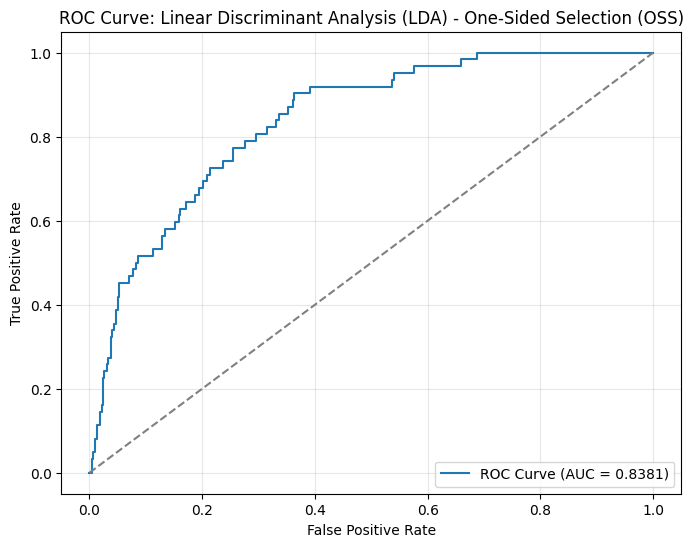


==================== Linear Discriminant Analysis (LDA) with Neighborhood Cleaning Rule (NCR) ====================

Linear Discriminant Analysis (LDA) with Neighborhood Cleaning Rule (NCR) Evaluation Metrics:
Accuracy: 0.9295
Precision: 0.3684
Recall: 0.2258
F1 Score: 0.2800
ROC-AUC Score: 0.8373

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.97      0.96       960
           1       0.37      0.23      0.28        62

    accuracy                           0.93      1022
   macro avg       0.66      0.60      0.62      1022
weighted avg       0.92      0.93      0.92      1022


Confusion Matrix:
[[936  24]
 [ 48  14]]


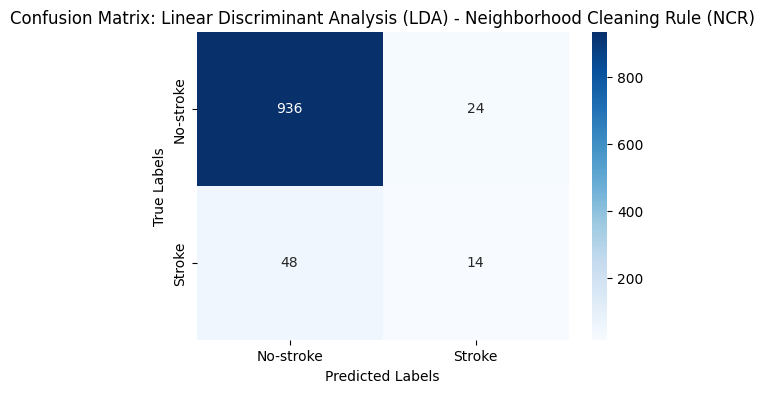

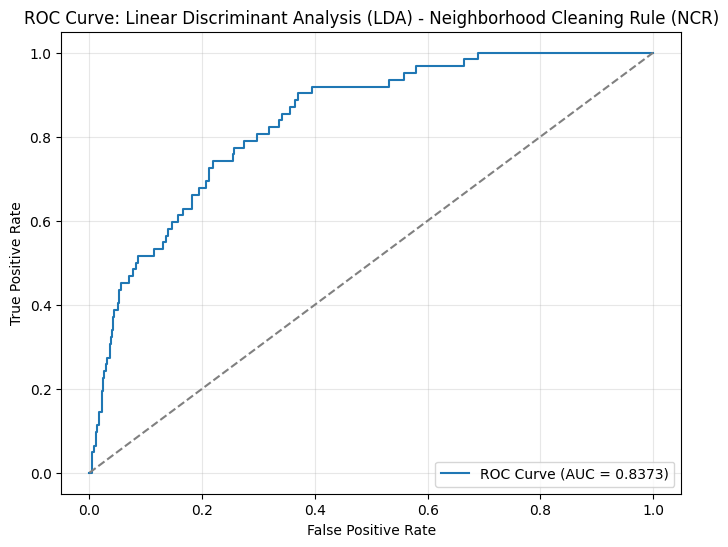


==================== Linear Discriminant Analysis (LDA) with Instance Hardness Threshold ====================

Linear Discriminant Analysis (LDA) with Instance Hardness Threshold Evaluation Metrics:
Accuracy: 0.7935
Precision: 0.1747
Recall: 0.6452
F1 Score: 0.2749
ROC-AUC Score: 0.8336

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.80      0.88       960
           1       0.17      0.65      0.27        62

    accuracy                           0.79      1022
   macro avg       0.57      0.72      0.58      1022
weighted avg       0.92      0.79      0.84      1022


Confusion Matrix:
[[771 189]
 [ 22  40]]


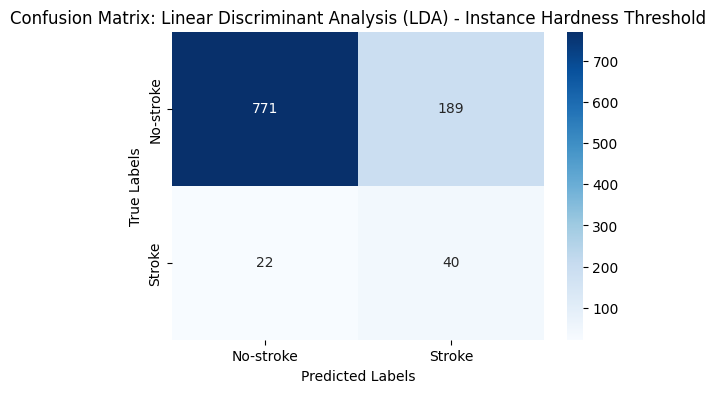

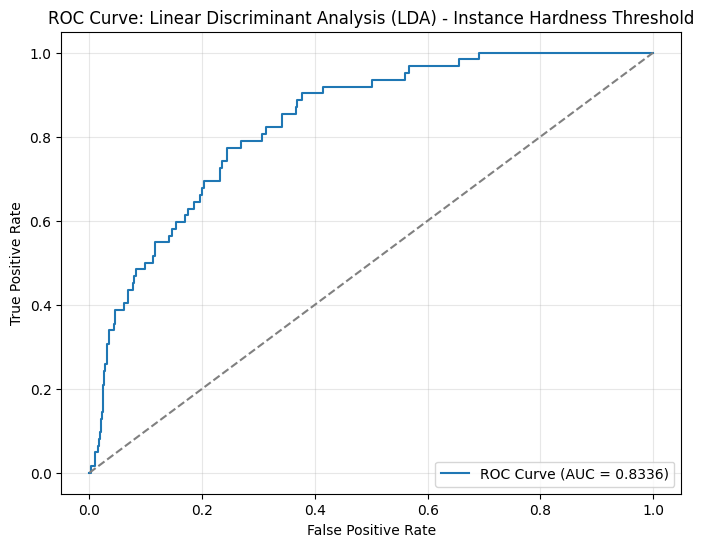


==================== Quadratic Discriminant Analysis (QDA) with None ====================

Quadratic Discriminant Analysis (QDA) with None Evaluation Metrics:
Accuracy: 0.8806
Precision: 0.2414
Recall: 0.4516
F1 Score: 0.3146
ROC-AUC Score: 0.8377

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.91      0.93       960
           1       0.24      0.45      0.31        62

    accuracy                           0.88      1022
   macro avg       0.60      0.68      0.62      1022
weighted avg       0.92      0.88      0.90      1022


Confusion Matrix:
[[872  88]
 [ 34  28]]


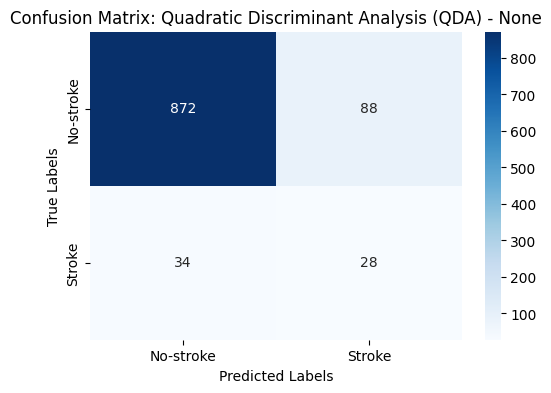

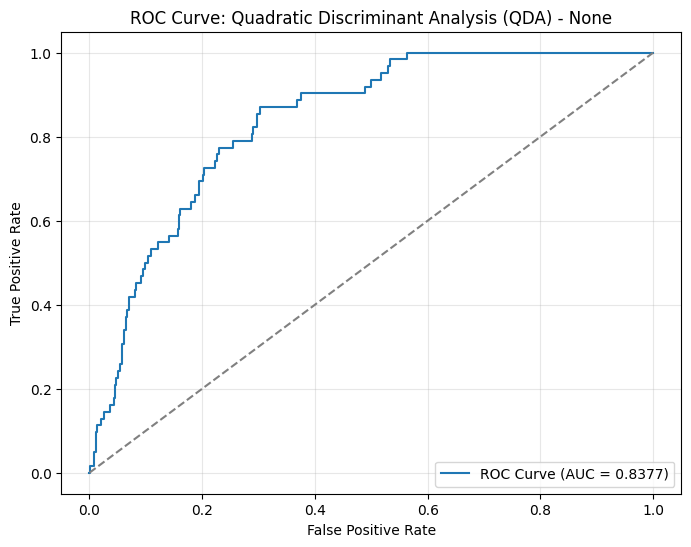


==================== Quadratic Discriminant Analysis (QDA) with SMOTE ====================

Quadratic Discriminant Analysis (QDA) with SMOTE Evaluation Metrics:
Accuracy: 0.7691
Precision: 0.1628
Recall: 0.6774
F1 Score: 0.2625
ROC-AUC Score: 0.8199

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.78      0.86       960
           1       0.16      0.68      0.26        62

    accuracy                           0.77      1022
   macro avg       0.57      0.73      0.56      1022
weighted avg       0.92      0.77      0.83      1022


Confusion Matrix:
[[744 216]
 [ 20  42]]


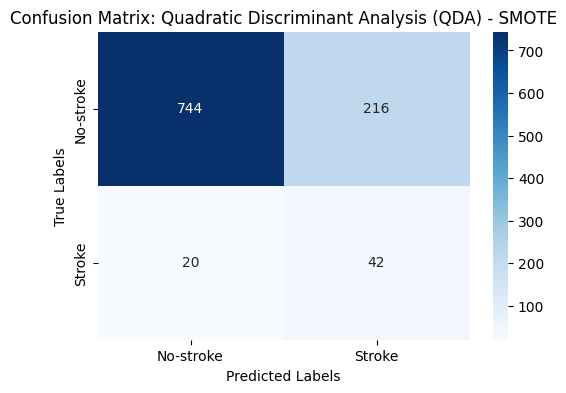

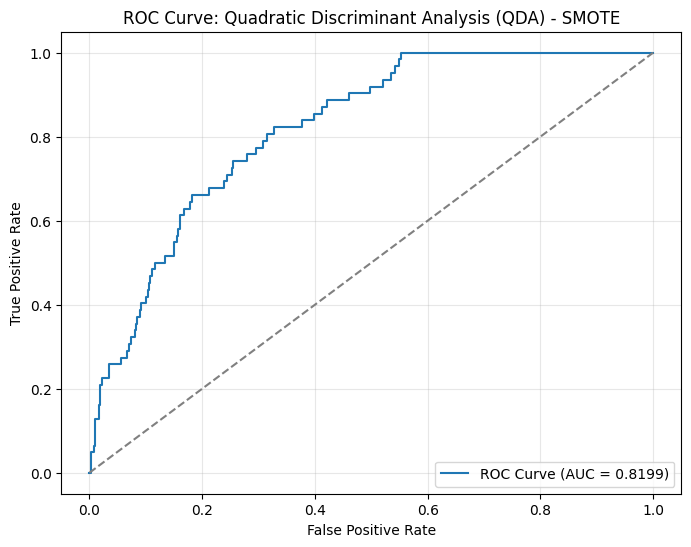


==================== Quadratic Discriminant Analysis (QDA) with ClusterCentroids ====================

Quadratic Discriminant Analysis (QDA) with ClusterCentroids Evaluation Metrics:
Accuracy: 0.8395
Precision: 0.1812
Recall: 0.4677
F1 Score: 0.2613
ROC-AUC Score: 0.7354

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.86      0.91       960
           1       0.18      0.47      0.26        62

    accuracy                           0.84      1022
   macro avg       0.57      0.67      0.59      1022
weighted avg       0.91      0.84      0.87      1022


Confusion Matrix:
[[829 131]
 [ 33  29]]


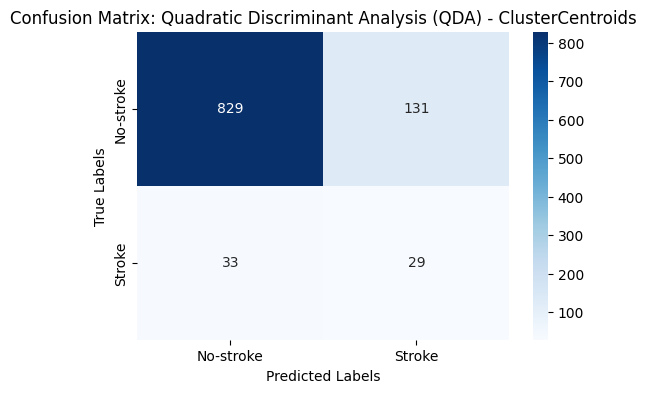

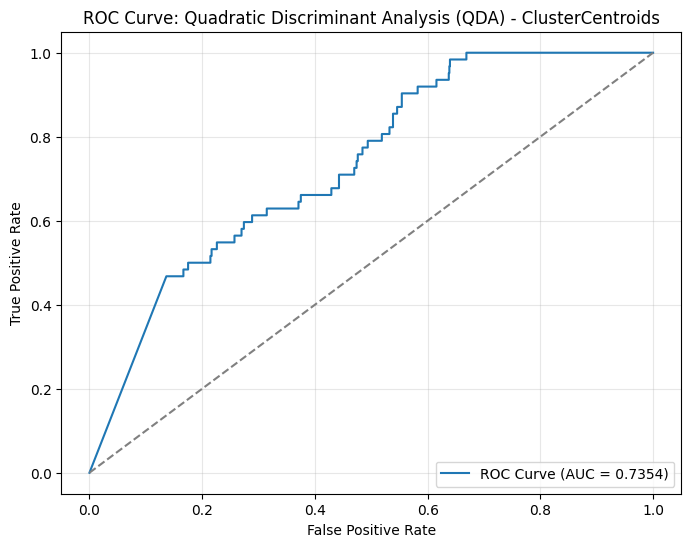


==================== Quadratic Discriminant Analysis (QDA) with Random Undersampling ====================

Quadratic Discriminant Analysis (QDA) with Random Undersampling Evaluation Metrics:
Accuracy: 0.7524
Precision: 0.1672
Recall: 0.7742
F1 Score: 0.2751
ROC-AUC Score: 0.8366

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.75      0.85       960
           1       0.17      0.77      0.28        62

    accuracy                           0.75      1022
   macro avg       0.57      0.76      0.56      1022
weighted avg       0.93      0.75      0.82      1022


Confusion Matrix:
[[721 239]
 [ 14  48]]


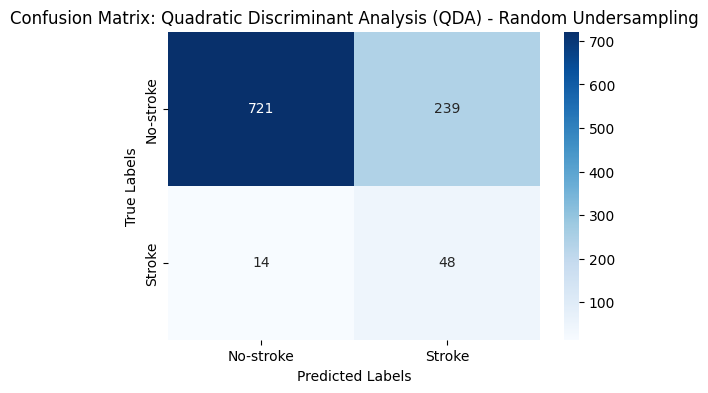

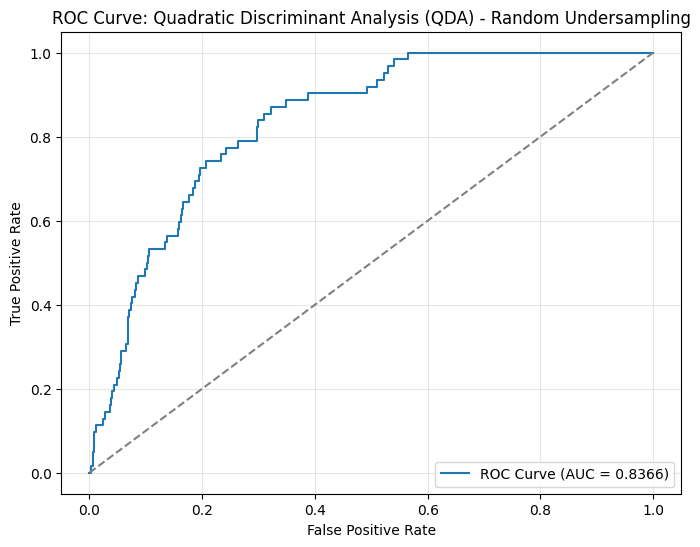


==================== Quadratic Discriminant Analysis (QDA) with NearMiss-1 ====================

Quadratic Discriminant Analysis (QDA) with NearMiss-1 Evaluation Metrics:
Accuracy: 0.2456
Precision: 0.0496
Recall: 0.6290
F1 Score: 0.0919
ROC-AUC Score: 0.3564

Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.22      0.35       960
           1       0.05      0.63      0.09        62

    accuracy                           0.25      1022
   macro avg       0.48      0.42      0.22      1022
weighted avg       0.85      0.25      0.34      1022


Confusion Matrix:
[[212 748]
 [ 23  39]]


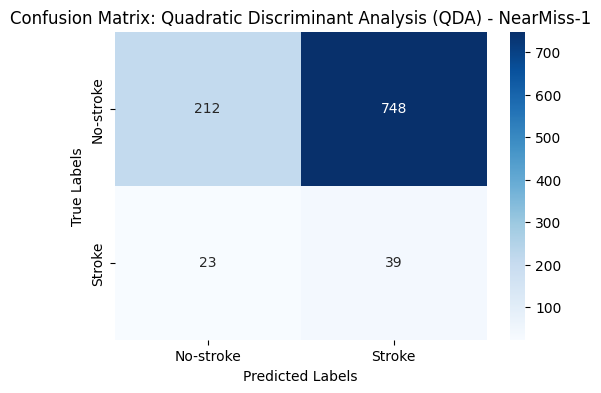

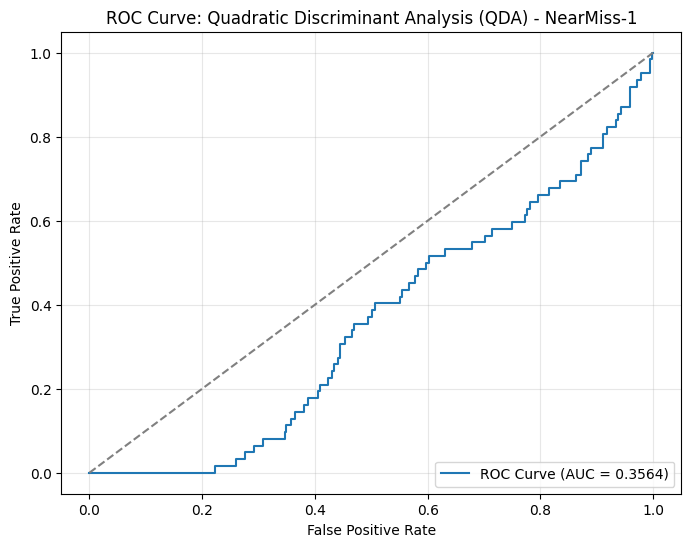


==================== Quadratic Discriminant Analysis (QDA) with NearMiss-2 ====================

Quadratic Discriminant Analysis (QDA) with NearMiss-2 Evaluation Metrics:
Accuracy: 0.2466
Precision: 0.0735
Recall: 0.9839
F1 Score: 0.1368
ROC-AUC Score: 0.7076

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.20      0.33       960
           1       0.07      0.98      0.14        62

    accuracy                           0.25      1022
   macro avg       0.53      0.59      0.23      1022
weighted avg       0.94      0.25      0.32      1022


Confusion Matrix:
[[191 769]
 [  1  61]]


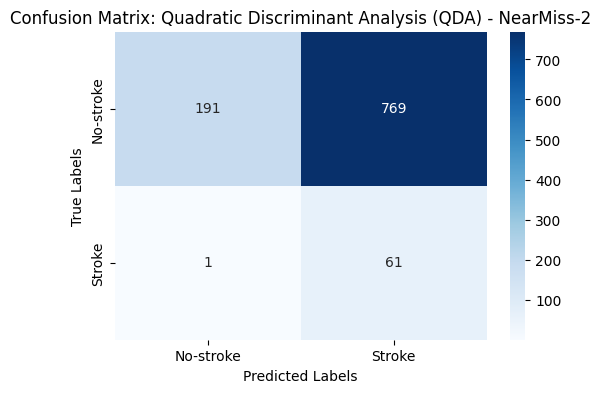

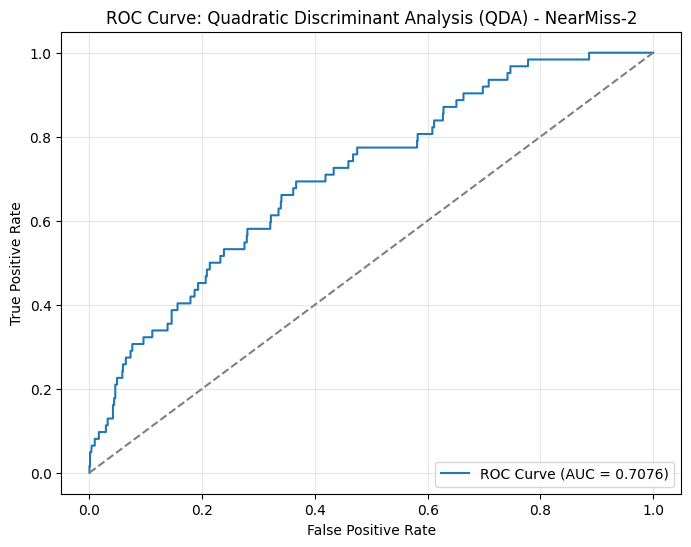


==================== Quadratic Discriminant Analysis (QDA) with NearMiss-3 ====================

Quadratic Discriminant Analysis (QDA) with NearMiss-3 Evaluation Metrics:
Accuracy: 0.7505
Precision: 0.1491
Recall: 0.6613
F1 Score: 0.2433
ROC-AUC Score: 0.7934

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.76      0.85       960
           1       0.15      0.66      0.24        62

    accuracy                           0.75      1022
   macro avg       0.56      0.71      0.55      1022
weighted avg       0.92      0.75      0.81      1022


Confusion Matrix:
[[726 234]
 [ 21  41]]


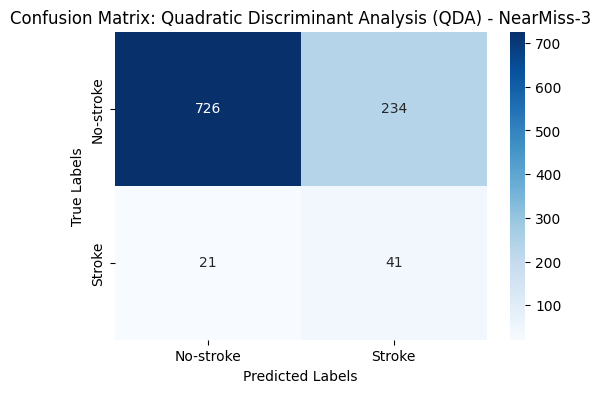

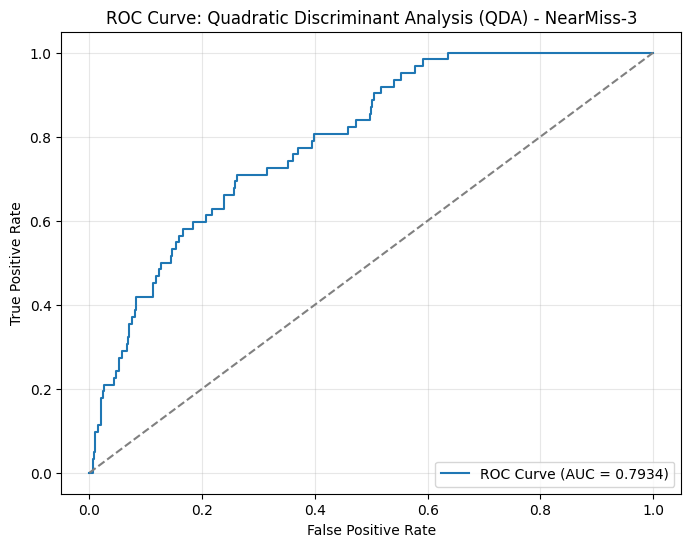


==================== Quadratic Discriminant Analysis (QDA) with Tomek Links ====================

Quadratic Discriminant Analysis (QDA) with Tomek Links Evaluation Metrics:
Accuracy: 0.8787
Precision: 0.2417
Recall: 0.4677
F1 Score: 0.3187
ROC-AUC Score: 0.8372

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.91      0.93       960
           1       0.24      0.47      0.32        62

    accuracy                           0.88      1022
   macro avg       0.60      0.69      0.63      1022
weighted avg       0.92      0.88      0.90      1022


Confusion Matrix:
[[869  91]
 [ 33  29]]


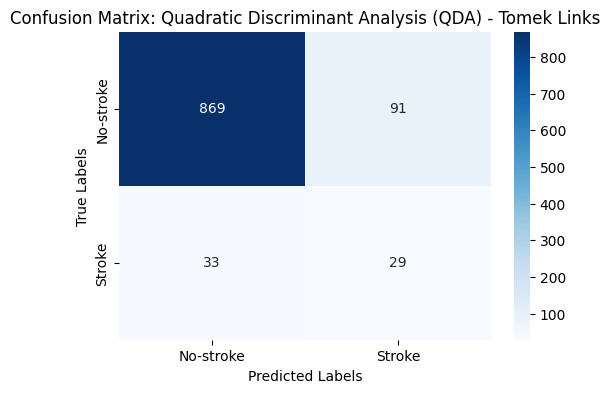

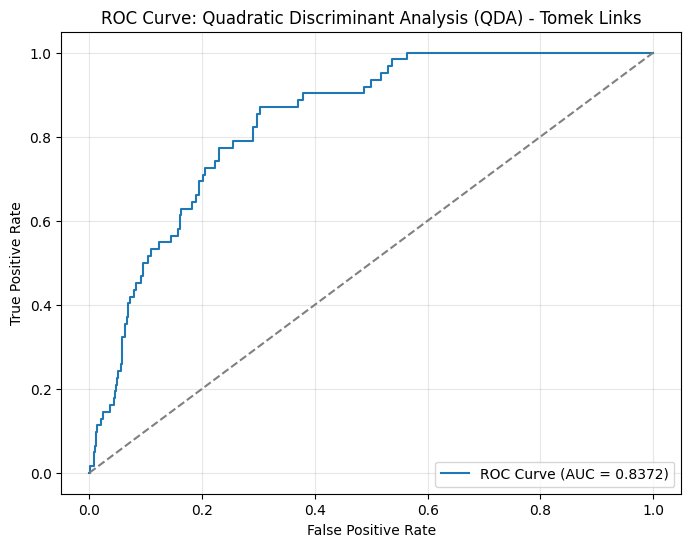


==================== Quadratic Discriminant Analysis (QDA) with Edited Nearest Neighbors (ENN) ====================

Quadratic Discriminant Analysis (QDA) with Edited Nearest Neighbors (ENN) Evaluation Metrics:
Accuracy: 0.8562
Precision: 0.2185
Recall: 0.5323
F1 Score: 0.3099
ROC-AUC Score: 0.8346

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.88      0.92       960
           1       0.22      0.53      0.31        62

    accuracy                           0.86      1022
   macro avg       0.59      0.70      0.61      1022
weighted avg       0.92      0.86      0.88      1022


Confusion Matrix:
[[842 118]
 [ 29  33]]


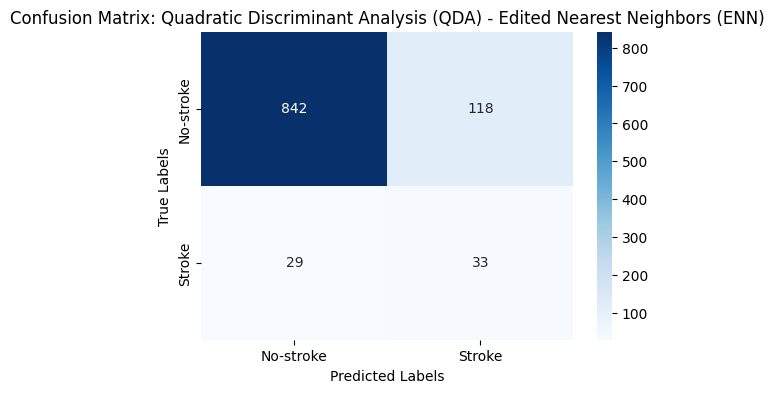

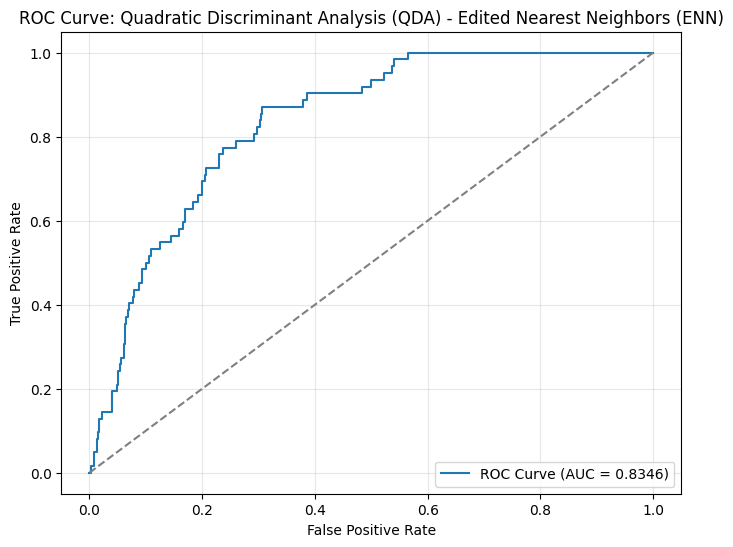


==================== Quadratic Discriminant Analysis (QDA) with Repeated Edited Nearest Neighbors (RENN) ====================

Quadratic Discriminant Analysis (QDA) with Repeated Edited Nearest Neighbors (RENN) Evaluation Metrics:
Accuracy: 0.8474
Precision: 0.2134
Recall: 0.5645
F1 Score: 0.3097
ROC-AUC Score: 0.8342

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.87      0.91       960
           1       0.21      0.56      0.31        62

    accuracy                           0.85      1022
   macro avg       0.59      0.72      0.61      1022
weighted avg       0.92      0.85      0.88      1022


Confusion Matrix:
[[831 129]
 [ 27  35]]


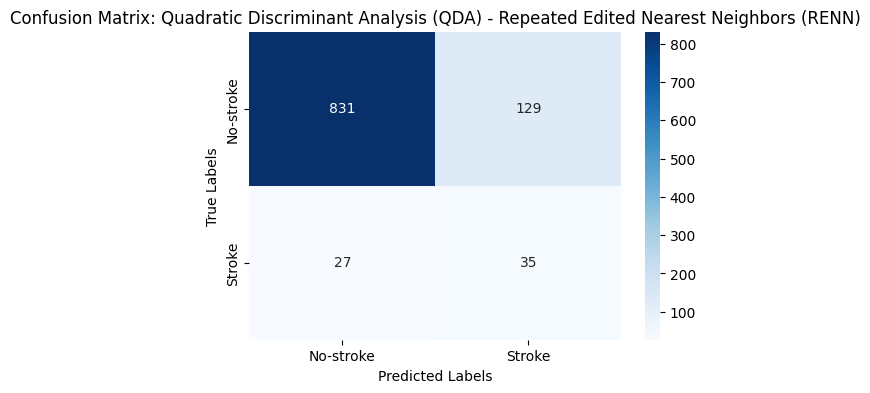

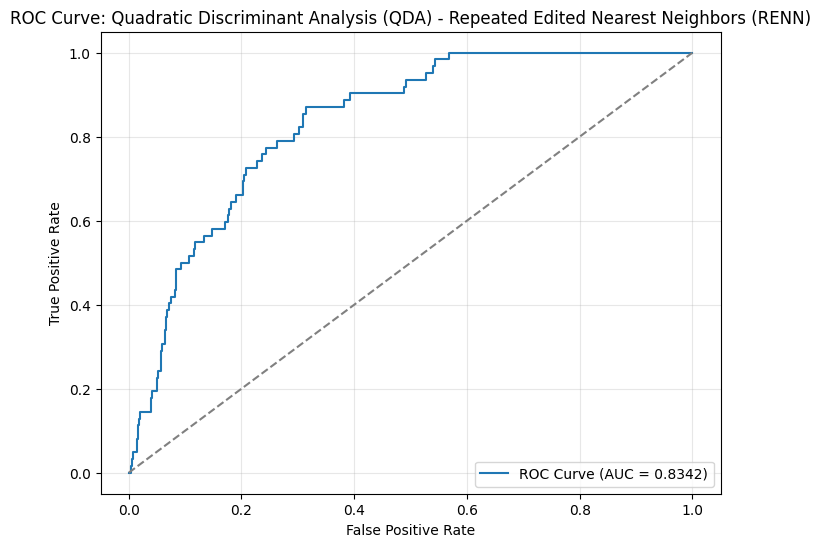


==================== Quadratic Discriminant Analysis (QDA) with All KNN ====================

Quadratic Discriminant Analysis (QDA) with All KNN Evaluation Metrics:
Accuracy: 0.8542
Precision: 0.2194
Recall: 0.5484
F1 Score: 0.3134
ROC-AUC Score: 0.8341

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.87      0.92       960
           1       0.22      0.55      0.31        62

    accuracy                           0.85      1022
   macro avg       0.59      0.71      0.62      1022
weighted avg       0.92      0.85      0.88      1022


Confusion Matrix:
[[839 121]
 [ 28  34]]


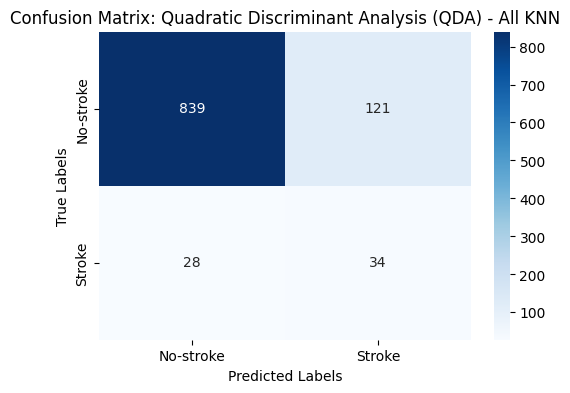

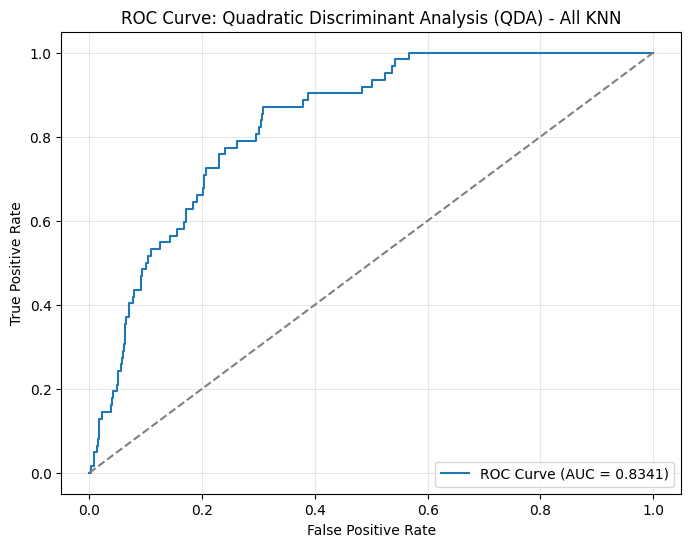


==================== Quadratic Discriminant Analysis (QDA) with Condensed Nearest Neighbor (CNN) ====================

Quadratic Discriminant Analysis (QDA) with Condensed Nearest Neighbor (CNN) Evaluation Metrics:
Accuracy: 0.9129
Precision: 0.2545
Recall: 0.2258
F1 Score: 0.2393
ROC-AUC Score: 0.8323

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.96      0.95       960
           1       0.25      0.23      0.24        62

    accuracy                           0.91      1022
   macro avg       0.60      0.59      0.60      1022
weighted avg       0.91      0.91      0.91      1022


Confusion Matrix:
[[919  41]
 [ 48  14]]


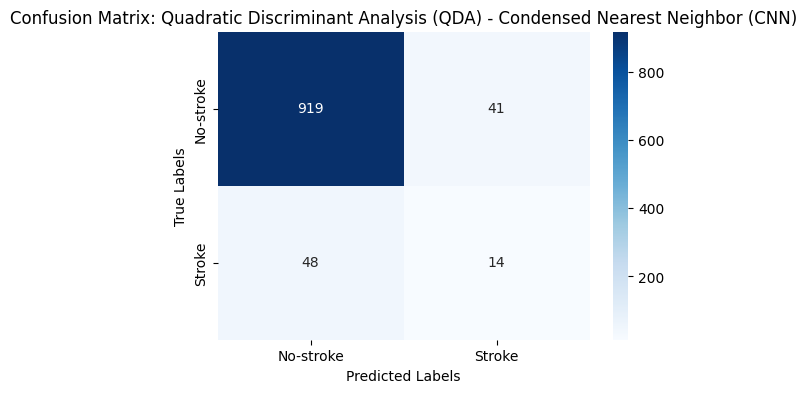

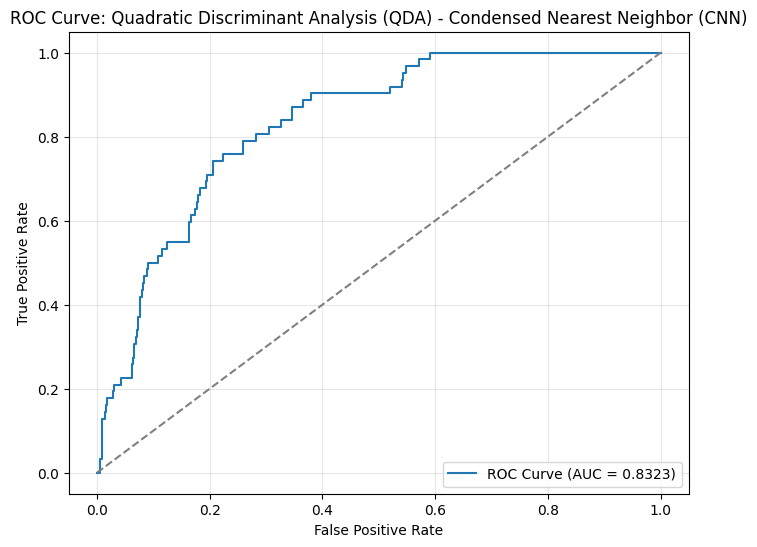


==================== Quadratic Discriminant Analysis (QDA) with One-Sided Selection (OSS) ====================

Quadratic Discriminant Analysis (QDA) with One-Sided Selection (OSS) Evaluation Metrics:
Accuracy: 0.8787
Precision: 0.2500
Recall: 0.5000
F1 Score: 0.3333
ROC-AUC Score: 0.8369

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.90      0.93       960
           1       0.25      0.50      0.33        62

    accuracy                           0.88      1022
   macro avg       0.61      0.70      0.63      1022
weighted avg       0.92      0.88      0.90      1022


Confusion Matrix:
[[867  93]
 [ 31  31]]


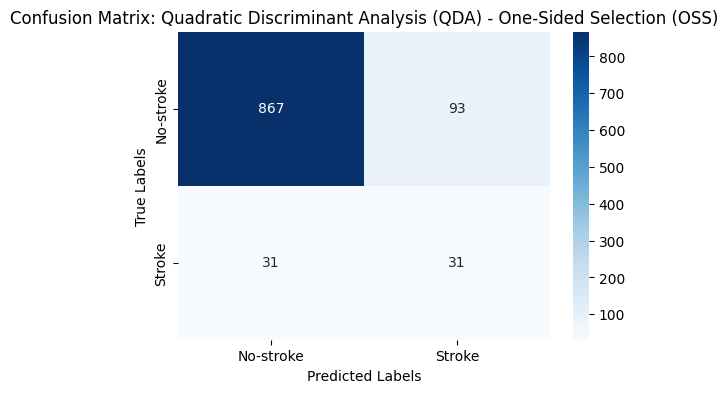

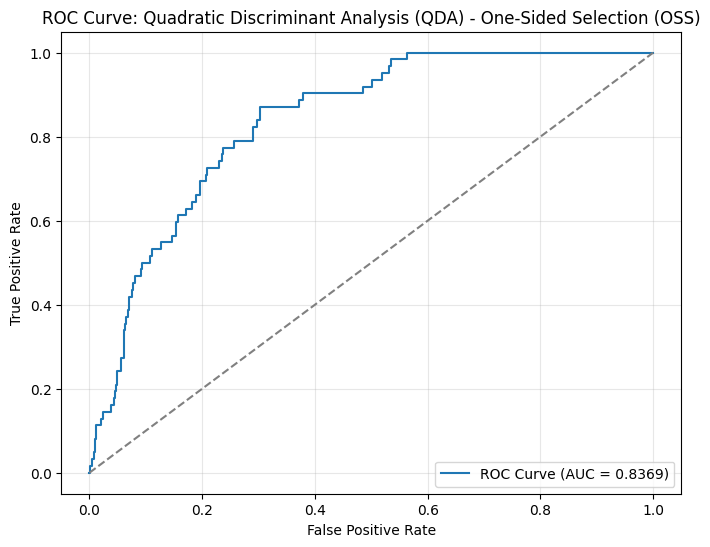


==================== Quadratic Discriminant Analysis (QDA) with Neighborhood Cleaning Rule (NCR) ====================

Quadratic Discriminant Analysis (QDA) with Neighborhood Cleaning Rule (NCR) Evaluation Metrics:
Accuracy: 0.8630
Precision: 0.2292
Recall: 0.5323
F1 Score: 0.3204
ROC-AUC Score: 0.8358

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.88      0.92       960
           1       0.23      0.53      0.32        62

    accuracy                           0.86      1022
   macro avg       0.60      0.71      0.62      1022
weighted avg       0.92      0.86      0.89      1022


Confusion Matrix:
[[849 111]
 [ 29  33]]


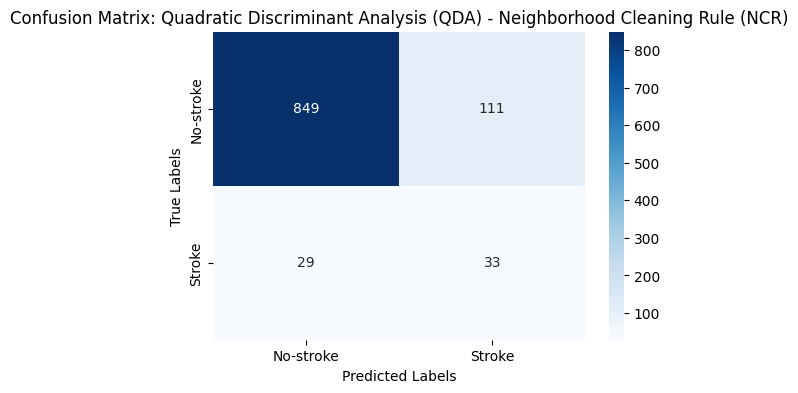

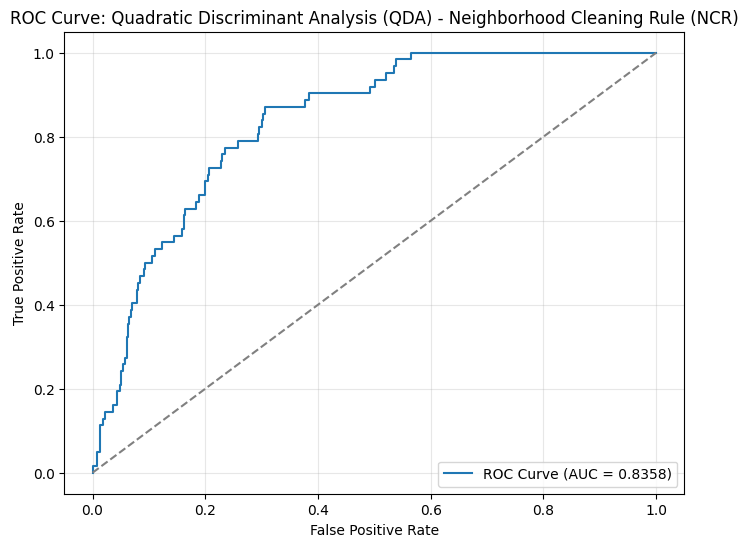


==================== Quadratic Discriminant Analysis (QDA) with Instance Hardness Threshold ====================

Quadratic Discriminant Analysis (QDA) with Instance Hardness Threshold Evaluation Metrics:
Accuracy: 0.7877
Precision: 0.1730
Recall: 0.6613
F1 Score: 0.2742
ROC-AUC Score: 0.8166

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.80      0.88       960
           1       0.17      0.66      0.27        62

    accuracy                           0.79      1022
   macro avg       0.57      0.73      0.57      1022
weighted avg       0.92      0.79      0.84      1022


Confusion Matrix:
[[764 196]
 [ 21  41]]


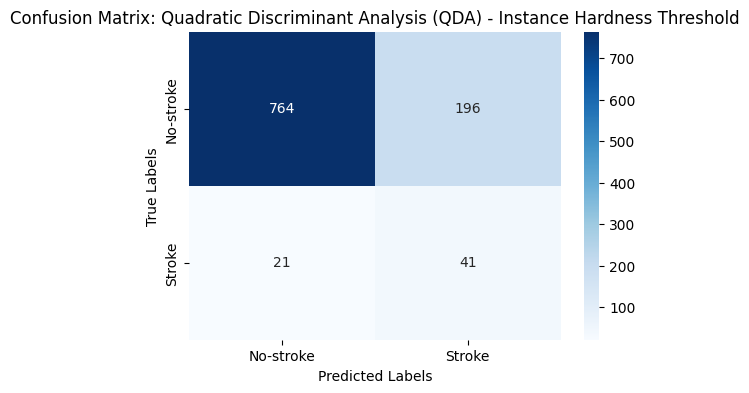

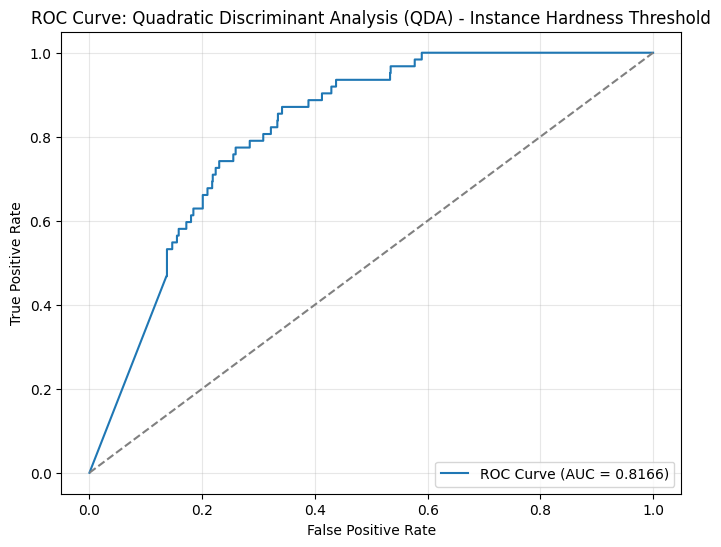


==================== AdaBoost with None ====================

AdaBoost with None Evaluation Metrics:
Accuracy: 0.9393
Precision: 0.0000
Recall: 0.0000
F1 Score: 0.0000
ROC-AUC Score: 0.8387

Classification Report:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.00      0.00      0.00        62

    accuracy                           0.94      1022
   macro avg       0.47      0.50      0.48      1022
weighted avg       0.88      0.94      0.91      1022


Confusion Matrix:
[[960   0]
 [ 62   0]]


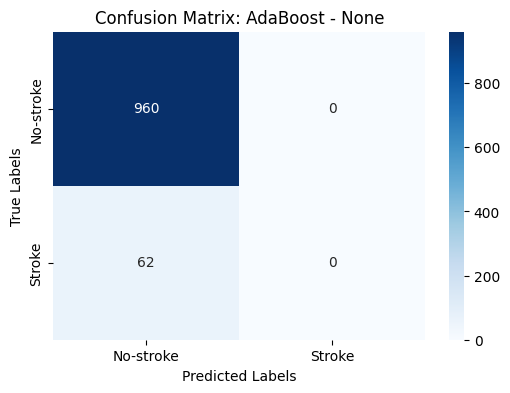

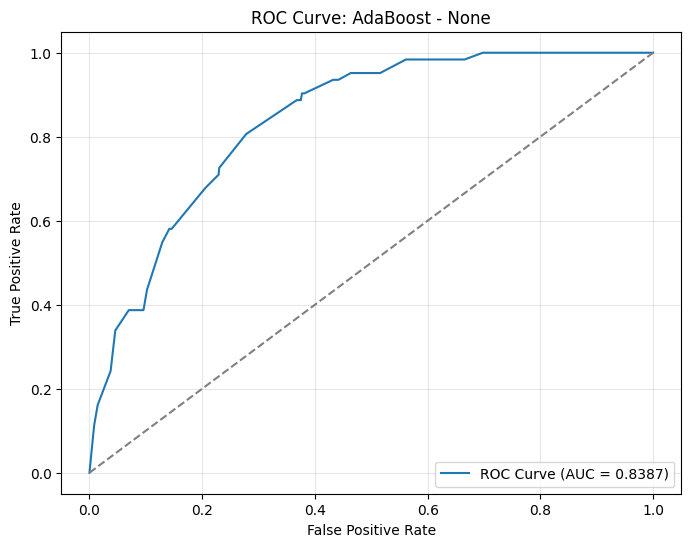


==================== AdaBoost with SMOTE ====================

AdaBoost with SMOTE Evaluation Metrics:
Accuracy: 0.7231
Precision: 0.1536
Recall: 0.7903
F1 Score: 0.2572
ROC-AUC Score: 0.8420

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.72      0.83       960
           1       0.15      0.79      0.26        62

    accuracy                           0.72      1022
   macro avg       0.57      0.75      0.54      1022
weighted avg       0.93      0.72      0.80      1022


Confusion Matrix:
[[690 270]
 [ 13  49]]


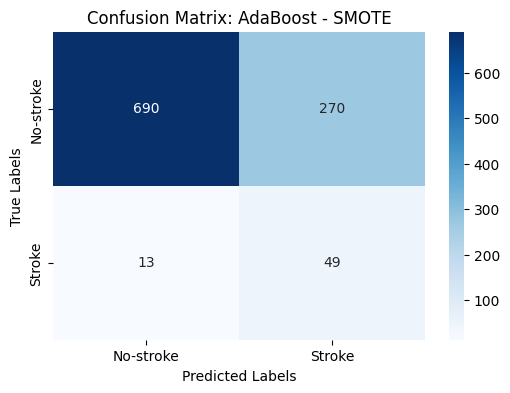

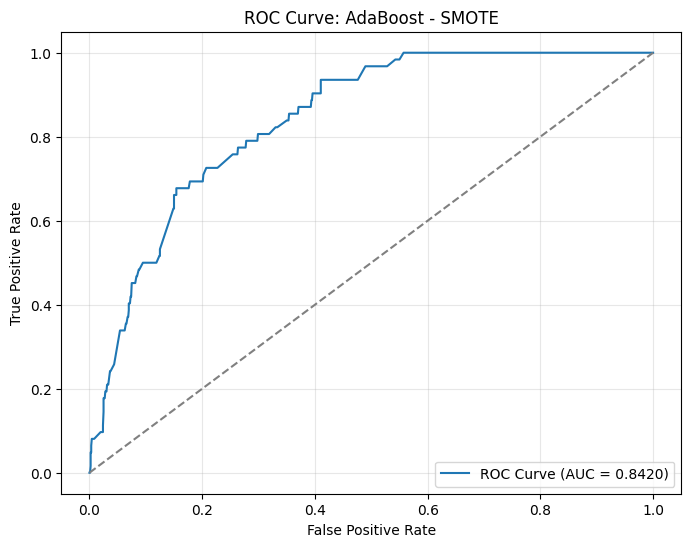


==================== AdaBoost with ClusterCentroids ====================

AdaBoost with ClusterCentroids Evaluation Metrics:
Accuracy: 0.4110
Precision: 0.0872
Recall: 0.9194
F1 Score: 0.1592
ROC-AUC Score: 0.7312

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.38      0.55       960
           1       0.09      0.92      0.16        62

    accuracy                           0.41      1022
   macro avg       0.54      0.65      0.35      1022
weighted avg       0.93      0.41      0.52      1022


Confusion Matrix:
[[363 597]
 [  5  57]]


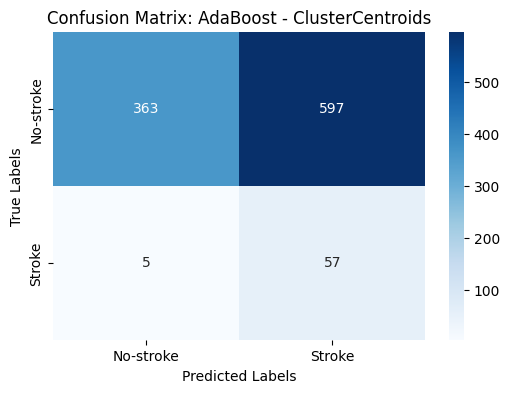

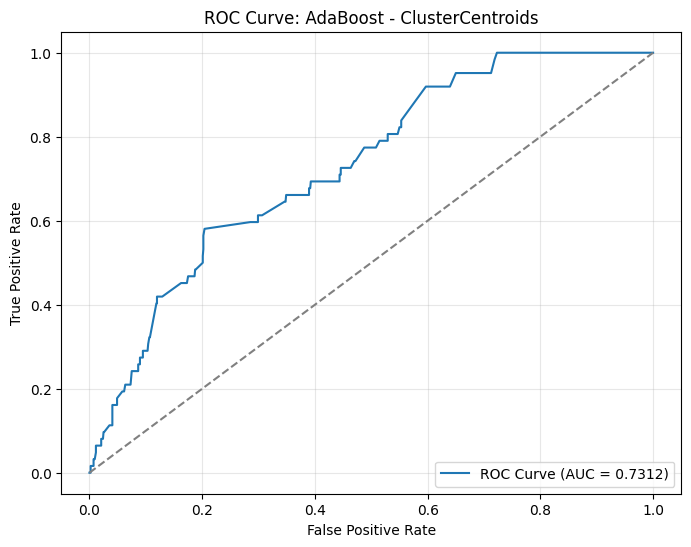


==================== AdaBoost with Random Undersampling ====================

AdaBoost with Random Undersampling Evaluation Metrics:
Accuracy: 0.6468
Precision: 0.1327
Recall: 0.8710
F1 Score: 0.2303
ROC-AUC Score: 0.8424

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.63      0.77       960
           1       0.13      0.87      0.23        62

    accuracy                           0.65      1022
   macro avg       0.56      0.75      0.50      1022
weighted avg       0.94      0.65      0.74      1022


Confusion Matrix:
[[607 353]
 [  8  54]]


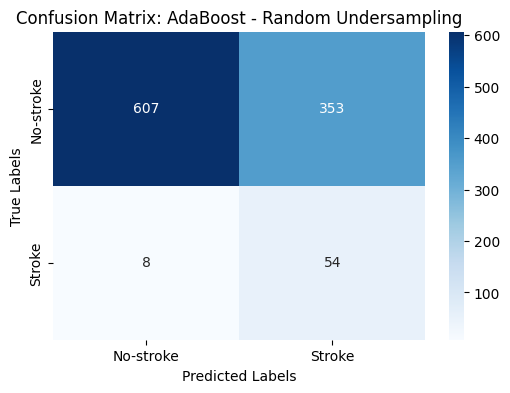

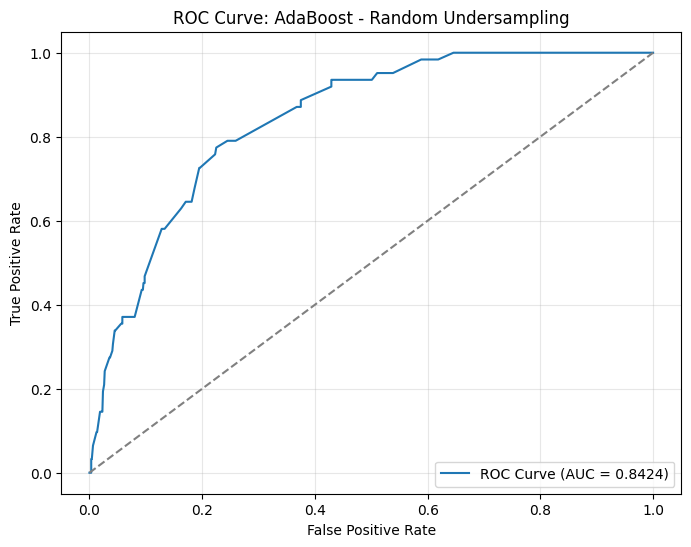


==================== AdaBoost with NearMiss-1 ====================

AdaBoost with NearMiss-1 Evaluation Metrics:
Accuracy: 0.2172
Precision: 0.0410
Recall: 0.5323
F1 Score: 0.0762
ROC-AUC Score: 0.3500

Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.20      0.32       960
           1       0.04      0.53      0.08        62

    accuracy                           0.22      1022
   macro avg       0.45      0.36      0.20      1022
weighted avg       0.82      0.22      0.31      1022


Confusion Matrix:
[[189 771]
 [ 29  33]]


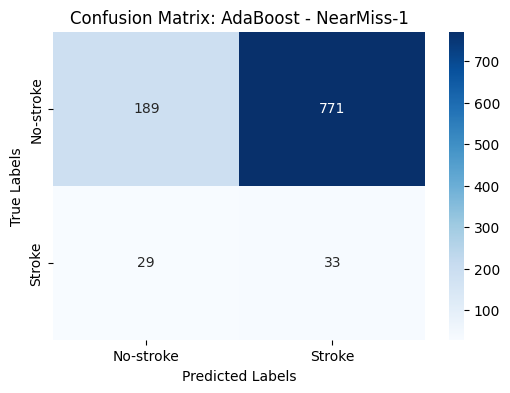

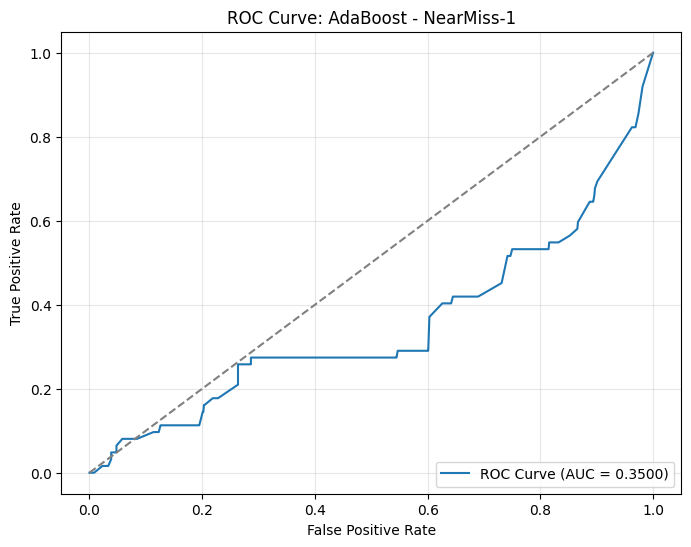


==================== AdaBoost with NearMiss-2 ====================

AdaBoost with NearMiss-2 Evaluation Metrics:
Accuracy: 0.1135
Precision: 0.0631
Recall: 0.9839
F1 Score: 0.1187
ROC-AUC Score: 0.7818

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.06      0.11       960
           1       0.06      0.98      0.12        62

    accuracy                           0.11      1022
   macro avg       0.52      0.52      0.11      1022
weighted avg       0.93      0.11      0.11      1022


Confusion Matrix:
[[ 55 905]
 [  1  61]]


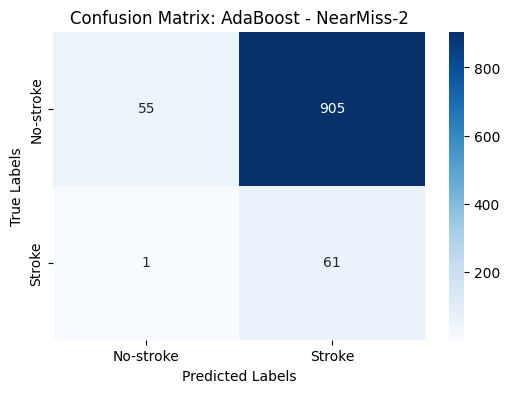

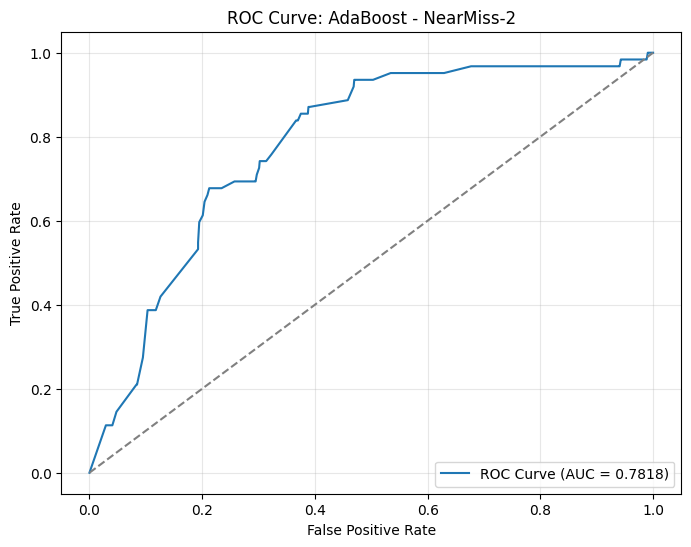


==================== AdaBoost with NearMiss-3 ====================

AdaBoost with NearMiss-3 Evaluation Metrics:
Accuracy: 0.6928
Precision: 0.1272
Recall: 0.6935
F1 Score: 0.2150
ROC-AUC Score: 0.7271

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.69      0.81       960
           1       0.13      0.69      0.21        62

    accuracy                           0.69      1022
   macro avg       0.55      0.69      0.51      1022
weighted avg       0.92      0.69      0.77      1022


Confusion Matrix:
[[665 295]
 [ 19  43]]


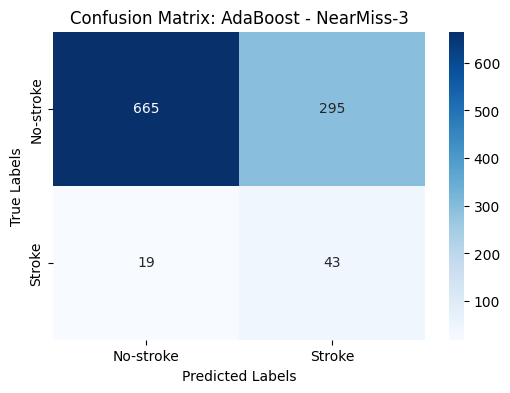

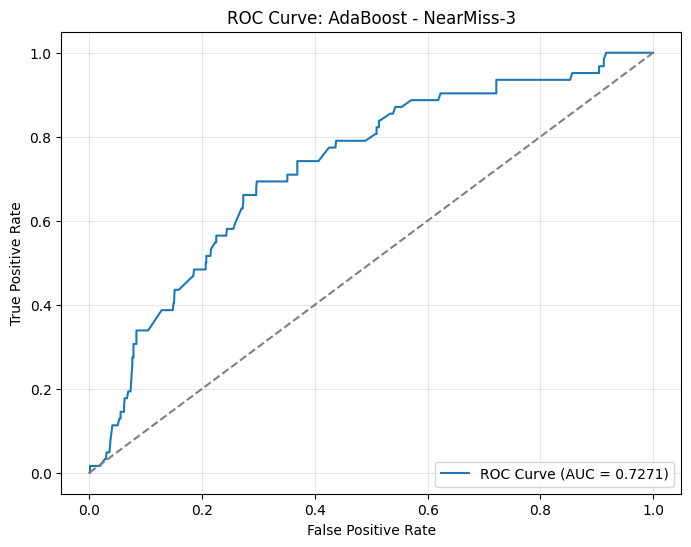


==================== AdaBoost with Tomek Links ====================

AdaBoost with Tomek Links Evaluation Metrics:
Accuracy: 0.9393
Precision: 0.0000
Recall: 0.0000
F1 Score: 0.0000
ROC-AUC Score: 0.8534

Classification Report:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.00      0.00      0.00        62

    accuracy                           0.94      1022
   macro avg       0.47      0.50      0.48      1022
weighted avg       0.88      0.94      0.91      1022


Confusion Matrix:
[[960   0]
 [ 62   0]]


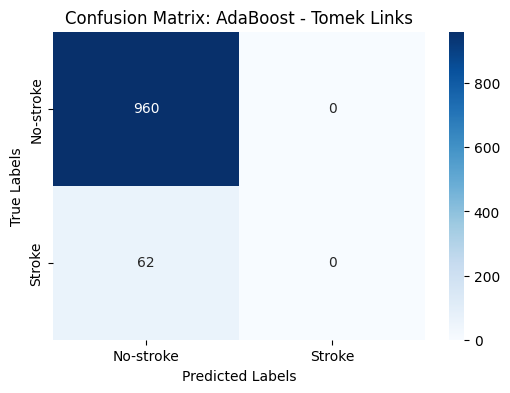

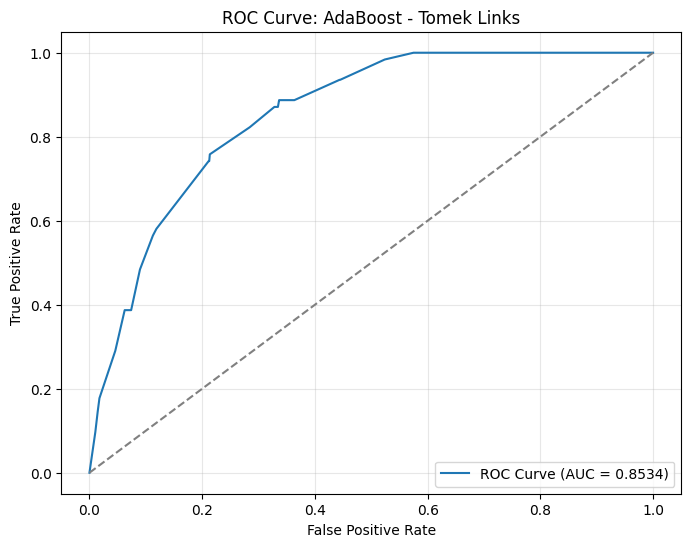


==================== AdaBoost with Edited Nearest Neighbors (ENN) ====================

AdaBoost with Edited Nearest Neighbors (ENN) Evaluation Metrics:
Accuracy: 0.9354
Precision: 0.3000
Recall: 0.0484
F1 Score: 0.0833
ROC-AUC Score: 0.8574

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.99      0.97       960
           1       0.30      0.05      0.08        62

    accuracy                           0.94      1022
   macro avg       0.62      0.52      0.52      1022
weighted avg       0.90      0.94      0.91      1022


Confusion Matrix:
[[953   7]
 [ 59   3]]


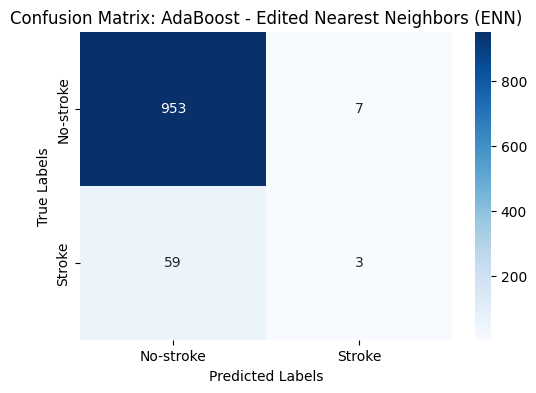

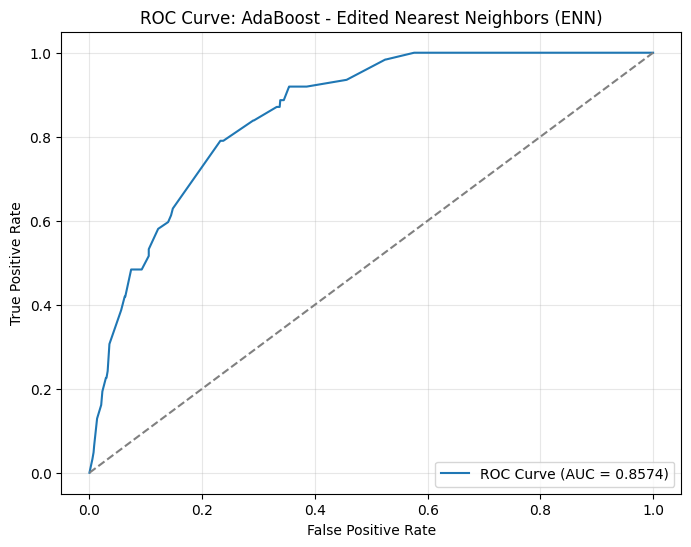


==================== AdaBoost with Repeated Edited Nearest Neighbors (RENN) ====================

AdaBoost with Repeated Edited Nearest Neighbors (RENN) Evaluation Metrics:
Accuracy: 0.9295
Precision: 0.3438
Recall: 0.1774
F1 Score: 0.2340
ROC-AUC Score: 0.8573

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.98      0.96       960
           1       0.34      0.18      0.23        62

    accuracy                           0.93      1022
   macro avg       0.65      0.58      0.60      1022
weighted avg       0.91      0.93      0.92      1022


Confusion Matrix:
[[939  21]
 [ 51  11]]


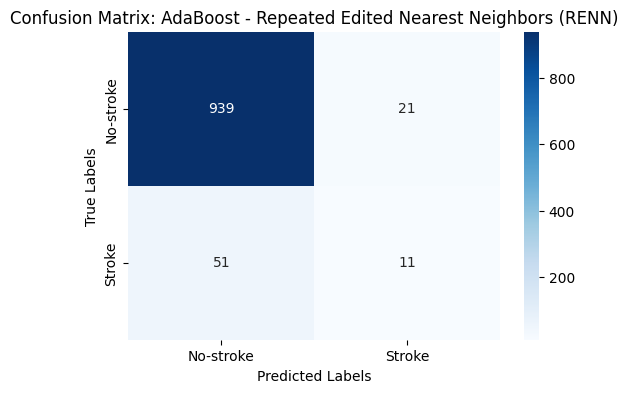

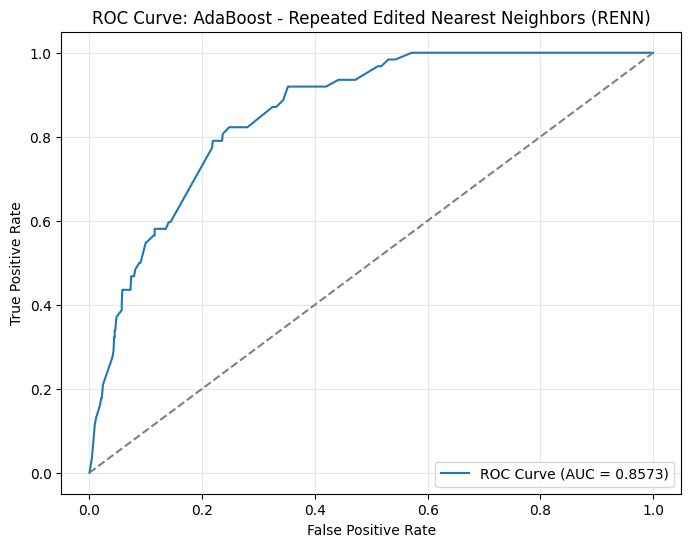


==================== AdaBoost with All KNN ====================

AdaBoost with All KNN Evaluation Metrics:
Accuracy: 0.9305
Precision: 0.2857
Recall: 0.0968
F1 Score: 0.1446
ROC-AUC Score: 0.8552

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.98      0.96       960
           1       0.29      0.10      0.14        62

    accuracy                           0.93      1022
   macro avg       0.61      0.54      0.55      1022
weighted avg       0.90      0.93      0.91      1022


Confusion Matrix:
[[945  15]
 [ 56   6]]


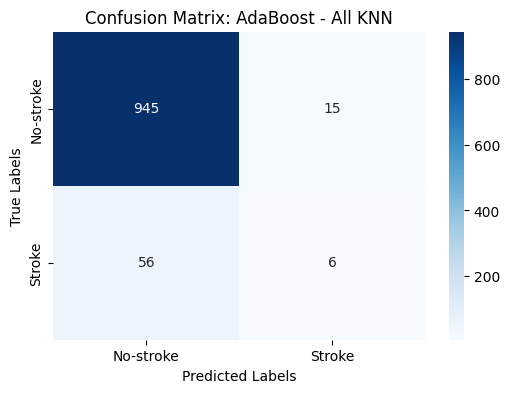

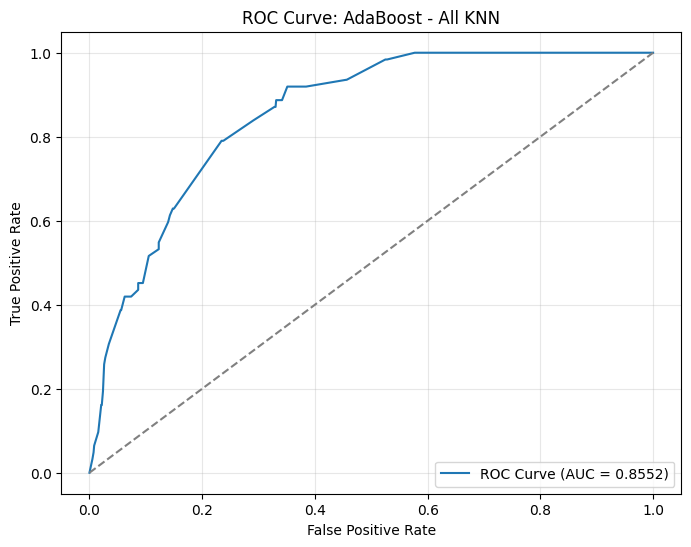


==================== AdaBoost with Condensed Nearest Neighbor (CNN) ====================

AdaBoost with Condensed Nearest Neighbor (CNN) Evaluation Metrics:
Accuracy: 0.9403
Precision: 1.0000
Recall: 0.0161
F1 Score: 0.0317
ROC-AUC Score: 0.8026

Classification Report:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       1.00      0.02      0.03        62

    accuracy                           0.94      1022
   macro avg       0.97      0.51      0.50      1022
weighted avg       0.94      0.94      0.91      1022


Confusion Matrix:
[[960   0]
 [ 61   1]]


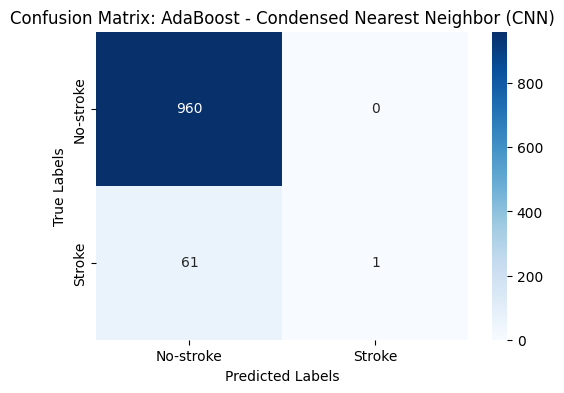

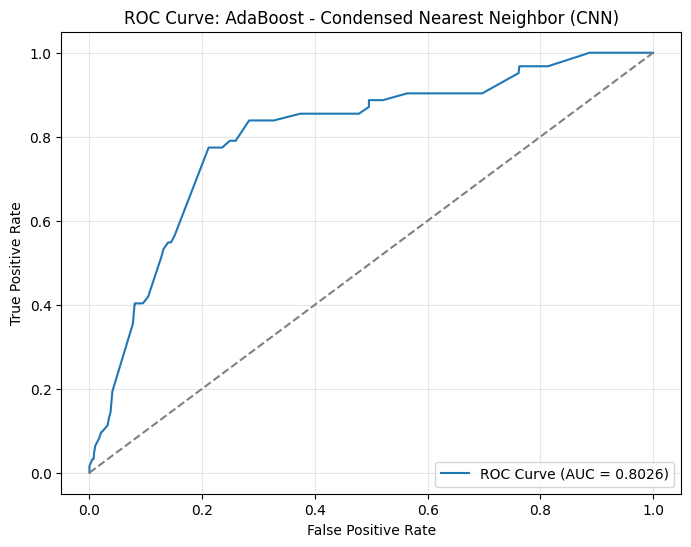


==================== AdaBoost with One-Sided Selection (OSS) ====================

AdaBoost with One-Sided Selection (OSS) Evaluation Metrics:
Accuracy: 0.9393
Precision: 0.0000
Recall: 0.0000
F1 Score: 0.0000
ROC-AUC Score: 0.8563

Classification Report:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.00      0.00      0.00        62

    accuracy                           0.94      1022
   macro avg       0.47      0.50      0.48      1022
weighted avg       0.88      0.94      0.91      1022


Confusion Matrix:
[[960   0]
 [ 62   0]]


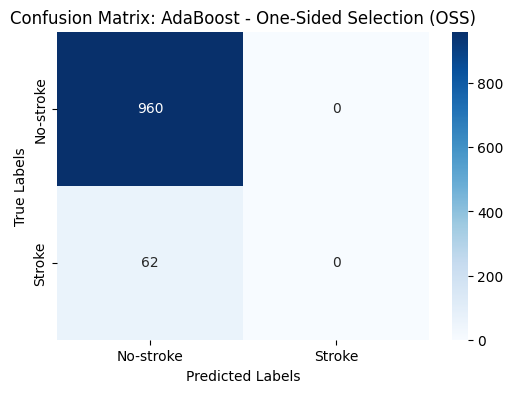

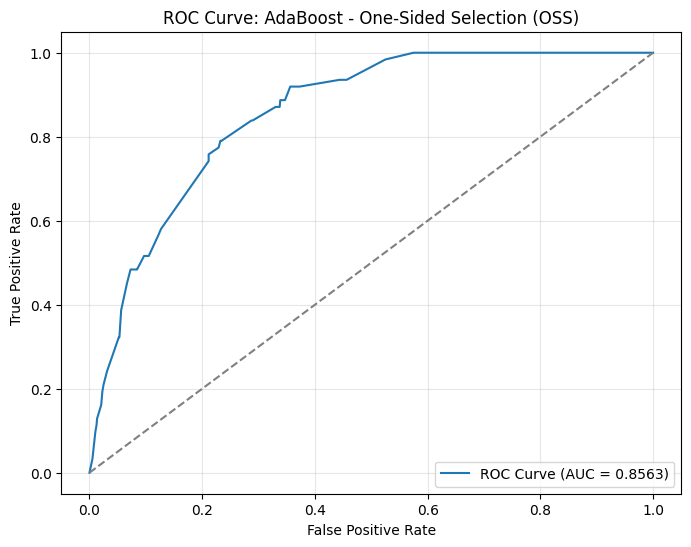


==================== AdaBoost with Neighborhood Cleaning Rule (NCR) ====================

AdaBoost with Neighborhood Cleaning Rule (NCR) Evaluation Metrics:
Accuracy: 0.9364
Precision: 0.2857
Recall: 0.0323
F1 Score: 0.0580
ROC-AUC Score: 0.8561

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.99      0.97       960
           1       0.29      0.03      0.06        62

    accuracy                           0.94      1022
   macro avg       0.61      0.51      0.51      1022
weighted avg       0.90      0.94      0.91      1022


Confusion Matrix:
[[955   5]
 [ 60   2]]


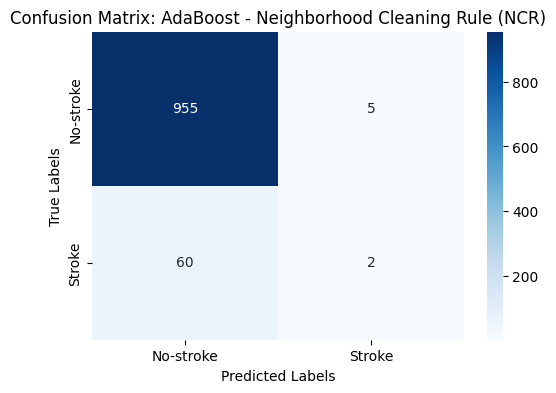

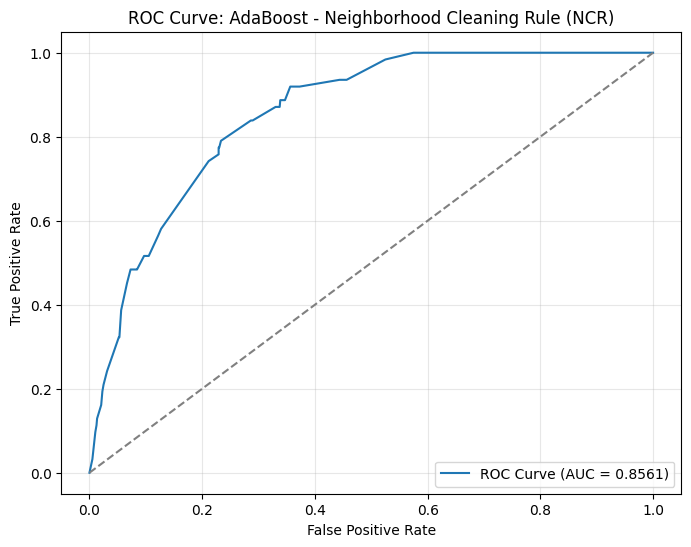


==================== AdaBoost with Instance Hardness Threshold ====================

AdaBoost with Instance Hardness Threshold Evaluation Metrics:
Accuracy: 0.8092
Precision: 0.1848
Recall: 0.6290
F1 Score: 0.2857
ROC-AUC Score: 0.8467

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.82      0.89       960
           1       0.18      0.63      0.29        62

    accuracy                           0.81      1022
   macro avg       0.58      0.72      0.59      1022
weighted avg       0.92      0.81      0.85      1022


Confusion Matrix:
[[788 172]
 [ 23  39]]


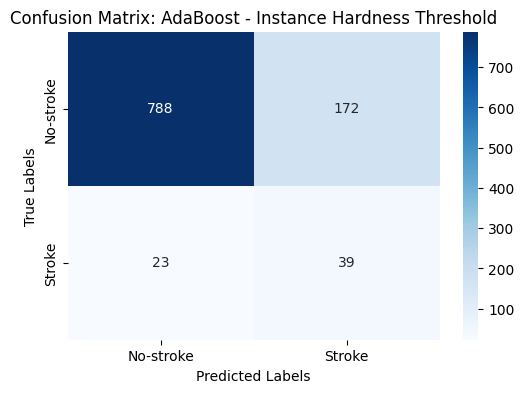

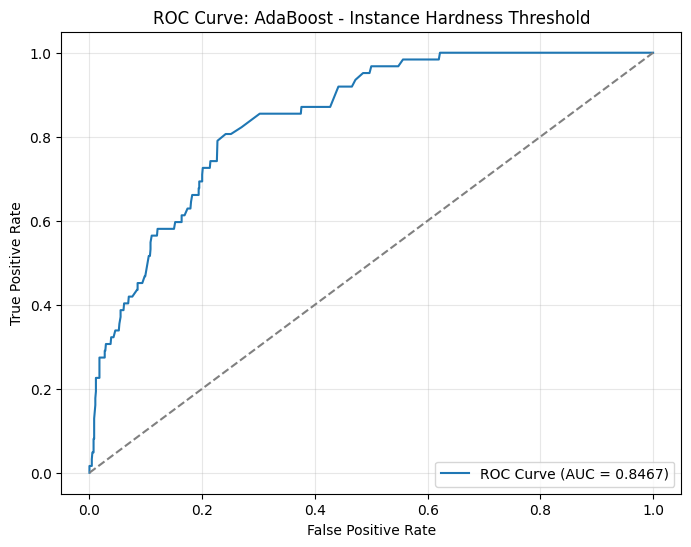

In [ ]:
# Loop through models and resampling techniques
for model_name, model in models.items():
    for method_name, method in methods.items():
        print(f"\n{'='*20} {model_name} with {method_name} {'='*20}")

        # Apply resampling if necessary
        if method_name == 'None':
            X_resampled, y_resampled = X_train, y_train  # No resampling
        else:
            X_resampled, y_resampled = method.fit_resample(X_train, y_train)

        # Standardize resampled features
        scaler = StandardScaler()
        X_resampled_scaled = scaler.fit_transform(X_resampled)
        X_test_scaled = scaler.transform(X_test)

        # Train model
        model.fit(X_resampled_scaled, y_resampled)

        # Make predictions
        y_pred = model.predict(X_test_scaled)
        y_pred_proba = model.predict_proba(X_test_scaled)[:, 1]

        # Store predictions for each model and resampling method
        predictions_dict[f'Y_pred_{model_name}_{method_name}'] = y_pred.tolist()

        # Evaluate model
        evaluate_model(y_test, y_pred, y_pred_proba, model_name, method_name)

In [ ]:
# Convert evaluation results to DataFrame
# Set display all rows and columns
pd.set_option('display.max_rows', None)  # Show all rows
pd.set_option('display.max_columns', None)  # Show all columns
pd.set_option('display.width', None)  # Adjust width to fit screen
pd.set_option('display.max_colwidth', None)  # Show full content in each cell
df_results = pd.DataFrame(evaluation_results)
df_results

,Model,Method,Accuracy,Precision,Recall,F1 Score,ROC-AUC
0,Random Forest,None,0.940313,1.000000,0.016129,0.031746,0.795405
1,Random Forest,SMOTE,0.895303,0.241379,0.338710,0.281879,0.804637
2,Random Forest,ClusterCentroids,0.421722,0.088647,0.919355,0.161702,0.746228
3,Random Forest,Random Undersampling,0.731898,0.158065,0.790323,0.263441,0.830788
4,Random Forest,NearMiss-1,0.185910,0.047059,0.645161,0.087719,0.319304
5,Random Forest,NearMiss-2,0.143836,0.065241,0.983871,0.122367,0.726563
6,Random Forest,NearMiss-3,0.685910,0.111111,0.596774,0.187342,0.695321
7,Random Forest,Tomek Links,0.943249,1.000000,0.064516,0.121212,0.806720
8,Random Forest,Edited Nearest Neighbors (ENN),0.938356,0.466667,0.112903,0.181818,0.829259
9,Random Forest,Repeated Edited Nearest Neighbors (RENN),0.915851,0.227273,0.161290,0.188679,0.825092


In [ ]:
# Sort the DataFrame in descending order by the ROC-AUC column
df_results_sorted = df_results.sort_values(by='ROC-AUC', ascending=False)

# Display sorted results
df_results_sorted

,Model,Method,Accuracy,Precision,Recall,F1 Score,ROC-AUC
188,AdaBoost,Edited Nearest Neighbors (ENN),0.935421,0.300000,0.048387,0.083333,0.857359
189,AdaBoost,Repeated Edited Nearest Neighbors (RENN),0.929550,0.343750,0.177419,0.234043,0.857325
192,AdaBoost,One-Sided Selection (OSS),0.939335,0.000000,0.000000,0.000000,0.856334
193,AdaBoost,Neighborhood Cleaning Rule (NCR),0.936399,0.285714,0.032258,0.057971,0.856082
190,AdaBoost,All KNN,0.930528,0.285714,0.096774,0.144578,0.855183
187,AdaBoost,Tomek Links,0.939335,0.000000,0.000000,0.000000,0.853427
68,Logistic Regression,Edited Nearest Neighbors (ENN),0.735812,0.157895,0.774194,0.262295,0.851680
60,Logistic Regression,None,0.751468,0.164336,0.758065,0.270115,0.851579
67,Logistic Regression,Tomek Links,0.749511,0.163194,0.758065,0.268571,0.851546
69,Logistic Regression,Repeated Edited Nearest Neighbors (RENN),0.717221,0.150769,0.790323,0.253230,0.851462


In [ ]:
# Convert predictions to DataFrame
df_predictions = pd.DataFrame(predictions_dict)

In [ ]:
# Save results to an Excel file
with pd.ExcelWriter('model_results.xlsx', engine='openpyxl') as writer:
    df_results.to_excel(writer, sheet_name='Evaluation_Metrics', index=False)
    df_predictions.to_excel(writer, sheet_name='Predictions', index=False)

print("Results successfully saved to 'model_results.xlsx'")

Results successfully saved to 'model_results.xlsx'


### Perform Pair T-test